In [4]:
import os
import xarray as xr
from dask.distributed import Client
import matplotlib.pyplot as plt
from os import listdir
#import rioxarray as rxr
import glob
#import seaborn as sns
#from shapely.geometry import MultiPoint
#import geopandas as gpd
#import cartopy.crs as ccrs
import sys

In [2]:
sys.path.append('class')



In [3]:
from CPF import *
from grizzly import *
from coagmet import *
from disdrometer import *
from mrms_gage import *
from usgs_other import *
from elevation import *
from usgs_new import *
from ET import *

In [4]:
client = Client()

In [5]:
# Create a path to the code file
codeDir = os.path.dirname(os.path.abspath(os.getcwd()))
parentDir = os.path.dirname(codeDir)

Step 1: bring in cleaned gage data

In [6]:
gage_folder = os.path.join(parentDir,"precip_gage")
#gage_folder = 'C:\\Users\\GSCOB\\OneDrive - Colostate\\Desktop\\precip_gage'

# grizzly
grizzly = get_grizzly(gage_folder)
# cpf
cpf = get_cpf(gage_folder+'\\cpf google drive')
# disdrometer
disdrom = get_disdrom(gage_folder)
# coagmet
coag = get_coagmet(gage_folder)
# other gages
other = get_usgs_other(gage_folder)

new_usgs = get_usgsnew(gage_folder)

# bring everything together
gage = {**grizzly, **cpf, **disdrom, **coag, **other, **new_usgs}
#gage = {**grizzly, **cpf, **disdrom, **coag, **other}

# get list of keys (lat/lon)
coord = [i for i in gage.keys()]

Z:\working code\MRMS-eval-with-gages-in-CO\class\grizzly.py:24: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  gage = [gage[i].drop(gage[i].columns.difference(['TimeStamp (Local)','15-minute Intensity (mm/h)','Bin Accum (mm)']), 1) for i in range(len(gage_id))]
Z:\working code\MRMS-eval-with-gages-in-CO\class\usgs_other.py:10: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  gage = [gage[i].drop(gage[i].columns.difference(['time','precip_mm_diff','intensity_15m']), 1) for i in range(len(gage))]
2023-11-15 15:57:55,428 - distributed.utils_perf - WARNING - full garbage collections took 13% CPU time recently (threshold: 10%)
2023-11-15 15:57:56,599 - distributed.utils_perf - WARNING - full garbage collections took 13% CPU time recently (threshold: 10%)
2023-11-15 15:57:57,737 - distributed.utils_perf - WARNING - full ga

In [7]:
# create list of timedeltas to correct gage time error
g = [np.timedelta64(0, 'h') for i in range(len(grizzly))]
c = [np.timedelta64(1, 'h') for i in range(len(cpf))]
d = [np.timedelta64(0, 'h') for i in range(len(disdrom))]
co = [np.timedelta64(1, 'h') for i in range(len(coag))]
o = [np.timedelta64(0, 'h') for i in range(len(other))]
u = [np.timedelta64(0, 'h') for i in range(len(new_usgs))]

s= g+c+d+co+o+u

Step 2 : bring in MRMS

In [6]:
# see mrms_atgage.py for how this dataset was built

# 2 min ACCUMULATION for months may thru sep, 2021/2022, in MST
#m = xr.open_dataset(parentDir+'\\'+'mrms_atgage_stormsonly.nc',chunks={'time': '50MB'})
m = xr.open_dataset(parentDir+'\\'+'mrms_atgage_stormsonly_radaronly.nc',chunks={'time': '50MB'})

In [9]:
#lat_m,lon_m = nearest(m,coord)

Step 3 : Compare MRMS to gage

In [10]:
# select mrms 1 gage at a time, find storms
target = []
predict = []

for i in range(len(coord)):
    print('gagecount='+str(i))
    # get corresponding mrms coordinate
    latt = coord[i][0]
    lont = coord[i][1]
    # select mrms at coordinate
    m_g = m.sel(longitude=lont,latitude=latt,method='nearest',drop=True)
    # convert to pandas dataframe, speeds things up
    m_g = m_g.dropna(dim='time').to_dataframe()
    
    # calculate 15-min intensity
    mrms_15_21 = m_g.iloc[m_g.index.year==2021].resample('1min').asfreq()
    mrms_15_21.unknown = mrms_15_21.unknown.fillna(0)
    mrms_15_21.unknown = (mrms_15_21.unknown.rolling(15,min_periods=1).sum())*(60/15) 
    mrms_15_22 = m_g.iloc[m_g.index.year==2022].resample('1min').asfreq()
    mrms_15_22.unknown = mrms_15_22.unknown.fillna(0)
    mrms_15_22.unknown = (mrms_15_22.unknown.rolling(15,min_periods=1).sum())*(60/15) 

    mrms_15 = pd.concat([mrms_15_21,mrms_15_22],axis=0)
    
    # get gage
    g = gage[coord[i]].fillna(0)
    # fix gage timer issues
    shift = s[i]
    g.index = g.index+shift
    # 15-min intensity caused weird rounding issues, fix by setting to zero
    g.loc[g['15_int']<0.0001] = 0
    
    # select times after first positive and before last negative, check that gage actually recording
    g = g[g.loc[g['15_int']>0].index[0]:g.loc[g['15_int']>0].index[-1]]

    # select gage data within mrms times, only look at gage data when I have mrms data
    g = g.loc[g.index.isin(mrms_15.index)]
    g['gage']=i
    
    # select mrms times within gage times, only look at mrms data when gage is recording
    mrms_15 = mrms_15.loc[mrms_15.index.isin(g.index)]
    
    mrms_15['accum']=m_g.loc[m_g.index.isin(mrms_15.index)].unknown
    mrms_15.accum = mrms_15.accum.fillna(0)
    
    # rechunk gage and mrms 
    target.append(g.resample('8h').agg(list))
    predict.append(mrms_15.resample('8h').agg(list))
    
target = pd.concat(target)
predict = pd.concat(predict)

d = {'mrms':predict.unknown,'gage':target['15_int'],'storm_id':predict.storm_id,'gage_id':target.gage,
     'mrms_accum_atgage':predict.accum, 'gage_accum':target.accum}
compare = pd.DataFrame(data=d)

compare.storm_id = [np.unique(compare.storm_id[i]) for i in range(len(compare))]
compare.gage_id = [np.unique(compare.gage_id[i]) for i in range(len(compare))]

gagecount=0


2023-11-15 15:59:44,300 - distributed.utils_perf - WARNING - full garbage collections took 12% CPU time recently (threshold: 10%)


gagecount=1


2023-11-15 16:02:42,090 - distributed.utils_perf - WARNING - full garbage collections took 12% CPU time recently (threshold: 10%)
2023-11-15 16:02:51,119 - distributed.utils_perf - WARNING - full garbage collections took 12% CPU time recently (threshold: 10%)


gagecount=2


2023-11-15 16:03:00,956 - distributed.utils_perf - WARNING - full garbage collections took 12% CPU time recently (threshold: 10%)


gagecount=3


2023-11-15 16:03:10,358 - distributed.utils_perf - WARNING - full garbage collections took 12% CPU time recently (threshold: 10%)


gagecount=4


2023-11-15 16:03:20,809 - distributed.utils_perf - WARNING - full garbage collections took 12% CPU time recently (threshold: 10%)


gagecount=5


2023-11-15 16:03:28,075 - distributed.utils_perf - WARNING - full garbage collections took 12% CPU time recently (threshold: 10%)


gagecount=6


2023-11-15 16:03:38,679 - distributed.utils_perf - WARNING - full garbage collections took 12% CPU time recently (threshold: 10%)


gagecount=7


2023-11-15 16:03:50,464 - distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)
2023-11-15 16:04:01,251 - distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)


gagecount=8


2023-11-15 16:04:10,454 - distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)


gagecount=9


2023-11-15 16:04:18,862 - distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)


gagecount=10


2023-11-15 16:04:31,672 - distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)


gagecount=11


2023-11-15 16:04:45,465 - distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)


gagecount=12


2023-11-15 16:04:58,900 - distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)


gagecount=13
gagecount=14
gagecount=15
gagecount=16
gagecount=17
gagecount=18
gagecount=19
gagecount=20
gagecount=21
gagecount=22
gagecount=23
gagecount=24
gagecount=25
gagecount=26
gagecount=27
gagecount=28
gagecount=29
gagecount=30
gagecount=31
gagecount=32
gagecount=33
gagecount=34
gagecount=35
gagecount=36
gagecount=37
gagecount=38
gagecount=39
gagecount=40
gagecount=41
gagecount=42
gagecount=43
gagecount=44
gagecount=45
gagecount=46
gagecount=47
gagecount=48
gagecount=49
gagecount=50
gagecount=51
gagecount=52
gagecount=53
gagecount=54
gagecount=55
gagecount=56
gagecount=57
gagecount=58
gagecount=59
gagecount=60
gagecount=61
gagecount=62
gagecount=63
gagecount=64
gagecount=65
gagecount=66
gagecount=67
gagecount=68
gagecount=69
gagecount=70
gagecount=71
gagecount=72
gagecount=73
gagecount=74
gagecount=75
gagecount=76
gagecount=77
gagecount=78
gagecount=79
gagecount=80
gagecount=81
gagecount=82
gagecount=83
gagecount=84
gagecount=85
gagecount=86
gagecount=87
gagecount=88
gagecount=89

2023-11-15 16:22:49,406 - distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


gagecount=103
gagecount=104
gagecount=105
gagecount=106
gagecount=107


2023-11-15 16:23:46,805 - distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


gagecount=108
gagecount=109
gagecount=110
gagecount=111


2023-11-15 16:24:38,426 - distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


gagecount=112
gagecount=113
gagecount=114
gagecount=115


2023-11-15 16:25:34,859 - distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


gagecount=116
gagecount=117
gagecount=118
gagecount=119
gagecount=120


2023-11-15 16:26:40,412 - distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


gagecount=121
gagecount=122
gagecount=123
gagecount=124
gagecount=125
gagecount=126


2023-11-15 16:27:48,998 - distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


gagecount=127
gagecount=128
gagecount=129
gagecount=130
gagecount=131
gagecount=132


2023-11-15 16:29:02,187 - distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


gagecount=133
gagecount=134
gagecount=135
gagecount=136
gagecount=137
gagecount=138
gagecount=139


2023-11-15 16:30:18,774 - distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


gagecount=140
gagecount=141
gagecount=142
gagecount=143
gagecount=144
gagecount=145
gagecount=146


2023-11-15 16:31:42,225 - distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)


gagecount=147
gagecount=148
gagecount=149
gagecount=150
gagecount=151
gagecount=152
gagecount=153


2023-11-15 16:33:02,280 - distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)


gagecount=154
gagecount=155
gagecount=156
gagecount=157
gagecount=158
gagecount=159


2023-11-15 16:34:23,793 - distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)


gagecount=160
gagecount=161
gagecount=162
gagecount=163
gagecount=164


2023-11-15 16:35:47,386 - distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)


gagecount=165
gagecount=166
gagecount=167
gagecount=168
gagecount=169
gagecount=170
gagecount=171


2023-11-15 16:37:16,519 - distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


gagecount=172
gagecount=173
gagecount=174
gagecount=175
gagecount=176
gagecount=177
gagecount=178


2023-11-15 16:38:49,930 - distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)


In [11]:
compare = compare.reset_index()

In [12]:
compare['total_accum_atgage']=[np.sum(compare.mrms_accum_atgage[i]) for i in range(len(compare))]

In [13]:
compare['total_gage_accum']=[np.sum(compare.gage_accum[i]) for i in range(len(compare))]

In [14]:
compare = compare.loc[(compare.total_accum_atgage>0)|(compare.total_gage_accum>0)]

In [15]:
compare.reset_index().to_feather('window_values_radaronly')

Step 4 : label each gage event as either good, bad, false pos, miss

In [ ]:
# save gage values, mrms values, and dates
# calculate mce
# calculate TP,TN,FP,FN

In [1]:
import pandas as pd

In [2]:
#import pandas as pd
test = pd.read_feather('output//window_values_FN')

In [215]:
compare = compare.loc[(compare.total_accum_atgage>25)|(compare.total_gage_accum>25)]

In [216]:
len(compare)

344

In [3]:
test = test.loc[(test.total_accum_atgage>1)|(test.total_gage_accum>1)]

In [218]:
len(test)

314

In [187]:
import random
random.randint(0, len(compare))

939

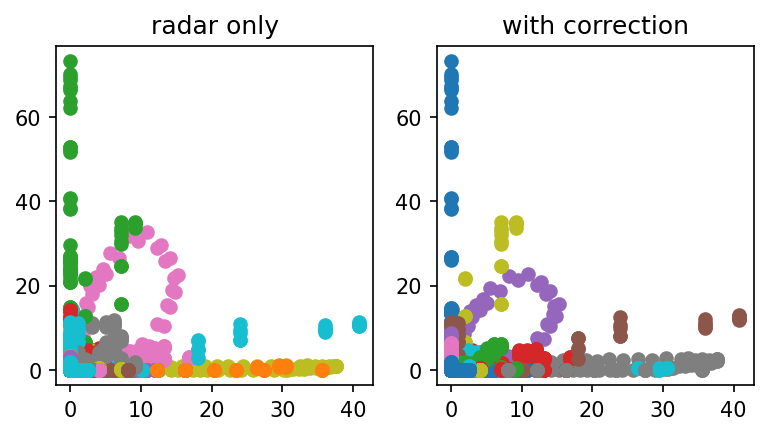

In [197]:
fig, axs = plt.subplots(1, 2, figsize=(6, 3))
for i in range(100):
    i = random.randint(0, len(compare))
    
    c = compare.iloc[i]
    
    axs[0].scatter(c.gage,c.mrms)
    axs[0].set_title('radar only')
    
    t = test.loc[(test['index']==c['index'])&(test['gage_id']==c['gage_id'][0])]
    
    try:
        axs[1].scatter(t.gage.iloc[0],t.mrms.iloc[0])
        axs[1].set_title('with correction')
    except:
        pass

In [227]:
compare.loc[(compare.mce_unsorted>.40)&(compare.total_accum_atgage<1)]

,index,mrms,gage,storm_id,gage_id,mrms_accum_atgage,gage_accum,total_accum_atgage,total_gage_accum,mce_unsorted,mce_raw
957,2022-05-06 08:00:00,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",[nan],[11],"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.000000,27.000,0.410373,0.060717
6493,2022-07-21 08:00:00,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",[nan],[86],"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.000000,81.280,0.432281,-0.100000
10586,2022-07-25 08:00:00,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[313111.05, 313707.05, nan]",[125],"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.546667,41.910,0.437945,-0.100000
10742,2021-06-30 16:00:00,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[688.04, nan]",[127],"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.050000,30.226,0.400512,-0.100000
10965,2021-07-30 08:00:00,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",[nan],[129],"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.000000,37.338,0.423297,-0.100000
12415,2022-07-10 08:00:00,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",[nan],[145],"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.000000,43.180,0.409600,0.254386
17204,2022-07-06 08:00:00,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[96362.05, nan]",[178],"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.263333,30.988,0.448652,0.327388


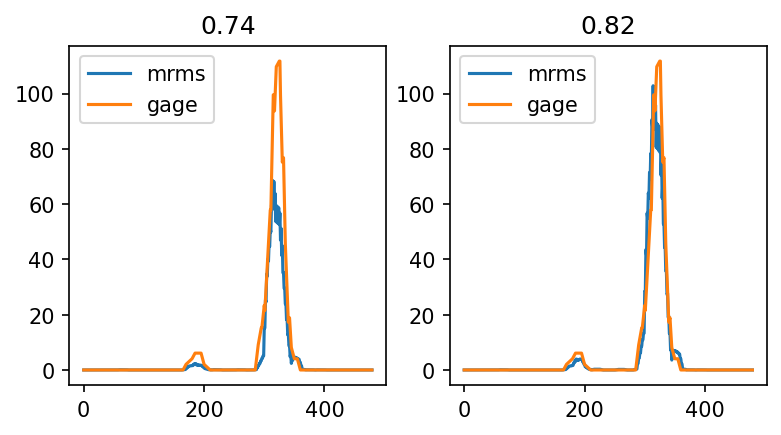

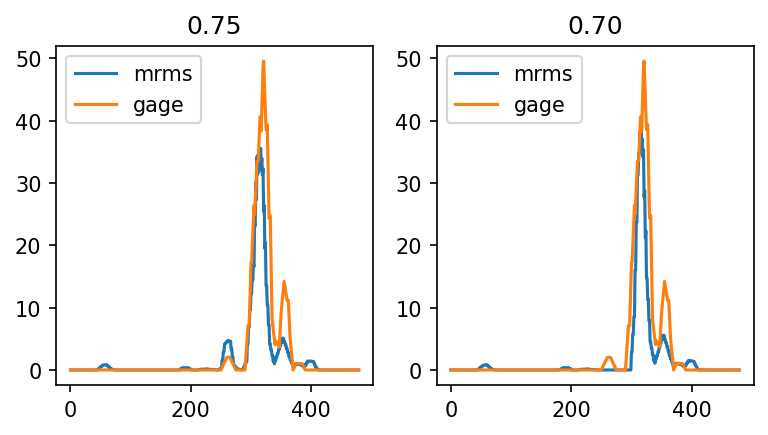

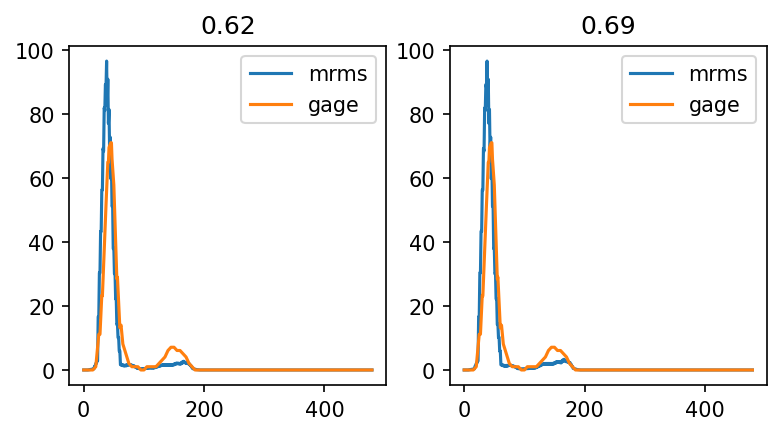

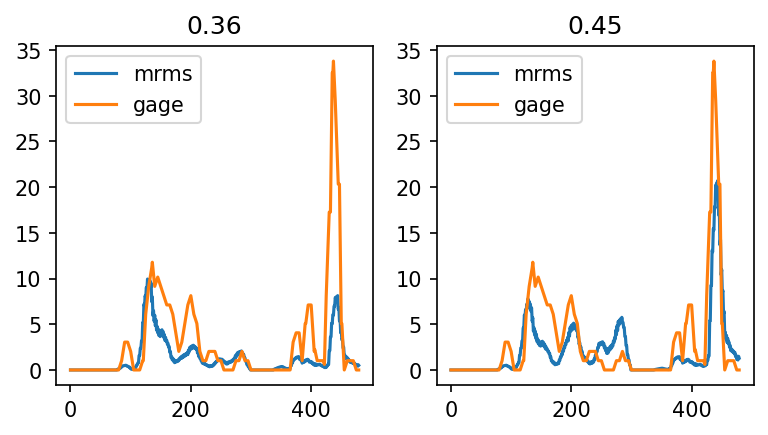

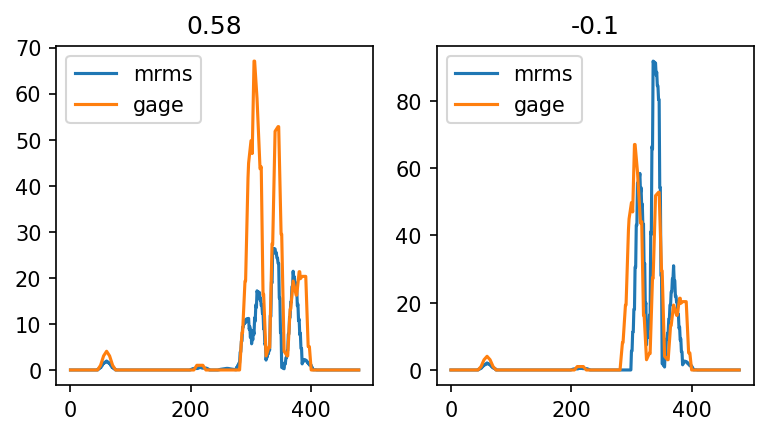

...

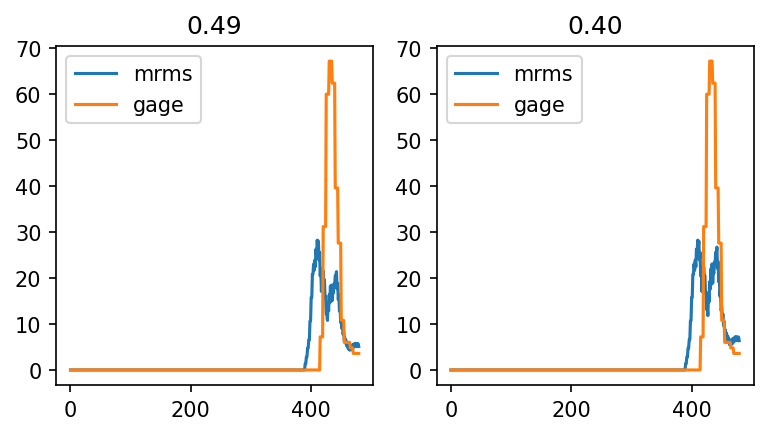

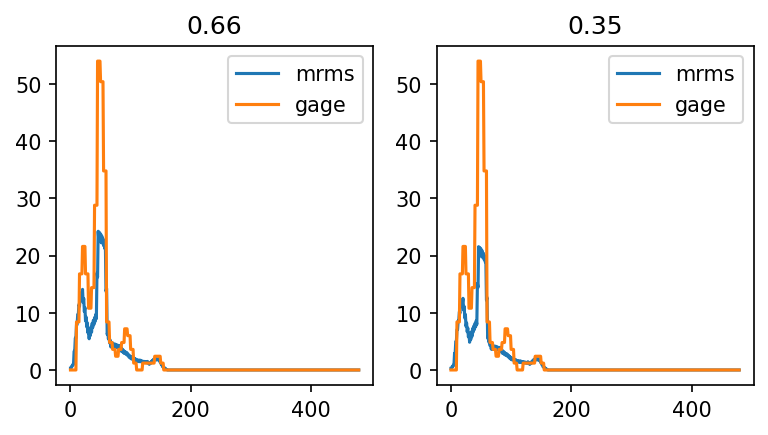

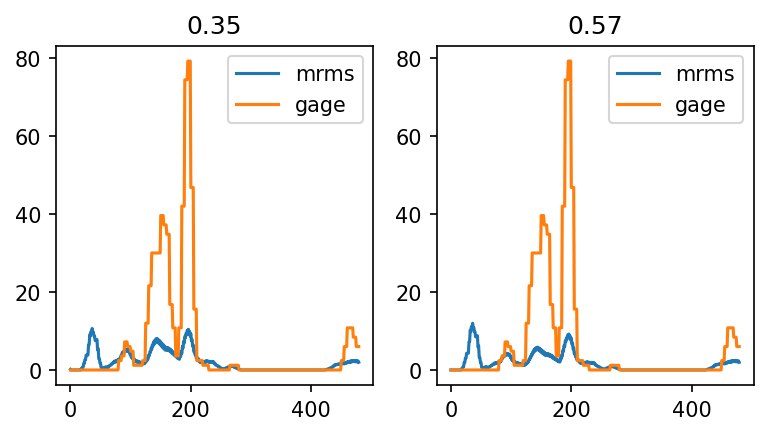

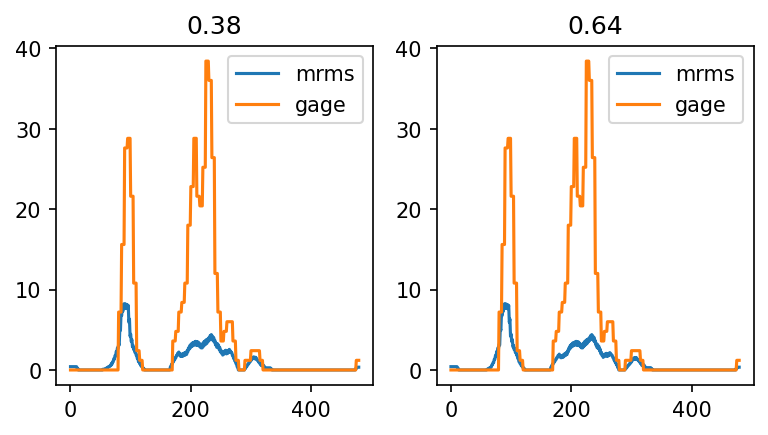

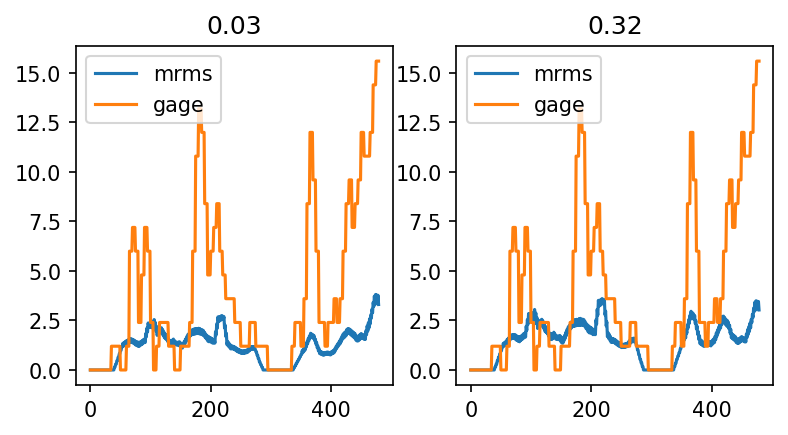

IndexError: single positional indexer is out-of-bounds

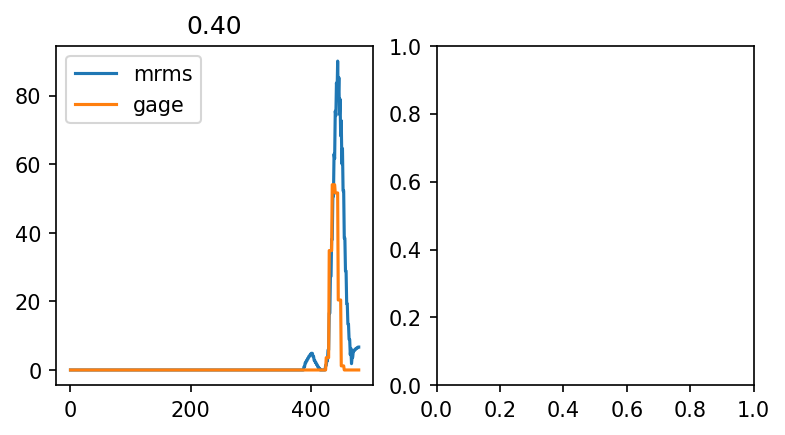

In [224]:
for i in range(100):
    fig, axs = plt.subplots(1, 2, figsize=(6, 3))
    c = compare.iloc[i]
    
    axs[0].plot(c.mrms,label='mrms')
    axs[0].plot(c.gage,label='gage')
    axs[0].legend()
    axs[0].set_title(str(compare.mce_unsorted.iloc[i])[0:4])
    
    t = test.loc[(test['index']==c['index'])&(test['gage_id']==c['gage_id'][0])]
    axs[1].plot(t.mrms.iloc[0],label='mrms')
    axs[1].plot(t.gage.iloc[0],label='gage')
    axs[1].legend()
    axs[1].set_title(str(test.mce_unsorted.iloc[i])[0:4])
    
    plt.show()

In [135]:
compare.gage_id = [compare.gage_id[i][0] for i in compare.index]

In [142]:
len(compare.gage_id.unique())

175

In [140]:
compare.groupby(compare.gage_id).count()

,level_0,index,mrms,gage,storm_id,mrms_accum_atgage,gage_accum,total_accum_atgage,total_gage_accum,onoff,mce,mce_unsorted,mce_raw
gage_id,,,,,,,,,,,,,
0,4,4,4,4,4,4,4,4,4,4,4,4,4
1,11,11,11,11,11,11,11,11,11,11,11,11,11
2,8,8,8,8,8,8,8,8,8,8,8,8,8
3,3,3,3,3,3,3,3,3,3,3,3,3,3
4,5,5,5,5,5,5,5,5,5,5,5,5,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,21,21,21,21,21,21,21,21,21,21,21,21,21
174,23,23,23,23,23,23,23,23,23,23,23,23,23
176,14,14,14,14,14,14,14,14,14,14,14,14,14


In [34]:
compare['onoff'] = 0
compare.loc[(compare.total_accum_atgage>0)&(compare.total_gage_accum>0),['onoff']]='TP'
compare.loc[(compare.total_accum_atgage==0)&(compare.total_gage_accum>0),['onoff']]='FN'
compare.loc[(compare.total_accum_atgage>0)&(compare.total_gage_accum==0),['onoff']]='FP'

c:\temp\3\ipykernel_36876\2121560693.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  compare['onoff'] = 0
c:\temp\3\ipykernel_36876\2121560693.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  compare.loc[(compare.total_accum_atgage>0)&(compare.total_gage_accum>0),['onoff']]='TP'


In [35]:
compare.groupby('onoff').count()/len(compare)

,index,mrms,gage,storm_id,gage_id,mrms_accum_atgage,gage_accum,total_accum_atgage,total_gage_accum,len
onoff,,,,,,,,,,
FN,0.113781,0.113781,0.113781,0.113781,0.113781,0.113781,0.113781,0.113781,0.113781,0.113781
FP,0.220308,0.220308,0.220308,0.220308,0.220308,0.220308,0.220308,0.220308,0.220308,0.220308
TP,0.665911,0.665911,0.665911,0.665911,0.665911,0.665911,0.665911,0.665911,0.665911,0.665911


In [125]:
compare.groupby('onoff').count()/len(compare)

,level_0,index,mrms,gage,storm_id,gage_id,mrms_accum_atgage,gage_accum,total_accum_atgage,total_gage_accum,mce,mce_unsorted,mce_raw
onoff,,,,,,,,,,,,,
FN,0.131458,0.131458,0.131458,0.131458,0.131458,0.131458,0.131458,0.131458,0.131458,0.131458,0.131458,0.131458,0.131458
FP,0.198977,0.198977,0.198977,0.198977,0.198977,0.198977,0.198977,0.198977,0.198977,0.198977,0.198977,0.198977,0.198977
TP,0.669565,0.669565,0.669565,0.669565,0.669565,0.669565,0.669565,0.669565,0.669565,0.669565,0.669565,0.669565,0.669565


In [126]:
compare.loc[compare.mce<0,['mce']]=-.1

In [9]:
from datetime import datetime, timedelta

In [10]:
# add downsampled, unsorted
# compute MSE from chunks
current_datetime = datetime.now()

mce_unsorted = []
mce_raw = []
for i in test.index:
    g = test.gage[i]
    m = test.mrms[i]    

    datetime_g = [current_datetime + timedelta(minutes=i) for i in range(len(g))]
    datetime_m = [current_datetime + timedelta(minutes=i) for i in range(len(m))]

    # segment into 10 min chunks
    g = pd.DataFrame(data=g,index=datetime_g)
    m = pd.DataFrame(data=m,index=datetime_m)
    g_r = g.resample('10min').max().values
    m_r = m.resample('10min').max().values
    g = g.values
    m = m.values
    '''    try:
        first_pos = np.argwhere(g>0)[0][0] # remove non recording times to not inflate variability of gage
        last_pos = np.argwhere(g>0)[-1][0]
        g = g[first_pos:last_pos]
        m = m[first_pos:last_pos]
    
        mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
        mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))'''

        
#except:
    mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
    mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))

test['mce_unsorted'] = mce_unsorted
test['mce_raw'] = mce_raw

test.loc[test.mce_unsorted<0,['mce_unsorted']]=-.1
test.loc[test.mce_raw<0,['mce_raw']]=-.1

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divide by zero encountered in double_scalars
  mce_unsorted.append(1-(np.mean(np.abs(m_r - g_r))/np.mean(np.abs(g_r - np.mean(g_r)))))
c:\temp\3\ipykernel_31440\3345015690.py:32: RuntimeWarning: divide by zero encountered in double_scalars
  mce_raw.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_31440\3345015690.py:33: RuntimeWarning: divi

In [222]:
#print(len(compare.loc[compare.mce>.5])/len(compare))
print(len(compare.loc[compare.mce_unsorted>.5])/len(compare))
print(len(compare.loc[compare.mce_raw>.5])/len(compare))

0.10465116279069768
0.046511627906976744


In [137]:
print(len(compare.loc[compare.mce>.5])/len(compare))
print(len(compare.loc[compare.mce_unsorted>.5])/len(compare))
print(len(compare.loc[compare.mce_raw>.5])/len(compare))

0.0989010989010989
0.08791208791208792
0.04395604395604396


In [223]:
print(len(test.loc[test.mce>.5])/len(test))
print(len(test.loc[test.mce_unsorted>.5])/len(test))
print(len(test.loc[test.mce_raw>.5])/len(test))

0.12420382165605096
0.12738853503184713
0.041401273885350316


In [5]:
import numpy as np

In [22]:
hx = np.histogram(test.mce,bins=np.arange(0,1.1,.1))
hu = np.histogram(test.mce_unsorted,bins=np.arange(0,1.1,.1))
hr = np.histogram(test.mce_raw,bins=np.arange(0,1.1,.1))

In [220]:
htest = np.histogram(test.mce_unsorted,bins=np.arange(0,1.1,.1))
hcompare = np.histogram(compare.mce_unsorted,bins=np.arange(0,1.1,.1))


In [13]:
import matplotlib.pyplot as plt

In [14]:
import matplotlib as mpl

# set figure defaults
mpl.rcParams['figure.dpi'] = 150
plt.rcParams['figure.figsize'] = (12.0/2, 10.0/2)

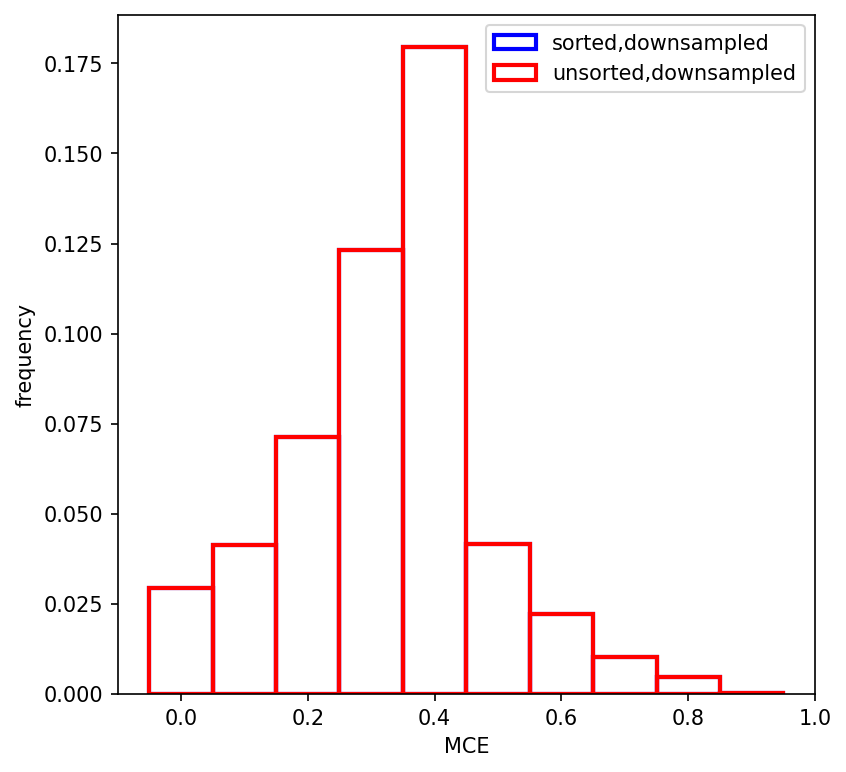

In [15]:
fig, ax = plt.subplots(figsize=(6, 6))

plt.xlabel('MCE')
plt.ylabel('frequency')

plt.bar(hx[1][:-1],hx[0].astype(float)/len(test),edgecolor = 'b', color = [], width = .1, linewidth = 2,label='sorted,downsampled')
plt.bar(hu[1][:-1],hu[0].astype(float)/len(test),edgecolor = 'r', color = [], width = .1, linewidth = 2,label='unsorted,downsampled')
#plt.bar(hr[1][:-1],hr[0].astype(float)/len(test),edgecolor = 'b', color = [], width = .1, linewidth = 2,label='raw')
plt.legend()

fig.savefig("histmce.pdf",
       bbox_inches='tight',dpi=255,transparent=False,facecolor='white')

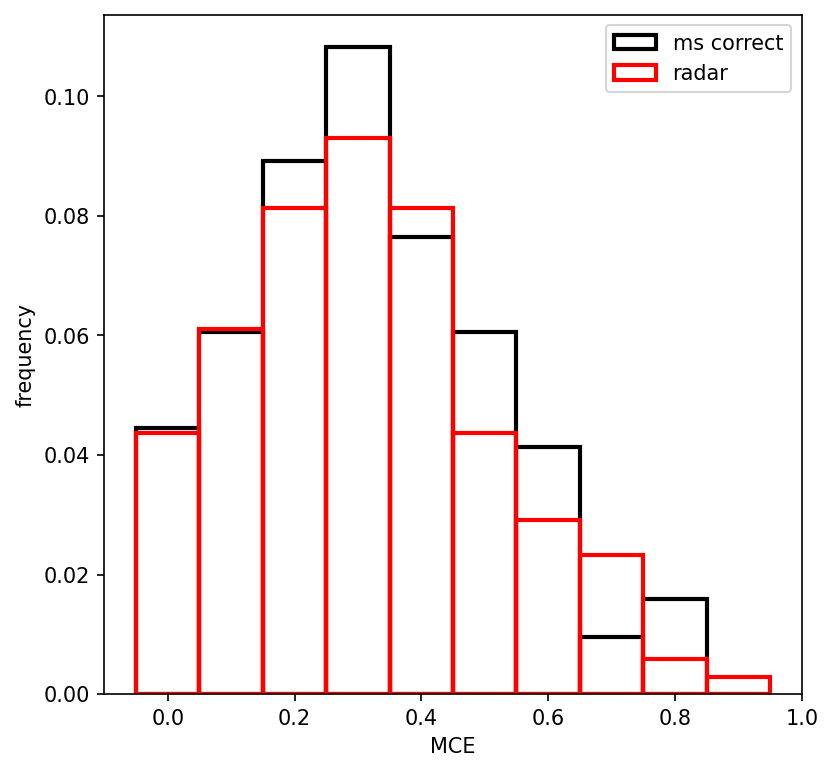

In [221]:
fig, ax = plt.subplots(figsize=(6, 6))

plt.xlabel('MCE')
plt.ylabel('frequency')

plt.bar(htest[1][:-1],htest[0].astype(float)/len(test),edgecolor = 'k', color = [], width = .1, linewidth = 2,label='ms correct')
plt.bar(hcompare[1][:-1],hcompare[0].astype(float)/len(compare),edgecolor = 'r', color = [], width = .1, linewidth = 2,label='radar')
#plt.bar(hr[1][:-1],hr[0].astype(float)/len(test),edgecolor = 'b', color = [], width = .1, linewidth = 2,label='raw')
plt.legend()

fig.savefig("histmce.pdf",
       bbox_inches='tight',dpi=255,transparent=False,facecolor='white')

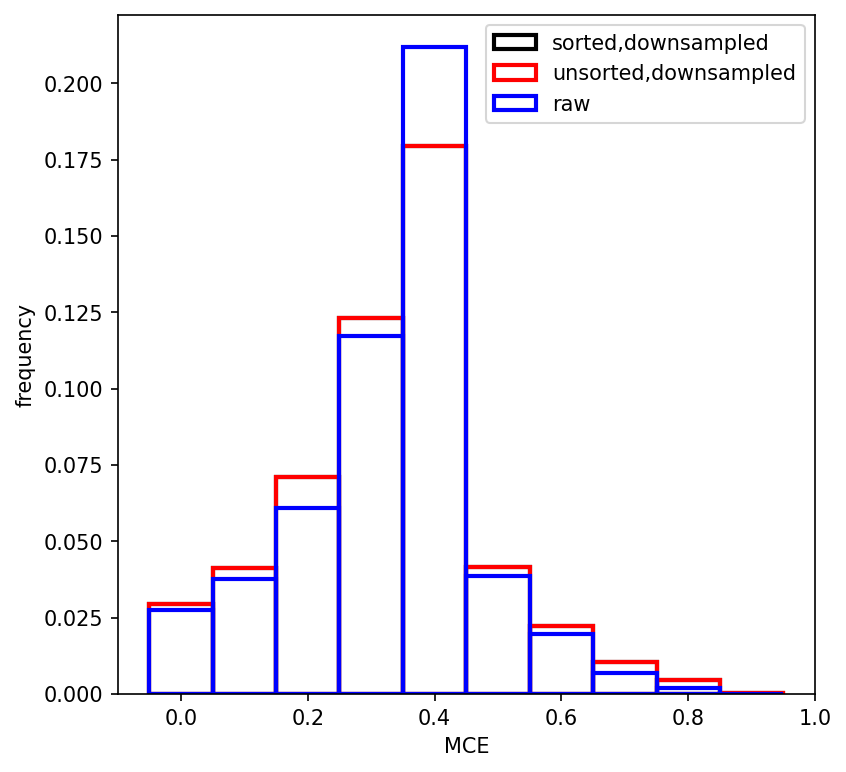

In [18]:
fig, ax = plt.subplots(figsize=(6, 6))

plt.xlabel('MCE')
plt.ylabel('frequency')

plt.bar(hx[1][:-1],hx[0].astype(float)/len(test),edgecolor = 'k', color = [], width = .1, linewidth = 2,label='sorted,downsampled')
plt.bar(hu[1][:-1],hu[0].astype(float)/len(test),edgecolor = 'r', color = [], width = .1, linewidth = 2,label='unsorted,downsampled')
plt.bar(hr[1][:-1],hr[0].astype(float)/len(test),edgecolor = 'b', color = [], width = .1, linewidth = 2,label='raw')
plt.legend()

fig.savefig("histmce.pdf",
       bbox_inches='tight',dpi=255,transparent=False,facecolor='white')

(array([7.217e+03, 3.320e+02, 4.040e+02, 4.960e+02, 5.130e+02, 5.600e+02,
        4.840e+02, 3.090e+02, 1.490e+02, 6.700e+01, 5.000e+00, 0.000e+00]),
 array([-0.1,  0. ,  0.1,  0.2,  0.3,  0.4,  0.5,  0.6,  0.7,  0.8,  0.9,
         1. ,  1.1]),
 <BarContainer object of 12 artists>)

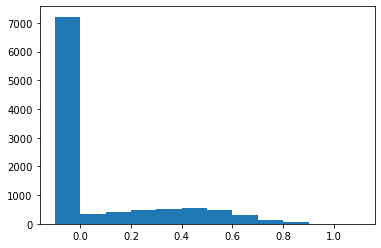

In [33]:
import matplotlib.pyplot as plt
import numpy as np
plt.hist(compare.loc[compare.total_accum_atgage>1].mce,bins=np.arange(-.1,1.1,.1))

In [50]:
# compute MSE from chunks
current_datetime = datetime.now()

mce = []
for i in compare.index:
    g = compare.gage[i]
    m = compare.mrms[i]     
    
    datetime_g = [current_datetime + timedelta(minutes=i) for i in range(len(g))]
    datetime_m = [current_datetime + timedelta(minutes=i) for i in range(len(m))]

    # segment into 10 min chunks
    g = np.sort(pd.DataFrame(data=g,index=datetime_g).resample('10min').max().values)
    m = np.sort(pd.DataFrame(data=m,index=datetime_m).resample('10min').max().values)
    
    mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
compare['mce'] = mce

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.append(1-(np.mean(np.abs(m - g))/np.mean(np.abs(g - np.mean(g)))))
c:\temp\3\ipykernel_36876\740634155.py:16: RuntimeWarning: divide by zero encountered in double_scalars
  mce.appen

In [52]:
# save window values
compare.reset_index().to_feather('window_values_FN')

In [67]:
# remove empty timesteps (empty data)
compare = compare.reset_index(drop=True)
compare['len_m']=[len(compare.mrms[i]) for i in range(len(compare))]
compare = compare.loc[compare.len_m>0].reset_index(drop=True)

In [68]:
# remove timesteps where total accum 0
#compare['total_accum_atgage']=[pd.DataFrame(compare.mrms_accum_atgage[i]).sum()[0] for i in range(len(compare))]
compare = compare.loc[compare.total_accum_atgage>0].reset_index(drop=True)

In [69]:

compare['max_mrms']=[np.max(compare.mrms[i]) for i in range(len(compare))]


In [70]:

compare=compare.rename(columns={"index": "start"})
compare['end']=[compare['start'][i]+timedelta(minutes=compare.len_m[i].astype('float'))  for i in range(len(compare))]

In [71]:
# get rid of nan storm ids
compare.storm_id = [compare.storm_id[i][~np.isnan(compare.storm_id[i])] for i in range(len(compare))]

In [72]:
# remove samples where no storm_ids exist
compare['len_storm_id']=[len(compare.storm_id[i]) for i in range(len(compare))]
compare = compare.loc[compare.len_storm_id>0]

In [90]:
compare.reset_index().to_feather('window_values')

In [91]:
compare = compare.reset_index(drop=True)

In [92]:
compare['max_gage']=[np.max(compare.gage[i]) for i in range(len(compare))]

In [160]:
#compare['total_gage_accum']=[np.sum(compare.gage_accum[i]) for i in range(len(compare))]

In [76]:
compare['max_accum_atgage']=[pd.DataFrame(compare.mrms_accum_atgage[i]).max()[0] for i in range(len(compare))]

In [99]:
# median, std, mean, var OF POSITIVE MRMS intensity VALUES
median_int=[]
std_int=[]
var_int=[]
mean_int=[]

for i in compare.index:
    intensity = np.array(compare.mrms[i])
    int_pos = intensity[intensity>0]
    
    median_int.append(np.median(int_pos))
    std_int.append(np.std(int_pos))
    var_int.append(np.var(int_pos))
    mean_int.append(np.mean(int_pos))
    
    
compare['median_int_point']=median_int
compare['std_int_point']=std_int
compare['var_int_point']=var_int
compare['mean_int_point']=mean_int

In [100]:
# median, std, mean, var OF POSITIVE MRMS accumulation VALUES
median_accum=[]
std_accum=[]
var_accum=[]
mean_accum=[]

for i in compare.index:
    accumulation = np.array(compare.mrms_accum_atgage[i])
    accum_pos = accumulation[accumulation>0]
    
    median_accum.append(np.median(accum_pos))
    std_accum.append(np.std(accum_pos))
    var_accum.append(np.var(accum_pos))
    mean_accum.append(np.mean(accum_pos))
    
    
compare['median_accum_point']=median_accum
compare['std_accum_point']=std_accum
compare['var_accum_point']=var_accum
compare['mean_accum_point']=mean_accum

In [101]:
compare = compare.reset_index()
compare['duration']=[pd.DataFrame(compare.mrms[i]) for i in range(len(compare))]
compare['duration']=[compare.duration[i].loc[compare.duration[i][0]>0].index[-1]-compare.duration[i].loc[compare.duration[i][0]>0].index[0] for i in range(len(compare))]

In [153]:
lat_m = []
lon_m = []
for i in range(len(coord)):
    # get corresponding mrms coordinate
    latt = coord[i][0]
    lont = coord[i][1]
    # select mrms at coordinate
    m_g = m.sel(longitude=lont,latitude=latt,method='nearest')
    lat_m.append(m_g.latitude.values)
    lon_m.append(m_g.longitude.values)
    

In [155]:
# add point data to dataset
# lat/lon
compare['latitude']=[float(lat_m[compare.gage_id.iloc[i][0]]) for i in range(len(compare))]
compare['longitude']=[float(lon_m[compare.gage_id.iloc[i][0]]) for i in range(len(compare))]

In [102]:
# month
compare['month']=[compare['start'][i].month for i in range(len(compare))]
# hour
compare['hour']=[compare['start'][i].hour for i in range(len(compare))]

Step 5 : calculate features for each gage event and export labeled dataset

radar

In [30]:
window_values = compare[['mrms','gage','mrms_accum_atgage','gage_accum']]

In [31]:
compare = compare.drop(columns=['mrms','gage','mrms_accum_atgage','gage_accum'])

In [32]:
name = 'window_values.csv'
output = parentDir+name
compare.to_csv(output)

In [104]:
name = 'intermediate_datadev'
output = parentDir+name
compare.to_feather(output)

In [5]:
compare = pd.read_feather(parentDir+'\\intermediate_datadev2')

In [6]:
compare.columns

Index(['index', 'start', 'mrms', 'gage', 'storm_id', 'gage_id',
       'mrms_accum_atgage', 'gage_accum', 'total_accum_atgage',
       'total_gage_accum', 'onoff', 'mce', 'len_m', 'max_mrms', 'end',
       'len_storm_id', 'max_accum_atgage', 'latitude', 'longitude', 'max_gage',
       'median_int_point', 'std_int_point', 'var_int_point', 'mean_int_point',
       'median_accum_point', 'std_accum_point', 'var_accum_point',
       'mean_accum_point', 'duration', 'month', 'hour', 'mult_correct', 'RQI'],
      dtype='object')

In [7]:
lat = compare.latitude.unique()
lon = compare.longitude.unique()

In [8]:
# multisensor correction
# open multisensor qpe for 2021,2022
mrms_multi_folder = os.path.join(parentDir,"MRMS","1hr_QPE_multi_cat_yr_CO")
filenames_multi = glob.glob(mrms_multi_folder+'\\'+'*.grib2')
mrms_multi = xr.open_mfdataset(filenames_multi,engine = "cfgrib",chunks={'time': '50MB'})
mrms_multi = mrms_multi.where(mrms_multi>=0)

mrms_multi = mrms_multi.where(mrms_multi.longitude<=256,drop=True)

mrms_multi = mrms_multi.sel(longitude=lon,latitude=lat,method='nearest',drop=True)
mrms_multi = mrms_multi.drop_duplicates(dim=['latitude','longitude'])
# open radaronly qpe for 2021,2022
mrms_radar_folder = os.path.join(parentDir,"MRMS","1hr_QPE_radar_cat_yr_CO")
filenames_radar = glob.glob(mrms_radar_folder+'\\'+'*.grib2')
mrms_radar = xr.open_mfdataset(filenames_radar,engine = "cfgrib",chunks={'time': '50MB'})
mrms_radar = mrms_radar.where(mrms_radar>=0)
mrms_radar = mrms_radar.where(mrms_radar.longitude<=256,drop=True)

mrms_radar = mrms_radar.sel(longitude=lon,latitude=lat,method='nearest',drop=True)
mrms_radar = mrms_radar.drop_duplicates(dim=['latitude','longitude'])

correction = (mrms_multi/mrms_radar)
correction = correction.where(correction.unknown != np.inf).fillna(1)

# select only gage locations and storm times
#correction = correction.sel(longitude=lon,latitude=lat,drop=True)

correction = time_change(correction)

correction = correction.sortby(correction.latitude)
correction = correction.sortby(correction.longitude)

c = []
for i in range(len(compare)):
    # select mrms at coordinate
    c_g = correction.sel(longitude=compare.longitude[i],latitude=compare.latitude[i],method='nearest',drop=True)
    
    c.append(c_g.sel(time=slice(compare.start[i].round('H'),compare.end[i].round('H'))).unknown.max().compute().values)
    print(i/len(compare))
# add to database
compare['mult_correct']=c

Ignoring index file 'Z:\\MRMS\\1hr_QPE_multi_cat_yr_CO\\2022_multiQPE_CO.grib2.923a8.idx' incompatible with GRIB file
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\xarray\core\indexing.py:1379: PerformanceWarning: Slicing is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array[indexer]

To avoid creating the large chunks, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    ...     array[indexer]
  return self.array[key]
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\xarray\core\indexing.py:1385: PerformanceWarning: Slicing is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array[indexer]

To avoid creating the large chunks, set the opt

0.0
3.6561734488684145e-05
7.312346897736829e-05
0.00010968520346605243
0.00014624693795473658
0.0001828086724434207
0.00021937040693210486
0.000255932141420789
0.00029249387590947316
0.0003290556103981573
0.0003656173448868414
0.0004021790793755256
0.0004387408138642097
0.00047530254835289384
0.000511864282841578
0.0005484260173302622
0.0005849877518189463
0.0006215494863076304
0.0006581112207963146
0.0006946729552849987
0.0007312346897736828
0.000767796424262367
0.0008043581587510512
0.0008409198932397353
0.0008774816277284194
0.0009140433622171036
0.0009506050967057877
0.0009871668311944718
0.001023728565683156
0.00106029030017184
0.0010968520346605244
0.0011334137691492085
0.0011699755036378926
0.0012065372381265768
0.0012430989726152609
0.001279660707103945
0.0013162224415926291
0.0013527841760813133
0.0013893459105699974
0.0014259076450586815
0.0014624693795473656
0.00149903111403605
0.001535592848524734
0.0015721545830134182
0.0016087163175021024
0.0016452780519907865
0.00168183

0.014259076450586815
0.0142956381850755
0.014332199919564184
0.014368761654052868
0.014405323388541552
0.014441885123030237
0.014478446857518921
0.014515008592007606
0.014551570326496288
0.014588132060984972
0.014624693795473657
0.014661255529962341
0.014697817264451025
0.01473437899893971
0.014770940733428394
0.014807502467917079
0.014844064202405763
0.014880625936894445
0.01491718767138313
0.014953749405871814
0.014990311140360498
0.015026872874849183
0.015063434609337867
0.015099996343826552
0.015136558078315236
0.01517311981280392
0.015209681547292603
0.015246243281781287
0.015282805016269971
0.015319366750758656
0.01535592848524734
0.015392490219736025
0.015429051954224709
0.015465613688713393
0.015502175423202078
0.01553873715769076
0.015575298892179444
0.015611860626668129
0.015648422361156815
0.015684984095645498
0.01572154583013418
0.015758107564622866
0.01579466929911155
0.015831231033600235
0.015867792768088917
0.015904354502577604
0.015940916237066286
0.015977477971554972
0

0.028810646777083105
0.028847208511571788
0.028883770246060474
0.028920331980549156
0.028956893715037842
0.028993455449526525
0.02903001718401521
0.029066578918503894
0.029103140652992576
0.029139702387481262
0.029176264121969945
0.02921282585645863
0.029249387590947314
0.029285949325436
0.029322511059924682
0.02935907279441337
0.02939563452890205
0.029432196263390734
0.02946875799787942
0.029505319732368102
0.02954188146685679
0.02957844320134547
0.029615004935834157
0.02965156667032284
0.029688128404811526
0.02972469013930021
0.02976125187378889
0.029797813608277577
0.02983437534276626
0.029870937077254946
0.02990749881174363
0.029944060546232314
0.029980622280720997
0.030017184015209683
0.030053745749698366
0.030090307484187048
0.030126869218675734
0.030163430953164417
0.030199992687653103
0.030236554422141786
0.03027311615663047
0.030309677891119154
0.03034623962560784
0.030382801360096523
0.030419363094585206
0.03045592482907389
0.030492486563562574
0.03052904829805126
0.030565610

0.0435815875105115
0.04361814924500018
0.043654710979488864
0.043691272713977554
0.043727834448466237
0.04376439618295492
0.0438009579174436
0.043837519651932284
0.043874081386420974
0.043910643120909656
0.04394720485539834
0.04398376658988702
0.04402032832437571
0.044056890058864394
0.044093451793353076
0.04413001352784176
0.04416657526233044
0.04420313699681913
0.044239698731307814
0.044276260465796496
0.04431282220028518
0.04434938393477387
0.04438594566926255
0.044422507403751234
0.044459069138239916
0.0444956308727286
0.04453219260721729
0.04456875434170597
0.044605316076194654
0.044641877810683336
0.044678439545172026
0.04471500127966071
0.04475156301414939
0.044788124748638074
0.044824686483126756
0.044861248217615446
0.04489780995210413
0.04493437168659281
0.044970933421081494
0.04500749515557018
0.045044056890058866
0.04508061862454755
0.04511718035903623
0.045153742093524914
0.0451903038280136
0.045226865562502286
0.04526342729699097
0.04529998903147965
0.04533655076596834
0.

0.05842565171291726
0.058462213447405945
0.05849877518189463
0.05853533691638331
0.058571898650872
0.05860846038536068
0.058645022119849365
0.05868158385433805
0.05871814558882674
0.05875470732331542
0.0587912690578041
0.058827830792292785
0.05886439252678147
0.05890095426127016
0.05893751599575884
0.05897407773024752
0.059010639464736205
0.059047201199224894
0.05908376293371358
0.05912032466820226
0.05915688640269094
0.059193448137179625
0.059230009871668314
0.059266571606157
0.05930313334064568
0.05933969507513436
0.05937625680962305
0.059412818544111734
0.05944938027860042
0.0594859420130891
0.05952250374757778
0.05955906548206647
0.059595627216555154
0.05963218895104384
0.05966875068553252
0.05970531242002121
0.05974187415450989
0.059778435888998574
0.05981499762348726
0.05985155935797594
0.05988812109246463
0.05992468282695331
0.059961244561441994
0.05999780629593068
0.060034368030419366
0.06007092976490805
0.06010749149939673
0.060144053233885414
0.060180614968374097
0.0602171767

0.07345252458776644
0.07348908632225513
0.07352564805674382
0.0735622097912325
0.07359877152572118
0.07363533326020986
0.07367189499469855
0.07370845672918723
0.07374501846367591
0.0737815801981646
0.07381814193265329
0.07385470366714197
0.07389126540163066
0.07392782713611934
0.07396438887060802
0.0740009506050967
0.07403751233958539
0.07407407407407407
0.07411063580856275
0.07414719754305145
0.07418375927754013
0.07422032101202881
0.0742568827465175
0.07429344448100618
0.07433000621549486
0.07436656794998354
0.07440312968447223
0.07443969141896091
0.0744762531534496
0.07451281488793829
0.07454937662242697
0.07458593835691565
0.07462250009140434
0.07465906182589302
0.0746956235603817
0.07473218529487038
0.07476874702935907
0.07480530876384776
0.07484187049833645
0.07487843223282513
0.07491499396731381
0.0749515557018025
0.07498811743629118
0.07502467917077986
0.07506124090526854
0.07509780263975722
0.07513436437424592
0.0751709261087346
0.07520748784322329
0.07524404957771197
0.075280

0.08855252093159299
0.08858908266608168
0.08862564440057036
0.08866220613505904
0.08869876786954774
0.08873532960403642
0.0887718913385251
0.08880845307301378
0.08884501480750247
0.08888157654199115
0.08891813827647983
0.08895470001096852
0.0889912617454572
0.0890278234799459
0.08906438521443458
0.08910094694892326
0.08913750868341194
0.08917407041790062
0.08921063215238931
0.08924719388687799
0.08928375562136667
0.08932031735585536
0.08935687909034405
0.08939344082483273
0.08943000255932142
0.0894665642938101
0.08950312602829878
0.08953968776278746
0.08957624949727615
0.08961281123176483
0.08964937296625351
0.08968593470074221
0.08972249643523089
0.08975905816971957
0.08979561990420826
0.08983218163869694
0.08986874337318562
0.0899053051076743
0.08994186684216299
0.08997842857665167
0.09001499031114037
0.09005155204562905
0.09008811378011773
0.09012467551460641
0.0901612372490951
0.09019779898358378
0.09023436071807246
0.09027092245256114
0.09030748418704983
0.09034404592153852
0.0903

0.10365251727541955
0.10368907900990823
0.10372564074439691
0.1037622024788856
0.10379876421337428
0.10383532594786296
0.10387188768235166
0.10390844941684034
0.10394501115132902
0.1039815728858177
0.10401813462030639
0.10405469635479507
0.10409125808928375
0.10412781982377244
0.10416438155826112
0.10420094329274981
0.1042375050272385
0.10427406676172718
0.10431062849621586
0.10434719023070455
0.10438375196519323
0.10442031369968191
0.10445687543417059
0.10449343716865928
0.10452999890314797
0.10456656063763665
0.10460312237212534
0.10463968410661402
0.1046762458411027
0.10471280757559139
0.10474936931008007
0.10478593104456875
0.10482249277905743
0.10485905451354613
0.10489561624803481
0.1049321779825235
0.10496873971701218
0.10500530145150086
0.10504186318598954
0.10507842492047823
0.10511498665496691
0.10515154838945559
0.10518811012394429
0.10522467185843297
0.10526123359292165
0.10529779532741033
0.10533435706189902
0.1053709187963877
0.10540748053087638
0.10544404226536506
0.1054

0.11878907535373479
0.11882563708822347
0.11886219882271215
0.11889876055720083
0.11893532229168952
0.1189718840261782
0.11900844576066688
0.11904500749515556
0.11908156922964426
0.11911813096413294
0.11915469269862163
0.11919125443311031
0.11922781616759899
0.11926437790208767
0.11930093963657636
0.11933750137106504
0.11937406310555372
0.11941062484004242
0.1194471865745311
0.11948374830901978
0.11952031004350847
0.11955687177799715
0.11959343351248583
0.11962999524697451
0.1196665569814632
0.11970311871595188
0.11973968045044057
0.11977624218492926
0.11981280391941794
0.11984936565390662
0.1198859273883953
0.11992248912288399
0.11995905085737267
0.11999561259186135
0.12003217432635004
0.12006873606083873
0.12010529779532741
0.1201418595298161
0.12017842126430478
0.12021498299879346
0.12025154473328215
0.12028810646777083
0.12032466820225951
0.12036122993674819
0.12039779167123689
0.12043435340572557
0.12047091514021425
0.12050747687470294
0.12054403860919162
0.1205806003436803
0.1206

0.1339621951665387
0.1339987569010274
0.13403531863551607
0.13407188037000475
0.13410844210449344
0.13414500383898212
0.1341815655734708
0.13421812730795948
0.13425468904244817
0.13429125077693685
0.13432781251142553
0.13436437424591421
0.1344009359804029
0.1344374977148916
0.1344740594493803
0.13451062118386897
0.13454718291835766
0.13458374465284634
0.13462030638733502
0.1346568681218237
0.13469342985631239
0.13472999159080107
0.13476655332528975
0.13480311505977843
0.13483967679426712
0.1348762385287558
0.13491280026324448
0.13494936199773316
0.13498592373222185
0.13502248546671053
0.1350590472011992
0.13509560893568792
0.1351321706701766
0.1351687324046653
0.13520529413915397
0.13524185587364265
0.13527841760813133
0.13531497934262002
0.1353515410771087
0.13538810281159738
0.13542466454608607
0.13546122628057475
0.13549778801506343
0.1355343497495521
0.1355709114840408
0.13560747321852948
0.13564403495301816
0.13568059668750684
0.13571715842199553
0.13575372015648424
0.135790281890

0.14920843844832
0.14924500018280867
0.14928156191729736
0.14931812365178604
0.14935468538627472
0.1493912471207634
0.1494278088552521
0.14946437058974077
0.14950093232422945
0.14953749405871813
0.14957405579320682
0.14961061752769553
0.1496471792621842
0.1496837409966729
0.14972030273116158
0.14975686446565026
0.14979342620013894
0.14982998793462762
0.1498665496691163
0.149903111403605
0.14993967313809367
0.14997623487258235
0.15001279660707104
0.15004935834155972
0.1500859200760484
0.15012248181053708
0.15015904354502577
0.15019560527951445
0.15023216701400313
0.15026872874849184
0.15030529048298052
0.1503418522174692
0.1503784139519579
0.15041497568644657
0.15045153742093526
0.15048809915542394
0.15052466088991262
0.1505612226244013
0.15059778435888999
0.15063434609337867
0.15067090782786735
0.15070746956235603
0.15074403129684472
0.1507805930313334
0.15081715476582208
0.15085371650031076
0.15089027823479945
0.15092683996928816
0.15096340170377684
0.15099996343826552
0.1510365251727

0.1644181199956126
0.16445468173010128
0.16449124346458996
0.16452780519907864
0.16456436693356732
0.164600928668056
0.1646374904025447
0.16467405213703337
0.16471061387152205
0.16474717560601074
0.16478373734049942
0.16482029907498813
0.1648568608094768
0.1648934225439655
0.16492998427845418
0.16496654601294286
0.16500310774743154
0.16503966948192023
0.1650762312164089
0.1651127929508976
0.16514935468538627
0.16518591641987496
0.16522247815436364
0.16525903988885232
0.165295601623341
0.1653321633578297
0.16536872509231837
0.16540528682680705
0.16544184856129573
0.16547841029578444
0.16551497203027313
0.1655515337647618
0.1655880954992505
0.16562465723373918
0.16566121896822786
0.16569778070271654
0.16573434243720522
0.1657709041716939
0.1658074659061826
0.16584402764067127
0.16588058937515995
0.16591715110964864
0.16595371284413732
0.165990274578626
0.16602683631311468
0.16606339804760337
0.16609995978209205
0.16613652151658076
0.16617308325106944
0.16620964498555812
0.166246206720046

0.17966436327739388
0.17970092501188256
0.17973748674637124
0.17977404848085993
0.1798106102153486
0.1798471719498373
0.17988373368432597
0.17992029541881466
0.17995685715330334
0.17999341888779205
0.18002998062228073
0.18006654235676942
0.1801031040912581
0.18013966582574678
0.18017622756023546
0.18021278929472415
0.18024935102921283
0.1802859127637015
0.1803224744981902
0.18035903623267888
0.18039559796716756
0.18043215970165624
0.18046872143614492
0.1805052831706336
0.1805418449051223
0.18057840663961097
0.18061496837409965
0.18065153010858837
0.18068809184307705
0.18072465357756573
0.1807612153120544
0.1807977770465431
0.18083433878103178
0.18087090051552046
0.18090746225000914
0.18094402398449783
0.1809805857189865
0.1810171474534752
0.18105370918796387
0.18109027092245256
0.18112683265694124
0.18116339439142992
0.1811999561259186
0.1812365178604073
0.18127307959489597
0.18130964132938468
0.18134620306387336
0.18138276479836205
0.18141932653285073
0.1814558882673394
0.181492450001

0.19487404482468648
0.19491060655917516
0.19494716829366385
0.19498373002815253
0.1950202917626412
0.1950568534971299
0.19509341523161858
0.19512997696610726
0.19516653870059594
0.19520310043508465
0.19523966216957334
0.19527622390406202
0.1953127856385507
0.19534934737303938
0.19538590910752807
0.19542247084201675
0.19545903257650543
0.19549559431099411
0.1955321560454828
0.19556871777997148
0.19560527951446016
0.19564184124894884
0.19567840298343753
0.1957149647179262
0.1957515264524149
0.19578808818690357
0.19582464992139226
0.19586121165588097
0.19589777339036965
0.19593433512485833
0.19597089685934702
0.1960074585938357
0.19604402032832438
0.19608058206281306
0.19611714379730175
0.19615370553179043
0.1961902672662791
0.1962268290007678
0.19626339073525648
0.19629995246974516
0.19633651420423384
0.19637307593872252
0.1964096376732112
0.1964461994076999
0.19648276114218857
0.19651932287667728
0.19655588461116597
0.19659244634565465
0.19662900808014333
0.196665569814632
0.19670213154

0.21012028810646777
0.21015684984095645
0.21019341157544513
0.21022997330993382
0.2102665350444225
0.21030309677891118
0.21033965851339986
0.21037622024788857
0.21041278198237726
0.21044934371686594
0.21048590545135462
0.2105224671858433
0.210559028920332
0.21059559065482067
0.21063215238930935
0.21066871412379803
0.21070527585828672
0.2107418375927754
0.21077839932726408
0.21081496106175276
0.21085152279624145
0.21088808453073013
0.2109246462652188
0.2109612079997075
0.21099776973419618
0.2110343314686849
0.21107089320317357
0.21110745493766225
0.21114401667215094
0.21118057840663962
0.2112171401411283
0.21125370187561698
0.21129026361010567
0.21132682534459435
0.21136338707908303
0.21139994881357171
0.2114365105480604
0.21147307228254908
0.21150963401703776
0.21154619575152644
0.21158275748601513
0.2116193192205038
0.2116558809549925
0.2116924426894812
0.21172900442396989
0.21176556615845857
0.21180212789294725
0.21183868962743593
0.21187525136192462
0.2119118130964133
0.211948374830

0.22532996965376037
0.22536653138824905
0.22540309312273774
0.22543965485722642
0.2254762165917151
0.22551277832620378
0.22554934006069247
0.22558590179518118
0.22562246352966986
0.22565902526415854
0.22569558699864722
0.2257321487331359
0.2257687104676246
0.22580527220211327
0.22584183393660195
0.22587839567109064
0.22591495740557932
0.225951519140068
0.22598808087455668
0.22602464260904537
0.22606120434353405
0.22609776607802273
0.22613432781251142
0.2261708895470001
0.22620745128148878
0.2262440130159775
0.22628057475046617
0.22631713648495486
0.22635369821944354
0.22639025995393222
0.2264268216884209
0.2264633834229096
0.22649994515739827
0.22653650689188695
0.22657306862637563
0.22660963036086432
0.226646192095353
0.22668275382984168
0.22671931556433036
0.22675587729881905
0.22679243903330773
0.2268290007677964
0.2268655625022851
0.2269021242367738
0.2269386859712625
0.22697524770575117
0.22701180944023985
0.22704837117472854
0.22708493290921722
0.2271214946437059
0.22715805637819

0.24057621293554166
0.24061277467003034
0.24064933640451902
0.2406858981390077
0.24072245987349639
0.2407590216079851
0.24079558334247378
0.24083214507696246
0.24086870681145114
0.24090526854593983
0.2409418302804285
0.2409783920149172
0.24101495374940587
0.24105151548389456
0.24108807721838324
0.24112463895287192
0.2411612006873606
0.2411977624218493
0.24123432415633797
0.24127088589082665
0.24130744762531534
0.24134400935980402
0.2413805710942927
0.2414171328287814
0.2414536945632701
0.24149025629775878
0.24152681803224746
0.24156337976673614
0.24159994150122482
0.2416365032357135
0.2416730649702022
0.24170962670469087
0.24174618843917955
0.24178275017366824
0.24181931190815692
0.2418558736426456
0.24189243537713429
0.24192899711162297
0.24196555884611165
0.24200212058060033
0.24203868231508902
0.24207524404957773
0.2421118057840664
0.2421483675185551
0.24218492925304377
0.24222149098753246
0.24225805272202114
0.24229461445650982
0.2423311761909985
0.2423677379254872
0.24240429965997

0.25589557968630033
0.255932141420789
0.2559687031552777
0.2560052648897664
0.25604182662425506
0.25607838835874375
0.25611495009323243
0.2561515118277211
0.2561880735622098
0.2562246352966985
0.25626119703118716
0.25629775876567584
0.2563343205001645
0.2563708822346532
0.2564074439691419
0.2564440057036306
0.25648056743811926
0.25651712917260794
0.2565536909070966
0.2565902526415853
0.256626814376074
0.25666337611056267
0.25669993784505135
0.25673649957954003
0.2567730613140287
0.2568096230485174
0.2568461847830061
0.25688274651749476
0.25691930825198345
0.2569558699864722
0.25699243172096087
0.25702899345544955
0.25706555518993823
0.2571021169244269
0.2571386786589156
0.2571752403934043
0.25721180212789296
0.25724836386238165
0.25728492559687033
0.257321487331359
0.2573580490658477
0.2573946108003364
0.25743117253482506
0.25746773426931374
0.2575042960038024
0.2575408577382911
0.2575774194727798
0.25761398120726847
0.25765054294175715
0.25768710467624584
0.2577236664107345
0.25776022

0.2713611933750137
0.27139775510950237
0.27143431684399105
0.2714708785784798
0.2715074403129685
0.27154400204745716
0.27158056378194584
0.2716171255164345
0.2716536872509232
0.2716902489854119
0.27172681071990057
0.27176337245438925
0.27179993418887793
0.2718364959233666
0.2718730576578553
0.271909619392344
0.27194618112683266
0.27198274286132135
0.27201930459581003
0.2720558663302987
0.2720924280647874
0.2721289897992761
0.27216555153376476
0.27220211326825344
0.2722386750027421
0.2722752367372308
0.2723117984717195
0.2723483602062082
0.27238492194069686
0.27242148367518554
0.2724580454096742
0.2724946071441629
0.2725311688786516
0.27256773061314027
0.27260429234762895
0.27264085408211763
0.2726774158166063
0.272713977551095
0.2727505392855837
0.27278710102007236
0.2728236627545611
0.2728602244890498
0.27289678622353847
0.27293334795802715
0.27296990969251583
0.2730064714270045
0.2730430331614932
0.2730795948959819
0.27311615663047056
0.27315271836495925
0.27318928009944793
0.2732258

0.2868633687982158
0.28689993053270446
0.28693649226719314
0.2869730540016818
0.2870096157361705
0.2870461774706592
0.2870827392051479
0.28711930093963656
0.28715586267412524
0.2871924244086139
0.2872289861431026
0.2872655478775913
0.28730210961207997
0.2873386713465687
0.2873752330810574
0.2874117948155461
0.28744835655003476
0.28748491828452344
0.2875214800190121
0.2875580417535008
0.2875946034879895
0.28763116522247817
0.28766772695696685
0.28770428869145553
0.2877408504259442
0.2877774121604329
0.2878139738949216
0.28785053562941026
0.28788709736389895
0.28792365909838763
0.2879602208328763
0.287996782567365
0.2880333443018537
0.28806990603634236
0.28810646777083104
0.2881430295053197
0.2881795912398084
0.2882161529742971
0.2882527147087858
0.28828927644327446
0.28832583817776314
0.2883623999122518
0.2883989616467405
0.2884355233812292
0.28847208511571787
0.28850864685020655
0.28854520858469523
0.2885817703191839
0.2886183320536726
0.28865489378816134
0.28869145552265
0.28872801725

0.30236554422141787
0.30240210595590655
0.30243866769039524
0.3024752294248839
0.3025117911593726
0.3025483528938613
0.30258491462834997
0.30262147636283865
0.30265803809732733
0.302694599831816
0.3027311615663047
0.3027677233007934
0.30280428503528206
0.30284084676977074
0.3028774085042594
0.3029139702387481
0.3029505319732368
0.3029870937077255
0.30302365544221416
0.30306021717670284
0.3030967789111915
0.3031333406456802
0.3031699023801689
0.3032064641146576
0.3032430258491463
0.303279587583635
0.3033161493181237
0.30335271105261236
0.30338927278710104
0.3034258345215897
0.3034623962560784
0.3034989579905671
0.30353551972505577
0.30357208145954445
0.30360864319403313
0.3036452049285218
0.3036817666630105
0.3037183283974992
0.30375489013198786
0.30379145186647655
0.30382801360096523
0.3038645753354539
0.3039011370699426
0.3039376988044313
0.30397426053891996
0.30401082227340864
0.3040473840078973
0.304083945742386
0.3041205074768747
0.3041570692113634
0.30419363094585206
0.30423019268

0.3178311579101313
0.31786771964461996
0.31790428137910864
0.3179408431135973
0.317977404848086
0.3180139665825747
0.3180505283170634
0.31808709005155206
0.31812365178604074
0.3181602135205294
0.3181967752550181
0.3182333369895068
0.31826989872399547
0.31830646045848415
0.31834302219297284
0.3183795839274615
0.3184161456619502
0.3184527073964389
0.31848926913092757
0.31852583086541625
0.31856239259990493
0.3185989543343936
0.3186355160688823
0.318672077803371
0.31870863953785966
0.31874520127234834
0.318781763006837
0.3188183247413257
0.3188548864758144
0.3188914482103031
0.31892800994479176
0.31896457167928044
0.3190011334137691
0.31903769514825786
0.31907425688274654
0.3191108186172352
0.3191473803517239
0.3191839420862126
0.3192205038207013
0.31925706555518996
0.31929362728967864
0.3193301890241673
0.319366750758656
0.3194033124931447
0.31943987422763337
0.31947643596212205
0.31951299769661073
0.3195495594310994
0.3195861211655881
0.3196226829000768
0.31965924463456546
0.31969580636

0.33329677159884463
0.3333333333333333
0.333369895067822
0.3334064568023107
0.33344301853679936
0.33347958027128805
0.33351614200577673
0.3335527037402654
0.33358926547475415
0.33362582720924283
0.3336623889437315
0.3336989506782202
0.3337355124127089
0.33377207414719756
0.33380863588168624
0.3338451976161749
0.3338817593506636
0.3339183210851523
0.333954882819641
0.33399144455412966
0.33402800628861834
0.334064568023107
0.3341011297575957
0.3341376914920844
0.33417425322657307
0.33421081496106175
0.33424737669555044
0.3342839384300391
0.3343205001645278
0.3343570618990165
0.33439362363350517
0.33443018536799385
0.33446674710248253
0.3345033088369712
0.3345398705714599
0.3345764323059486
0.33461299404043726
0.33464955577492594
0.3346861175094146
0.3347226792439033
0.334759240978392
0.3347958027128807
0.33483236444736936
0.33486892618185804
0.3349054879163468
0.33494204965083546
0.33497861138532414
0.3350151731198128
0.3350517348543015
0.3350882965887902
0.3351248583232789
0.33516142005

0.34876238528755804
0.3487989470220467
0.3488355087565354
0.3488720704910241
0.34890863222551277
0.34894519396000145
0.34898175569449014
0.3490183174289788
0.3490548791634675
0.3490914408979562
0.34912800263244487
0.34916456436693355
0.34920112610142223
0.3492376878359109
0.3492742495703996
0.3493108113048883
0.34934737303937696
0.34938393477386565
0.3494204965083544
0.34945705824284307
0.34949361997733175
0.34953018171182043
0.3495667434463091
0.3496033051807978
0.3496398669152865
0.34967642864977516
0.34971299038426384
0.3497495521187525
0.3497861138532412
0.3498226755877299
0.3498592373222186
0.34989579905670726
0.34993236079119594
0.3499689225256846
0.3500054842601733
0.350042045994662
0.35007860772915067
0.35011516946363935
0.35015173119812804
0.3501882929326167
0.3502248546671054
0.3502614164015941
0.35029797813608277
0.35033453987057145
0.35037110160506013
0.3504076633395488
0.3504442250740375
0.3504807868085262
0.35051734854301486
0.35055391027750354
0.3505904720119922
0.350627

0.36422799897627145
0.36426456071076013
0.3643011224452488
0.3643376841797375
0.3643742459142262
0.36441080764871486
0.36444736938320355
0.36448393111769223
0.3645204928521809
0.3645570545866696
0.3645936163211583
0.36463017805564696
0.36466673979013564
0.3647033015246243
0.364739863259113
0.3647764249936017
0.36481298672809037
0.36484954846257905
0.36488611019706774
0.3649226719315564
0.3649592336660451
0.3649957954005338
0.36503235713502247
0.36506891886951115
0.36510548060399983
0.3651420423384885
0.3651786040729772
0.3652151658074659
0.36525172754195456
0.3652882892764433
0.365324851010932
0.36536141274542067
0.36539797447990935
0.36543453621439803
0.3654710979488867
0.3655076596833754
0.3655442214178641
0.36558078315235276
0.36561734488684144
0.3656539066213301
0.3656904683558188
0.3657270300903075
0.3657635918247962
0.36580015355928486
0.36583671529377354
0.3658732770282622
0.3659098387627509
0.3659464004972396
0.36598296223172827
0.36601952396621695
0.36605608570070564
0.3660926

0.3796936126649848
0.3797301743994735
0.37976673613396217
0.3798032978684509
0.3798398596029396
0.37987642133742827
0.37991298307191695
0.37994954480640564
0.3799861065408943
0.380022668275383
0.3800592300098717
0.38009579174436037
0.38013235347884905
0.38016891521333773
0.3802054769478264
0.3802420386823151
0.3802786004168038
0.38031516215129246
0.38035172388578115
0.38038828562026983
0.3804248473547585
0.3804614090892472
0.3804979708237359
0.38053453255822456
0.38057109429271324
0.3806076560272019
0.3806442177616906
0.3806807794961793
0.38071734123066797
0.38075390296515665
0.38079046469964534
0.380827026434134
0.3808635881686227
0.3809001499031114
0.38093671163760007
0.38097327337208875
0.38100983510657743
0.3810463968410661
0.3810829585755548
0.38111952031004354
0.3811560820445322
0.3811926437790209
0.3812292055135096
0.38126576724799827
0.38130232898248695
0.38133889071697563
0.3813754524514643
0.381412014185953
0.3814485759204417
0.38148513765493036
0.38152169938941904
0.38155826

0.3951592263536982
0.3951957880881869
0.3952323498226756
0.39526891155716426
0.39530547329165294
0.3953420350261416
0.3953785967606303
0.395415158495119
0.3954517202296077
0.39548828196409636
0.39552484369858504
0.3955614054330737
0.3955979671675624
0.3956345289020511
0.3956710906365398
0.3957076523710285
0.3957442141055172
0.39578077584000587
0.39581733757449455
0.39585389930898324
0.3958904610434719
0.3959270227779606
0.3959635845124493
0.39600014624693797
0.39603670798142665
0.39607326971591533
0.396109831450404
0.3961463931848927
0.3961829549193814
0.39621951665387006
0.39625607838835875
0.39629264012284743
0.3963292018573361
0.3963657635918248
0.3964023253263135
0.39643888706080216
0.39647544879529084
0.3965120105297795
0.3965485722642682
0.3965851339987569
0.39662169573324557
0.39665825746773425
0.39669481920222294
0.3967313809367116
0.3967679426712003
0.396804504405689
0.39684106614017767
0.39687762787466635
0.39691418960915503
0.3969507513436437
0.39698731307813245
0.3970238748

0.4106248400424116
0.4106614017769003
0.410697963511389
0.41073452524587767
0.41077108698036635
0.41080764871485503
0.4108442104493437
0.4108807721838324
0.4109173339183211
0.41095389565280976
0.41099045738729845
0.41102701912178713
0.4110635808562758
0.4111001425907645
0.4111367043252532
0.41117326605974186
0.41120982779423054
0.4112463895287192
0.4112829512632079
0.4113195129976966
0.4113560747321853
0.41139263646667396
0.41142919820116264
0.4114657599356513
0.41150232167014006
0.41153888340462874
0.4115754451391174
0.4116120068736061
0.4116485686080948
0.41168513034258347
0.41172169207707215
0.41175825381156084
0.4117948155460495
0.4118313772805382
0.4118679390150269
0.41190450074951557
0.41194106248400425
0.41197762421849293
0.4120141859529816
0.4120507476874703
0.412087309421959
0.41212387115644766
0.41216043289093635
0.41219699462542503
0.4122335563599137
0.4122701180944024
0.4123066798288911
0.41234324156337976
0.41237980329786844
0.4124163650323571
0.4124529267668458
0.41248948

0.42609045373112503
0.4261270154656137
0.4261635772001024
0.4262001389345911
0.42623670066907976
0.42627326240356844
0.4263098241380571
0.4263463858725458
0.4263829476070345
0.4264195093415232
0.42645607107601186
0.42649263281050054
0.4265291945449892
0.4265657562794779
0.4266023180139666
0.42663887974845527
0.42667544148294395
0.42671200321743263
0.4267485649519213
0.42678512668641
0.4268216884208987
0.42685825015538736
0.42689481188987605
0.42693137362436473
0.4269679353588534
0.4270044970933421
0.4270410588278308
0.42707762056231946
0.42711418229680814
0.4271507440312968
0.4271873057657855
0.4272238675002742
0.4272604292347629
0.42729699096925156
0.42733355270374024
0.427370114438229
0.42740667617271766
0.42744323790720634
0.427479799641695
0.4275163613761837
0.4275529231106724
0.42758948484516107
0.42762604657964975
0.42766260831413844
0.4276991700486271
0.4277357317831158
0.4277722935176045
0.42780885525209317
0.42784541698658185
0.42788197872107053
0.4279185404555592
0.4279551021

0.4415560674198384
0.44159262915432707
0.44162919088881575
0.44166575262330443
0.4417023143577931
0.4417388760922818
0.4417754378267705
0.44181199956125916
0.44184856129574784
0.4418851230302366
0.44192168476472526
0.44195824649921395
0.44199480823370263
0.4420313699681913
0.44206793170268
0.4421044934371687
0.44214105517165736
0.44217761690614604
0.4422141786406347
0.4422507403751234
0.4422873021096121
0.4423238638441008
0.44236042557858946
0.44239698731307814
0.4424335490475668
0.4424701107820555
0.4425066725165442
0.44254323425103287
0.44257979598552155
0.44261635772001023
0.4426529194544989
0.4426894811889876
0.4427260429234763
0.44276260465796496
0.44279916639245365
0.44283572812694233
0.442872289861431
0.4429088515959197
0.4429454133304084
0.44298197506489706
0.44301853679938574
0.4430550985338744
0.4430916602683631
0.4431282220028518
0.4431647837373405
0.4432013454718292
0.4432379072063179
0.4432744689408066
0.44331103067529526
0.44334759240978394
0.4433841541442726
0.4434207158

0.4570216811085518
0.4570582428430405
0.45709480457752916
0.45713136631201784
0.4571679280465065
0.4572044897809952
0.4572410515154839
0.45727761324997257
0.45731417498446125
0.45735073671894994
0.4573872984534386
0.4574238601879273
0.457460421922416
0.45749698365690467
0.45753354539139335
0.45757010712588203
0.4576066688603707
0.4576432305948594
0.4576797923293481
0.45771635406383676
0.4577529157983255
0.4577894775328142
0.45782603926730286
0.45786260100179155
0.45789916273628023
0.4579357244707689
0.4579722862052576
0.4580088479397463
0.45804540967423496
0.45808197140872364
0.4581185331432123
0.458155094877701
0.4581916566121897
0.4582282183466784
0.45826478008116706
0.45830134181565574
0.4583379035501444
0.4583744652846331
0.4584110270191218
0.45844758875361047
0.45848415048809915
0.45852071222258783
0.4585572739570765
0.4585938356915652
0.4586303974260539
0.45866695916054256
0.45870352089503125
0.45874008262951993
0.4587766443640086
0.4588132060984973
0.458849767832986
0.4588863295

0.4724872947972652
0.4725238565317539
0.47256041826624257
0.47259698000073125
0.47263354173521993
0.4726701034697086
0.4727066652041973
0.472743226938686
0.47277978867317466
0.47281635040766334
0.472852912142152
0.4728894738766407
0.4729260356111294
0.4729625973456181
0.47299915908010676
0.47303572081459544
0.4730722825490841
0.4731088442835728
0.4731454060180615
0.47318196775255017
0.47321852948703885
0.47325509122152754
0.4732916529560162
0.4733282146905049
0.4733647764249936
0.47340133815948227
0.47343789989397095
0.47347446162845963
0.4735110233629483
0.473547585097437
0.47358414683192573
0.4736207085664144
0.4736572703009031
0.4736938320353918
0.47373039376988046
0.47376695550436915
0.47380351723885783
0.4738400789733465
0.4738766407078352
0.4739132024423239
0.47394976417681256
0.47398632591130124
0.4740228876457899
0.4740594493802786
0.4740960111147673
0.474132572849256
0.47416913458374466
0.47420569631823334
0.474242258052722
0.4742788197872107
0.4743153815216994
0.4743519432561

0.48795290848597855
0.48798947022046724
0.4880260319549559
0.4880625936894446
0.4880991554239333
0.488135717158422
0.4881722788929107
0.4882088406273994
0.48824540236188807
0.48828196409637675
0.48831852583086544
0.4883550875653541
0.4883916492998428
0.4884282110343315
0.48846477276882017
0.48850133450330885
0.48853789623779753
0.4885744579722862
0.4886110197067749
0.4886475814412636
0.48868414317575226
0.48872070491024094
0.4887572666447296
0.4887938283792183
0.488830390113707
0.4888669518481957
0.48890351358268436
0.48894007531717304
0.4889766370516617
0.4890131987861504
0.4890497605206391
0.48908632225512777
0.48912288398961645
0.48915944572410514
0.4891960074585938
0.4892325691930825
0.4892691309275712
0.48930569266205987
0.48934225439654855
0.48937881613103723
0.4894153778655259
0.48945193960001465
0.48948850133450333
0.489525063068992
0.4895616248034807
0.4895981865379694
0.48963474827245806
0.48967131000694675
0.48970787174143543
0.4897444334759241
0.4897809952104128
0.489817556

0.5034916456436693
0.5035282073781581
0.5035647691126467
0.5036013308471354
0.5036378925816241
0.5036744543161128
0.5037110160506014
0.5037475777850902
0.5037841395195788
0.5038207012540675
0.5038572629885562
0.5038938247230449
0.5039303864575335
0.5039669481920223
0.5040035099265109
0.5040400716609996
0.5040766333954882
0.504113195129977
0.5041497568644656
0.5041863185989544
0.504222880333443
0.5042594420679317
0.5042960038024203
0.5043325655369091
0.5043691272713977
0.5044056890058864
0.5044422507403751
0.5044788124748638
0.5045153742093524
0.5045519359438412
0.5045884976783298
0.5046250594128185
0.5046616211473073
0.5046981828817959
0.5047347446162846
0.5047713063507733
0.504807868085262
0.5048444298197506
0.5048809915542394
0.504917553288728
0.5049541150232167
0.5049906767577054
0.5050272384921941
0.5050638002266827
0.5051003619611715
0.5051369236956601
0.5051734854301488
0.5052100471646375
0.5052466088991262
0.5052831706336148
0.5053197323681036
0.5053562941025922
0.50539285583708

0.5193594384117582
0.519396000146247
0.5194325618807356
0.5194691236152243
0.519505685349713
0.5195422470842017
0.5195788088186903
0.5196153705531791
0.5196519322876677
0.5196884940221564
0.5197250557566451
0.5197616174911338
0.5197981792256224
0.5198347409601112
0.5198713026945998
0.5199078644290885
0.5199444261635772
0.5199809878980659
0.5200175496325545
0.5200541113670433
0.5200906731015319
0.5201272348360206
0.5201637965705093
0.520200358304998
0.5202369200394866
0.5202734817739754
0.520310043508464
0.5203466052429527
0.5203831669774414
0.5204197287119301
0.5204562904464187
0.5204928521809075
0.5205294139153962
0.5205659756498848
0.5206025373843736
0.5206390991188622
0.5206756608533509
0.5207122225878396
0.5207487843223283
0.5207853460568169
0.5208219077913057
0.5208584695257943
0.520895031260283
0.5209315929947717
0.5209681547292604
0.521004716463749
0.5210412781982378
0.5210778399327264
0.5211144016672151
0.5211509634017037
0.5211875251361925
0.5212240868706811
0.5212606486051699

0.5352272311798472
0.5352637929143359
0.5353003546488245
0.5353369163833133
0.5353734781178019
0.5354100398522906
0.5354466015867793
0.535483163321268
0.5355197250557566
0.5355562867902454
0.535592848524734
0.5356294102592227
0.5356659719937114
0.5357025337282001
0.5357390954626887
0.5357756571971775
0.5358122189316661
0.5358487806661548
0.5358853424006434
0.5359219041351322
0.5359584658696208
0.5359950276041096
0.5360315893385982
0.5360681510730869
0.5361047128075755
0.5361412745420643
0.5361778362765529
0.5362143980110416
0.5362509597455303
0.536287521480019
0.5363240832145076
0.5363606449489964
0.5363972066834851
0.5364337684179737
0.5364703301524625
0.5365068918869511
0.5365434536214398
0.5365800153559285
0.5366165770904172
0.5366531388249058
0.5366897005593946
0.5367262622938832
0.5367628240283719
0.5367993857628606
0.5368359474973493
0.5368725092318379
0.5369090709663267
0.5369456327008153
0.536982194435304
0.5370187561697927
0.5370553179042814
0.53709187963877
0.5371284413732588

0.5511315856824248
0.5511681474169134
0.5512047091514022
0.5512412708858908
0.5512778326203795
0.5513143943548682
0.5513509560893569
0.5513875178238455
0.5514240795583343
0.5514606412928229
0.5514972030273116
0.5515337647618003
0.551570326496289
0.5516068882307776
0.5516434499652664
0.551680011699755
0.5517165734342437
0.5517531351687324
0.5517896969032211
0.5518262586377097
0.5518628203721985
0.5518993821066871
0.5519359438411758
0.5519725055756645
0.5520090673101532
0.5520456290446418
0.5520821907791306
0.5521187525136192
0.5521553142481079
0.5521918759825967
0.5522284377170853
0.552264999451574
0.5523015611860627
0.5523381229205514
0.55237468465504
0.5524112463895288
0.5524478081240174
0.5524843698585061
0.5525209315929948
0.5525574933274835
0.5525940550619721
0.5526306167964609
0.5526671785309495
0.5527037402654382
0.5527403019999269
0.5527768637344156
0.5528134254689042
0.552849987203393
0.5528865489378816
0.5529231106723703
0.552959672406859
0.5529962341413477
0.5530327958758363


0.5670359401850024
0.5670725019194911
0.5671090636539797
0.5671456253884685
0.5671821871229571
0.5672187488574458
0.5672553105919345
0.5672918723264232
0.5673284340609118
0.5673649957954006
0.5674015575298892
0.5674381192643779
0.5674746809988666
0.5675112427333553
0.5675478044678439
0.5675843662023327
0.5676209279368213
0.56765748967131
0.5676940514057986
0.5677306131402874
0.567767174874776
0.5678037366092648
0.5678402983437534
0.5678768600782421
0.5679134218127307
0.5679499835472195
0.5679865452817081
0.5680231070161968
0.5680596687506856
0.5680962304851742
0.568132792219663
0.5681693539541516
0.5682059156886403
0.5682424774231289
0.5682790391576177
0.5683156008921063
0.568352162626595
0.5683887243610837
0.5684252860955724
0.568461847830061
0.5684984095645498
0.5685349712990384
0.5685715330335271
0.5686080947680158
0.5686446565025045
0.5686812182369931
0.5687177799714819
0.5687543417059705
0.5687909034404592
0.5688274651749479
0.5688640269094366
0.5689005886439252
0.568937150378414


0.58294029468758
0.5829768564220686
0.5830134181565574
0.583049979891046
0.5830865416255347
0.5831231033600234
0.5831596650945121
0.5831962268290007
0.5832327885634895
0.5832693502979781
0.5833059120324668
0.5833424737669555
0.5833790355014442
0.5834155972359328
0.5834521589704216
0.5834887207049102
0.5835252824393989
0.5835618441738876
0.5835984059083763
0.5836349676428649
0.5836715293773537
0.5837080911118423
0.583744652846331
0.5837812145808197
0.5838177763153084
0.583854338049797
0.5838908997842858
0.5839274615187745
0.5839640232532631
0.5840005849877519
0.5840371467222405
0.5840737084567292
0.5841102701912179
0.5841468319257066
0.5841833936601952
0.584219955394684
0.5842565171291726
0.5842930788636613
0.58432964059815
0.5843662023326387
0.5844027640671273
0.5844393258016161
0.5844758875361047
0.5845124492705934
0.584549011005082
0.5845855727395708
0.5846221344740594
0.5846586962085482
0.5846952579430368
0.5847318196775255
0.5847683814120141
0.5848049431465029
0.5848415048809915
0.

0.5988446491901576
0.5988812109246463
0.5989177726591349
0.5989543343936237
0.5989908961281123
0.599027457862601
0.5990640195970897
0.5991005813315784
0.599137143066067
0.5991737048005558
0.5992102665350444
0.5992468282695331
0.5992833900040218
0.5993199517385105
0.5993565134729991
0.5993930752074879
0.5994296369419765
0.5994661986764652
0.5995027604109538
0.5995393221454426
0.5995758838799312
0.59961244561442
0.5996490073489086
0.5996855690833973
0.599722130817886
0.5997586925523747
0.5997952542868634
0.599831816021352
0.5998683777558408
0.5999049394903294
0.5999415012248182
0.5999780629593068
0.6000146246937955
0.6000511864282841
0.6000877481627729
0.6001243098972615
0.6001608716317502
0.6001974333662389
0.6002339951007276
0.6002705568352162
0.600307118569705
0.6003436803041936
0.6003802420386823
0.600416803773171
0.6004533655076597
0.6004899272421483
0.6005264889766371
0.6005630507111257
0.6005996124456144
0.6006361741801031
0.6006727359145918
0.6007092976490804
0.6007458593835692
0

0.6147490036927352
0.6147855654272238
0.6148221271617126
0.6148586888962012
0.61489525063069
0.6149318123651786
0.6149683740996673
0.6150049358341559
0.6150414975686447
0.6150780593031333
0.615114621037622
0.6151511827721107
0.6151877445065994
0.615224306241088
0.6152608679755768
0.6152974297100654
0.6153339914445541
0.6153705531790428
0.6154071149135315
0.6154436766480201
0.6154802383825089
0.6155168001169975
0.6155533618514862
0.615589923585975
0.6156264853204636
0.6156630470549523
0.615699608789441
0.6157361705239297
0.6157727322584183
0.6158092939929071
0.6158458557273957
0.6158824174618844
0.6159189791963731
0.6159555409308618
0.6159921026653504
0.6160286643998392
0.6160652261343278
0.6161017878688165
0.6161383496033052
0.6161749113377939
0.6162114730722825
0.6162480348067713
0.6162845965412599
0.6163211582757486
0.6163577200102373
0.616394281744726
0.6164308434792146
0.6164674052137034
0.616503966948192
0.6165405286826807
0.6165770904171693
0.6166136521516581
0.6166502138861467
0

0.6306167964608241
0.6306533581953128
0.6306899199298015
0.6307264816642901
0.6307630433987789
0.6307996051332675
0.6308361668677562
0.6308727286022449
0.6309092903367336
0.6309458520712222
0.630982413805711
0.6310189755401996
0.6310555372746883
0.631092099009177
0.6311286607436657
0.6311652224781543
0.6312017842126431
0.6312383459471317
0.6312749076816204
0.631311469416109
0.6313480311505978
0.6313845928850864
0.6314211546195752
0.6314577163540639
0.6314942780885525
0.6315308398230413
0.6315674015575299
0.6316039632920186
0.6316405250265072
0.631677086760996
0.6317136484954846
0.6317502102299734
0.631786771964462
0.6318233336989507
0.6318598954334393
0.6318964571679281
0.6319330189024167
0.6319695806369054
0.6320061423713941
0.6320427041058828
0.6320792658403714
0.6321158275748602
0.6321523893093488
0.6321889510438375
0.6322255127783262
0.6322620745128149
0.6322986362473035
0.6323351979817923
0.6323717597162809
0.6324083214507696
0.6324448831852583
0.632481444919747
0.6325180066542356

0.646484589228913
0.6465211509634017
0.6465577126978904
0.646594274432379
0.6466308361668678
0.6466673979013564
0.6467039596358451
0.6467405213703338
0.6467770831048225
0.6468136448393111
0.6468502065737999
0.6468867683082885
0.6469233300427772
0.6469598917772659
0.6469964535117546
0.6470330152462432
0.647069576980732
0.6471061387152206
0.6471427004497093
0.647179262184198
0.6472158239186867
0.6472523856531753
0.6472889473876641
0.6473255091221528
0.6473620708566414
0.6473986325911302
0.6474351943256188
0.6474717560601075
0.6475083177945962
0.6475448795290849
0.6475814412635735
0.6476180029980623
0.6476545647325509
0.6476911264670396
0.6477276882015283
0.647764249936017
0.6478008116705056
0.6478373734049944
0.647873935139483
0.6479104968739717
0.6479470586084604
0.6479836203429491
0.6480201820774377
0.6480567438119265
0.6480933055464151
0.6481298672809038
0.6481664290153925
0.6482029907498812
0.6482395524843698
0.6482761142188586
0.6483126759533472
0.6483492376878359
0.6483857994223245

0.662352381997002
0.6623889437314906
0.6624255054659793
0.662462067200468
0.6624986289349567
0.6625351906694453
0.6625717524039341
0.6626083141384227
0.6626448758729114
0.6626814376074001
0.6627179993418888
0.6627545610763774
0.6627911228108662
0.6628276845453548
0.6628642462798435
0.6629008080143322
0.6629373697488209
0.6629739314833095
0.6630104932177983
0.6630470549522869
0.6630836166867756
0.6631201784212643
0.663156740155753
0.6631933018902417
0.6632298636247304
0.6632664253592191
0.6633029870937077
0.6633395488281965
0.6633761105626851
0.6634126722971738
0.6634492340316624
0.6634857957661512
0.6635223575006398
0.6635589192351286
0.6635954809696172
0.6636320427041059
0.6636686044385945
0.6637051661730833
0.6637417279075719
0.6637782896420606
0.6638148513765493
0.663851413111038
0.6638879748455266
0.6639245365800154
0.663961098314504
0.6639976600489927
0.6640342217834814
0.6640707835179701
0.6641073452524587
0.6641439069869475
0.6641804687214361
0.6642170304559248
0.664253592190413

0.6782201747650909
0.6782567364995795
0.6782932982340683
0.6783298599685569
0.6783664217030456
0.6784029834375342
0.678439545172023
0.6784761069065116
0.6785126686410003
0.678549230375489
0.6785857921099777
0.6786223538444663
0.6786589155789551
0.6786954773134437
0.6787320390479324
0.6787686007824211
0.6788051625169098
0.6788417242513984
0.6788782859858872
0.6789148477203758
0.6789514094548645
0.6789879711893532
0.6790245329238419
0.6790610946583306
0.6790976563928193
0.679134218127308
0.6791707798617966
0.6792073415962854
0.679243903330774
0.6792804650652627
0.6793170267997514
0.6793535885342401
0.6793901502687287
0.6794267120032175
0.6794632737377061
0.6794998354721948
0.6795363972066835
0.6795729589411722
0.6796095206756608
0.6796460824101496
0.6796826441446382
0.6797192058791269
0.6797557676136156
0.6797923293481043
0.6798288910825929
0.6798654528170817
0.6799020145515703
0.679938576286059
0.6799751380205477
0.6800116997550364
0.680048261489525
0.6800848232240138
0.6801213849585024

0.6941245292676684
0.6941610910021572
0.6941976527366458
0.6942342144711345
0.6942707762056232
0.6943073379401119
0.6943438996746005
0.6943804614090893
0.6944170231435779
0.6944535848780666
0.6944901466125553
0.694526708347044
0.6945632700815326
0.6945998318160214
0.69463639355051
0.6946729552849987
0.6947095170194874
0.6947460787539761
0.6947826404884647
0.6948192022229535
0.6948557639574422
0.6948923256919308
0.6949288874264196
0.6949654491609082
0.6950020108953969
0.6950385726298856
0.6950751343643743
0.6951116960988629
0.6951482578333517
0.6951848195678403
0.695221381302329
0.6952579430368176
0.6952945047713064
0.695331066505795
0.6953676282402838
0.6954041899747724
0.6954407517092611
0.6954773134437497
0.6955138751782385
0.6955504369127271
0.6955869986472158
0.6956235603817045
0.6956601221161932
0.6956966838506818
0.6957332455851706
0.6957698073196592
0.6958063690541479
0.6958429307886366
0.6958794925231253
0.6959160542576139
0.6959526159921027
0.6959891777265913
0.69602573946108


0.7100288837702461
0.7100654455047347
0.7101020072392235
0.7101385689737121
0.7101751307082008
0.7102116924426894
0.7102482541771782
0.7102848159116668
0.7103213776461555
0.7103579393806442
0.7103945011151329
0.7104310628496215
0.7104676245841103
0.7105041863185989
0.7105407480530876
0.7105773097875763
0.710613871522065
0.7106504332565536
0.7106869949910424
0.7107235567255311
0.7107601184600197
0.7107966801945085
0.7108332419289971
0.7108698036634858
0.7109063653979745
0.7109429271324632
0.7109794888669518
0.7110160506014406
0.7110526123359292
0.7110891740704179
0.7111257358049066
0.7111622975393953
0.7111988592738839
0.7112354210083727
0.7112719827428613
0.71130854447735
0.7113451062118387
0.7113816679463274
0.711418229680816
0.7114547914153048
0.7114913531497934
0.7115279148842821
0.7115644766187708
0.7116010383532595
0.7116376000877481
0.7116741618222369
0.7117107235567255
0.7117472852912142
0.7117838470257029
0.7118204087601916
0.7118569704946802
0.711893532229169
0.711930093963657

0.7259332382728236
0.7259698000073124
0.726006361741801
0.7260429234762897
0.7260794852107784
0.7261160469452671
0.7261526086797557
0.7261891704142445
0.7262257321487331
0.7262622938832218
0.7262988556177105
0.7263354173521992
0.7263719790866878
0.7264085408211766
0.7264451025556652
0.7264816642901539
0.7265182260246426
0.7265547877591313
0.72659134949362
0.7266279112281087
0.7266644729625974
0.726701034697086
0.7267375964315748
0.7267741581660634
0.7268107199005521
0.7268472816350408
0.7268838433695295
0.7269204051040181
0.7269569668385069
0.7269935285729955
0.7270300903074842
0.7270666520419728
0.7271032137764616
0.7271397755109502
0.727176337245439
0.7272128989799276
0.7272494607144163
0.727286022448905
0.7273225841833937
0.7273591459178823
0.727395707652371
0.7274322693868597
0.7274688311213484
0.727505392855837
0.7275419545903258
0.7275785163248144
0.7276150780593031
0.7276516397937918
0.7276882015282805
0.7277247632627691
0.7277613249972579
0.7277978867317465
0.7278344484662352
0

0.7418375927754013
0.7418741545098899
0.7419107162443787
0.7419472779788673
0.741983839713356
0.7420204014478446
0.7420569631823334
0.742093524916822
0.7421300866513107
0.7421666483857994
0.7422032101202881
0.7422397718547767
0.7422763335892655
0.7423128953237541
0.7423494570582428
0.7423860187927315
0.7424225805272202
0.742459142261709
0.7424957039961976
0.7425322657306863
0.7425688274651749
0.7426053891996637
0.7426419509341523
0.742678512668641
0.7427150744031297
0.7427516361376184
0.742788197872107
0.7428247596065958
0.7428613213410844
0.7428978830755731
0.7429344448100618
0.7429710065445505
0.7430075682790391
0.7430441300135279
0.7430806917480165
0.7431172534825052
0.7431538152169939
0.7431903769514826
0.7432269386859712
0.74326350042046
0.7433000621549486
0.7433366238894373
0.743373185623926
0.7434097473584147
0.7434463090929033
0.7434828708273921
0.7435194325618807
0.7435559942963694
0.743592556030858
0.7436291177653468
0.7436656794998354
0.7437022412343242
0.7437388029688129
0.

0.7577419472779788
0.7577785090124676
0.7578150707469562
0.7578516324814449
0.7578881942159336
0.7579247559504223
0.7579613176849109
0.7579978794193997
0.7580344411538883
0.758071002888377
0.7581075646228657
0.7581441263573544
0.758180688091843
0.7582172498263318
0.7582538115608204
0.7582903732953091
0.7583269350297979
0.7583634967642865
0.7584000584987752
0.7584366202332639
0.7584731819677526
0.7585097437022412
0.75854630543673
0.7585828671712186
0.7586194289057073
0.758655990640196
0.7586925523746847
0.7587291141091733
0.7587656758436621
0.7588022375781507
0.7588387993126394
0.758875361047128
0.7589119227816168
0.7589484845161054
0.7589850462505942
0.7590216079850828
0.7590581697195715
0.7590947314540601
0.7591312931885489
0.7591678549230375
0.7592044166575262
0.7592409783920149
0.7592775401265036
0.7593141018609922
0.759350663595481
0.7593872253299696
0.7594237870644583
0.759460348798947
0.7594969105334357
0.7595334722679243
0.7595700340024131
0.7596065957369018
0.7596431574713904
0

0.7736097400460678
0.7736463017805565
0.7736828635150451
0.7737194252495339
0.7737559869840225
0.7737925487185112
0.7738291104529998
0.7738656721874886
0.7739022339219772
0.773938795656466
0.7739753573909546
0.7740119191254433
0.7740484808599319
0.7740850425944207
0.7741216043289094
0.774158166063398
0.7741947277978868
0.7742312895323754
0.7742678512668641
0.7743044130013528
0.7743409747358415
0.7743775364703301
0.7744140982048189
0.7744506599393075
0.7744872216737962
0.7745237834082849
0.7745603451427736
0.7745969068772622
0.774633468611751
0.7746700303462396
0.7747065920807283
0.774743153815217
0.7747797155497057
0.7748162772841943
0.7748528390186831
0.7748894007531717
0.7749259624876604
0.7749625242221491
0.7749990859566378
0.7750356476911264
0.7750722094256152
0.7751087711601038
0.7751453328945925
0.7751818946290812
0.7752184563635699
0.7752550180980585
0.7752915798325473
0.7753281415670359
0.7753647033015246
0.7754012650360133
0.775437826770502
0.7754743885049907
0.775510950239479

0.7894775328141567
0.7895140945486454
0.789550656283134
0.7895872180176228
0.7896237797521114
0.7896603414866001
0.7896969032210888
0.7897334649555775
0.7897700266900661
0.7898065884245549
0.7898431501590435
0.7898797118935322
0.7899162736280209
0.7899528353625096
0.7899893970969983
0.790025958831487
0.7900625205659757
0.7900990823004643
0.7901356440349531
0.7901722057694417
0.7902087675039304
0.7902453292384191
0.7902818909729078
0.7903184527073964
0.7903550144418852
0.7903915761763738
0.7904281379108625
0.7904646996453512
0.7905012613798399
0.7905378231143285
0.7905743848488173
0.7906109465833059
0.7906475083177946
0.7906840700522832
0.790720631786772
0.7907571935212606
0.7907937552557494
0.790830316990238
0.7908668787247267
0.7909034404592153
0.7909400021937041
0.7909765639281927
0.7910131256626814
0.7910496873971701
0.7910862491316588
0.7911228108661474
0.7911593726006362
0.7911959343351248
0.7912324960696135
0.7912690578041022
0.7913056195385909
0.7913421812730796
0.79137874300756

0.8053453255822456
0.8053818873167343
0.805418449051223
0.8054550107857117
0.8054915725202003
0.805528134254689
0.8055646959891777
0.8056012577236664
0.805637819458155
0.8056743811926438
0.8057109429271324
0.8057475046616212
0.8057840663961098
0.8058206281305985
0.8058571898650873
0.8058937515995759
0.8059303133340646
0.8059668750685532
0.806003436803042
0.8060399985375306
0.8060765602720193
0.806113122006508
0.8061496837409967
0.8061862454754853
0.8062228072099741
0.8062593689444627
0.8062959306789514
0.8063324924134401
0.8063690541479288
0.8064056158824174
0.8064421776169062
0.8064787393513948
0.8065153010858835
0.8065518628203722
0.8065884245548609
0.8066249862893495
0.8066615480238383
0.8066981097583269
0.8067346714928156
0.8067712332273043
0.806807794961793
0.8068443566962816
0.8068809184307704
0.806917480165259
0.8069540418997477
0.8069906036342364
0.8070271653687251
0.8070637271032137
0.8071002888377025
0.8071368505721912
0.8071734123066798
0.8072099740411686
0.8072465357756572


0.8212496800848232
0.8212862418193119
0.8213228035538006
0.8213593652882892
0.821395927022778
0.8214324887572666
0.8214690504917553
0.821505612226244
0.8215421739607327
0.8215787356952213
0.8216152974297101
0.8216518591641987
0.8216884208986874
0.8217249826331762
0.8217615443676648
0.8217981061021535
0.8218346678366422
0.8218712295711309
0.8219077913056195
0.8219443530401083
0.8219809147745969
0.8220174765090856
0.8220540382435743
0.822090599978063
0.8221271617125516
0.8221637234470404
0.822200285181529
0.8222368469160177
0.8222734086505064
0.8223099703849951
0.8223465321194837
0.8223830938539725
0.8224196555884611
0.8224562173229498
0.8224927790574385
0.8225293407919272
0.8225659025264158
0.8226024642609046
0.8226390259953932
0.8226755877298819
0.8227121494643705
0.8227487111988593
0.8227852729333479
0.8228218346678366
0.8228583964023253
0.822894958136814
0.8229315198713026
0.8229680816057914
0.8230046433402801
0.8230412050747687
0.8230777668092575
0.8231143285437461
0.823150890278234

0.8371174728529122
0.8371540345874008
0.8371905963218895
0.8372271580563782
0.8372637197908669
0.8373002815253555
0.8373368432598443
0.8373734049943329
0.8374099667288216
0.8374465284633102
0.837483090197799
0.8375196519322877
0.8375562136667764
0.8375927754012651
0.8376293371357537
0.8376658988702425
0.8377024606047311
0.8377390223392198
0.8377755840737084
0.8378121458081972
0.8378487075426858
0.8378852692771745
0.8379218310116632
0.8379583927461519
0.8379949544806405
0.8380315162151293
0.8380680779496179
0.8381046396841066
0.8381412014185953
0.838177763153084
0.8382143248875726
0.8382508866220614
0.83828744835655
0.8383240100910387
0.8383605718255274
0.8383971335600161
0.8384336952945047
0.8384702570289935
0.8385068187634821
0.8385433804979708
0.8385799422324595
0.8386165039669482
0.8386530657014368
0.8386896274359256
0.8387261891704142
0.8387627509049029
0.8387993126393916
0.8388358743738803
0.838872436108369
0.8389089978428577
0.8389455595773464
0.838982121311835
0.8390186830463238

0.8530218273554897
0.8530583890899784
0.8530949508244671
0.8531315125589558
0.8531680742934444
0.8532046360279332
0.8532411977624218
0.8532777594969105
0.8533143212313992
0.8533508829658879
0.8533874447003766
0.8534240064348653
0.853460568169354
0.8534971299038426
0.8535336916383314
0.85357025337282
0.8536068151073087
0.8536433768417974
0.8536799385762861
0.8537165003107747
0.8537530620452635
0.8537896237797521
0.8538261855142408
0.8538627472487295
0.8538993089832182
0.8539358707177068
0.8539724324521956
0.8540089941866842
0.8540455559211729
0.8540821176556616
0.8541186793901503
0.8541552411246389
0.8541918028591277
0.8542283645936163
0.854264926328105
0.8543014880625937
0.8543380497970824
0.854374611531571
0.8544111732660598
0.8544477350005484
0.8544842967350371
0.8545208584695257
0.8545574202040145
0.8545939819385031
0.8546305436729918
0.8546671054074805
0.8547036671419692
0.854740228876458
0.8547767906109466
0.8548133523454353
0.854849914079924
0.8548864758144127
0.8549230375489013


0.8689261818580674
0.868962743592556
0.8689993053270447
0.8690358670615334
0.8690724287960221
0.8691089905305107
0.8691455522649995
0.8691821139994881
0.8692186757339768
0.8692552374684656
0.8692917992029542
0.8693283609374429
0.8693649226719316
0.8694014844064203
0.8694380461409089
0.8694746078753977
0.8695111696098863
0.869547731344375
0.8695842930788636
0.8696208548133524
0.869657416547841
0.8696939782823297
0.8697305400168184
0.8697671017513071
0.8698036634857957
0.8698402252202845
0.8698767869547731
0.8699133486892618
0.8699499104237505
0.8699864721582392
0.8700230338927278
0.8700595956272166
0.8700961573617052
0.8701327190961939
0.8701692808306826
0.8702058425651713
0.8702424042996599
0.8702789660341487
0.8703155277686373
0.870352089503126
0.8703886512376147
0.8704252129721034
0.870461774706592
0.8704983364410808
0.8705348981755694
0.8705714599100581
0.8706080216445469
0.8706445833790355
0.8706811451135242
0.8707177068480129
0.8707542685825016
0.8707908303169902
0.870827392051479

0.8848305363606449
0.8848670980951336
0.8849036598296223
0.884940221564111
0.8849767832985996
0.8850133450330884
0.885049906767577
0.8850864685020657
0.8851230302365545
0.8851595919710431
0.8851961537055318
0.8852327154400205
0.8852692771745092
0.8853058389089978
0.8853424006434866
0.8853789623779752
0.8854155241124639
0.8854520858469526
0.8854886475814413
0.8855252093159299
0.8855617710504187
0.8855983327849073
0.885634894519396
0.8856714562538847
0.8857080179883734
0.885744579722862
0.8857811414573508
0.8858177031918394
0.8858542649263281
0.8858908266608168
0.8859273883953055
0.8859639501297941
0.8860005118642829
0.8860370735987715
0.8860736353332602
0.8861101970677489
0.8861467588022376
0.8861833205367262
0.886219882271215
0.8862564440057036
0.8862930057401923
0.886329567474681
0.8863661292091697
0.8864026909436584
0.886439252678147
0.8864758144126358
0.8865123761471244
0.8865489378816132
0.8865854996161018
0.8866220613505905
0.8866586230850791
0.8866951848195679
0.8867317465540565


0.9006983291287338
0.9007348908632226
0.9007714525977112
0.9008080143321999
0.9008445760666886
0.9008811378011773
0.9009176995356659
0.9009542612701547
0.9009908230046434
0.901027384739132
0.9010639464736208
0.9011005082081094
0.9011370699425981
0.9011736316770868
0.9012101934115755
0.9012467551460641
0.9012833168805529
0.9013198786150415
0.9013564403495302
0.9013930020840188
0.9014295638185076
0.9014661255529962
0.901502687287485
0.9015392490219736
0.9015758107564623
0.9016123724909509
0.9016489342254397
0.9016854959599283
0.901722057694417
0.9017586194289057
0.9017951811633944
0.901831742897883
0.9018683046323718
0.9019048663668604
0.9019414281013491
0.9019779898358378
0.9020145515703265
0.9020511133048151
0.9020876750393039
0.9021242367737925
0.9021607985082812
0.9021973602427699
0.9022339219772586
0.9022704837117473
0.902307045446236
0.9023436071807247
0.9023801689152133
0.9024167306497021
0.9024532923841907
0.9024898541186794
0.9025264158531681
0.9025629775876568
0.902599539322145

0.9165661218968227
0.9166026836313115
0.9166392453658001
0.9166758071002888
0.9167123688347775
0.9167489305692662
0.916785492303755
0.9168220540382436
0.9168586157727323
0.9168951775072209
0.9169317392417097
0.9169683009761983
0.917004862710687
0.9170414244451757
0.9170779861796644
0.917114547914153
0.9171511096486418
0.9171876713831304
0.9172242331176191
0.9172607948521078
0.9172973565865965
0.9173339183210851
0.9173704800555739
0.9174070417900625
0.9174436035245512
0.9174801652590399
0.9175167269935286
0.9175532887280172
0.917589850462506
0.9176264121969946
0.9176629739314833
0.917699535665972
0.9177360974004607
0.9177726591349493
0.9178092208694381
0.9178457826039267
0.9178823443384154
0.917918906072904
0.9179554678073928
0.9179920295418814
0.9180285912763702
0.9180651530108588
0.9181017147453475
0.9181382764798363
0.9181748382143249
0.9182113999488136
0.9182479616833022
0.918284523417791
0.9183210851522796
0.9183576468867684
0.918394208621257
0.9184307703557457
0.9184673320902343
0

0.9324339146649117
0.9324704763994004
0.932507038133889
0.9325435998683778
0.9325801616028664
0.9326167233373551
0.9326532850718439
0.9326898468063325
0.9327264085408212
0.9327629702753099
0.9327995320097986
0.9328360937442872
0.932872655478776
0.9329092172132646
0.9329457789477533
0.932982340682242
0.9330189024167307
0.9330554641512193
0.933092025885708
0.9331285876201967
0.9331651493546854
0.933201711089174
0.9332382728236628
0.9332748345581514
0.9333113962926401
0.9333479580271288
0.9333845197616175
0.9334210814961061
0.9334576432305949
0.9334942049650835
0.9335307666995722
0.9335673284340609
0.9336038901685496
0.9336404519030382
0.933677013637527
0.9337135753720156
0.9337501371065043
0.933786698840993
0.9338232605754817
0.9338598223099703
0.9338963840444591
0.9339329457789477
0.9339695075134364
0.9340060692479252
0.9340426309824138
0.9340791927169025
0.9341157544513912
0.9341523161858799
0.9341888779203685
0.9342254396548573
0.9342620013893459
0.9342985631238346
0.9343351248583233


0.9483017074330006
0.9483382691674893
0.9483748309019779
0.9484113926364667
0.9484479543709553
0.948484516105444
0.9485210778399328
0.9485576395744214
0.9485942013089101
0.9486307630433988
0.9486673247778875
0.9487038865123761
0.9487404482468649
0.9487770099813535
0.9488135717158422
0.9488501334503309
0.9488866951848196
0.9489232569193082
0.948959818653797
0.9489963803882856
0.9490329421227743
0.949069503857263
0.9491060655917517
0.9491426273262403
0.9491791890607291
0.9492157507952177
0.9492523125297064
0.9492888742641951
0.9493254359986838
0.9493619977331724
0.9493985594676612
0.9494351212021498
0.9494716829366385
0.9495082446711272
0.9495448064056159
0.9495813681401045
0.9496179298745933
0.9496544916090819
0.9496910533435706
0.9497276150780593
0.949764176812548
0.9498007385470366
0.9498373002815254
0.9498738620160141
0.9499104237505027
0.9499469854849915
0.9499835472194801
0.9500201089539688
0.9500566706884574
0.9500932324229462
0.9501297941574348
0.9501663558919236
0.95020291762641

0.9641695002010895
0.9642060619355782
0.9642426236700669
0.9642791854045556
0.9643157471390442
0.964352308873533
0.9643888706080217
0.9644254323425103
0.9644619940769991
0.9644985558114877
0.9645351175459764
0.964571679280465
0.9646082410149538
0.9646448027494424
0.9646813644839312
0.9647179262184198
0.9647544879529085
0.9647910496873972
0.9648276114218859
0.9648641731563745
0.9649007348908633
0.9649372966253519
0.9649738583598406
0.9650104200943292
0.965046981828818
0.9650835435633066
0.9651201052977953
0.965156667032284
0.9651932287667727
0.9652297905012613
0.9652663522357501
0.9653029139702387
0.9653394757047274
0.9653760374392161
0.9654125991737048
0.9654491609081934
0.9654857226426822
0.9655222843771708
0.9655588461116595
0.9655954078461482
0.9656319695806369
0.9656685313151256
0.9657050930496143
0.965741654784103
0.9657782165185916
0.9658147782530804
0.965851339987569
0.9658879017220577
0.9659244634565464
0.9659610251910351
0.9659975869255237
0.9660341486600125
0.9660707103945011

0.9800738547036671
0.9801104164381558
0.9801469781726445
0.9801835399071331
0.9802201016416219
0.9802566633761106
0.9802932251105992
0.980329786845088
0.9803663485795766
0.9804029103140653
0.980439472048554
0.9804760337830427
0.9805125955175313
0.9805491572520201
0.9805857189865087
0.9806222807209974
0.9806588424554861
0.9806954041899748
0.9807319659244634
0.9807685276589522
0.9808050893934408
0.9808416511279295
0.9808782128624182
0.9809147745969069
0.9809513363313955
0.9809878980658843
0.9810244598003729
0.9810610215348616
0.9810975832693503
0.981134145003839
0.9811707067383276
0.9812072684728164
0.981243830207305
0.9812803919417937
0.9813169536762824
0.9813535154107711
0.9813900771452597
0.9814266388797485
0.9814632006142371
0.9814997623487258
0.9815363240832146
0.9815728858177032
0.9816094475521919
0.9816460092866806
0.9816825710211693
0.9817191327556579
0.9817556944901467
0.9817922562246353
0.981828817959124
0.9818653796936126
0.9819019414281014
0.98193850316259
0.9819750648970788


0.9959782092062447
0.9960147709407334
0.9960513326752222
0.9960878944097108
0.9961244561441995
0.9961610178786882
0.9961975796131769
0.9962341413476655
0.9962707030821543
0.9963072648166429
0.9963438265511316
0.9963803882856203
0.996416950020109
0.9964535117545976
0.9964900734890864
0.996526635223575
0.9965631969580637
0.9965997586925524
0.9966363204270411
0.9966728821615297
0.9967094438960185
0.9967460056305071
0.9967825673649958
0.9968191290994844
0.9968556908339732
0.9968922525684618
0.9969288143029506
0.9969653760374392
0.9970019377719279
0.9970384995064165
0.9970750612409053
0.9971116229753939
0.9971481847098826
0.9971847464443713
0.99722130817886
0.9972578699133486
0.9972944316478374
0.997330993382326
0.9973675551168147
0.9974041168513035
0.9974406785857921
0.9974772403202808
0.9975138020547695
0.9975503637892582
0.9975869255237468
0.9976234872582356
0.9976600489927242
0.9976966107272129
0.9977331724617016
0.9977697341961903
0.9978062959306789
0.9978428576651677
0.997879419399656

In [7]:
compare

,index,start,mrms,gage,storm_id,gage_id,mrms_accum_atgage,gage_accum,total_accum_atgage,total_gage_accum,...,var_int_point,mean_int_point,median_accum_point,std_accum_point,var_accum_point,mean_accum_point,duration,month,hour,mult_correct
0,0,2021-07-28 16:00:00,"[0.6933333370834589, 0.6933333370834589, 0.786...","[0.4064, 0.8128, 1.2192, 1.6256, 2.032, 2.4384...",[252999.04],[0],"[0.023333333432674408, 0.0, 0.0233333334326744...","[0.1016, 0.1016, 0.1016, 0.1015999999999999, 0...",2.259445,4.318,...,1.508890,1.707068,0.047222,0.058130,0.003379,0.064556,82,7,16,1.000
1,1,2021-07-29 16:00:00,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[262809.04, 264818.04, 266854.04, 270084.04]",[0],"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",49.447051,54.102,...,691.895487,13.185880,0.075000,1.160411,1.346554,0.716624,346,7,16,2.600
2,2,2021-07-30 08:00:00,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",[276790.04],[0],"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.090000,0.000,...,0.010780,0.208000,0.016667,0.001633,0.000003,0.018000,9,7,8,1.000
3,3,2021-07-30 16:00:00,"[0.36000002175569534, 0.36000002175569534, 0.3...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",[276790.04],[0],"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",3.072500,3.810,...,0.898467,0.744298,0.035000,0.045974,0.002114,0.040428,479,7,16,1.500
4,4,2021-07-31 00:00:00,"[1.820000097155571, 1.6400000900030136, 1.8560...","[0.0, 0.2032000000000096, 0.4063999999999907, ...",[276790.04],[0],"[0.04500000178813934, 0.0, 0.05400000140070915...","[0.0, 0.0508000000000024, 0.0507999999999952, ...",1.597000,1.016,...,0.187219,0.700516,0.020000,0.013775,0.000190,0.023485,154,7,0,1.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27346,27346,2022-09-22 00:00:00,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[2.032, 2.032, 2.032, 2.032, 2.032, 2.032, 2.0...","[179032.09, 182990.09, 185418.09]",[178],"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.508, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0...",4.855556,3.810,...,2.087058,1.463987,0.055556,0.055234,0.003051,0.069365,286,9,0,2.000
27347,27347,2022-09-29 16:00:00,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",[242810.09],[178],"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.026667,0.000,...,0.000512,0.094118,0.013333,0.000000,0.000000,0.013333,16,9,16,1.000
27348,27348,2022-09-30 00:00:00,"[0.08000000566244125, 0.08000000566244125, 0.1...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[245452.09, 250344.09]",[178],"[0.020000001415610313, 0.0, 0.0200000014156103...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.090000,0.000,...,0.004859,0.142105,0.015000,0.005000,0.000025,0.015000,308,9,0,1.000
27349,27349,2022-09-30 08:00:00,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",[251126.09],[178],"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",3.905114,0.000,...,1.196192,1.065031,0.038889,0.055576,0.003089,0.053495,406,9,8,2.125


In [9]:
compare.mult_correct = compare.mult_correct.astype('float')

In [10]:
name = 'intermediate_datadev'
output = parentDir+name
compare.to_feather(output)

In [10]:
# bring in RQI
# open RQI for 2021,2022
RQI_folder = os.path.join(parentDir,"MRMS","RQI_cat_yr_CO")
filenames_RQI = glob.glob(RQI_folder+'\\'+'*.grib2')

RQI = xr.open_mfdataset(filenames_RQI,engine = "cfgrib",chunks={'time': '50MB'})

# get times and gage locations
#RQI = RQI.sel(longitude=lon,latitude=lat,drop=True)

RQI = RQI.where(RQI>=0)
RQI = RQI.where(RQI.longitude<=256,drop=True)

RQI = RQI.sel(longitude=lon,latitude=lat,method='nearest',drop=True)
RQI = RQI.drop_duplicates(dim=['latitude','longitude'])

RQI = RQI.sortby(RQI.latitude)
RQI = RQI.sortby(RQI.longitude)

# change to MST
RQI = time_change(RQI)

r = []
for i in range(len(compare)):
    # select mrms at coordinate
    r_g = RQI.sel(longitude=compare.longitude[i],latitude=compare.latitude[i],drop=True,method='nearest')
    x = r_g.sel(time=slice(compare.start[i].round('H'),compare.end[i].round('H'))).unknown.values
    r.append(np.min(x[x>=0]))
    print(i/len(compare))
# add to database
compare['RQI']=r


Ignoring index file 'Z:\\MRMS\\RQI_cat_yr_CO\\2021_RQI_CO.grib2.923a8.idx' incompatible with GRIB file
Ignoring index file 'Z:\\MRMS\\RQI_cat_yr_CO\\2022_RQI_CO.grib2.923a8.idx' incompatible with GRIB file
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\xarray\core\indexing.py:1379: PerformanceWarning: Slicing is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array[indexer]

To avoid creating the large chunks, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    ...     array[indexer]
  return self.array[key]
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\xarray\core\indexing.py:1385: PerformanceWarning: Slicing is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunk

0.0
3.6561734488684145e-05
7.312346897736829e-05
0.00010968520346605243
0.00014624693795473658
0.0001828086724434207
0.00021937040693210486
0.000255932141420789
0.00029249387590947316
0.0003290556103981573
0.0003656173448868414
0.0004021790793755256
0.0004387408138642097
0.00047530254835289384
0.000511864282841578
0.0005484260173302622
0.0005849877518189463
0.0006215494863076304
0.0006581112207963146
0.0006946729552849987
0.0007312346897736828
0.000767796424262367
0.0008043581587510512
0.0008409198932397353
0.0008774816277284194
0.0009140433622171036
0.0009506050967057877
0.0009871668311944718
0.001023728565683156
0.00106029030017184
0.0010968520346605244
0.0011334137691492085
0.0011699755036378926
0.0012065372381265768
0.0012430989726152609
0.001279660707103945
0.0013162224415926291
0.0013527841760813133
0.0013893459105699974
0.0014259076450586815
0.0014624693795473656
0.00149903111403605
0.001535592848524734
0.0015721545830134182
0.0016087163175021024
0.0016452780519907865
0.00168183

0.014259076450586815
0.0142956381850755
0.014332199919564184
0.014368761654052868
0.014405323388541552
0.014441885123030237
0.014478446857518921
0.014515008592007606
0.014551570326496288
0.014588132060984972
0.014624693795473657
0.014661255529962341
0.014697817264451025
0.01473437899893971
0.014770940733428394
0.014807502467917079
0.014844064202405763
0.014880625936894445
0.01491718767138313
0.014953749405871814
0.014990311140360498
0.015026872874849183
0.015063434609337867
0.015099996343826552
0.015136558078315236
0.01517311981280392
0.015209681547292603
0.015246243281781287
0.015282805016269971
0.015319366750758656
0.01535592848524734
0.015392490219736025
0.015429051954224709
0.015465613688713393
0.015502175423202078
0.01553873715769076
0.015575298892179444
0.015611860626668129
0.015648422361156815
0.015684984095645498
0.01572154583013418
0.015758107564622866
0.01579466929911155
0.015831231033600235
0.015867792768088917
0.015904354502577604
0.015940916237066286
0.015977477971554972
0

0.028810646777083105
0.028847208511571788
0.028883770246060474
0.028920331980549156
0.028956893715037842
0.028993455449526525
0.02903001718401521
0.029066578918503894
0.029103140652992576
0.029139702387481262
0.029176264121969945
0.02921282585645863
0.029249387590947314
0.029285949325436
0.029322511059924682
0.02935907279441337
0.02939563452890205
0.029432196263390734
0.02946875799787942
0.029505319732368102
0.02954188146685679
0.02957844320134547
0.029615004935834157
0.02965156667032284
0.029688128404811526
0.02972469013930021
0.02976125187378889
0.029797813608277577
0.02983437534276626
0.029870937077254946
0.02990749881174363
0.029944060546232314
0.029980622280720997
0.030017184015209683
0.030053745749698366
0.030090307484187048
0.030126869218675734
0.030163430953164417
0.030199992687653103
0.030236554422141786
0.03027311615663047
0.030309677891119154
0.03034623962560784
0.030382801360096523
0.030419363094585206
0.03045592482907389
0.030492486563562574
0.03052904829805126
0.030565610

0.0435815875105115
0.04361814924500018
0.043654710979488864
0.043691272713977554
0.043727834448466237
0.04376439618295492
0.0438009579174436
0.043837519651932284
0.043874081386420974
0.043910643120909656
0.04394720485539834
0.04398376658988702
0.04402032832437571
0.044056890058864394
0.044093451793353076
0.04413001352784176
0.04416657526233044
0.04420313699681913
0.044239698731307814
0.044276260465796496
0.04431282220028518
0.04434938393477387
0.04438594566926255
0.044422507403751234
0.044459069138239916
0.0444956308727286
0.04453219260721729
0.04456875434170597
0.044605316076194654
0.044641877810683336
0.044678439545172026
0.04471500127966071
0.04475156301414939
0.044788124748638074
0.044824686483126756
0.044861248217615446
0.04489780995210413
0.04493437168659281
0.044970933421081494
0.04500749515557018
0.045044056890058866
0.04508061862454755
0.04511718035903623
0.045153742093524914
0.0451903038280136
0.045226865562502286
0.04526342729699097
0.04529998903147965
0.04533655076596834
0.

0.05842565171291726
0.058462213447405945
0.05849877518189463
0.05853533691638331
0.058571898650872
0.05860846038536068
0.058645022119849365
0.05868158385433805
0.05871814558882674
0.05875470732331542
0.0587912690578041
0.058827830792292785
0.05886439252678147
0.05890095426127016
0.05893751599575884
0.05897407773024752
0.059010639464736205
0.059047201199224894
0.05908376293371358
0.05912032466820226
0.05915688640269094
0.059193448137179625
0.059230009871668314
0.059266571606157
0.05930313334064568
0.05933969507513436
0.05937625680962305
0.059412818544111734
0.05944938027860042
0.0594859420130891
0.05952250374757778
0.05955906548206647
0.059595627216555154
0.05963218895104384
0.05966875068553252
0.05970531242002121
0.05974187415450989
0.059778435888998574
0.05981499762348726
0.05985155935797594
0.05988812109246463
0.05992468282695331
0.059961244561441994
0.05999780629593068
0.060034368030419366
0.06007092976490805
0.06010749149939673
0.060144053233885414
0.060180614968374097
0.0602171767

0.07345252458776644
0.07348908632225513
0.07352564805674382
0.0735622097912325
0.07359877152572118
0.07363533326020986
0.07367189499469855
0.07370845672918723
0.07374501846367591
0.0737815801981646
0.07381814193265329
0.07385470366714197
0.07389126540163066
0.07392782713611934
0.07396438887060802
0.0740009506050967
0.07403751233958539
0.07407407407407407
0.07411063580856275
0.07414719754305145
0.07418375927754013
0.07422032101202881
0.0742568827465175
0.07429344448100618
0.07433000621549486
0.07436656794998354
0.07440312968447223
0.07443969141896091
0.0744762531534496
0.07451281488793829
0.07454937662242697
0.07458593835691565
0.07462250009140434
0.07465906182589302
0.0746956235603817
0.07473218529487038
0.07476874702935907
0.07480530876384776
0.07484187049833645
0.07487843223282513
0.07491499396731381
0.0749515557018025
0.07498811743629118
0.07502467917077986
0.07506124090526854
0.07509780263975722
0.07513436437424592
0.0751709261087346
0.07520748784322329
0.07524404957771197
0.075280

0.08855252093159299
0.08858908266608168
0.08862564440057036
0.08866220613505904
0.08869876786954774
0.08873532960403642
0.0887718913385251
0.08880845307301378
0.08884501480750247
0.08888157654199115
0.08891813827647983
0.08895470001096852
0.0889912617454572
0.0890278234799459
0.08906438521443458
0.08910094694892326
0.08913750868341194
0.08917407041790062
0.08921063215238931
0.08924719388687799
0.08928375562136667
0.08932031735585536
0.08935687909034405
0.08939344082483273
0.08943000255932142
0.0894665642938101
0.08950312602829878
0.08953968776278746
0.08957624949727615
0.08961281123176483
0.08964937296625351
0.08968593470074221
0.08972249643523089
0.08975905816971957
0.08979561990420826
0.08983218163869694
0.08986874337318562
0.0899053051076743
0.08994186684216299
0.08997842857665167
0.09001499031114037
0.09005155204562905
0.09008811378011773
0.09012467551460641
0.0901612372490951
0.09019779898358378
0.09023436071807246
0.09027092245256114
0.09030748418704983
0.09034404592153852
0.0903

0.10365251727541955
0.10368907900990823
0.10372564074439691
0.1037622024788856
0.10379876421337428
0.10383532594786296
0.10387188768235166
0.10390844941684034
0.10394501115132902
0.1039815728858177
0.10401813462030639
0.10405469635479507
0.10409125808928375
0.10412781982377244
0.10416438155826112
0.10420094329274981
0.1042375050272385
0.10427406676172718
0.10431062849621586
0.10434719023070455
0.10438375196519323
0.10442031369968191
0.10445687543417059
0.10449343716865928
0.10452999890314797
0.10456656063763665
0.10460312237212534
0.10463968410661402
0.1046762458411027
0.10471280757559139
0.10474936931008007
0.10478593104456875
0.10482249277905743
0.10485905451354613
0.10489561624803481
0.1049321779825235
0.10496873971701218
0.10500530145150086
0.10504186318598954
0.10507842492047823
0.10511498665496691
0.10515154838945559
0.10518811012394429
0.10522467185843297
0.10526123359292165
0.10529779532741033
0.10533435706189902
0.1053709187963877
0.10540748053087638
0.10544404226536506
0.1054

0.11878907535373479
0.11882563708822347
0.11886219882271215
0.11889876055720083
0.11893532229168952
0.1189718840261782
0.11900844576066688
0.11904500749515556
0.11908156922964426
0.11911813096413294
0.11915469269862163
0.11919125443311031
0.11922781616759899
0.11926437790208767
0.11930093963657636
0.11933750137106504
0.11937406310555372
0.11941062484004242
0.1194471865745311
0.11948374830901978
0.11952031004350847
0.11955687177799715
0.11959343351248583
0.11962999524697451
0.1196665569814632
0.11970311871595188
0.11973968045044057
0.11977624218492926
0.11981280391941794
0.11984936565390662
0.1198859273883953
0.11992248912288399
0.11995905085737267
0.11999561259186135
0.12003217432635004
0.12006873606083873
0.12010529779532741
0.1201418595298161
0.12017842126430478
0.12021498299879346
0.12025154473328215
0.12028810646777083
0.12032466820225951
0.12036122993674819
0.12039779167123689
0.12043435340572557
0.12047091514021425
0.12050747687470294
0.12054403860919162
0.1205806003436803
0.1206

0.1339621951665387
0.1339987569010274
0.13403531863551607
0.13407188037000475
0.13410844210449344
0.13414500383898212
0.1341815655734708
0.13421812730795948
0.13425468904244817
0.13429125077693685
0.13432781251142553
0.13436437424591421
0.1344009359804029
0.1344374977148916
0.1344740594493803
0.13451062118386897
0.13454718291835766
0.13458374465284634
0.13462030638733502
0.1346568681218237
0.13469342985631239
0.13472999159080107
0.13476655332528975
0.13480311505977843
0.13483967679426712
0.1348762385287558
0.13491280026324448
0.13494936199773316
0.13498592373222185
0.13502248546671053
0.1350590472011992
0.13509560893568792
0.1351321706701766
0.1351687324046653
0.13520529413915397
0.13524185587364265
0.13527841760813133
0.13531497934262002
0.1353515410771087
0.13538810281159738
0.13542466454608607
0.13546122628057475
0.13549778801506343
0.1355343497495521
0.1355709114840408
0.13560747321852948
0.13564403495301816
0.13568059668750684
0.13571715842199553
0.13575372015648424
0.135790281890

0.14920843844832
0.14924500018280867
0.14928156191729736
0.14931812365178604
0.14935468538627472
0.1493912471207634
0.1494278088552521
0.14946437058974077
0.14950093232422945
0.14953749405871813
0.14957405579320682
0.14961061752769553
0.1496471792621842
0.1496837409966729
0.14972030273116158
0.14975686446565026
0.14979342620013894
0.14982998793462762
0.1498665496691163
0.149903111403605
0.14993967313809367
0.14997623487258235
0.15001279660707104
0.15004935834155972
0.1500859200760484
0.15012248181053708
0.15015904354502577
0.15019560527951445
0.15023216701400313
0.15026872874849184
0.15030529048298052
0.1503418522174692
0.1503784139519579
0.15041497568644657
0.15045153742093526
0.15048809915542394
0.15052466088991262
0.1505612226244013
0.15059778435888999
0.15063434609337867
0.15067090782786735
0.15070746956235603
0.15074403129684472
0.1507805930313334
0.15081715476582208
0.15085371650031076
0.15089027823479945
0.15092683996928816
0.15096340170377684
0.15099996343826552
0.1510365251727

0.1644181199956126
0.16445468173010128
0.16449124346458996
0.16452780519907864
0.16456436693356732
0.164600928668056
0.1646374904025447
0.16467405213703337
0.16471061387152205
0.16474717560601074
0.16478373734049942
0.16482029907498813
0.1648568608094768
0.1648934225439655
0.16492998427845418
0.16496654601294286
0.16500310774743154
0.16503966948192023
0.1650762312164089
0.1651127929508976
0.16514935468538627
0.16518591641987496
0.16522247815436364
0.16525903988885232
0.165295601623341
0.1653321633578297
0.16536872509231837
0.16540528682680705
0.16544184856129573
0.16547841029578444
0.16551497203027313
0.1655515337647618
0.1655880954992505
0.16562465723373918
0.16566121896822786
0.16569778070271654
0.16573434243720522
0.1657709041716939
0.1658074659061826
0.16584402764067127
0.16588058937515995
0.16591715110964864
0.16595371284413732
0.165990274578626
0.16602683631311468
0.16606339804760337
0.16609995978209205
0.16613652151658076
0.16617308325106944
0.16620964498555812
0.166246206720046

0.17966436327739388
0.17970092501188256
0.17973748674637124
0.17977404848085993
0.1798106102153486
0.1798471719498373
0.17988373368432597
0.17992029541881466
0.17995685715330334
0.17999341888779205
0.18002998062228073
0.18006654235676942
0.1801031040912581
0.18013966582574678
0.18017622756023546
0.18021278929472415
0.18024935102921283
0.1802859127637015
0.1803224744981902
0.18035903623267888
0.18039559796716756
0.18043215970165624
0.18046872143614492
0.1805052831706336
0.1805418449051223
0.18057840663961097
0.18061496837409965
0.18065153010858837
0.18068809184307705
0.18072465357756573
0.1807612153120544
0.1807977770465431
0.18083433878103178
0.18087090051552046
0.18090746225000914
0.18094402398449783
0.1809805857189865
0.1810171474534752
0.18105370918796387
0.18109027092245256
0.18112683265694124
0.18116339439142992
0.1811999561259186
0.1812365178604073
0.18127307959489597
0.18130964132938468
0.18134620306387336
0.18138276479836205
0.18141932653285073
0.1814558882673394
0.181492450001

0.19487404482468648
0.19491060655917516
0.19494716829366385
0.19498373002815253
0.1950202917626412
0.1950568534971299
0.19509341523161858
0.19512997696610726
0.19516653870059594
0.19520310043508465
0.19523966216957334
0.19527622390406202
0.1953127856385507
0.19534934737303938
0.19538590910752807
0.19542247084201675
0.19545903257650543
0.19549559431099411
0.1955321560454828
0.19556871777997148
0.19560527951446016
0.19564184124894884
0.19567840298343753
0.1957149647179262
0.1957515264524149
0.19578808818690357
0.19582464992139226
0.19586121165588097
0.19589777339036965
0.19593433512485833
0.19597089685934702
0.1960074585938357
0.19604402032832438
0.19608058206281306
0.19611714379730175
0.19615370553179043
0.1961902672662791
0.1962268290007678
0.19626339073525648
0.19629995246974516
0.19633651420423384
0.19637307593872252
0.1964096376732112
0.1964461994076999
0.19648276114218857
0.19651932287667728
0.19655588461116597
0.19659244634565465
0.19662900808014333
0.196665569814632
0.19670213154

0.21012028810646777
0.21015684984095645
0.21019341157544513
0.21022997330993382
0.2102665350444225
0.21030309677891118
0.21033965851339986
0.21037622024788857
0.21041278198237726
0.21044934371686594
0.21048590545135462
0.2105224671858433
0.210559028920332
0.21059559065482067
0.21063215238930935
0.21066871412379803
0.21070527585828672
0.2107418375927754
0.21077839932726408
0.21081496106175276
0.21085152279624145
0.21088808453073013
0.2109246462652188
0.2109612079997075
0.21099776973419618
0.2110343314686849
0.21107089320317357
0.21110745493766225
0.21114401667215094
0.21118057840663962
0.2112171401411283
0.21125370187561698
0.21129026361010567
0.21132682534459435
0.21136338707908303
0.21139994881357171
0.2114365105480604
0.21147307228254908
0.21150963401703776
0.21154619575152644
0.21158275748601513
0.2116193192205038
0.2116558809549925
0.2116924426894812
0.21172900442396989
0.21176556615845857
0.21180212789294725
0.21183868962743593
0.21187525136192462
0.2119118130964133
0.211948374830

0.22532996965376037
0.22536653138824905
0.22540309312273774
0.22543965485722642
0.2254762165917151
0.22551277832620378
0.22554934006069247
0.22558590179518118
0.22562246352966986
0.22565902526415854
0.22569558699864722
0.2257321487331359
0.2257687104676246
0.22580527220211327
0.22584183393660195
0.22587839567109064
0.22591495740557932
0.225951519140068
0.22598808087455668
0.22602464260904537
0.22606120434353405
0.22609776607802273
0.22613432781251142
0.2261708895470001
0.22620745128148878
0.2262440130159775
0.22628057475046617
0.22631713648495486
0.22635369821944354
0.22639025995393222
0.2264268216884209
0.2264633834229096
0.22649994515739827
0.22653650689188695
0.22657306862637563
0.22660963036086432
0.226646192095353
0.22668275382984168
0.22671931556433036
0.22675587729881905
0.22679243903330773
0.2268290007677964
0.2268655625022851
0.2269021242367738
0.2269386859712625
0.22697524770575117
0.22701180944023985
0.22704837117472854
0.22708493290921722
0.2271214946437059
0.22715805637819

0.24057621293554166
0.24061277467003034
0.24064933640451902
0.2406858981390077
0.24072245987349639
0.2407590216079851
0.24079558334247378
0.24083214507696246
0.24086870681145114
0.24090526854593983
0.2409418302804285
0.2409783920149172
0.24101495374940587
0.24105151548389456
0.24108807721838324
0.24112463895287192
0.2411612006873606
0.2411977624218493
0.24123432415633797
0.24127088589082665
0.24130744762531534
0.24134400935980402
0.2413805710942927
0.2414171328287814
0.2414536945632701
0.24149025629775878
0.24152681803224746
0.24156337976673614
0.24159994150122482
0.2416365032357135
0.2416730649702022
0.24170962670469087
0.24174618843917955
0.24178275017366824
0.24181931190815692
0.2418558736426456
0.24189243537713429
0.24192899711162297
0.24196555884611165
0.24200212058060033
0.24203868231508902
0.24207524404957773
0.2421118057840664
0.2421483675185551
0.24218492925304377
0.24222149098753246
0.24225805272202114
0.24229461445650982
0.2423311761909985
0.2423677379254872
0.24240429965997

0.25589557968630033
0.255932141420789
0.2559687031552777
0.2560052648897664
0.25604182662425506
0.25607838835874375
0.25611495009323243
0.2561515118277211
0.2561880735622098
0.2562246352966985
0.25626119703118716
0.25629775876567584
0.2563343205001645
0.2563708822346532
0.2564074439691419
0.2564440057036306
0.25648056743811926
0.25651712917260794
0.2565536909070966
0.2565902526415853
0.256626814376074
0.25666337611056267
0.25669993784505135
0.25673649957954003
0.2567730613140287
0.2568096230485174
0.2568461847830061
0.25688274651749476
0.25691930825198345
0.2569558699864722
0.25699243172096087
0.25702899345544955
0.25706555518993823
0.2571021169244269
0.2571386786589156
0.2571752403934043
0.25721180212789296
0.25724836386238165
0.25728492559687033
0.257321487331359
0.2573580490658477
0.2573946108003364
0.25743117253482506
0.25746773426931374
0.2575042960038024
0.2575408577382911
0.2575774194727798
0.25761398120726847
0.25765054294175715
0.25768710467624584
0.2577236664107345
0.25776022

0.2713611933750137
0.27139775510950237
0.27143431684399105
0.2714708785784798
0.2715074403129685
0.27154400204745716
0.27158056378194584
0.2716171255164345
0.2716536872509232
0.2716902489854119
0.27172681071990057
0.27176337245438925
0.27179993418887793
0.2718364959233666
0.2718730576578553
0.271909619392344
0.27194618112683266
0.27198274286132135
0.27201930459581003
0.2720558663302987
0.2720924280647874
0.2721289897992761
0.27216555153376476
0.27220211326825344
0.2722386750027421
0.2722752367372308
0.2723117984717195
0.2723483602062082
0.27238492194069686
0.27242148367518554
0.2724580454096742
0.2724946071441629
0.2725311688786516
0.27256773061314027
0.27260429234762895
0.27264085408211763
0.2726774158166063
0.272713977551095
0.2727505392855837
0.27278710102007236
0.2728236627545611
0.2728602244890498
0.27289678622353847
0.27293334795802715
0.27296990969251583
0.2730064714270045
0.2730430331614932
0.2730795948959819
0.27311615663047056
0.27315271836495925
0.27318928009944793
0.2732258

0.2868633687982158
0.28689993053270446
0.28693649226719314
0.2869730540016818
0.2870096157361705
0.2870461774706592
0.2870827392051479
0.28711930093963656
0.28715586267412524
0.2871924244086139
0.2872289861431026
0.2872655478775913
0.28730210961207997
0.2873386713465687
0.2873752330810574
0.2874117948155461
0.28744835655003476
0.28748491828452344
0.2875214800190121
0.2875580417535008
0.2875946034879895
0.28763116522247817
0.28766772695696685
0.28770428869145553
0.2877408504259442
0.2877774121604329
0.2878139738949216
0.28785053562941026
0.28788709736389895
0.28792365909838763
0.2879602208328763
0.287996782567365
0.2880333443018537
0.28806990603634236
0.28810646777083104
0.2881430295053197
0.2881795912398084
0.2882161529742971
0.2882527147087858
0.28828927644327446
0.28832583817776314
0.2883623999122518
0.2883989616467405
0.2884355233812292
0.28847208511571787
0.28850864685020655
0.28854520858469523
0.2885817703191839
0.2886183320536726
0.28865489378816134
0.28869145552265
0.28872801725

0.30236554422141787
0.30240210595590655
0.30243866769039524
0.3024752294248839
0.3025117911593726
0.3025483528938613
0.30258491462834997
0.30262147636283865
0.30265803809732733
0.302694599831816
0.3027311615663047
0.3027677233007934
0.30280428503528206
0.30284084676977074
0.3028774085042594
0.3029139702387481
0.3029505319732368
0.3029870937077255
0.30302365544221416
0.30306021717670284
0.3030967789111915
0.3031333406456802
0.3031699023801689
0.3032064641146576
0.3032430258491463
0.303279587583635
0.3033161493181237
0.30335271105261236
0.30338927278710104
0.3034258345215897
0.3034623962560784
0.3034989579905671
0.30353551972505577
0.30357208145954445
0.30360864319403313
0.3036452049285218
0.3036817666630105
0.3037183283974992
0.30375489013198786
0.30379145186647655
0.30382801360096523
0.3038645753354539
0.3039011370699426
0.3039376988044313
0.30397426053891996
0.30401082227340864
0.3040473840078973
0.304083945742386
0.3041205074768747
0.3041570692113634
0.30419363094585206
0.30423019268

0.3178311579101313
0.31786771964461996
0.31790428137910864
0.3179408431135973
0.317977404848086
0.3180139665825747
0.3180505283170634
0.31808709005155206
0.31812365178604074
0.3181602135205294
0.3181967752550181
0.3182333369895068
0.31826989872399547
0.31830646045848415
0.31834302219297284
0.3183795839274615
0.3184161456619502
0.3184527073964389
0.31848926913092757
0.31852583086541625
0.31856239259990493
0.3185989543343936
0.3186355160688823
0.318672077803371
0.31870863953785966
0.31874520127234834
0.318781763006837
0.3188183247413257
0.3188548864758144
0.3188914482103031
0.31892800994479176
0.31896457167928044
0.3190011334137691
0.31903769514825786
0.31907425688274654
0.3191108186172352
0.3191473803517239
0.3191839420862126
0.3192205038207013
0.31925706555518996
0.31929362728967864
0.3193301890241673
0.319366750758656
0.3194033124931447
0.31943987422763337
0.31947643596212205
0.31951299769661073
0.3195495594310994
0.3195861211655881
0.3196226829000768
0.31965924463456546
0.31969580636

0.33329677159884463
0.3333333333333333
0.333369895067822
0.3334064568023107
0.33344301853679936
0.33347958027128805
0.33351614200577673
0.3335527037402654
0.33358926547475415
0.33362582720924283
0.3336623889437315
0.3336989506782202
0.3337355124127089
0.33377207414719756
0.33380863588168624
0.3338451976161749
0.3338817593506636
0.3339183210851523
0.333954882819641
0.33399144455412966
0.33402800628861834
0.334064568023107
0.3341011297575957
0.3341376914920844
0.33417425322657307
0.33421081496106175
0.33424737669555044
0.3342839384300391
0.3343205001645278
0.3343570618990165
0.33439362363350517
0.33443018536799385
0.33446674710248253
0.3345033088369712
0.3345398705714599
0.3345764323059486
0.33461299404043726
0.33464955577492594
0.3346861175094146
0.3347226792439033
0.334759240978392
0.3347958027128807
0.33483236444736936
0.33486892618185804
0.3349054879163468
0.33494204965083546
0.33497861138532414
0.3350151731198128
0.3350517348543015
0.3350882965887902
0.3351248583232789
0.33516142005

0.34876238528755804
0.3487989470220467
0.3488355087565354
0.3488720704910241
0.34890863222551277
0.34894519396000145
0.34898175569449014
0.3490183174289788
0.3490548791634675
0.3490914408979562
0.34912800263244487
0.34916456436693355
0.34920112610142223
0.3492376878359109
0.3492742495703996
0.3493108113048883
0.34934737303937696
0.34938393477386565
0.3494204965083544
0.34945705824284307
0.34949361997733175
0.34953018171182043
0.3495667434463091
0.3496033051807978
0.3496398669152865
0.34967642864977516
0.34971299038426384
0.3497495521187525
0.3497861138532412
0.3498226755877299
0.3498592373222186
0.34989579905670726
0.34993236079119594
0.3499689225256846
0.3500054842601733
0.350042045994662
0.35007860772915067
0.35011516946363935
0.35015173119812804
0.3501882929326167
0.3502248546671054
0.3502614164015941
0.35029797813608277
0.35033453987057145
0.35037110160506013
0.3504076633395488
0.3504442250740375
0.3504807868085262
0.35051734854301486
0.35055391027750354
0.3505904720119922
0.350627

0.36422799897627145
0.36426456071076013
0.3643011224452488
0.3643376841797375
0.3643742459142262
0.36441080764871486
0.36444736938320355
0.36448393111769223
0.3645204928521809
0.3645570545866696
0.3645936163211583
0.36463017805564696
0.36466673979013564
0.3647033015246243
0.364739863259113
0.3647764249936017
0.36481298672809037
0.36484954846257905
0.36488611019706774
0.3649226719315564
0.3649592336660451
0.3649957954005338
0.36503235713502247
0.36506891886951115
0.36510548060399983
0.3651420423384885
0.3651786040729772
0.3652151658074659
0.36525172754195456
0.3652882892764433
0.365324851010932
0.36536141274542067
0.36539797447990935
0.36543453621439803
0.3654710979488867
0.3655076596833754
0.3655442214178641
0.36558078315235276
0.36561734488684144
0.3656539066213301
0.3656904683558188
0.3657270300903075
0.3657635918247962
0.36580015355928486
0.36583671529377354
0.3658732770282622
0.3659098387627509
0.3659464004972396
0.36598296223172827
0.36601952396621695
0.36605608570070564
0.3660926

0.3796936126649848
0.3797301743994735
0.37976673613396217
0.3798032978684509
0.3798398596029396
0.37987642133742827
0.37991298307191695
0.37994954480640564
0.3799861065408943
0.380022668275383
0.3800592300098717
0.38009579174436037
0.38013235347884905
0.38016891521333773
0.3802054769478264
0.3802420386823151
0.3802786004168038
0.38031516215129246
0.38035172388578115
0.38038828562026983
0.3804248473547585
0.3804614090892472
0.3804979708237359
0.38053453255822456
0.38057109429271324
0.3806076560272019
0.3806442177616906
0.3806807794961793
0.38071734123066797
0.38075390296515665
0.38079046469964534
0.380827026434134
0.3808635881686227
0.3809001499031114
0.38093671163760007
0.38097327337208875
0.38100983510657743
0.3810463968410661
0.3810829585755548
0.38111952031004354
0.3811560820445322
0.3811926437790209
0.3812292055135096
0.38126576724799827
0.38130232898248695
0.38133889071697563
0.3813754524514643
0.381412014185953
0.3814485759204417
0.38148513765493036
0.38152169938941904
0.38155826

0.3951592263536982
0.3951957880881869
0.3952323498226756
0.39526891155716426
0.39530547329165294
0.3953420350261416
0.3953785967606303
0.395415158495119
0.3954517202296077
0.39548828196409636
0.39552484369858504
0.3955614054330737
0.3955979671675624
0.3956345289020511
0.3956710906365398
0.3957076523710285
0.3957442141055172
0.39578077584000587
0.39581733757449455
0.39585389930898324
0.3958904610434719
0.3959270227779606
0.3959635845124493
0.39600014624693797
0.39603670798142665
0.39607326971591533
0.396109831450404
0.3961463931848927
0.3961829549193814
0.39621951665387006
0.39625607838835875
0.39629264012284743
0.3963292018573361
0.3963657635918248
0.3964023253263135
0.39643888706080216
0.39647544879529084
0.3965120105297795
0.3965485722642682
0.3965851339987569
0.39662169573324557
0.39665825746773425
0.39669481920222294
0.3967313809367116
0.3967679426712003
0.396804504405689
0.39684106614017767
0.39687762787466635
0.39691418960915503
0.3969507513436437
0.39698731307813245
0.3970238748

0.4106248400424116
0.4106614017769003
0.410697963511389
0.41073452524587767
0.41077108698036635
0.41080764871485503
0.4108442104493437
0.4108807721838324
0.4109173339183211
0.41095389565280976
0.41099045738729845
0.41102701912178713
0.4110635808562758
0.4111001425907645
0.4111367043252532
0.41117326605974186
0.41120982779423054
0.4112463895287192
0.4112829512632079
0.4113195129976966
0.4113560747321853
0.41139263646667396
0.41142919820116264
0.4114657599356513
0.41150232167014006
0.41153888340462874
0.4115754451391174
0.4116120068736061
0.4116485686080948
0.41168513034258347
0.41172169207707215
0.41175825381156084
0.4117948155460495
0.4118313772805382
0.4118679390150269
0.41190450074951557
0.41194106248400425
0.41197762421849293
0.4120141859529816
0.4120507476874703
0.412087309421959
0.41212387115644766
0.41216043289093635
0.41219699462542503
0.4122335563599137
0.4122701180944024
0.4123066798288911
0.41234324156337976
0.41237980329786844
0.4124163650323571
0.4124529267668458
0.41248948

0.42609045373112503
0.4261270154656137
0.4261635772001024
0.4262001389345911
0.42623670066907976
0.42627326240356844
0.4263098241380571
0.4263463858725458
0.4263829476070345
0.4264195093415232
0.42645607107601186
0.42649263281050054
0.4265291945449892
0.4265657562794779
0.4266023180139666
0.42663887974845527
0.42667544148294395
0.42671200321743263
0.4267485649519213
0.42678512668641
0.4268216884208987
0.42685825015538736
0.42689481188987605
0.42693137362436473
0.4269679353588534
0.4270044970933421
0.4270410588278308
0.42707762056231946
0.42711418229680814
0.4271507440312968
0.4271873057657855
0.4272238675002742
0.4272604292347629
0.42729699096925156
0.42733355270374024
0.427370114438229
0.42740667617271766
0.42744323790720634
0.427479799641695
0.4275163613761837
0.4275529231106724
0.42758948484516107
0.42762604657964975
0.42766260831413844
0.4276991700486271
0.4277357317831158
0.4277722935176045
0.42780885525209317
0.42784541698658185
0.42788197872107053
0.4279185404555592
0.4279551021

0.4415560674198384
0.44159262915432707
0.44162919088881575
0.44166575262330443
0.4417023143577931
0.4417388760922818
0.4417754378267705
0.44181199956125916
0.44184856129574784
0.4418851230302366
0.44192168476472526
0.44195824649921395
0.44199480823370263
0.4420313699681913
0.44206793170268
0.4421044934371687
0.44214105517165736
0.44217761690614604
0.4422141786406347
0.4422507403751234
0.4422873021096121
0.4423238638441008
0.44236042557858946
0.44239698731307814
0.4424335490475668
0.4424701107820555
0.4425066725165442
0.44254323425103287
0.44257979598552155
0.44261635772001023
0.4426529194544989
0.4426894811889876
0.4427260429234763
0.44276260465796496
0.44279916639245365
0.44283572812694233
0.442872289861431
0.4429088515959197
0.4429454133304084
0.44298197506489706
0.44301853679938574
0.4430550985338744
0.4430916602683631
0.4431282220028518
0.4431647837373405
0.4432013454718292
0.4432379072063179
0.4432744689408066
0.44331103067529526
0.44334759240978394
0.4433841541442726
0.4434207158

0.4570216811085518
0.4570582428430405
0.45709480457752916
0.45713136631201784
0.4571679280465065
0.4572044897809952
0.4572410515154839
0.45727761324997257
0.45731417498446125
0.45735073671894994
0.4573872984534386
0.4574238601879273
0.457460421922416
0.45749698365690467
0.45753354539139335
0.45757010712588203
0.4576066688603707
0.4576432305948594
0.4576797923293481
0.45771635406383676
0.4577529157983255
0.4577894775328142
0.45782603926730286
0.45786260100179155
0.45789916273628023
0.4579357244707689
0.4579722862052576
0.4580088479397463
0.45804540967423496
0.45808197140872364
0.4581185331432123
0.458155094877701
0.4581916566121897
0.4582282183466784
0.45826478008116706
0.45830134181565574
0.4583379035501444
0.4583744652846331
0.4584110270191218
0.45844758875361047
0.45848415048809915
0.45852071222258783
0.4585572739570765
0.4585938356915652
0.4586303974260539
0.45866695916054256
0.45870352089503125
0.45874008262951993
0.4587766443640086
0.4588132060984973
0.458849767832986
0.4588863295

0.4724872947972652
0.4725238565317539
0.47256041826624257
0.47259698000073125
0.47263354173521993
0.4726701034697086
0.4727066652041973
0.472743226938686
0.47277978867317466
0.47281635040766334
0.472852912142152
0.4728894738766407
0.4729260356111294
0.4729625973456181
0.47299915908010676
0.47303572081459544
0.4730722825490841
0.4731088442835728
0.4731454060180615
0.47318196775255017
0.47321852948703885
0.47325509122152754
0.4732916529560162
0.4733282146905049
0.4733647764249936
0.47340133815948227
0.47343789989397095
0.47347446162845963
0.4735110233629483
0.473547585097437
0.47358414683192573
0.4736207085664144
0.4736572703009031
0.4736938320353918
0.47373039376988046
0.47376695550436915
0.47380351723885783
0.4738400789733465
0.4738766407078352
0.4739132024423239
0.47394976417681256
0.47398632591130124
0.4740228876457899
0.4740594493802786
0.4740960111147673
0.474132572849256
0.47416913458374466
0.47420569631823334
0.474242258052722
0.4742788197872107
0.4743153815216994
0.4743519432561

0.48795290848597855
0.48798947022046724
0.4880260319549559
0.4880625936894446
0.4880991554239333
0.488135717158422
0.4881722788929107
0.4882088406273994
0.48824540236188807
0.48828196409637675
0.48831852583086544
0.4883550875653541
0.4883916492998428
0.4884282110343315
0.48846477276882017
0.48850133450330885
0.48853789623779753
0.4885744579722862
0.4886110197067749
0.4886475814412636
0.48868414317575226
0.48872070491024094
0.4887572666447296
0.4887938283792183
0.488830390113707
0.4888669518481957
0.48890351358268436
0.48894007531717304
0.4889766370516617
0.4890131987861504
0.4890497605206391
0.48908632225512777
0.48912288398961645
0.48915944572410514
0.4891960074585938
0.4892325691930825
0.4892691309275712
0.48930569266205987
0.48934225439654855
0.48937881613103723
0.4894153778655259
0.48945193960001465
0.48948850133450333
0.489525063068992
0.4895616248034807
0.4895981865379694
0.48963474827245806
0.48967131000694675
0.48970787174143543
0.4897444334759241
0.4897809952104128
0.489817556

0.5034916456436693
0.5035282073781581
0.5035647691126467
0.5036013308471354
0.5036378925816241
0.5036744543161128
0.5037110160506014
0.5037475777850902
0.5037841395195788
0.5038207012540675
0.5038572629885562
0.5038938247230449
0.5039303864575335
0.5039669481920223
0.5040035099265109
0.5040400716609996
0.5040766333954882
0.504113195129977
0.5041497568644656
0.5041863185989544
0.504222880333443
0.5042594420679317
0.5042960038024203
0.5043325655369091
0.5043691272713977
0.5044056890058864
0.5044422507403751
0.5044788124748638
0.5045153742093524
0.5045519359438412
0.5045884976783298
0.5046250594128185
0.5046616211473073
0.5046981828817959
0.5047347446162846
0.5047713063507733
0.504807868085262
0.5048444298197506
0.5048809915542394
0.504917553288728
0.5049541150232167
0.5049906767577054
0.5050272384921941
0.5050638002266827
0.5051003619611715
0.5051369236956601
0.5051734854301488
0.5052100471646375
0.5052466088991262
0.5052831706336148
0.5053197323681036
0.5053562941025922
0.50539285583708

0.5193594384117582
0.519396000146247
0.5194325618807356
0.5194691236152243
0.519505685349713
0.5195422470842017
0.5195788088186903
0.5196153705531791
0.5196519322876677
0.5196884940221564
0.5197250557566451
0.5197616174911338
0.5197981792256224
0.5198347409601112
0.5198713026945998
0.5199078644290885
0.5199444261635772
0.5199809878980659
0.5200175496325545
0.5200541113670433
0.5200906731015319
0.5201272348360206
0.5201637965705093
0.520200358304998
0.5202369200394866
0.5202734817739754
0.520310043508464
0.5203466052429527
0.5203831669774414
0.5204197287119301
0.5204562904464187
0.5204928521809075
0.5205294139153962
0.5205659756498848
0.5206025373843736
0.5206390991188622
0.5206756608533509
0.5207122225878396
0.5207487843223283
0.5207853460568169
0.5208219077913057
0.5208584695257943
0.520895031260283
0.5209315929947717
0.5209681547292604
0.521004716463749
0.5210412781982378
0.5210778399327264
0.5211144016672151
0.5211509634017037
0.5211875251361925
0.5212240868706811
0.5212606486051699

0.5352272311798472
0.5352637929143359
0.5353003546488245
0.5353369163833133
0.5353734781178019
0.5354100398522906
0.5354466015867793
0.535483163321268
0.5355197250557566
0.5355562867902454
0.535592848524734
0.5356294102592227
0.5356659719937114
0.5357025337282001
0.5357390954626887
0.5357756571971775
0.5358122189316661
0.5358487806661548
0.5358853424006434
0.5359219041351322
0.5359584658696208
0.5359950276041096
0.5360315893385982
0.5360681510730869
0.5361047128075755
0.5361412745420643
0.5361778362765529
0.5362143980110416
0.5362509597455303
0.536287521480019
0.5363240832145076
0.5363606449489964
0.5363972066834851
0.5364337684179737
0.5364703301524625
0.5365068918869511
0.5365434536214398
0.5365800153559285
0.5366165770904172
0.5366531388249058
0.5366897005593946
0.5367262622938832
0.5367628240283719
0.5367993857628606
0.5368359474973493
0.5368725092318379
0.5369090709663267
0.5369456327008153
0.536982194435304
0.5370187561697927
0.5370553179042814
0.53709187963877
0.5371284413732588

0.5511315856824248
0.5511681474169134
0.5512047091514022
0.5512412708858908
0.5512778326203795
0.5513143943548682
0.5513509560893569
0.5513875178238455
0.5514240795583343
0.5514606412928229
0.5514972030273116
0.5515337647618003
0.551570326496289
0.5516068882307776
0.5516434499652664
0.551680011699755
0.5517165734342437
0.5517531351687324
0.5517896969032211
0.5518262586377097
0.5518628203721985
0.5518993821066871
0.5519359438411758
0.5519725055756645
0.5520090673101532
0.5520456290446418
0.5520821907791306
0.5521187525136192
0.5521553142481079
0.5521918759825967
0.5522284377170853
0.552264999451574
0.5523015611860627
0.5523381229205514
0.55237468465504
0.5524112463895288
0.5524478081240174
0.5524843698585061
0.5525209315929948
0.5525574933274835
0.5525940550619721
0.5526306167964609
0.5526671785309495
0.5527037402654382
0.5527403019999269
0.5527768637344156
0.5528134254689042
0.552849987203393
0.5528865489378816
0.5529231106723703
0.552959672406859
0.5529962341413477
0.5530327958758363


0.5670359401850024
0.5670725019194911
0.5671090636539797
0.5671456253884685
0.5671821871229571
0.5672187488574458
0.5672553105919345
0.5672918723264232
0.5673284340609118
0.5673649957954006
0.5674015575298892
0.5674381192643779
0.5674746809988666
0.5675112427333553
0.5675478044678439
0.5675843662023327
0.5676209279368213
0.56765748967131
0.5676940514057986
0.5677306131402874
0.567767174874776
0.5678037366092648
0.5678402983437534
0.5678768600782421
0.5679134218127307
0.5679499835472195
0.5679865452817081
0.5680231070161968
0.5680596687506856
0.5680962304851742
0.568132792219663
0.5681693539541516
0.5682059156886403
0.5682424774231289
0.5682790391576177
0.5683156008921063
0.568352162626595
0.5683887243610837
0.5684252860955724
0.568461847830061
0.5684984095645498
0.5685349712990384
0.5685715330335271
0.5686080947680158
0.5686446565025045
0.5686812182369931
0.5687177799714819
0.5687543417059705
0.5687909034404592
0.5688274651749479
0.5688640269094366
0.5689005886439252
0.568937150378414


0.58294029468758
0.5829768564220686
0.5830134181565574
0.583049979891046
0.5830865416255347
0.5831231033600234
0.5831596650945121
0.5831962268290007
0.5832327885634895
0.5832693502979781
0.5833059120324668
0.5833424737669555
0.5833790355014442
0.5834155972359328
0.5834521589704216
0.5834887207049102
0.5835252824393989
0.5835618441738876
0.5835984059083763
0.5836349676428649
0.5836715293773537
0.5837080911118423
0.583744652846331
0.5837812145808197
0.5838177763153084
0.583854338049797
0.5838908997842858
0.5839274615187745
0.5839640232532631
0.5840005849877519
0.5840371467222405
0.5840737084567292
0.5841102701912179
0.5841468319257066
0.5841833936601952
0.584219955394684
0.5842565171291726
0.5842930788636613
0.58432964059815
0.5843662023326387
0.5844027640671273
0.5844393258016161
0.5844758875361047
0.5845124492705934
0.584549011005082
0.5845855727395708
0.5846221344740594
0.5846586962085482
0.5846952579430368
0.5847318196775255
0.5847683814120141
0.5848049431465029
0.5848415048809915
0.

0.5988446491901576
0.5988812109246463
0.5989177726591349
0.5989543343936237
0.5989908961281123
0.599027457862601
0.5990640195970897
0.5991005813315784
0.599137143066067
0.5991737048005558
0.5992102665350444
0.5992468282695331
0.5992833900040218
0.5993199517385105
0.5993565134729991
0.5993930752074879
0.5994296369419765
0.5994661986764652
0.5995027604109538
0.5995393221454426
0.5995758838799312
0.59961244561442
0.5996490073489086
0.5996855690833973
0.599722130817886
0.5997586925523747
0.5997952542868634
0.599831816021352
0.5998683777558408
0.5999049394903294
0.5999415012248182
0.5999780629593068
0.6000146246937955
0.6000511864282841
0.6000877481627729
0.6001243098972615
0.6001608716317502
0.6001974333662389
0.6002339951007276
0.6002705568352162
0.600307118569705
0.6003436803041936
0.6003802420386823
0.600416803773171
0.6004533655076597
0.6004899272421483
0.6005264889766371
0.6005630507111257
0.6005996124456144
0.6006361741801031
0.6006727359145918
0.6007092976490804
0.6007458593835692
0

0.6147490036927352
0.6147855654272238
0.6148221271617126
0.6148586888962012
0.61489525063069
0.6149318123651786
0.6149683740996673
0.6150049358341559
0.6150414975686447
0.6150780593031333
0.615114621037622
0.6151511827721107
0.6151877445065994
0.615224306241088
0.6152608679755768
0.6152974297100654
0.6153339914445541
0.6153705531790428
0.6154071149135315
0.6154436766480201
0.6154802383825089
0.6155168001169975
0.6155533618514862
0.615589923585975
0.6156264853204636
0.6156630470549523
0.615699608789441
0.6157361705239297
0.6157727322584183
0.6158092939929071
0.6158458557273957
0.6158824174618844
0.6159189791963731
0.6159555409308618
0.6159921026653504
0.6160286643998392
0.6160652261343278
0.6161017878688165
0.6161383496033052
0.6161749113377939
0.6162114730722825
0.6162480348067713
0.6162845965412599
0.6163211582757486
0.6163577200102373
0.616394281744726
0.6164308434792146
0.6164674052137034
0.616503966948192
0.6165405286826807
0.6165770904171693
0.6166136521516581
0.6166502138861467
0

0.6306167964608241
0.6306533581953128
0.6306899199298015
0.6307264816642901
0.6307630433987789
0.6307996051332675
0.6308361668677562
0.6308727286022449
0.6309092903367336
0.6309458520712222
0.630982413805711
0.6310189755401996
0.6310555372746883
0.631092099009177
0.6311286607436657
0.6311652224781543
0.6312017842126431
0.6312383459471317
0.6312749076816204
0.631311469416109
0.6313480311505978
0.6313845928850864
0.6314211546195752
0.6314577163540639
0.6314942780885525
0.6315308398230413
0.6315674015575299
0.6316039632920186
0.6316405250265072
0.631677086760996
0.6317136484954846
0.6317502102299734
0.631786771964462
0.6318233336989507
0.6318598954334393
0.6318964571679281
0.6319330189024167
0.6319695806369054
0.6320061423713941
0.6320427041058828
0.6320792658403714
0.6321158275748602
0.6321523893093488
0.6321889510438375
0.6322255127783262
0.6322620745128149
0.6322986362473035
0.6323351979817923
0.6323717597162809
0.6324083214507696
0.6324448831852583
0.632481444919747
0.6325180066542356

0.646484589228913
0.6465211509634017
0.6465577126978904
0.646594274432379
0.6466308361668678
0.6466673979013564
0.6467039596358451
0.6467405213703338
0.6467770831048225
0.6468136448393111
0.6468502065737999
0.6468867683082885
0.6469233300427772
0.6469598917772659
0.6469964535117546
0.6470330152462432
0.647069576980732
0.6471061387152206
0.6471427004497093
0.647179262184198
0.6472158239186867
0.6472523856531753
0.6472889473876641
0.6473255091221528
0.6473620708566414
0.6473986325911302
0.6474351943256188
0.6474717560601075
0.6475083177945962
0.6475448795290849
0.6475814412635735
0.6476180029980623
0.6476545647325509
0.6476911264670396
0.6477276882015283
0.647764249936017
0.6478008116705056
0.6478373734049944
0.647873935139483
0.6479104968739717
0.6479470586084604
0.6479836203429491
0.6480201820774377
0.6480567438119265
0.6480933055464151
0.6481298672809038
0.6481664290153925
0.6482029907498812
0.6482395524843698
0.6482761142188586
0.6483126759533472
0.6483492376878359
0.6483857994223245

0.662352381997002
0.6623889437314906
0.6624255054659793
0.662462067200468
0.6624986289349567
0.6625351906694453
0.6625717524039341
0.6626083141384227
0.6626448758729114
0.6626814376074001
0.6627179993418888
0.6627545610763774
0.6627911228108662
0.6628276845453548
0.6628642462798435
0.6629008080143322
0.6629373697488209
0.6629739314833095
0.6630104932177983
0.6630470549522869
0.6630836166867756
0.6631201784212643
0.663156740155753
0.6631933018902417
0.6632298636247304
0.6632664253592191
0.6633029870937077
0.6633395488281965
0.6633761105626851
0.6634126722971738
0.6634492340316624
0.6634857957661512
0.6635223575006398
0.6635589192351286
0.6635954809696172
0.6636320427041059
0.6636686044385945
0.6637051661730833
0.6637417279075719
0.6637782896420606
0.6638148513765493
0.663851413111038
0.6638879748455266
0.6639245365800154
0.663961098314504
0.6639976600489927
0.6640342217834814
0.6640707835179701
0.6641073452524587
0.6641439069869475
0.6641804687214361
0.6642170304559248
0.664253592190413

0.6782201747650909
0.6782567364995795
0.6782932982340683
0.6783298599685569
0.6783664217030456
0.6784029834375342
0.678439545172023
0.6784761069065116
0.6785126686410003
0.678549230375489
0.6785857921099777
0.6786223538444663
0.6786589155789551
0.6786954773134437
0.6787320390479324
0.6787686007824211
0.6788051625169098
0.6788417242513984
0.6788782859858872
0.6789148477203758
0.6789514094548645
0.6789879711893532
0.6790245329238419
0.6790610946583306
0.6790976563928193
0.679134218127308
0.6791707798617966
0.6792073415962854
0.679243903330774
0.6792804650652627
0.6793170267997514
0.6793535885342401
0.6793901502687287
0.6794267120032175
0.6794632737377061
0.6794998354721948
0.6795363972066835
0.6795729589411722
0.6796095206756608
0.6796460824101496
0.6796826441446382
0.6797192058791269
0.6797557676136156
0.6797923293481043
0.6798288910825929
0.6798654528170817
0.6799020145515703
0.679938576286059
0.6799751380205477
0.6800116997550364
0.680048261489525
0.6800848232240138
0.6801213849585024

0.6941245292676684
0.6941610910021572
0.6941976527366458
0.6942342144711345
0.6942707762056232
0.6943073379401119
0.6943438996746005
0.6943804614090893
0.6944170231435779
0.6944535848780666
0.6944901466125553
0.694526708347044
0.6945632700815326
0.6945998318160214
0.69463639355051
0.6946729552849987
0.6947095170194874
0.6947460787539761
0.6947826404884647
0.6948192022229535
0.6948557639574422
0.6948923256919308
0.6949288874264196
0.6949654491609082
0.6950020108953969
0.6950385726298856
0.6950751343643743
0.6951116960988629
0.6951482578333517
0.6951848195678403
0.695221381302329
0.6952579430368176
0.6952945047713064
0.695331066505795
0.6953676282402838
0.6954041899747724
0.6954407517092611
0.6954773134437497
0.6955138751782385
0.6955504369127271
0.6955869986472158
0.6956235603817045
0.6956601221161932
0.6956966838506818
0.6957332455851706
0.6957698073196592
0.6958063690541479
0.6958429307886366
0.6958794925231253
0.6959160542576139
0.6959526159921027
0.6959891777265913
0.69602573946108


0.7100288837702461
0.7100654455047347
0.7101020072392235
0.7101385689737121
0.7101751307082008
0.7102116924426894
0.7102482541771782
0.7102848159116668
0.7103213776461555
0.7103579393806442
0.7103945011151329
0.7104310628496215
0.7104676245841103
0.7105041863185989
0.7105407480530876
0.7105773097875763
0.710613871522065
0.7106504332565536
0.7106869949910424
0.7107235567255311
0.7107601184600197
0.7107966801945085
0.7108332419289971
0.7108698036634858
0.7109063653979745
0.7109429271324632
0.7109794888669518
0.7110160506014406
0.7110526123359292
0.7110891740704179
0.7111257358049066
0.7111622975393953
0.7111988592738839
0.7112354210083727
0.7112719827428613
0.71130854447735
0.7113451062118387
0.7113816679463274
0.711418229680816
0.7114547914153048
0.7114913531497934
0.7115279148842821
0.7115644766187708
0.7116010383532595
0.7116376000877481
0.7116741618222369
0.7117107235567255
0.7117472852912142
0.7117838470257029
0.7118204087601916
0.7118569704946802
0.711893532229169
0.711930093963657

0.7259332382728236
0.7259698000073124
0.726006361741801
0.7260429234762897
0.7260794852107784
0.7261160469452671
0.7261526086797557
0.7261891704142445
0.7262257321487331
0.7262622938832218
0.7262988556177105
0.7263354173521992
0.7263719790866878
0.7264085408211766
0.7264451025556652
0.7264816642901539
0.7265182260246426
0.7265547877591313
0.72659134949362
0.7266279112281087
0.7266644729625974
0.726701034697086
0.7267375964315748
0.7267741581660634
0.7268107199005521
0.7268472816350408
0.7268838433695295
0.7269204051040181
0.7269569668385069
0.7269935285729955
0.7270300903074842
0.7270666520419728
0.7271032137764616
0.7271397755109502
0.727176337245439
0.7272128989799276
0.7272494607144163
0.727286022448905
0.7273225841833937
0.7273591459178823
0.727395707652371
0.7274322693868597
0.7274688311213484
0.727505392855837
0.7275419545903258
0.7275785163248144
0.7276150780593031
0.7276516397937918
0.7276882015282805
0.7277247632627691
0.7277613249972579
0.7277978867317465
0.7278344484662352
0

0.7418375927754013
0.7418741545098899
0.7419107162443787
0.7419472779788673
0.741983839713356
0.7420204014478446
0.7420569631823334
0.742093524916822
0.7421300866513107
0.7421666483857994
0.7422032101202881
0.7422397718547767
0.7422763335892655
0.7423128953237541
0.7423494570582428
0.7423860187927315
0.7424225805272202
0.742459142261709
0.7424957039961976
0.7425322657306863
0.7425688274651749
0.7426053891996637
0.7426419509341523
0.742678512668641
0.7427150744031297
0.7427516361376184
0.742788197872107
0.7428247596065958
0.7428613213410844
0.7428978830755731
0.7429344448100618
0.7429710065445505
0.7430075682790391
0.7430441300135279
0.7430806917480165
0.7431172534825052
0.7431538152169939
0.7431903769514826
0.7432269386859712
0.74326350042046
0.7433000621549486
0.7433366238894373
0.743373185623926
0.7434097473584147
0.7434463090929033
0.7434828708273921
0.7435194325618807
0.7435559942963694
0.743592556030858
0.7436291177653468
0.7436656794998354
0.7437022412343242
0.7437388029688129
0.

0.7577419472779788
0.7577785090124676
0.7578150707469562
0.7578516324814449
0.7578881942159336
0.7579247559504223
0.7579613176849109
0.7579978794193997
0.7580344411538883
0.758071002888377
0.7581075646228657
0.7581441263573544
0.758180688091843
0.7582172498263318
0.7582538115608204
0.7582903732953091
0.7583269350297979
0.7583634967642865
0.7584000584987752
0.7584366202332639
0.7584731819677526
0.7585097437022412
0.75854630543673
0.7585828671712186
0.7586194289057073
0.758655990640196
0.7586925523746847
0.7587291141091733
0.7587656758436621
0.7588022375781507
0.7588387993126394
0.758875361047128
0.7589119227816168
0.7589484845161054
0.7589850462505942
0.7590216079850828
0.7590581697195715
0.7590947314540601
0.7591312931885489
0.7591678549230375
0.7592044166575262
0.7592409783920149
0.7592775401265036
0.7593141018609922
0.759350663595481
0.7593872253299696
0.7594237870644583
0.759460348798947
0.7594969105334357
0.7595334722679243
0.7595700340024131
0.7596065957369018
0.7596431574713904
0

0.7736097400460678
0.7736463017805565
0.7736828635150451
0.7737194252495339
0.7737559869840225
0.7737925487185112
0.7738291104529998
0.7738656721874886
0.7739022339219772
0.773938795656466
0.7739753573909546
0.7740119191254433
0.7740484808599319
0.7740850425944207
0.7741216043289094
0.774158166063398
0.7741947277978868
0.7742312895323754
0.7742678512668641
0.7743044130013528
0.7743409747358415
0.7743775364703301
0.7744140982048189
0.7744506599393075
0.7744872216737962
0.7745237834082849
0.7745603451427736
0.7745969068772622
0.774633468611751
0.7746700303462396
0.7747065920807283
0.774743153815217
0.7747797155497057
0.7748162772841943
0.7748528390186831
0.7748894007531717
0.7749259624876604
0.7749625242221491
0.7749990859566378
0.7750356476911264
0.7750722094256152
0.7751087711601038
0.7751453328945925
0.7751818946290812
0.7752184563635699
0.7752550180980585
0.7752915798325473
0.7753281415670359
0.7753647033015246
0.7754012650360133
0.775437826770502
0.7754743885049907
0.775510950239479

0.7894775328141567
0.7895140945486454
0.789550656283134
0.7895872180176228
0.7896237797521114
0.7896603414866001
0.7896969032210888
0.7897334649555775
0.7897700266900661
0.7898065884245549
0.7898431501590435
0.7898797118935322
0.7899162736280209
0.7899528353625096
0.7899893970969983
0.790025958831487
0.7900625205659757
0.7900990823004643
0.7901356440349531
0.7901722057694417
0.7902087675039304
0.7902453292384191
0.7902818909729078
0.7903184527073964
0.7903550144418852
0.7903915761763738
0.7904281379108625
0.7904646996453512
0.7905012613798399
0.7905378231143285
0.7905743848488173
0.7906109465833059
0.7906475083177946
0.7906840700522832
0.790720631786772
0.7907571935212606
0.7907937552557494
0.790830316990238
0.7908668787247267
0.7909034404592153
0.7909400021937041
0.7909765639281927
0.7910131256626814
0.7910496873971701
0.7910862491316588
0.7911228108661474
0.7911593726006362
0.7911959343351248
0.7912324960696135
0.7912690578041022
0.7913056195385909
0.7913421812730796
0.79137874300756

0.8053453255822456
0.8053818873167343
0.805418449051223
0.8054550107857117
0.8054915725202003
0.805528134254689
0.8055646959891777
0.8056012577236664
0.805637819458155
0.8056743811926438
0.8057109429271324
0.8057475046616212
0.8057840663961098
0.8058206281305985
0.8058571898650873
0.8058937515995759
0.8059303133340646
0.8059668750685532
0.806003436803042
0.8060399985375306
0.8060765602720193
0.806113122006508
0.8061496837409967
0.8061862454754853
0.8062228072099741
0.8062593689444627
0.8062959306789514
0.8063324924134401
0.8063690541479288
0.8064056158824174
0.8064421776169062
0.8064787393513948
0.8065153010858835
0.8065518628203722
0.8065884245548609
0.8066249862893495
0.8066615480238383
0.8066981097583269
0.8067346714928156
0.8067712332273043
0.806807794961793
0.8068443566962816
0.8068809184307704
0.806917480165259
0.8069540418997477
0.8069906036342364
0.8070271653687251
0.8070637271032137
0.8071002888377025
0.8071368505721912
0.8071734123066798
0.8072099740411686
0.8072465357756572


0.8212496800848232
0.8212862418193119
0.8213228035538006
0.8213593652882892
0.821395927022778
0.8214324887572666
0.8214690504917553
0.821505612226244
0.8215421739607327
0.8215787356952213
0.8216152974297101
0.8216518591641987
0.8216884208986874
0.8217249826331762
0.8217615443676648
0.8217981061021535
0.8218346678366422
0.8218712295711309
0.8219077913056195
0.8219443530401083
0.8219809147745969
0.8220174765090856
0.8220540382435743
0.822090599978063
0.8221271617125516
0.8221637234470404
0.822200285181529
0.8222368469160177
0.8222734086505064
0.8223099703849951
0.8223465321194837
0.8223830938539725
0.8224196555884611
0.8224562173229498
0.8224927790574385
0.8225293407919272
0.8225659025264158
0.8226024642609046
0.8226390259953932
0.8226755877298819
0.8227121494643705
0.8227487111988593
0.8227852729333479
0.8228218346678366
0.8228583964023253
0.822894958136814
0.8229315198713026
0.8229680816057914
0.8230046433402801
0.8230412050747687
0.8230777668092575
0.8231143285437461
0.823150890278234

0.8371174728529122
0.8371540345874008
0.8371905963218895
0.8372271580563782
0.8372637197908669
0.8373002815253555
0.8373368432598443
0.8373734049943329
0.8374099667288216
0.8374465284633102
0.837483090197799
0.8375196519322877
0.8375562136667764
0.8375927754012651
0.8376293371357537
0.8376658988702425
0.8377024606047311
0.8377390223392198
0.8377755840737084
0.8378121458081972
0.8378487075426858
0.8378852692771745
0.8379218310116632
0.8379583927461519
0.8379949544806405
0.8380315162151293
0.8380680779496179
0.8381046396841066
0.8381412014185953
0.838177763153084
0.8382143248875726
0.8382508866220614
0.83828744835655
0.8383240100910387
0.8383605718255274
0.8383971335600161
0.8384336952945047
0.8384702570289935
0.8385068187634821
0.8385433804979708
0.8385799422324595
0.8386165039669482
0.8386530657014368
0.8386896274359256
0.8387261891704142
0.8387627509049029
0.8387993126393916
0.8388358743738803
0.838872436108369
0.8389089978428577
0.8389455595773464
0.838982121311835
0.8390186830463238

0.8530218273554897
0.8530583890899784
0.8530949508244671
0.8531315125589558
0.8531680742934444
0.8532046360279332
0.8532411977624218
0.8532777594969105
0.8533143212313992
0.8533508829658879
0.8533874447003766
0.8534240064348653
0.853460568169354
0.8534971299038426
0.8535336916383314
0.85357025337282
0.8536068151073087
0.8536433768417974
0.8536799385762861
0.8537165003107747
0.8537530620452635
0.8537896237797521
0.8538261855142408
0.8538627472487295
0.8538993089832182
0.8539358707177068
0.8539724324521956
0.8540089941866842
0.8540455559211729
0.8540821176556616
0.8541186793901503
0.8541552411246389
0.8541918028591277
0.8542283645936163
0.854264926328105
0.8543014880625937
0.8543380497970824
0.854374611531571
0.8544111732660598
0.8544477350005484
0.8544842967350371
0.8545208584695257
0.8545574202040145
0.8545939819385031
0.8546305436729918
0.8546671054074805
0.8547036671419692
0.854740228876458
0.8547767906109466
0.8548133523454353
0.854849914079924
0.8548864758144127
0.8549230375489013


0.8689261818580674
0.868962743592556
0.8689993053270447
0.8690358670615334
0.8690724287960221
0.8691089905305107
0.8691455522649995
0.8691821139994881
0.8692186757339768
0.8692552374684656
0.8692917992029542
0.8693283609374429
0.8693649226719316
0.8694014844064203
0.8694380461409089
0.8694746078753977
0.8695111696098863
0.869547731344375
0.8695842930788636
0.8696208548133524
0.869657416547841
0.8696939782823297
0.8697305400168184
0.8697671017513071
0.8698036634857957
0.8698402252202845
0.8698767869547731
0.8699133486892618
0.8699499104237505
0.8699864721582392
0.8700230338927278
0.8700595956272166
0.8700961573617052
0.8701327190961939
0.8701692808306826
0.8702058425651713
0.8702424042996599
0.8702789660341487
0.8703155277686373
0.870352089503126
0.8703886512376147
0.8704252129721034
0.870461774706592
0.8704983364410808
0.8705348981755694
0.8705714599100581
0.8706080216445469
0.8706445833790355
0.8706811451135242
0.8707177068480129
0.8707542685825016
0.8707908303169902
0.870827392051479

0.8848305363606449
0.8848670980951336
0.8849036598296223
0.884940221564111
0.8849767832985996
0.8850133450330884
0.885049906767577
0.8850864685020657
0.8851230302365545
0.8851595919710431
0.8851961537055318
0.8852327154400205
0.8852692771745092
0.8853058389089978
0.8853424006434866
0.8853789623779752
0.8854155241124639
0.8854520858469526
0.8854886475814413
0.8855252093159299
0.8855617710504187
0.8855983327849073
0.885634894519396
0.8856714562538847
0.8857080179883734
0.885744579722862
0.8857811414573508
0.8858177031918394
0.8858542649263281
0.8858908266608168
0.8859273883953055
0.8859639501297941
0.8860005118642829
0.8860370735987715
0.8860736353332602
0.8861101970677489
0.8861467588022376
0.8861833205367262
0.886219882271215
0.8862564440057036
0.8862930057401923
0.886329567474681
0.8863661292091697
0.8864026909436584
0.886439252678147
0.8864758144126358
0.8865123761471244
0.8865489378816132
0.8865854996161018
0.8866220613505905
0.8866586230850791
0.8866951848195679
0.8867317465540565


0.9006983291287338
0.9007348908632226
0.9007714525977112
0.9008080143321999
0.9008445760666886
0.9008811378011773
0.9009176995356659
0.9009542612701547
0.9009908230046434
0.901027384739132
0.9010639464736208
0.9011005082081094
0.9011370699425981
0.9011736316770868
0.9012101934115755
0.9012467551460641
0.9012833168805529
0.9013198786150415
0.9013564403495302
0.9013930020840188
0.9014295638185076
0.9014661255529962
0.901502687287485
0.9015392490219736
0.9015758107564623
0.9016123724909509
0.9016489342254397
0.9016854959599283
0.901722057694417
0.9017586194289057
0.9017951811633944
0.901831742897883
0.9018683046323718
0.9019048663668604
0.9019414281013491
0.9019779898358378
0.9020145515703265
0.9020511133048151
0.9020876750393039
0.9021242367737925
0.9021607985082812
0.9021973602427699
0.9022339219772586
0.9022704837117473
0.902307045446236
0.9023436071807247
0.9023801689152133
0.9024167306497021
0.9024532923841907
0.9024898541186794
0.9025264158531681
0.9025629775876568
0.902599539322145

0.9165661218968227
0.9166026836313115
0.9166392453658001
0.9166758071002888
0.9167123688347775
0.9167489305692662
0.916785492303755
0.9168220540382436
0.9168586157727323
0.9168951775072209
0.9169317392417097
0.9169683009761983
0.917004862710687
0.9170414244451757
0.9170779861796644
0.917114547914153
0.9171511096486418
0.9171876713831304
0.9172242331176191
0.9172607948521078
0.9172973565865965
0.9173339183210851
0.9173704800555739
0.9174070417900625
0.9174436035245512
0.9174801652590399
0.9175167269935286
0.9175532887280172
0.917589850462506
0.9176264121969946
0.9176629739314833
0.917699535665972
0.9177360974004607
0.9177726591349493
0.9178092208694381
0.9178457826039267
0.9178823443384154
0.917918906072904
0.9179554678073928
0.9179920295418814
0.9180285912763702
0.9180651530108588
0.9181017147453475
0.9181382764798363
0.9181748382143249
0.9182113999488136
0.9182479616833022
0.918284523417791
0.9183210851522796
0.9183576468867684
0.918394208621257
0.9184307703557457
0.9184673320902343
0

0.9324339146649117
0.9324704763994004
0.932507038133889
0.9325435998683778
0.9325801616028664
0.9326167233373551
0.9326532850718439
0.9326898468063325
0.9327264085408212
0.9327629702753099
0.9327995320097986
0.9328360937442872
0.932872655478776
0.9329092172132646
0.9329457789477533
0.932982340682242
0.9330189024167307
0.9330554641512193
0.933092025885708
0.9331285876201967
0.9331651493546854
0.933201711089174
0.9332382728236628
0.9332748345581514
0.9333113962926401
0.9333479580271288
0.9333845197616175
0.9334210814961061
0.9334576432305949
0.9334942049650835
0.9335307666995722
0.9335673284340609
0.9336038901685496
0.9336404519030382
0.933677013637527
0.9337135753720156
0.9337501371065043
0.933786698840993
0.9338232605754817
0.9338598223099703
0.9338963840444591
0.9339329457789477
0.9339695075134364
0.9340060692479252
0.9340426309824138
0.9340791927169025
0.9341157544513912
0.9341523161858799
0.9341888779203685
0.9342254396548573
0.9342620013893459
0.9342985631238346
0.9343351248583233


0.9483017074330006
0.9483382691674893
0.9483748309019779
0.9484113926364667
0.9484479543709553
0.948484516105444
0.9485210778399328
0.9485576395744214
0.9485942013089101
0.9486307630433988
0.9486673247778875
0.9487038865123761
0.9487404482468649
0.9487770099813535
0.9488135717158422
0.9488501334503309
0.9488866951848196
0.9489232569193082
0.948959818653797
0.9489963803882856
0.9490329421227743
0.949069503857263
0.9491060655917517
0.9491426273262403
0.9491791890607291
0.9492157507952177
0.9492523125297064
0.9492888742641951
0.9493254359986838
0.9493619977331724
0.9493985594676612
0.9494351212021498
0.9494716829366385
0.9495082446711272
0.9495448064056159
0.9495813681401045
0.9496179298745933
0.9496544916090819
0.9496910533435706
0.9497276150780593
0.949764176812548
0.9498007385470366
0.9498373002815254
0.9498738620160141
0.9499104237505027
0.9499469854849915
0.9499835472194801
0.9500201089539688
0.9500566706884574
0.9500932324229462
0.9501297941574348
0.9501663558919236
0.95020291762641

0.9641695002010895
0.9642060619355782
0.9642426236700669
0.9642791854045556
0.9643157471390442
0.964352308873533
0.9643888706080217
0.9644254323425103
0.9644619940769991
0.9644985558114877
0.9645351175459764
0.964571679280465
0.9646082410149538
0.9646448027494424
0.9646813644839312
0.9647179262184198
0.9647544879529085
0.9647910496873972
0.9648276114218859
0.9648641731563745
0.9649007348908633
0.9649372966253519
0.9649738583598406
0.9650104200943292
0.965046981828818
0.9650835435633066
0.9651201052977953
0.965156667032284
0.9651932287667727
0.9652297905012613
0.9652663522357501
0.9653029139702387
0.9653394757047274
0.9653760374392161
0.9654125991737048
0.9654491609081934
0.9654857226426822
0.9655222843771708
0.9655588461116595
0.9655954078461482
0.9656319695806369
0.9656685313151256
0.9657050930496143
0.965741654784103
0.9657782165185916
0.9658147782530804
0.965851339987569
0.9658879017220577
0.9659244634565464
0.9659610251910351
0.9659975869255237
0.9660341486600125
0.9660707103945011

0.9800738547036671
0.9801104164381558
0.9801469781726445
0.9801835399071331
0.9802201016416219
0.9802566633761106
0.9802932251105992
0.980329786845088
0.9803663485795766
0.9804029103140653
0.980439472048554
0.9804760337830427
0.9805125955175313
0.9805491572520201
0.9805857189865087
0.9806222807209974
0.9806588424554861
0.9806954041899748
0.9807319659244634
0.9807685276589522
0.9808050893934408
0.9808416511279295
0.9808782128624182
0.9809147745969069
0.9809513363313955
0.9809878980658843
0.9810244598003729
0.9810610215348616
0.9810975832693503
0.981134145003839
0.9811707067383276
0.9812072684728164
0.981243830207305
0.9812803919417937
0.9813169536762824
0.9813535154107711
0.9813900771452597
0.9814266388797485
0.9814632006142371
0.9814997623487258
0.9815363240832146
0.9815728858177032
0.9816094475521919
0.9816460092866806
0.9816825710211693
0.9817191327556579
0.9817556944901467
0.9817922562246353
0.981828817959124
0.9818653796936126
0.9819019414281014
0.98193850316259
0.9819750648970788


0.9959782092062447
0.9960147709407334
0.9960513326752222
0.9960878944097108
0.9961244561441995
0.9961610178786882
0.9961975796131769
0.9962341413476655
0.9962707030821543
0.9963072648166429
0.9963438265511316
0.9963803882856203
0.996416950020109
0.9964535117545976
0.9964900734890864
0.996526635223575
0.9965631969580637
0.9965997586925524
0.9966363204270411
0.9966728821615297
0.9967094438960185
0.9967460056305071
0.9967825673649958
0.9968191290994844
0.9968556908339732
0.9968922525684618
0.9969288143029506
0.9969653760374392
0.9970019377719279
0.9970384995064165
0.9970750612409053
0.9971116229753939
0.9971481847098826
0.9971847464443713
0.99722130817886
0.9972578699133486
0.9972944316478374
0.997330993382326
0.9973675551168147
0.9974041168513035
0.9974406785857921
0.9974772403202808
0.9975138020547695
0.9975503637892582
0.9975869255237468
0.9976234872582356
0.9976600489927242
0.9976966107272129
0.9977331724617016
0.9977697341961903
0.9978062959306789
0.9978428576651677
0.997879419399656

In [22]:
name = 'intermediate_datadev2'
output = parentDir+name
compare.to_feather(output)

In [21]:
compare = compare.drop(columns=['index','level_0'])

gage location

In [52]:
elev = '\\CO_SRTM1arcsec__merge.tif'
folder = parentDir
elev = folder+elev
codtm = rxr.open_rasterio(elev)
# change lon to match global lat/lon in grib file
codtm = codtm.assign_coords(x=(((codtm.x + 360))))

codtm = codtm.rename({'x':'longitude','y':'latitude'})

elevation = [codtm.sel(longitude=compare.longitude[i],latitude=compare.latitude[i],
                       method='nearest').values[0] for i in range(len(compare))]
#elevation = codtm.sel(longitude=lon,latitude=lat,method='nearest')

s = '\\CO_SRTM1arcsec_slope.tif'
s = folder+s
coslope = rxr.open_rasterio(s)
# change lon to match global lat/lon in grib file
coslope = coslope.assign_coords(x=(((coslope.x + 360))))

coslope = coslope.rename({'x':'longitude','y':'latitude'})

#slope = coslope.sel(longitude=lon,latitude=lat,method='nearest')
slope = [coslope.sel(longitude=compare.longitude[i],latitude=compare.latitude[i],
                     method='nearest').values[0] for i in range(len(compare))]

compare['point_elev']=elevation
compare['point_slope']=slope

compare.point_slope=compare.point_slope.where(compare.point_slope.between(0,100))

AttributeError: 'DataFrame' object has no attribute 'longitude'

storm

In [10]:
storm_id = []
for i in range(len(compare)):
    try:
        storm_id.append(eval(compare.storm_id[i]))
    except:
        test = compare.storm_id[i].split()
        
        test = str(test).replace("[","")
        test = str(test).replace("]","")
        test = [eval(idx) for idx in test.split(', ')]
        test = [float(i) for i in test if len(i)>0]
        storm_id.append(test)
        
compare['storm_id'] = storm_id

AttributeError: 'numpy.ndarray' object has no attribute 'split'

In [6]:
# open, select value based on storm_id
months = ['may','jun','jul','aug','sep']
years = [2021,2022]

# open storm_ids
precip_folder = os.path.join(parentDir,"precip_stats")
# add float to make storm_ids unique for each month 
unique = np.arange(0,0.1,0.01)

In [12]:
# max, mean, median, variance
filenames_stats = [i+'_'+str(j)+'_precip_stats' for i in months for j in years]

stats = []
for i in range(len(filenames_stats)):
    s = pd.read_feather(precip_folder+'\\'+filenames_stats[i])
    s.storm_id = s.storm_id+unique[i]
    stats.append(s)
stats = pd.concat(stats)

stats = [stats.loc[stats.storm_id.isin(compare.storm_id[i])].mean() for i in range(len(compare))] ############not sure if this should be max or mean
stats = pd.concat(stats,axis=1).T
stats = stats.drop(columns=['storm_id'])
stats = stats.reset_index()
compare = pd.concat([compare,stats],axis=1)


In [13]:
# elevation at centroid
filenames_elev = [i+'_'+str(j)+'_elev1' for i in months for j in years]

elev = []
for i in range(len(filenames_elev)):
    s = pd.read_feather(precip_folder+'\\'+filenames_elev[i])
    s.storm_id = s.storm_id+unique[i]
    elev.append(s)
elev = pd.concat(elev)
elev = [elev.loc[elev.storm_id.isin(compare.storm_id[i])].mean() for i in range(len(compare))]
elev = pd.concat(elev,axis=1).T.reset_index()
compare['storm_elev'] = elev.elevation

In [14]:
# average elevation of footprint
# average slope of footprint

filenames_se = [i+'_'+str(j)+'_slope_elev' for i in months for j in years]
se=[]
for i in range(len(filenames_se)):
    s = pd.read_feather(precip_folder+'\\'+filenames_se[i])
    s.storm_id = s.storm_id+unique[i]
    se.append(s)
slope_elev = pd.concat(se)
slope_elev = slope_elev.rename(columns={"elevation": "elevation_foot", "slope": "slope_foot"})
#slope_elev['slope_foot'] = np.where(slope_elev['slope_foot'] <0, 0, slope_elev['slope_foot'])

slope_elev = [slope_elev.loc[slope_elev.storm_id.isin(compare.storm_id[i])].mean() for i in range(len(compare))] ############not sure if this should be max or mean
slope_elev = pd.concat(slope_elev,axis=1).T
slope_elev = slope_elev.drop(columns=['storm_id'])
slope_elev = slope_elev.reset_index()

compare = pd.concat([compare,slope_elev],axis=1)

In [15]:
# aspect at gage
asp = '\\CO_SRTM1arcsec_aspect.tif'
folder = parentDir
asp = folder+asp
codtm = rxr.open_rasterio(asp)
# change lon to match global lat/lon in grib file
codtm = codtm.assign_coords(x=(((codtm.x + 360))))

codtm = codtm.rename({'x':'longitude','y':'latitude'})

aspect = [codtm.sel(longitude=compare.longitude[i],latitude=compare.latitude[i],
                       method='nearest').values[0] for i in range(len(compare))]
compare['point_aspect']=aspect

In [16]:
# aspect storm
# average elevation of footprint
# average slope of footprint

filenames_asp = [i+'_'+str(j)+'_aspect' for i in months for j in years]
asp=[]
for i in range(len(filenames_asp)):
    s = pd.read_feather(precip_folder+'\\'+filenames_asp[i])
    s.storm_id = s.storm_id+unique[i]
    asp.append(s)
aspect = pd.concat(asp)

aspect = [aspect.loc[aspect.storm_id.isin(compare.storm_id[i])].mean() for i in range(len(compare))]
aspect = pd.concat(aspect,axis=1).T.reset_index()
compare['storm_aspect'] = aspect.aspect


In [17]:
# accum
filenames_accum = [i+'_'+str(j)+'_accum' for i in months for j in years]

accum_mean = []
accum_max = []
accum_median = []
accum_std = []
accum_var = []


for i in range(len(filenames_accum)):
    s = pd.read_feather(precip_folder+'\\'+filenames_accum[i])
    s.storm_id = s.storm_id+unique[i]
    accum_mean.append(s.groupby(['storm_id']).mean())
    accum_max.append(s.groupby(['storm_id']).max())
    accum_median.append(s.groupby(['storm_id']).median())
    accum_std.append(s.groupby(['storm_id']).std())
    accum_var.append(s.groupby(['storm_id']).var())
    

accum_mean = pd.concat(accum_mean).reset_index()
accum_max = pd.concat(accum_max).reset_index()
accum_median = pd.concat(accum_median).reset_index()
accum_std = pd.concat(accum_std).reset_index()
accum_var = pd.concat(accum_var).reset_index()

accum_mean = [accum_mean.loc[accum_mean.storm_id.isin(compare.storm_id[i])].mean() for i in range(len(compare))]
accum_mean = pd.concat(accum_mean,axis=1).T.reset_index()
compare['accum_mean_storm'] = accum_mean.unknown

accum_max = [accum_max.loc[accum_max.storm_id.isin(compare.storm_id[i])].mean() for i in range(len(compare))]
accum_max = pd.concat(accum_max,axis=1).T.reset_index()
compare['accum_max_storm'] = accum_max.unknown


accum_median = [accum_median.loc[accum_median.storm_id.isin(compare.storm_id[i])].mean() for i in range(len(compare))]
accum_median = pd.concat(accum_median,axis=1).T.reset_index()
compare['accum_median_storm'] = accum_median.unknown

accum_std = [accum_std.loc[accum_std.storm_id.isin(compare.storm_id[i])].mean() for i in range(len(compare))]
accum_std = pd.concat(accum_std,axis=1).T.reset_index()
compare['accum_std_storm'] = accum_std.unknown

accum_var = [accum_var.loc[accum_var.storm_id.isin(compare.storm_id[i])].mean() for i in range(len(compare))]
accum_var = pd.concat(accum_var,axis=1).T.reset_index()
compare['accum_var_storm'] = accum_var.unknown

In [18]:
# storm duration
filenames_dur = [i+'_'+str(j)+'_dur' for i in months for j in years]

dur = []
for i in range(len(filenames_dur)):
    s = pd.read_feather(precip_folder+'\\'+filenames_dur[i])
    s.storm_id = s.storm_id+unique[i]
    dur.append(s)

dur = pd.concat(dur)
dur = [dur.loc[dur.storm_id.isin(compare.storm_id[i])].mean() for i in range(len(compare))]
dur = pd.concat(dur,axis=1).T.reset_index()
compare['duration_storm'] = dur['duration (min)']

In [19]:
# major length
# minor length
# eccentricity
# area
# max, mean, median, variance
filenames_shape = [i+'_'+str(j)+'_shape' for i in months for j in years]

shape = []
for i in range(len(filenames_shape)):
    s = pd.read_feather(precip_folder+'\\'+filenames_shape[i])
    s.storm_id = s.storm_id+unique[i]
    shape.append(s)
shape = pd.concat(shape)
shape = [shape.loc[shape.storm_id.isin(compare.storm_id[i])].mean() for i in range(len(compare))]
shape = pd.concat(shape,axis=1).T.reset_index()
shape = shape.drop(columns=['storm_id']).reset_index()
compare = pd.concat([compare,shape],axis=1)


In [7]:
filenames_coord = [i+'_'+str(j)+'_coord' for i in months for j in years]

coord = []
for i in range(len(filenames_coord)):
    s = pd.read_feather(precip_folder+'\\'+filenames_coord[i])
    s.storm_id = s.storm_id+unique[i]
    coord.append(s)

In [8]:
coord = pd.concat(coord)

In [18]:
compare = pd.read_feather(parentDir+'\\intermediate_datadev2')

In [10]:
# get all unique storms from samples
sid = [compare.storm_id[i] for i in compare.index]
sid = np.concatenate(sid)
sid = np.unique(sid)

In [11]:
coord = coord.loc[coord.storm_id.isin(sid)]

In [12]:
coord = coord.reset_index()

In [13]:
#save sample
name = 'temp_coord'
output = parentDir+'\\'+name
coord.to_pickle(output)

In [1]:
# open libraries
import os
import xarray as xr
from dask.distributed import Client
import matplotlib.pyplot as plt
from os import listdir
import rioxarray as rxr
import glob
#import seaborn as sns
from shapely.geometry import MultiPoint
import geopandas as gpd
import cartopy.crs as ccrs
import pandas as pd
import numpy as np

In [2]:
codeDir = os.path.dirname(os.path.abspath(os.getcwd()))
parentDir = os.path.dirname(codeDir)

In [3]:
# open sample
coord = pd.read_pickle(parentDir+'\\'+'temp_coord')

In [4]:
import gc


In [5]:
sample = np.array_split(coord,20)

In [6]:
del(coord)
gc.collect()

0

In [7]:
for j in range(len(sample)):
    index = sample[j].reset_index()
    velocity=[]
    
    for i in index.index:
        d = {'time':index.time[i],'latitude':index.latitude[i],'longitude':index.longitude[i]}
        storm = pd.DataFrame(data=d)

        x = storm.longitude.values
        y = storm.latitude.values

        points = gpd.GeoSeries.from_xy(x, y, crs="EPSG:4326")
        crs = ccrs.LambertConformal(central_latitude=38.5, central_longitude=-105)
        points = points.to_crs(crs)
        d = {'points':points}
        points = gpd.GeoDataFrame(d)
        storm = pd.concat([storm,points],axis=1)
        
        test = len(storm.time.unique())
        
        if test>500:
            sample_storm = np.array_split(storm.time.unique(),100)
            c = []
            for k in range(len(sample_storm)):
                s_sample = storm.loc[storm.time.isin(sample_storm[k])]
                # get centroid for each timestep
                s_sample = s_sample.reset_index().groupby('time').agg(list)
                s_sample['centroid'] = [MultiPoint(s_sample.points[i]).centroid for i in s_sample.index]
                centroid = gpd.GeoDataFrame(geometry=s_sample.centroid)
                c.append(centroid)
            c = pd.concat(c)
            distance=c.distance(c.shift(1))
            velocity.append([index.storm_id[i],(distance/(2*60)).max()])    
            print(i/len(index))

        else:
            # get centroid for each timestep
            storm = storm.reset_index().groupby('time').agg(list)
            storm['centroid'] = [MultiPoint(storm.points[i]).centroid for i in storm.index]
            centroid = gpd.GeoDataFrame(geometry=storm.centroid)

            distance=centroid.distance(centroid.shift(1))
            velocity.append([index.storm_id[i],(distance/(2*60)).max()])    
            print(i/len(index))
        
        del(storm)
        del(points)
        del(centroid)
        del(distance)
        gc.collect()
    
    velocity = pd.DataFrame(data={'storm_id':[velocity[i][0] for i in range(len(velocity))],
                   'velocity':[velocity[i][1] for i in range(len(velocity))]})
    # save
    name = 'temp_max_velocity_'+str(j)
    output = parentDir+'\\'+name
    velocity.to_feather(output)
    
    del(velocity)
    gc.collect()

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0018656716417910447


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0037313432835820895


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.005597014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.007462686567164179
0.009328358208955223


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.011194029850746268
0.013059701492537313


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.014925373134328358


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.016791044776119403
0.018656716417910446
0.020522388059701493


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.022388059701492536


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.024253731343283583


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.026119402985074626


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.027985074626865673
0.029850746268656716


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.03171641791044776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.033582089552238806
0.03544776119402985


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.03731343283582089
0.03917910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.041044776119402986


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.04291044776119403
0.04477611940298507


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.04664179104477612
0.048507462686567165
0.05037313432835821


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.05223880597014925
0.054104477611940295
0.055970149253731345


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.05783582089552239
0.05970149253731343
0.061567164179104475


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.06343283582089553
0.06529850746268656


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.06716417910447761
0.06902985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0708955223880597
0.07276119402985075
0.07462686567164178


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.07649253731343283
0.07835820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08022388059701492


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08208955223880597
0.08395522388059702
0.08582089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08768656716417911
0.08955223880597014
0.0914179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.09328358208955224
0.09514925373134328


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.09701492537313433
0.09888059701492537


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.10074626865671642
0.10261194029850747
0.1044776119402985


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.10634328358208955
0.10820895522388059
0.11007462686567164


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.11194029850746269
0.11380597014925373
0.11567164179104478


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11753731343283583
0.11940298507462686


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.12126865671641791
0.12313432835820895
0.125


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.12686567164179105
0.1287313432835821
0.13059701492537312


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.13246268656716417
0.13432835820895522


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13619402985074627
0.13805970149253732
0.13992537313432835


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1417910447761194
0.14365671641791045
0.1455223880597015


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.14738805970149255
0.14925373134328357
0.15111940298507462


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15298507462686567
0.15485074626865672
0.15671641791044777


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.15858208955223882
0.16044776119402984


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1623134328358209
0.16417910447761194
0.166044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16791044776119404
0.16977611940298507
0.17164179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.17350746268656717
0.17537313432835822
0.17723880597014927


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1791044776119403
0.18097014925373134
0.1828358208955224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.18470149253731344
0.1865671641791045
0.1884328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.19029850746268656
0.1921641791044776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.19402985074626866
0.1958955223880597
0.19776119402985073


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.19962686567164178
0.20149253731343283
0.20335820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20522388059701493
0.20708955223880596
0.208955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.21082089552238806
0.2126865671641791
0.21455223880597016


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.21641791044776118
0.21828358208955223


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.22014925373134328
0.22201492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.22388059701492538
0.22574626865671643
0.22761194029850745


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2294776119402985
0.23134328358208955
0.2332089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.23507462686567165
0.23694029850746268
0.23880597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.24067164179104478
0.24253731343283583


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.24440298507462688
0.2462686567164179
0.24813432835820895


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.25


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.251865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2537313432835821
0.2555970149253731


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2574626865671642
0.2593283582089552


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.26119402985074625
0.2630597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.26492537313432835
0.2667910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.26865671641791045
0.27052238805970147


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27238805970149255


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27425373134328357


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27611940298507465


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27798507462686567
0.2798507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.28171641791044777


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2835820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.28544776119402987
0.2873134328358209
0.2891791044776119


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.291044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.292910447761194
0.2947761194029851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2966417910447761


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.29850746268656714


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3003731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30223880597014924
0.3041044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30597014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30783582089552236


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30970149253731344
0.31156716417910446


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.31343283582089554


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31529850746268656
0.31716417910447764


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31902985074626866
0.3208955223880597
0.32276119402985076


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3246268656716418
0.32649253731343286


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3283582089552239


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3302238805970149
0.332089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.333955223880597
0.3358208955223881
0.3376865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.33955223880597013
0.3414179104477612
0.34328358208955223


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3451492537313433
0.34701492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.34888059701492535
0.35074626865671643


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.35261194029850745
0.35447761194029853


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.35634328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3582089552238806
0.36007462686567165


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3619402985074627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.36380597014925375


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3656716417910448
0.3675373134328358


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3694029850746269
0.3712686567164179


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.373134328358209
0.375


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.376865671641791
0.3787313432835821


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3805970149253731


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3824626865671642
0.3843283582089552


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.38619402985074625


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3880597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.38992537313432835
0.3917910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.39365671641791045
0.39552238805970147


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.39738805970149255


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.39925373134328357
0.40111940298507465


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.40298507462686567
0.4048507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.40671641791044777
0.4085820895522388
0.41044776119402987


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4123134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4141791044776119


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.416044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.417910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4197761194029851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4216417910447761


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.42350746268656714


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4253731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.42723880597014924
0.4291044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.43097014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.43283582089552236


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.43470149253731344
0.43656716417910446


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.43843283582089554


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.44029850746268656
0.44216417910447764


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.44402985074626866
0.4458955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.44776119402985076


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4496268656716418
0.45149253731343286


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4533582089552239
0.4552238805970149


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.457089552238806
0.458955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4608208955223881
0.4626865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.46455223880597013
0.4664179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.46828358208955223


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4701492537313433
0.47201492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.47388059701492535
0.47574626865671643


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.47761194029850745
0.47947761194029853


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.48134328358208955
0.4832089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.48507462686567165
0.4869402985074627
0.48880597014925375


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4906716417910448


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4925373134328358
0.4944029850746269
0.4962686567164179


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.498134328358209
0.5
0.5018656716417911


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.503731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5055970149253731


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5074626865671642
0.5093283582089553


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5111940298507462
0.5130597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5149253731343284


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5167910447761194
0.5186567164179104


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5205223880597015
0.5223880597014925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5242537313432836


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5261194029850746


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5279850746268657


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5298507462686567
0.5317164179104478


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5335820895522388
0.5354477611940298
0.5373134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.539179104477612
0.5410447761194029


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.542910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5447761194029851
0.5466417910447762
0.5485074626865671


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5503731343283582
0.5522388059701493


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5541044776119403
0.5559701492537313
0.5578358208955224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5597014925373134
0.5615671641791045
0.5634328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5652985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5671641791044776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5690298507462687
0.5708955223880597
0.5727611940298507


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5746268656716418
0.5764925373134329
0.5783582089552238


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5802238805970149
0.582089552238806
0.5839552238805971


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.585820895522388
0.5876865671641791
0.5895522388059702


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5914179104477612
0.5932835820895522
0.5951492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5970149253731343
0.5988805970149254
0.6007462686567164


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.6026119402985075
0.6044776119402985


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6063432835820896
0.6082089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6100746268656716
0.6119402985074627
0.6138059701492538


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6156716417910447
0.6175373134328358


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6194029850746269
0.621268656716418
0.6231343283582089


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.625
0.6268656716417911
0.628731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.6305970149253731
0.6324626865671642
0.6343283582089553


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6361940298507462
0.6380597014925373
0.6399253731343284


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.6417910447761194
0.6436567164179104


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6455223880597015
0.6473880597014925
0.6492537313432836


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6511194029850746
0.6529850746268657
0.6548507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6567164179104478
0.6585820895522388
0.6604477611940298


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6623134328358209
0.664179104477612
0.6660447761194029


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.667910447761194
0.6697761194029851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6716417910447762
0.6735074626865671


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6753731343283582
0.6772388059701493
0.6791044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6809701492537313
0.6828358208955224
0.6847014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6865671641791045
0.6884328358208955
0.6902985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.6921641791044776
0.6940298507462687


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6958955223880597
0.6977611940298507


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6996268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7014925373134329


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7033582089552238
0.7052238805970149


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.707089552238806
0.7089552238805971


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.710820895522388
0.7126865671641791
0.7145522388059702


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7164179104477612
0.7182835820895522
0.7201492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7220149253731343
0.7238805970149254


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7257462686567164
0.7276119402985075


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7294776119402985
0.7313432835820896
0.7332089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7350746268656716


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7369402985074627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7388059701492538


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7406716417910447


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7425373134328358
0.7444029850746269
0.746268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7481343283582089
0.75


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7518656716417911
0.753731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.7555970149253731


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7574626865671642
0.7593283582089553
0.7611940298507462


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7630597014925373
0.7649253731343284


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7667910447761194
0.7686567164179104


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7705223880597015
0.7723880597014925
0.7742537313432836


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.7761194029850746
0.7779850746268657
0.7798507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7817164179104478


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7835820895522388
0.7854477611940298


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7873134328358209
0.789179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7910447761194029
0.792910447761194
0.7947761194029851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7966417910447762
0.7985074626865671
0.8003731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8022388059701493
0.8041044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8059701492537313
0.8078358208955224
0.8097014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.8115671641791045
0.8134328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8152985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8171641791044776
0.8190298507462687


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8208955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8227611940298507


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8246268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8264925373134329
0.8283582089552238
0.8302238805970149


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.832089552238806
0.8339552238805971
0.835820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.8376865671641791
0.8395522388059702
0.8414179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8432835820895522
0.8451492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8470149253731343
0.8488805970149254
0.8507462686567164


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.8526119402985075
0.8544776119402985
0.8563432835820896


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8582089552238806
0.8600746268656716
0.8619402985074627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.8638059701492538
0.8656716417910447
0.8675373134328358


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8694029850746269


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.871268656716418
0.8731343283582089


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.875
0.8768656716417911


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.878731343283582
0.8805970149253731


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8824626865671642
0.8843283582089553


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8861940298507462
0.8880597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8899253731343284
0.8917910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8936567164179104


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8955223880597015


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8973880597014925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8992537313432836


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9011194029850746


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9029850746268657
0.9048507462686567
0.9067164179104478


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9085820895522388
0.9104477611940298


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9123134328358209
0.914179104477612
0.9160447761194029


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.917910447761194
0.9197761194029851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9216417910447762
0.9235074626865671


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9253731343283582
0.9272388059701493


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9291044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9309701492537313


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9328358208955224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9347014925373134
0.9365671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9384328358208955
0.9402985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9421641791044776
0.9440298507462687


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9458955223880597
0.9477611940298507


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9496268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9514925373134329
0.9533582089552238


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9552238805970149


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.957089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9589552238805971


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.960820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9626865671641791
0.9645522388059702


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9664179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9682835820895522
0.9701492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9720149253731343
0.9738805970149254


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9757462686567164


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9776119402985075
0.9794776119402985


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9813432835820896


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9832089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9850746268656716
0.9869402985074627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9888059701492538
0.9906716417910447


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9925373134328358


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9944029850746269
0.996268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9981343283582089


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0018656716417910447


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0037313432835820895


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.005597014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.007462686567164179
0.009328358208955223


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.011194029850746268
0.013059701492537313
0.014925373134328358


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.016791044776119403
0.018656716417910446


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.020522388059701493


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.022388059701492536
0.024253731343283583


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.026119402985074626


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.027985074626865673


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.029850746268656716


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.03171641791044776
0.033582089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.03544776119402985


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.03731343283582089


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.03917910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.041044776119402986


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.04291044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.04477611940298507


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.04664179104477612
0.048507462686567165


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.05037313432835821
0.05223880597014925
0.054104477611940295


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.055970149253731345
0.05783582089552239
0.05970149253731343


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.061567164179104475
0.06343283582089553
0.06529850746268656


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.06716417910447761
0.06902985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0708955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.07276119402985075
0.07462686567164178


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.07649253731343283
0.07835820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08022388059701492


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08208955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08395522388059702


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08582089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08768656716417911
0.08955223880597014


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0914179104477612
0.09328358208955224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.09514925373134328


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.09701492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.09888059701492537


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.10074626865671642
0.10261194029850747


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1044776119402985


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.10634328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.10820895522388059


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11007462686567164


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11194029850746269


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11380597014925373
0.11567164179104478
0.11753731343283583


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11940298507462686
0.12126865671641791
0.12313432835820895


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.125
0.12686567164179105
0.1287313432835821


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13059701492537312
0.13246268656716417


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13432835820895522
0.13619402985074627
0.13805970149253732


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.13992537313432835
0.1417910447761194
0.14365671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1455223880597015
0.14738805970149255
0.14925373134328357


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15111940298507462
0.15298507462686567
0.15485074626865672


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.15671641791044777
0.15858208955223882
0.16044776119402984


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1623134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16417910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.166044776119403
0.16791044776119404
0.16977611940298507


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17164179104477612
0.17350746268656717
0.17537313432835822


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.17723880597014927
0.1791044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.18097014925373134
0.1828358208955224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.18470149253731344


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1865671641791045
0.1884328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.19029850746268656
0.1921641791044776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.19402985074626866
0.1958955223880597
0.19776119402985073


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.19962686567164178
0.20149253731343283


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20335820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20522388059701493
0.20708955223880596


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.208955223880597
0.21082089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2126865671641791
0.21455223880597016
0.21641791044776118


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.21828358208955223
0.22014925373134328
0.22201492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.22388059701492538
0.22574626865671643
0.22761194029850745


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2294776119402985
0.23134328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2332089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.23507462686567165
0.23694029850746268


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.23880597014925373
0.24067164179104478


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.24253731343283583
0.24440298507462688


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2462686567164179
0.24813432835820895


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.25
0.251865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2537313432835821
0.2555970149253731


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2574626865671642


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2593283582089552


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.26119402985074625


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2630597014925373
0.26492537313432835


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2667910447761194
0.26865671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27052238805970147


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27238805970149255


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27425373134328357
0.27611940298507465


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27798507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2798507462686567
0.28171641791044777


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2835820895522388
0.28544776119402987
0.2873134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2891791044776119
0.291044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.292910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2947761194029851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2966417910447761


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.29850746268656714


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3003731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30223880597014924
0.3041044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30597014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30783582089552236
0.30970149253731344


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31156716417910446
0.31343283582089554


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31529850746268656


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31716417910447764


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31902985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3208955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.32276119402985076


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3246268656716418
0.32649253731343286
0.3283582089552239


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3302238805970149
0.332089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.333955223880597
0.3358208955223881


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.3376865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.33955223880597013
0.3414179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.34328358208955223
0.3451492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.34701492537313433
0.34888059701492535


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.35074626865671643
0.35261194029850745


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.35447761194029853


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.35634328358208955
0.3582089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.36007462686567165
0.3619402985074627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.36380597014925375
0.3656716417910448


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3675373134328358


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3694029850746269


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3712686567164179
0.373134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.375
0.376865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3787313432835821
0.3805970149253731


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3824626865671642
0.3843283582089552


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.38619402985074625
0.3880597014925373
0.38992537313432835


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3917910447761194
0.39365671641791045
0.39552238805970147


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.39738805970149255


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.39925373134328357
0.40111940298507465


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.40298507462686567
0.4048507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.40671641791044777
0.4085820895522388
0.41044776119402987


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4123134328358209
0.4141791044776119


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.416044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.417910447761194
0.4197761194029851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4216417910447761
0.42350746268656714


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4253731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.42723880597014924


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4291044776119403
0.43097014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.43283582089552236


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.43470149253731344


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.43656716417910446
0.43843283582089554
0.44029850746268656


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.44216417910447764


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.44402985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4458955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.44776119402985076
0.4496268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.45149253731343286


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4533582089552239


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4552238805970149


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.457089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.458955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4608208955223881
0.4626865671641791
0.46455223880597013


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4664179104477612
0.46828358208955223
0.4701492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.47201492537313433
0.47388059701492535


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.47574626865671643
0.47761194029850745


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.47947761194029853
0.48134328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.4832089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.48507462686567165
0.4869402985074627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.48880597014925375
0.4906716417910448
0.4925373134328358


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4944029850746269
0.4962686567164179


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.498134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5
0.5018656716417911


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.503731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5055970149253731


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5074626865671642
0.5093283582089553


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5111940298507462
0.5130597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5149253731343284
0.5167910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5186567164179104
0.5205223880597015
0.5223880597014925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5242537313432836
0.5261194029850746
0.5279850746268657


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.5298507462686567
0.5317164179104478
0.5335820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5354477611940298
0.5373134328358209
0.539179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5410447761194029


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.542910447761194
0.5447761194029851
0.5466417910447762


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5485074626865671
0.5503731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5522388059701493
0.5541044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5559701492537313
0.5578358208955224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5597014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5615671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5634328358208955
0.5652985074626866
0.5671641791044776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5690298507462687


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5708955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5727611940298507


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5746268656716418
0.5764925373134329


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5783582089552238
0.5802238805970149


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.582089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5839552238805971


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.585820895522388
0.5876865671641791
0.5895522388059702


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5914179104477612
0.5932835820895522


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5951492537313433
0.5970149253731343


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5988805970149254


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6007462686567164


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6026119402985075


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6044776119402985


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6063432835820896


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6082089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6100746268656716
0.6119402985074627
0.6138059701492538


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6156716417910447


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6175373134328358


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6194029850746269
0.621268656716418
0.6231343283582089


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.625
0.6268656716417911
0.628731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6305970149253731
0.6324626865671642
0.6343283582089553


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6361940298507462


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6380597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6399253731343284


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6417910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6436567164179104


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6455223880597015
0.6473880597014925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6492537313432836
0.6511194029850746
0.6529850746268657


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6548507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6567164179104478
0.6585820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6604477611940298
0.6623134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.664179104477612
0.6660447761194029


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.667910447761194
0.6697761194029851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6716417910447762
0.6735074626865671


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6753731343283582
0.6772388059701493
0.6791044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6809701492537313
0.6828358208955224
0.6847014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6865671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6884328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6902985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6921641791044776
0.6940298507462687


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6958955223880597
0.6977611940298507
0.6996268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7014925373134329
0.7033582089552238


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7052238805970149
0.707089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7089552238805971


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.710820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7126865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7145522388059702


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7164179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7182835820895522
0.7201492537313433
0.7220149253731343


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7238805970149254


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7257462686567164
0.7276119402985075


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7294776119402985
0.7313432835820896


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7332089552238806
0.7350746268656716


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7369402985074627
0.7388059701492538
0.7406716417910447


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7425373134328358
0.7444029850746269
0.746268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7481343283582089
0.75
0.7518656716417911


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.753731343283582
0.7555970149253731


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7574626865671642
0.7593283582089553


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7611940298507462


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7630597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7649253731343284


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7667910447761194
0.7686567164179104


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7705223880597015


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.7723880597014925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7742537313432836
0.7761194029850746


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7779850746268657
0.7798507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7817164179104478
0.7835820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7854477611940298
0.7873134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.789179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7910447761194029
0.792910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7947761194029851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7966417910447762
0.7985074626865671


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8003731343283582
0.8022388059701493


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8041044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8059701492537313
0.8078358208955224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8097014925373134
0.8115671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8134328358208955
0.8152985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8171641791044776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8190298507462687
0.8208955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8227611940298507
0.8246268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8264925373134329


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8283582089552238
0.8302238805970149


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.832089552238806
0.8339552238805971


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.835820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8376865671641791
0.8395522388059702
0.8414179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8432835820895522
0.8451492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8470149253731343


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8488805970149254


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8507462686567164
0.8526119402985075


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8544776119402985
0.8563432835820896


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8582089552238806
0.8600746268656716


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8619402985074627
0.8638059701492538


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8656716417910447


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8675373134328358
0.8694029850746269


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.871268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8731343283582089
0.875


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8768656716417911
0.878731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8805970149253731


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8824626865671642
0.8843283582089553


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8861940298507462
0.8880597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8899253731343284


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8917910447761194
0.8936567164179104


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8955223880597015
0.8973880597014925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8992537313432836
0.9011194029850746


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9029850746268657


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9048507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.9067164179104478


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9085820895522388
0.9104477611940298


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9123134328358209
0.914179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9160447761194029
0.917910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9197761194029851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9216417910447762
0.9235074626865671
0.9253731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9272388059701493
0.9291044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9309701492537313
0.9328358208955224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9347014925373134
0.9365671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9384328358208955
0.9402985074626866
0.9421641791044776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.9440298507462687
0.9458955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9477611940298507
0.9496268656716418
0.9514925373134329


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9533582089552238
0.9552238805970149


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.957089552238806
0.9589552238805971
0.960820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9626865671641791
0.9645522388059702


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9664179104477612
0.9682835820895522
0.9701492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9720149253731343
0.9738805970149254
0.9757462686567164


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.9776119402985075
0.9794776119402985


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9813432835820896
0.9832089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9850746268656716
0.9869402985074627
0.9888059701492538


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9906716417910447
0.9925373134328358


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9944029850746269
0.996268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9981343283582089
0.0


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0018656716417910447
0.0037313432835820895
0.005597014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.007462686567164179
0.009328358208955223


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.011194029850746268
0.013059701492537313
0.014925373134328358


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.016791044776119403
0.018656716417910446


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.020522388059701493
0.022388059701492536


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.024253731343283583
0.026119402985074626


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.027985074626865673
0.029850746268656716


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.03171641791044776
0.033582089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.03544776119402985
0.03731343283582089


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.03917910447761194
0.041044776119402986


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.04291044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.04477611940298507
0.04664179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.048507462686567165
0.05037313432835821
0.05223880597014925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.054104477611940295
0.055970149253731345


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.05783582089552239
0.05970149253731343


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.061567164179104475
0.06343283582089553


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.06529850746268656


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.06716417910447761
0.06902985074626866
0.0708955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.07276119402985075
0.07462686567164178
0.07649253731343283


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.07835820895522388
0.08022388059701492
0.08208955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08395522388059702
0.08582089552238806
0.08768656716417911


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08955223880597014


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0914179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.09328358208955224
0.09514925373134328
0.09701492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.09888059701492537
0.10074626865671642
0.10261194029850747


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.1044776119402985
0.10634328358208955
0.10820895522388059


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11007462686567164
0.11194029850746269


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11380597014925373
0.11567164179104478
0.11753731343283583


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11940298507462686
0.12126865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.12313432835820895
0.125
0.12686567164179105


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.1287313432835821
0.13059701492537312
0.13246268656716417


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13432835820895522
0.13619402985074627
0.13805970149253732


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.13992537313432835
0.1417910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.14365671641791045
0.1455223880597015


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.14738805970149255


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.14925373134328357
0.15111940298507462


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15298507462686567
0.15485074626865672


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15671641791044777


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15858208955223882


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16044776119402984


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1623134328358209
0.16417910447761194
0.166044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16791044776119404
0.16977611940298507
0.17164179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.17350746268656717
0.17537313432835822
0.17723880597014927


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1791044776119403
0.18097014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1828358208955224
0.18470149253731344


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1865671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1884328358208955
0.19029850746268656


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.1921641791044776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.19402985074626866
0.1958955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.19776119402985073
0.19962686567164178


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20149253731343283
0.20335820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20522388059701493


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20708955223880596


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.208955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.21082089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2126865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.21455223880597016
0.21641791044776118
0.21828358208955223


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.22014925373134328
0.22201492537313433
0.22388059701492538


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.22574626865671643
0.22761194029850745


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2294776119402985
0.23134328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2332089552238806
0.23507462686567165
0.23694029850746268


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.23880597014925373
0.24067164179104478


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.24253731343283583


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.24440298507462688


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2462686567164179


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.24813432835820895


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.25


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.251865671641791
0.2537313432835821
0.2555970149253731


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2574626865671642
0.2593283582089552
0.26119402985074625


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.2630597014925373
0.26492537313432835


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2667910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.26865671641791045
0.27052238805970147


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27238805970149255
0.27425373134328357


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27611940298507465


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27798507462686567
0.2798507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.28171641791044777


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2835820895522388
0.28544776119402987


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2873134328358209
0.2891791044776119
0.291044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.292910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2947761194029851
0.2966417910447761


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.29850746268656714
0.3003731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30223880597014924


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3041044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30597014925373134
0.30783582089552236


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30970149253731344


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31156716417910446


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31343283582089554


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31529850746268656


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31716417910447764


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31902985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3208955223880597
0.32276119402985076


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3246268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.32649253731343286
0.3283582089552239


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3302238805970149


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.332089552238806
0.333955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3358208955223881
0.3376865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.33955223880597013


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3414179104477612
0.34328358208955223


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3451492537313433
0.34701492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.34888059701492535
0.35074626865671643


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.35261194029850745
0.35447761194029853


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.35634328358208955
0.3582089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.36007462686567165


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3619402985074627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.36380597014925375


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3656716417910448


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3675373134328358


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3694029850746269
0.3712686567164179


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.373134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.375
0.376865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3787313432835821


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3805970149253731
0.3824626865671642


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3843283582089552


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.38619402985074625
0.3880597014925373
0.38992537313432835


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3917910447761194
0.39365671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.39552238805970147
0.39738805970149255
0.39925373134328357


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.40111940298507465
0.40298507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4048507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.40671641791044777


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4085820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.41044776119402987


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4123134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4141791044776119
0.416044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.417910447761194
0.4197761194029851
0.4216417910447761


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.42350746268656714
0.4253731343283582
0.42723880597014924


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.4291044776119403
0.43097014925373134
0.43283582089552236


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.43470149253731344
0.43656716417910446
0.43843283582089554


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.44029850746268656
0.44216417910447764


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.44402985074626866
0.4458955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.44776119402985076
0.4496268656716418
0.45149253731343286


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4533582089552239
0.4552238805970149
0.457089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.458955223880597
0.4608208955223881
0.4626865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.46455223880597013
0.4664179104477612
0.46828358208955223


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4701492537313433
0.47201492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.47388059701492535
0.47574626865671643


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.47761194029850745
0.47947761194029853


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.48134328358208955
0.4832089552238806
0.48507462686567165


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4869402985074627
0.48880597014925375
0.4906716417910448


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.4925373134328358
0.4944029850746269
0.4962686567164179


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.498134328358209
0.5
0.5018656716417911


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.503731343283582
0.5055970149253731


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5074626865671642
0.5093283582089553


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5111940298507462
0.5130597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5149253731343284


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5167910447761194
0.5186567164179104


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5205223880597015


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5223880597014925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5242537313432836


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5261194029850746


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5279850746268657
0.5298507462686567
0.5317164179104478


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5335820895522388
0.5354477611940298


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5373134328358209
0.539179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5410447761194029
0.542910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5447761194029851
0.5466417910447762
0.5485074626865671


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5503731343283582
0.5522388059701493


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5541044776119403
0.5559701492537313


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5578358208955224
0.5597014925373134
0.5615671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5634328358208955
0.5652985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5671641791044776
0.5690298507462687
0.5708955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5727611940298507
0.5746268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5764925373134329


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5783582089552238
0.5802238805970149
0.582089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5839552238805971


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.585820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5876865671641791
0.5895522388059702
0.5914179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5932835820895522
0.5951492537313433
0.5970149253731343


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.5988805970149254
0.6007462686567164
0.6026119402985075


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6044776119402985
0.6063432835820896
0.6082089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6100746268656716


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6119402985074627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.6138059701492538


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6156716417910447
0.6175373134328358


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6194029850746269
0.621268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6231343283582089


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.625
0.6268656716417911


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.628731343283582
0.6305970149253731


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6324626865671642
0.6343283582089553


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6361940298507462


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6380597014925373
0.6399253731343284


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6417910447761194
0.6436567164179104


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6455223880597015
0.6473880597014925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6492537313432836


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6511194029850746
0.6529850746268657


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6548507462686567
0.6567164179104478
0.6585820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6604477611940298
0.6623134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.664179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6660447761194029
0.667910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6697761194029851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6716417910447762


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.6735074626865671


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6753731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6772388059701493


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6791044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6809701492537313
0.6828358208955224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6847014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6865671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6884328358208955
0.6902985074626866
0.6921641791044776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6940298507462687
0.6958955223880597
0.6977611940298507


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6996268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7014925373134329
0.7033582089552238
0.7052238805970149


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.707089552238806
0.7089552238805971


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.710820895522388
0.7126865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7145522388059702
0.7164179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7182835820895522


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7201492537313433
0.7220149253731343
0.7238805970149254


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7257462686567164
0.7276119402985075


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7294776119402985
0.7313432835820896


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7332089552238806
0.7350746268656716


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7369402985074627
0.7388059701492538
0.7406716417910447


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.7425373134328358
0.7444029850746269
0.746268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7481343283582089
0.75
0.7518656716417911


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.753731343283582
0.7555970149253731


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7574626865671642
0.7593283582089553


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7611940298507462
0.7630597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7649253731343284


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7667910447761194
0.7686567164179104


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7705223880597015
0.7723880597014925
0.7742537313432836


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7761194029850746
0.7779850746268657
0.7798507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.7817164179104478
0.7835820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7854477611940298
0.7873134328358209
0.789179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7910447761194029
0.792910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7947761194029851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7966417910447762


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7985074626865671
0.8003731343283582
0.8022388059701493


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8041044776119403
0.8059701492537313
0.8078358208955224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.8097014925373134
0.8115671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8134328358208955
0.8152985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8171641791044776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8190298507462687


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8208955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8227611940298507


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8246268656716418
0.8264925373134329


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8283582089552238


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8302238805970149
0.832089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8339552238805971
0.835820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8376865671641791
0.8395522388059702


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8414179104477612
0.8432835820895522
0.8451492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8470149253731343


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8488805970149254


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8507462686567164


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8526119402985075
0.8544776119402985


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8563432835820896
0.8582089552238806
0.8600746268656716


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8619402985074627
0.8638059701492538
0.8656716417910447


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.8675373134328358
0.8694029850746269


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.871268656716418
0.8731343283582089


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.875
0.8768656716417911


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.878731343283582
0.8805970149253731


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8824626865671642


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8843283582089553


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8861940298507462


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8880597014925373
0.8899253731343284
0.8917910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8936567164179104
0.8955223880597015
0.8973880597014925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.8992537313432836
0.9011194029850746


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9029850746268657


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.9048507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9067164179104478


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9085820895522388
0.9104477611940298
0.9123134328358209
0.914179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.9160447761194029
0.917910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9197761194029851
0.9216417910447762


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9235074626865671
0.9253731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9272388059701493
0.9291044776119403
0.9309701492537313


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9328358208955224
0.9347014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9365671641791045
0.9384328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9402985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9421641791044776
0.9440298507462687


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9458955223880597
0.9477611940298507
0.9496268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9514925373134329
0.9533582089552238


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9552238805970149


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.957089552238806
0.9589552238805971
0.960820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9626865671641791
0.9645522388059702
0.9664179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.9682835820895522
0.9701492537313433
0.9720149253731343


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9738805970149254
0.9757462686567164
0.9776119402985075


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.9794776119402985
0.9813432835820896
0.9832089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9850746268656716
0.9869402985074627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9888059701492538


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9906716417910447
0.9925373134328358


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9944029850746269
0.996268656716418
0.9981343283582089


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0
0.0018656716417910447


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0037313432835820895


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.005597014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.007462686567164179
0.009328358208955223
0.011194029850746268


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.013059701492537313
0.014925373134328358
0.016791044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.018656716417910446


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.020522388059701493
0.022388059701492536


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.024253731343283583


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.026119402985074626
0.027985074626865673
0.029850746268656716


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.03171641791044776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.033582089552238806
0.03544776119402985


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.03731343283582089
0.03917910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.041044776119402986
0.04291044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.04477611940298507
0.04664179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.048507462686567165
0.05037313432835821


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.05223880597014925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.054104477611940295


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.055970149253731345


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.05783582089552239


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.05970149253731343


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.061567164179104475


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.06343283582089553


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.06529850746268656
0.06716417910447761


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.06902985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0708955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.07276119402985075
0.07462686567164178
0.07649253731343283


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.07835820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08022388059701492
0.08208955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08395522388059702
0.08582089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08768656716417911
0.08955223880597014


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0914179104477612
0.09328358208955224
0.09514925373134328


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.09701492537313433
0.09888059701492537


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.10074626865671642
0.10261194029850747
0.1044776119402985


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.10634328358208955
0.10820895522388059


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11007462686567164
0.11194029850746269
0.11380597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11567164179104478
0.11753731343283583


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11940298507462686
0.12126865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.12313432835820895


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.125
0.12686567164179105


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1287313432835821


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13059701492537312


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13246268656716417
0.13432835820895522


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13619402985074627
0.13805970149253732


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13992537313432835
0.1417910447761194
0.14365671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1455223880597015
0.14738805970149255


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.14925373134328357


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15111940298507462


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15298507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15485074626865672
0.15671641791044777


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15858208955223882


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16044776119402984


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1623134328358209
0.16417910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.166044776119403
0.16791044776119404


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16977611940298507


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17164179104477612
0.17350746268656717


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17537313432835822


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17723880597014927
0.1791044776119403
0.18097014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1828358208955224
0.18470149253731344


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1865671641791045
0.1884328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.19029850746268656
0.1921641791044776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.19402985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1958955223880597
0.19776119402985073


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.19962686567164178


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20149253731343283


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20335820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20522388059701493


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20708955223880596


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.208955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.21082089552238806
0.2126865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.21455223880597016


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.21641791044776118


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.21828358208955223


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.22014925373134328


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.22201492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.22388059701492538


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.22574626865671643


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.22761194029850745
0.2294776119402985


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.23134328358208955
0.2332089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.23507462686567165
0.23694029850746268
0.23880597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.24067164179104478
0.24253731343283583
0.24440298507462688


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.2462686567164179
0.24813432835820895


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.25


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.251865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2537313432835821
0.2555970149253731


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2574626865671642
0.2593283582089552


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.26119402985074625


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2630597014925373
0.26492537313432835


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2667910447761194
0.26865671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27052238805970147
0.27238805970149255


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27425373134328357


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27611940298507465


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27798507462686567
0.2798507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.28171641791044777
0.2835820895522388
0.28544776119402987


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2873134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2891791044776119


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.291044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.292910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2947761194029851
0.2966417910447761


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.29850746268656714
0.3003731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30223880597014924
0.3041044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30597014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30783582089552236


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30970149253731344


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31156716417910446


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31343283582089554


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31529850746268656


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31716417910447764


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31902985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3208955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.32276119402985076


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3246268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.32649253731343286
0.3283582089552239


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3302238805970149
0.332089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.333955223880597
0.3358208955223881


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3376865671641791
0.33955223880597013


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3414179104477612
0.34328358208955223


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3451492537313433
0.34701492537313433
0.34888059701492535


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.35074626865671643
0.35261194029850745


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.35447761194029853
0.35634328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3582089552238806
0.36007462686567165


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3619402985074627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.36380597014925375


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3656716417910448


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3675373134328358
0.3694029850746269


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3712686567164179
0.373134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.375
0.376865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3787313432835821
0.3805970149253731


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3824626865671642
0.3843283582089552


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.38619402985074625
0.3880597014925373
0.38992537313432835


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3917910447761194
0.39365671641791045
0.39552238805970147


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.39738805970149255
0.39925373134328357


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.40111940298507465


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.40298507462686567
0.4048507462686567
0.40671641791044777


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4085820895522388
0.41044776119402987


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4123134328358209
0.4141791044776119


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.416044776119403
0.417910447761194
0.4197761194029851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4216417910447761


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.42350746268656714
0.4253731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.42723880597014924


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4291044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.43097014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.43283582089552236
0.43470149253731344


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.43656716417910446


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.43843283582089554
0.44029850746268656
0.44216417910447764


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.44402985074626866
0.4458955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.44776119402985076


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4496268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.45149253731343286
0.4533582089552239


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4552238805970149
0.457089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.458955223880597
0.4608208955223881


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4626865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.46455223880597013
0.4664179104477612
0.46828358208955223


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4701492537313433
0.47201492537313433
0.47388059701492535


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.47574626865671643
0.47761194029850745


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.47947761194029853
0.48134328358208955
0.4832089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.48507462686567165
0.4869402985074627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.48880597014925375
0.4906716417910448


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4925373134328358


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4944029850746269


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4962686567164179


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.498134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5018656716417911


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.503731343283582
0.5055970149253731


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5074626865671642


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5093283582089553
0.5111940298507462


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5130597014925373
0.5149253731343284
0.5167910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5186567164179104
0.5205223880597015


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5223880597014925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5242537313432836


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5261194029850746


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5279850746268657


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5298507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5317164179104478
0.5335820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5354477611940298
0.5373134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.539179104477612
0.5410447761194029


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.542910447761194
0.5447761194029851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5466417910447762
0.5485074626865671


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5503731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5522388059701493


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5541044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5559701492537313


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5578358208955224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5597014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5615671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5634328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5652985074626866
0.5671641791044776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5690298507462687


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5708955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5727611940298507
0.5746268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5764925373134329


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5783582089552238
0.5802238805970149


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.582089552238806
0.5839552238805971


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.585820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5876865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5895522388059702


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5914179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5932835820895522


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5951492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5970149253731343
0.5988805970149254
0.6007462686567164


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6026119402985075


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6044776119402985


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6063432835820896


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6082089552238806
0.6100746268656716


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6119402985074627
0.6138059701492538


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6156716417910447


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6175373134328358


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6194029850746269
0.621268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6231343283582089


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.625
0.6268656716417911


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.628731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6305970149253731


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6324626865671642


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6343283582089553


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6361940298507462


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6380597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6399253731343284


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6417910447761194
0.6436567164179104


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6455223880597015
0.6473880597014925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6492537313432836
0.6511194029850746


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6529850746268657


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6548507462686567
0.6567164179104478


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6585820895522388
0.6604477611940298


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6623134328358209
0.664179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6660447761194029
0.667910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6697761194029851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6716417910447762


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6735074626865671


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6753731343283582
0.6772388059701493


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6791044776119403
0.6809701492537313


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6828358208955224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6847014925373134
0.6865671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6884328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6902985074626866
0.6921641791044776
0.6940298507462687


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6958955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6977611940298507
0.6996268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7014925373134329
0.7033582089552238


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7052238805970149
0.707089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7089552238805971
0.710820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7126865671641791
0.7145522388059702
0.7164179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7182835820895522


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7201492537313433
0.7220149253731343


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7238805970149254
0.7257462686567164


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7276119402985075
0.7294776119402985


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7313432835820896
0.7332089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7350746268656716


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7369402985074627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7388059701492538
0.7406716417910447


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7425373134328358
0.7444029850746269


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.746268656716418
0.7481343283582089


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.75
0.7518656716417911


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.753731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7555970149253731


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7574626865671642


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7593283582089553
0.7611940298507462


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7630597014925373
0.7649253731343284


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7667910447761194
0.7686567164179104
0.7705223880597015


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7723880597014925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7742537313432836


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7761194029850746
0.7779850746268657


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7798507462686567
0.7817164179104478


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7835820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7854477611940298


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7873134328358209
0.789179104477612
0.7910447761194029


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.792910447761194
0.7947761194029851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7966417910447762
0.7985074626865671


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8003731343283582
0.8022388059701493


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8041044776119403
0.8059701492537313


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8078358208955224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8097014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8115671641791045
0.8134328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8152985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8171641791044776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8190298507462687
0.8208955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8227611940298507
0.8246268656716418
0.8264925373134329


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8283582089552238
0.8302238805970149


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.832089552238806
0.8339552238805971


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.835820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8376865671641791
0.8395522388059702


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8414179104477612
0.8432835820895522


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8451492537313433
0.8470149253731343


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8488805970149254


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8507462686567164
0.8526119402985075


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8544776119402985
0.8563432835820896
0.8582089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8600746268656716


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8619402985074627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8638059701492538
0.8656716417910447


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8675373134328358
0.8694029850746269
0.871268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8731343283582089
0.875


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8768656716417911
0.878731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8805970149253731
0.8824626865671642
0.8843283582089553


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8861940298507462
0.8880597014925373
0.8899253731343284


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.8917910447761194
0.8936567164179104


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8955223880597015
0.8973880597014925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8992537313432836
0.9011194029850746


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9029850746268657
0.9048507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9067164179104478
0.9085820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9104477611940298


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9123134328358209
0.914179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9160447761194029
0.917910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9197761194029851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9216417910447762
0.9235074626865671
0.9253731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9272388059701493
0.9291044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9309701492537313
0.9328358208955224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9347014925373134
0.9365671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9384328358208955
0.9402985074626866
0.9421641791044776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9440298507462687
0.9458955223880597
0.9477611940298507


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9496268656716418
0.9514925373134329
0.9533582089552238


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.9552238805970149
0.957089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9589552238805971
0.960820895522388
0.9626865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9645522388059702
0.9664179104477612
0.9682835820895522


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9701492537313433
0.9720149253731343


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9738805970149254
0.9757462686567164
0.9776119402985075


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9794776119402985
0.9813432835820896
0.9832089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9850746268656716
0.9869402985074627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9888059701492538
0.9906716417910447


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9925373134328358
0.9944029850746269
0.996268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9981343283582089


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0
0.0018656716417910447


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0037313432835820895
0.005597014925373134
0.007462686567164179


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.009328358208955223
0.011194029850746268


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.013059701492537313
0.014925373134328358


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.016791044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.018656716417910446
0.020522388059701493


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.022388059701492536


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.024253731343283583
0.026119402985074626


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.027985074626865673
0.029850746268656716


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.03171641791044776
0.033582089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.03544776119402985
0.03731343283582089


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.03917910447761194
0.041044776119402986


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.04291044776119403
0.04477611940298507


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.04664179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.048507462686567165
0.05037313432835821


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.05223880597014925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.054104477611940295


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.055970149253731345
0.05783582089552239


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.05970149253731343
0.061567164179104475


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.06343283582089553
0.06529850746268656


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.06716417910447761


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.06902985074626866
0.0708955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.07276119402985075
0.07462686567164178


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.07649253731343283
0.07835820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08022388059701492
0.08208955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08395522388059702
0.08582089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08768656716417911
0.08955223880597014


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0914179104477612
0.09328358208955224
0.09514925373134328


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.09701492537313433
0.09888059701492537


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.10074626865671642
0.10261194029850747


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1044776119402985
0.10634328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.10820895522388059
0.11007462686567164


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11194029850746269
0.11380597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11567164179104478
0.11753731343283583


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11940298507462686
0.12126865671641791
0.12313432835820895


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.125
0.12686567164179105
0.1287313432835821


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.13059701492537312
0.13246268656716417
0.13432835820895522


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13619402985074627
0.13805970149253732


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13992537313432835
0.1417910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.14365671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1455223880597015


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.14738805970149255
0.14925373134328357
0.15111940298507462


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15298507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.15485074626865672


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15671641791044777


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15858208955223882
0.16044776119402984


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1623134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16417910447761194
0.166044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16791044776119404
0.16977611940298507
0.17164179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17350746268656717
0.17537313432835822
0.17723880597014927


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1791044776119403
0.18097014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1828358208955224
0.18470149253731344


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1865671641791045
0.1884328358208955
0.19029850746268656


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1921641791044776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.19402985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1958955223880597
0.19776119402985073


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.19962686567164178
0.20149253731343283


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20335820895522388
0.20522388059701493


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20708955223880596
0.208955223880597
0.21082089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2126865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.21455223880597016


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.21641791044776118
0.21828358208955223


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.22014925373134328
0.22201492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.22388059701492538
0.22574626865671643


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.22761194029850745


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2294776119402985


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.23134328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2332089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.23507462686567165


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.23694029850746268
0.23880597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.24067164179104478
0.24253731343283583


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.24440298507462688
0.2462686567164179


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.24813432835820895
0.25


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.251865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2537313432835821


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2555970149253731
0.2574626865671642


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2593283582089552
0.26119402985074625
0.2630597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.26492537313432835


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2667910447761194
0.26865671641791045
0.27052238805970147


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27238805970149255


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27425373134328357


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.27611940298507465


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27798507462686567
0.2798507462686567
0.28171641791044777


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2835820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.28544776119402987


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2873134328358209
0.2891791044776119


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.291044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.292910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2947761194029851
0.2966417910447761


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.29850746268656714
0.3003731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30223880597014924
0.3041044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30597014925373134
0.30783582089552236
0.30970149253731344


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31156716417910446
0.31343283582089554


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31529850746268656
0.31716417910447764


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31902985074626866
0.3208955223880597
0.32276119402985076


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.3246268656716418
0.32649253731343286


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3283582089552239
0.3302238805970149
0.332089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.333955223880597
0.3358208955223881
0.3376865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.33955223880597013


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3414179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.34328358208955223


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3451492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.34701492537313433
0.34888059701492535
0.35074626865671643


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.35261194029850745
0.35447761194029853
0.35634328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.3582089552238806
0.36007462686567165
0.3619402985074627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.36380597014925375


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3656716417910448
0.3675373134328358


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3694029850746269
0.3712686567164179


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.373134328358209
0.375
0.376865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3787313432835821


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3805970149253731
0.3824626865671642


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3843283582089552
0.38619402985074625


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3880597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.38992537313432835
0.3917910447761194
0.39365671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.39552238805970147
0.39738805970149255
0.39925373134328357


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.40111940298507465
0.40298507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4048507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.40671641791044777
0.4085820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.41044776119402987
0.4123134328358209
0.4141791044776119


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.416044776119403
0.417910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4197761194029851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.4216417910447761


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.42350746268656714


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4253731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.42723880597014924


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4291044776119403
0.43097014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.43283582089552236
0.43470149253731344


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.43656716417910446
0.43843283582089554


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.44029850746268656
0.44216417910447764


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.44402985074626866
0.4458955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.44776119402985076


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4496268656716418
0.45149253731343286


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4533582089552239
0.4552238805970149


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.457089552238806
0.458955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4608208955223881
0.4626865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.46455223880597013


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4664179104477612
0.46828358208955223


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4701492537313433
0.47201492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.47388059701492535


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.47574626865671643
0.47761194029850745


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.47947761194029853
0.48134328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4832089552238806
0.48507462686567165


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4869402985074627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.48880597014925375
0.4906716417910448


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4925373134328358
0.4944029850746269


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4962686567164179


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.498134328358209
0.5


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5018656716417911
0.503731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5055970149253731


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5074626865671642


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5093283582089553
0.5111940298507462


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5130597014925373
0.5149253731343284


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5167910447761194
0.5186567164179104


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5205223880597015
0.5223880597014925
0.5242537313432836


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5261194029850746
0.5279850746268657


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5298507462686567
0.5317164179104478
0.5335820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.5354477611940298
0.5373134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.539179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5410447761194029
0.542910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5447761194029851
0.5466417910447762
0.5485074626865671


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5503731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5522388059701493


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5541044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5559701492537313


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.5578358208955224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5597014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5615671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5634328358208955
0.5652985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5671641791044776
0.5690298507462687
0.5708955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5727611940298507
0.5746268656716418
0.5764925373134329


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.5783582089552238
0.5802238805970149
0.582089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5839552238805971


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.585820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5876865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5895522388059702
0.5914179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5932835820895522
0.5951492537313433
0.5970149253731343


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5988805970149254
0.6007462686567164
0.6026119402985075


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.6044776119402985
0.6063432835820896


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6082089552238806
0.6100746268656716


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6119402985074627
0.6138059701492538
0.6156716417910447


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6175373134328358


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6194029850746269


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.621268656716418
0.6231343283582089


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.625
0.6268656716417911
0.628731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6305970149253731
0.6324626865671642
0.6343283582089553


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6361940298507462


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6380597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6399253731343284


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6417910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6436567164179104


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6455223880597015
0.6473880597014925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6492537313432836
0.6511194029850746


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6529850746268657
0.6548507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6567164179104478


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6585820895522388
0.6604477611940298


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6623134328358209
0.664179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6660447761194029
0.667910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6697761194029851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6716417910447762


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6735074626865671


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.6753731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6772388059701493


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6791044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6809701492537313
0.6828358208955224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6847014925373134
0.6865671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6884328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6902985074626866
0.6921641791044776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6940298507462687
0.6958955223880597
0.6977611940298507


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6996268656716418
0.7014925373134329
0.7033582089552238


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7052238805970149


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.707089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7089552238805971
0.710820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7126865671641791
0.7145522388059702


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.7164179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7182835820895522
0.7201492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7220149253731343


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7238805970149254


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7257462686567164


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.7276119402985075


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7294776119402985
0.7313432835820896


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7332089552238806
0.7350746268656716


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7369402985074627
0.7388059701492538


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7406716417910447
0.7425373134328358


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7444029850746269


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.746268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7481343283582089
0.75
0.7518656716417911


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.753731343283582
0.7555970149253731


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7574626865671642
0.7593283582089553
0.7611940298507462


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.7630597014925373
0.7649253731343284


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7667910447761194
0.7686567164179104


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7705223880597015
0.7723880597014925
0.7742537313432836


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7761194029850746
0.7779850746268657
0.7798507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.7817164179104478
0.7835820895522388
0.7854477611940298


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7873134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.789179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7910447761194029
0.792910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7947761194029851
0.7966417910447762


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7985074626865671
0.8003731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8022388059701493


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8041044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8059701492537313


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8078358208955224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8097014925373134
0.8115671641791045
0.8134328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8152985074626866
0.8171641791044776
0.8190298507462687


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8208955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8227611940298507


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8246268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8264925373134329


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8283582089552238


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8302238805970149


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.832089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8339552238805971


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.835820895522388
0.8376865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8395522388059702


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8414179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8432835820895522
0.8451492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8470149253731343


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8488805970149254
0.8507462686567164
0.8526119402985075


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8544776119402985


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8563432835820896
0.8582089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8600746268656716
0.8619402985074627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8638059701492538


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.8656716417910447


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8675373134328358
0.8694029850746269
0.871268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8731343283582089
0.875
0.8768656716417911


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.878731343283582
0.8805970149253731
0.8824626865671642


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.8843283582089553
0.8861940298507462
0.8880597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8899253731343284


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8917910447761194
0.8936567164179104


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8955223880597015
0.8973880597014925
0.8992537313432836


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9011194029850746
0.9029850746268657
0.9048507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.9067164179104478
0.9085820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9104477611940298
0.9123134328358209
0.914179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9160447761194029
0.917910447761194
0.9197761194029851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9216417910447762


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9235074626865671


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9253731343283582
0.9272388059701493


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9291044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9309701492537313


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9328358208955224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9347014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9365671641791045
0.9384328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9402985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9421641791044776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9440298507462687


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9458955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9477611940298507


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9496268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9514925373134329


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9533582089552238
0.9552238805970149


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.957089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9589552238805971


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.960820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9626865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9645522388059702


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9664179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9682835820895522


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9701492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9720149253731343
0.9738805970149254
0.9757462686567164


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9776119402985075
0.9794776119402985


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9813432835820896
0.9832089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9850746268656716


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9869402985074627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9888059701492538


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9906716417910447


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9925373134328358
0.9944029850746269


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.996268656716418
0.9981343283582089


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0
0.0018656716417910447


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0037313432835820895


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.005597014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.007462686567164179
0.009328358208955223
0.011194029850746268


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.013059701492537313
0.014925373134328358


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.016791044776119403
0.018656716417910446


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.020522388059701493


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.022388059701492536
0.024253731343283583


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.026119402985074626
0.027985074626865673


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.029850746268656716
0.03171641791044776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.033582089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.03544776119402985
0.03731343283582089


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.03917910447761194
0.041044776119402986
0.04291044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.04477611940298507
0.04664179104477612
0.048507462686567165


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.05037313432835821
0.05223880597014925
0.054104477611940295


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.055970149253731345
0.05783582089552239
0.05970149253731343


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.061567164179104475


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.06343283582089553
0.06529850746268656
0.06716417910447761


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.06902985074626866
0.0708955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.07276119402985075
0.07462686567164178
0.07649253731343283


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.07835820895522388
0.08022388059701492
0.08208955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08395522388059702
0.08582089552238806
0.08768656716417911


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08955223880597014


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0914179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.09328358208955224
0.09514925373134328


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.09701492537313433
0.09888059701492537
0.10074626865671642


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.10261194029850747
0.1044776119402985


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.10634328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.10820895522388059


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11007462686567164
0.11194029850746269


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11380597014925373
0.11567164179104478


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11753731343283583


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11940298507462686


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.12126865671641791
0.12313432835820895
0.125


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.12686567164179105
0.1287313432835821


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13059701492537312


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13246268656716417


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13432835820895522


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13619402985074627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13805970149253732


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13992537313432835
0.1417910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.14365671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1455223880597015
0.14738805970149255


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.14925373134328357
0.15111940298507462


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15298507462686567
0.15485074626865672


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15671641791044777


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15858208955223882


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16044776119402984


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1623134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16417910447761194
0.166044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16791044776119404
0.16977611940298507


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17164179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17350746268656717
0.17537313432835822


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17723880597014927
0.1791044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.18097014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1828358208955224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.18470149253731344
0.1865671641791045
0.1884328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.19029850746268656
0.1921641791044776
0.19402985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.1958955223880597
0.19776119402985073


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.19962686567164178
0.20149253731343283
0.20335820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20522388059701493
0.20708955223880596


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.208955223880597
0.21082089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2126865671641791
0.21455223880597016


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.21641791044776118


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.21828358208955223


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.22014925373134328


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.22201492537313433
0.22388059701492538


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.22574626865671643
0.22761194029850745


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2294776119402985


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.23134328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2332089552238806
0.23507462686567165


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.23694029850746268


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.23880597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.24067164179104478
0.24253731343283583


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.24440298507462688


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2462686567164179


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.24813432835820895
0.25
0.251865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2537313432835821
0.2555970149253731


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2574626865671642


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2593283582089552
0.26119402985074625
0.2630597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.26492537313432835
0.2667910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.26865671641791045
0.27052238805970147


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27238805970149255
0.27425373134328357


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27611940298507465
0.27798507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2798507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.28171641791044777


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2835820895522388
0.28544776119402987


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2873134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2891791044776119


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.291044776119403
0.292910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2947761194029851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2966417910447761


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.29850746268656714
0.3003731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30223880597014924


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3041044776119403
0.30597014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30783582089552236
0.30970149253731344


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31156716417910446
0.31343283582089554


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31529850746268656


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31716417910447764


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31902985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3208955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.32276119402985076


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3246268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.32649253731343286


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3283582089552239


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3302238805970149
0.332089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.333955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3358208955223881
0.3376865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.33955223880597013
0.3414179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.34328358208955223


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3451492537313433
0.34701492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.34888059701492535


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.35074626865671643
0.35261194029850745


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.35447761194029853


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.35634328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3582089552238806
0.36007462686567165


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3619402985074627
0.36380597014925375


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3656716417910448


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3675373134328358
0.3694029850746269


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3712686567164179
0.373134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.375
0.376865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3787313432835821
0.3805970149253731
0.3824626865671642


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3843283582089552


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.38619402985074625
0.3880597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.38992537313432835
0.3917910447761194
0.39365671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.39552238805970147
0.39738805970149255
0.39925373134328357


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.40111940298507465
0.40298507462686567
0.4048507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.40671641791044777
0.4085820895522388
0.41044776119402987


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.4123134328358209
0.4141791044776119


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.416044776119403
0.417910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4197761194029851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4216417910447761


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.42350746268656714


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4253731343283582
0.42723880597014924


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4291044776119403
0.43097014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.43283582089552236


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.43470149253731344


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.43656716417910446


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.43843283582089554


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.44029850746268656
0.44216417910447764


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.44402985074626866
0.4458955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.44776119402985076
0.4496268656716418
0.45149253731343286


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4533582089552239
0.4552238805970149


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.457089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.458955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4608208955223881


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4626865671641791
0.46455223880597013


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4664179104477612
0.46828358208955223


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4701492537313433
0.47201492537313433
0.47388059701492535


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.47574626865671643


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.47761194029850745


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.47947761194029853


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.48134328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4832089552238806
0.48507462686567165


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4869402985074627
0.48880597014925375


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4906716417910448
0.4925373134328358


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4944029850746269


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4962686567164179
0.498134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5018656716417911


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.503731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5055970149253731


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5074626865671642


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5093283582089553
0.5111940298507462


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5130597014925373
0.5149253731343284


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5167910447761194
0.5186567164179104


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5205223880597015


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5223880597014925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5242537313432836


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5261194029850746


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5279850746268657


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5298507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5317164179104478


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5335820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5354477611940298
0.5373134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.539179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5410447761194029


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.542910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5447761194029851
0.5466417910447762


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5485074626865671
0.5503731343283582
0.5522388059701493


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5541044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5559701492537313
0.5578358208955224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5597014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5615671641791045
0.5634328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5652985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5671641791044776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5690298507462687


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5708955223880597
0.5727611940298507


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5746268656716418
0.5764925373134329


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5783582089552238
0.5802238805970149


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.582089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5839552238805971


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.585820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5876865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5895522388059702


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5914179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5932835820895522
0.5951492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5970149253731343
0.5988805970149254


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6007462686567164
0.6026119402985075
0.6044776119402985


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6063432835820896
0.6082089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6100746268656716
0.6119402985074627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6138059701492538
0.6156716417910447


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6175373134328358
0.6194029850746269


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.621268656716418
0.6231343283582089


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.625
0.6268656716417911
0.628731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6305970149253731
0.6324626865671642
0.6343283582089553


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6361940298507462


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6380597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6399253731343284
0.6417910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6436567164179104


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6455223880597015


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6473880597014925
0.6492537313432836


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6511194029850746
0.6529850746268657


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6548507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6567164179104478


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6585820895522388
0.6604477611940298


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6623134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.664179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6660447761194029


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.667910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6697761194029851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6716417910447762


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6735074626865671


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6753731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.6772388059701493


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6791044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6809701492537313


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6828358208955224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6847014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6865671641791045
0.6884328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6902985074626866
0.6921641791044776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6940298507462687
0.6958955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6977611940298507
0.6996268656716418
0.7014925373134329


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7033582089552238


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7052238805970149


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.707089552238806
0.7089552238805971
0.710820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7126865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7145522388059702


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7164179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7182835820895522
0.7201492537313433
0.7220149253731343


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7238805970149254
0.7257462686567164
0.7276119402985075


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.7294776119402985
0.7313432835820896
0.7332089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7350746268656716
0.7369402985074627
0.7388059701492538


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.7406716417910447
0.7425373134328358
0.7444029850746269


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.746268656716418
0.7481343283582089
0.75


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.7518656716417911
0.753731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7555970149253731


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7574626865671642


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7593283582089553


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7611940298507462
0.7630597014925373
0.7649253731343284


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7667910447761194
0.7686567164179104
0.7705223880597015


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.7723880597014925
0.7742537313432836
0.7761194029850746


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7779850746268657
0.7798507462686567
0.7817164179104478


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.7835820895522388
0.7854477611940298
0.7873134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.789179104477612
0.7910447761194029
0.792910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7947761194029851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7966417910447762


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7985074626865671


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8003731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8022388059701493
0.8041044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8059701492537313


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8078358208955224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8097014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8115671641791045
0.8134328358208955
0.8152985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8171641791044776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8190298507462687
0.8208955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8227611940298507
0.8246268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8264925373134329


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8283582089552238
0.8302238805970149
0.832089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8339552238805971
0.835820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8376865671641791
0.8395522388059702


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8414179104477612
0.8432835820895522
0.8451492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8470149253731343
0.8488805970149254
0.8507462686567164


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8526119402985075


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8544776119402985


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8563432835820896
0.8582089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8600746268656716


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8619402985074627
0.8638059701492538


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8656716417910447


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8675373134328358


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8694029850746269
0.871268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8731343283582089


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.875
0.8768656716417911


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.878731343283582
0.8805970149253731


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8824626865671642
0.8843283582089553


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8861940298507462


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8880597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8899253731343284


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8917910447761194
0.8936567164179104


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8955223880597015
0.8973880597014925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8992537313432836
0.9011194029850746
0.9029850746268657


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9048507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9067164179104478


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9085820895522388
0.9104477611940298


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9123134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.914179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9160447761194029


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.917910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9197761194029851
0.9216417910447762


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9235074626865671
0.9253731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9272388059701493
0.9291044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9309701492537313


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9328358208955224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9347014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9365671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9384328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9402985074626866
0.9421641791044776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9440298507462687


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9458955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9477611940298507


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9496268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9514925373134329
0.9533582089552238
0.9552238805970149


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.957089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9589552238805971
0.960820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9626865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9645522388059702


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9664179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9682835820895522


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9701492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9720149253731343
0.9738805970149254


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9757462686567164


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9776119402985075


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9794776119402985


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9813432835820896
0.9832089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9850746268656716
0.9869402985074627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9888059701492538
0.9906716417910447


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9925373134328358


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9944029850746269


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.996268656716418
0.9981343283582089


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0018656716417910447


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0037313432835820895


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.005597014925373134
0.007462686567164179


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.009328358208955223
0.011194029850746268
0.013059701492537313


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.014925373134328358
0.016791044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.018656716417910446
0.020522388059701493


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.022388059701492536
0.024253731343283583


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.026119402985074626
0.027985074626865673


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.029850746268656716
0.03171641791044776
0.033582089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.03544776119402985
0.03731343283582089


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.03917910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.041044776119402986
0.04291044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.04477611940298507


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.04664179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.048507462686567165


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.05037313432835821


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.05223880597014925
0.054104477611940295
0.055970149253731345


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.05783582089552239
0.05970149253731343
0.061567164179104475


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.06343283582089553
0.06529850746268656


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.06716417910447761
0.06902985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0708955223880597
0.07276119402985075


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.07462686567164178


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.07649253731343283
0.07835820895522388
0.08022388059701492


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08208955223880597
0.08395522388059702


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08582089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08768656716417911
0.08955223880597014


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0914179104477612
0.09328358208955224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.09514925373134328


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.09701492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.09888059701492537
0.10074626865671642


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.10261194029850747
0.1044776119402985
0.10634328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.10820895522388059
0.11007462686567164


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11194029850746269
0.11380597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11567164179104478
0.11753731343283583
0.11940298507462686


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.12126865671641791
0.12313432835820895


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.125
0.12686567164179105


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1287313432835821
0.13059701492537312
0.13246268656716417


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13432835820895522
0.13619402985074627
0.13805970149253732


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.13992537313432835
0.1417910447761194
0.14365671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1455223880597015
0.14738805970149255
0.14925373134328357


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15111940298507462


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15298507462686567
0.15485074626865672
0.15671641791044777


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15858208955223882
0.16044776119402984
0.1623134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16417910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.166044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16791044776119404


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16977611940298507


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.17164179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17350746268656717


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17537313432835822


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17723880597014927
0.1791044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.18097014925373134
0.1828358208955224
0.18470149253731344


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1865671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1884328358208955
0.19029850746268656


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1921641791044776
0.19402985074626866
0.1958955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.19776119402985073


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.19962686567164178
0.20149253731343283


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20335820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20522388059701493


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20708955223880596
0.208955223880597
0.21082089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2126865671641791
0.21455223880597016


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.21641791044776118


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.21828358208955223
0.22014925373134328


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.22201492537313433
0.22388059701492538


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.22574626865671643
0.22761194029850745
0.2294776119402985


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.23134328358208955
0.2332089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.23507462686567165
0.23694029850746268


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.23880597014925373
0.24067164179104478
0.24253731343283583


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.24440298507462688
0.2462686567164179
0.24813432835820895


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.25
0.251865671641791
0.2537313432835821


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2555970149253731
0.2574626865671642
0.2593283582089552


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.26119402985074625
0.2630597014925373
0.26492537313432835


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2667910447761194
0.26865671641791045
0.27052238805970147


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27238805970149255
0.27425373134328357
0.27611940298507465


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.27798507462686567
0.2798507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.28171641791044777
0.2835820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.28544776119402987


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2873134328358209
0.2891791044776119
0.291044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.292910447761194
0.2947761194029851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2966417910447761
0.29850746268656714
0.3003731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.30223880597014924
0.3041044776119403
0.30597014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30783582089552236
0.30970149253731344
0.31156716417910446


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.31343283582089554
0.31529850746268656


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31716417910447764
0.31902985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3208955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.32276119402985076


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3246268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.32649253731343286


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3283582089552239


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3302238805970149
0.332089552238806
0.333955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3358208955223881
0.3376865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.33955223880597013
0.3414179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.34328358208955223


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3451492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.34701492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.34888059701492535
0.35074626865671643


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.35261194029850745


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.35447761194029853


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.35634328358208955
0.3582089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.36007462686567165


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3619402985074627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.36380597014925375


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3656716417910448
0.3675373134328358


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3694029850746269
0.3712686567164179


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.373134328358209
0.375


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.376865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3787313432835821
0.3805970149253731


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3824626865671642
0.3843283582089552


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.38619402985074625
0.3880597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.38992537313432835
0.3917910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.39365671641791045
0.39552238805970147


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.39738805970149255
0.39925373134328357


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.40111940298507465


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.40298507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4048507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.40671641791044777
0.4085820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.41044776119402987
0.4123134328358209
0.4141791044776119


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.416044776119403
0.417910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4197761194029851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4216417910447761
0.42350746268656714


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4253731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.42723880597014924
0.4291044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.43097014925373134
0.43283582089552236


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.43470149253731344


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.43656716417910446


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.43843283582089554
0.44029850746268656


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.44216417910447764
0.44402985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4458955223880597
0.44776119402985076


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4496268656716418
0.45149253731343286
0.4533582089552239


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4552238805970149
0.457089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.458955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4608208955223881
0.4626865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.46455223880597013
0.4664179104477612
0.46828358208955223


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4701492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.47201492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.47388059701492535


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.47574626865671643
0.47761194029850745


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.47947761194029853
0.48134328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4832089552238806
0.48507462686567165


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4869402985074627
0.48880597014925375


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4906716417910448
0.4925373134328358


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4944029850746269
0.4962686567164179


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.498134328358209
0.5


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5018656716417911


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.503731343283582
0.5055970149253731


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5074626865671642
0.5093283582089553


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5111940298507462


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5130597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5149253731343284


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5167910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5186567164179104


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5205223880597015
0.5223880597014925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5242537313432836
0.5261194029850746


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5279850746268657
0.5298507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5317164179104478
0.5335820895522388
0.5354477611940298


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.5373134328358209
0.539179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5410447761194029
0.542910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5447761194029851
0.5466417910447762


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5485074626865671
0.5503731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5522388059701493
0.5541044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5559701492537313


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5578358208955224
0.5597014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5615671641791045
0.5634328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5652985074626866
0.5671641791044776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5690298507462687


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5708955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5727611940298507
0.5746268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5764925373134329
0.5783582089552238


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5802238805970149
0.582089552238806
0.5839552238805971


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.585820895522388
0.5876865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5895522388059702
0.5914179104477612
0.5932835820895522


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5951492537313433
0.5970149253731343


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5988805970149254
0.6007462686567164
0.6026119402985075


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.6044776119402985
0.6063432835820896


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6082089552238806
0.6100746268656716


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6119402985074627
0.6138059701492538


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6156716417910447
0.6175373134328358


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6194029850746269
0.621268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6231343283582089
0.625


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6268656716417911


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.628731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6305970149253731
0.6324626865671642


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6343283582089553


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6361940298507462


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6380597014925373
0.6399253731343284
0.6417910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6436567164179104
0.6455223880597015
0.6473880597014925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.6492537313432836
0.6511194029850746
0.6529850746268657


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6548507462686567
0.6567164179104478
0.6585820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.6604477611940298
0.6623134328358209
0.664179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6660447761194029
0.667910447761194
0.6697761194029851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6716417910447762


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6735074626865671


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6753731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6772388059701493
0.6791044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6809701492537313
0.6828358208955224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6847014925373134
0.6865671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6884328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6902985074626866
0.6921641791044776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6940298507462687
0.6958955223880597
0.6977611940298507


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6996268656716418
0.7014925373134329
0.7033582089552238


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7052238805970149


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.707089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7089552238805971


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.710820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7126865671641791
0.7145522388059702
0.7164179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7182835820895522


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7201492537313433
0.7220149253731343


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7238805970149254
0.7257462686567164


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7276119402985075
0.7294776119402985
0.7313432835820896


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7332089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7350746268656716
0.7369402985074627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7388059701492538
0.7406716417910447


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7425373134328358
0.7444029850746269


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.746268656716418
0.7481343283582089


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.75
0.7518656716417911


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.753731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7555970149253731


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7574626865671642


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7593283582089553
0.7611940298507462


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7630597014925373
0.7649253731343284


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7667910447761194
0.7686567164179104


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7705223880597015
0.7723880597014925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7742537313432836
0.7761194029850746
0.7779850746268657


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.7798507462686567
0.7817164179104478


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7835820895522388
0.7854477611940298


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7873134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.789179104477612
0.7910447761194029


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.792910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7947761194029851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7966417910447762
0.7985074626865671


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8003731343283582
0.8022388059701493
0.8041044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8059701492537313
0.8078358208955224
0.8097014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.8115671641791045
0.8134328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8152985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8171641791044776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8190298507462687
0.8208955223880597
0.8227611940298507


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8246268656716418
0.8264925373134329


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8283582089552238


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.8302238805970149


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.832089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8339552238805971
0.835820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8376865671641791
0.8395522388059702
0.8414179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8432835820895522
0.8451492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8470149253731343
0.8488805970149254
0.8507462686567164


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.8526119402985075
0.8544776119402985


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8563432835820896


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8582089552238806
0.8600746268656716
0.8619402985074627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8638059701492538
0.8656716417910447


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8675373134328358
0.8694029850746269


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.871268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8731343283582089
0.875


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8768656716417911
0.878731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8805970149253731
0.8824626865671642


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8843283582089553
0.8861940298507462
0.8880597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8899253731343284
0.8917910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8936567164179104
0.8955223880597015


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8973880597014925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8992537313432836


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9011194029850746


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9029850746268657


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9048507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9067164179104478


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9085820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9104477611940298


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9123134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.914179104477612
0.9160447761194029


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.917910447761194
0.9197761194029851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9216417910447762


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9235074626865671
0.9253731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9272388059701493


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9291044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9309701492537313


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9328358208955224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9347014925373134
0.9365671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9384328358208955
0.9402985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9421641791044776
0.9440298507462687


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9458955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9477611940298507


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9496268656716418
0.9514925373134329


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9533582089552238


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9552238805970149
0.957089552238806
0.9589552238805971


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.960820895522388
0.9626865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9645522388059702


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9664179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9682835820895522


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9701492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9720149253731343


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9738805970149254


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9757462686567164


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9776119402985075


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9794776119402985


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9813432835820896
0.9832089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9850746268656716
0.9869402985074627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9888059701492538


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9906716417910447
0.9925373134328358


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9944029850746269
0.996268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9981343283582089


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0018656716417910447
0.0037313432835820895


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.005597014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.007462686567164179


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.009328358208955223


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.011194029850746268
0.013059701492537313


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.014925373134328358
0.016791044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.018656716417910446
0.020522388059701493


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.022388059701492536
0.024253731343283583


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.026119402985074626
0.027985074626865673


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.029850746268656716
0.03171641791044776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.033582089552238806
0.03544776119402985


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.03731343283582089
0.03917910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.041044776119402986


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.04291044776119403
0.04477611940298507


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.04664179104477612
0.048507462686567165


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.05037313432835821
0.05223880597014925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.054104477611940295
0.055970149253731345


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.05783582089552239


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.05970149253731343
0.061567164179104475


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.06343283582089553


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.06529850746268656
0.06716417910447761
0.06902985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0708955223880597
0.07276119402985075


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.07462686567164178


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.07649253731343283
0.07835820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08022388059701492
0.08208955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08395522388059702
0.08582089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08768656716417911
0.08955223880597014
0.0914179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.09328358208955224
0.09514925373134328


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.09701492537313433
0.09888059701492537


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.10074626865671642
0.10261194029850747


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1044776119402985
0.10634328358208955
0.10820895522388059


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11007462686567164


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11194029850746269


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11380597014925373
0.11567164179104478


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11753731343283583
0.11940298507462686


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.12126865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.12313432835820895


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.125


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.12686567164179105


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1287313432835821


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13059701492537312
0.13246268656716417


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13432835820895522
0.13619402985074627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13805970149253732
0.13992537313432835


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1417910447761194
0.14365671641791045
0.1455223880597015


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.14738805970149255
0.14925373134328357
0.15111940298507462


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15298507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15485074626865672
0.15671641791044777


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15858208955223882


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16044776119402984


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1623134328358209
0.16417910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.166044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16791044776119404
0.16977611940298507


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17164179104477612
0.17350746268656717


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17537313432835822
0.17723880597014927
0.1791044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.18097014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1828358208955224
0.18470149253731344


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1865671641791045
0.1884328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.19029850746268656
0.1921641791044776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.19402985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1958955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.19776119402985073
0.19962686567164178


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20149253731343283


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20335820895522388
0.20522388059701493


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20708955223880596
0.208955223880597
0.21082089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2126865671641791
0.21455223880597016


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.21641791044776118
0.21828358208955223


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.22014925373134328
0.22201492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.22388059701492538
0.22574626865671643


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.22761194029850745
0.2294776119402985


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.23134328358208955
0.2332089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.23507462686567165
0.23694029850746268


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.23880597014925373
0.24067164179104478
0.24253731343283583


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.24440298507462688
0.2462686567164179


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.24813432835820895
0.25


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.251865671641791
0.2537313432835821


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2555970149253731
0.2574626865671642


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2593283582089552
0.26119402985074625


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2630597014925373
0.26492537313432835
0.2667910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.26865671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27052238805970147


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27238805970149255


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27425373134328357


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27611940298507465


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27798507462686567
0.2798507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.28171641791044777


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2835820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.28544776119402987


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2873134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2891791044776119
0.291044776119403
0.292910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2947761194029851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2966417910447761


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.29850746268656714


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3003731343283582
0.30223880597014924


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3041044776119403
0.30597014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30783582089552236
0.30970149253731344


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31156716417910446
0.31343283582089554


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31529850746268656


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31716417910447764


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31902985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3208955223880597
0.32276119402985076


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3246268656716418
0.32649253731343286
0.3283582089552239


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3302238805970149


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.332089552238806
0.333955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3358208955223881
0.3376865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.33955223880597013


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3414179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.34328358208955223


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3451492537313433
0.34701492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.34888059701492535
0.35074626865671643
0.35261194029850745


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.35447761194029853
0.35634328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3582089552238806
0.36007462686567165


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3619402985074627
0.36380597014925375
0.3656716417910448


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.3675373134328358
0.3694029850746269


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3712686567164179


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.373134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.375
0.376865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3787313432835821
0.3805970149253731


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3824626865671642
0.3843283582089552


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.38619402985074625


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3880597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.38992537313432835
0.3917910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.39365671641791045
0.39552238805970147


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.39738805970149255


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.39925373134328357
0.40111940298507465


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.40298507462686567
0.4048507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.40671641791044777


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4085820895522388
0.41044776119402987


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4123134328358209
0.4141791044776119
0.416044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.417910447761194
0.4197761194029851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4216417910447761
0.42350746268656714


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4253731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.42723880597014924


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4291044776119403
0.43097014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.43283582089552236


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.43470149253731344


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.43656716417910446


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.43843283582089554
0.44029850746268656


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.44216417910447764
0.44402985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4458955223880597
0.44776119402985076


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4496268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.45149253731343286


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4533582089552239
0.4552238805970149


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.457089552238806
0.458955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4608208955223881
0.4626865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.46455223880597013
0.4664179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.46828358208955223
0.4701492537313433
0.47201492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.47388059701492535
0.47574626865671643
0.47761194029850745


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.47947761194029853
0.48134328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4832089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.48507462686567165


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4869402985074627
0.48880597014925375


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4906716417910448


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4925373134328358


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4944029850746269


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4962686567164179


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.498134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5
0.5018656716417911


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.503731343283582
0.5055970149253731


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5074626865671642
0.5093283582089553


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5111940298507462
0.5130597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5149253731343284
0.5167910447761194
0.5186567164179104


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5205223880597015
0.5223880597014925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5242537313432836


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5261194029850746


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5279850746268657
0.5298507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5317164179104478


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5335820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5354477611940298


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5373134328358209
0.539179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5410447761194029
0.542910447761194
0.5447761194029851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5466417910447762
0.5485074626865671
0.5503731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.5522388059701493
0.5541044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.5559701492537313


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5578358208955224
0.5597014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5615671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5634328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5652985074626866
0.5671641791044776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5690298507462687
0.5708955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5727611940298507


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5746268656716418
0.5764925373134329


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5783582089552238
0.5802238805970149


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.582089552238806
0.5839552238805971
0.585820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.5876865671641791
0.5895522388059702
0.5914179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5932835820895522
0.5951492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5970149253731343
0.5988805970149254


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6007462686567164
0.6026119402985075
0.6044776119402985


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.6063432835820896
0.6082089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6100746268656716
0.6119402985074627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6138059701492538
0.6156716417910447
0.6175373134328358


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6194029850746269
0.621268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6231343283582089


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.625


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6268656716417911
0.628731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6305970149253731
0.6324626865671642
0.6343283582089553


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.6361940298507462


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6380597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6399253731343284
0.6417910447761194
0.6436567164179104


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6455223880597015
0.6473880597014925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6492537313432836
0.6511194029850746


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6529850746268657


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6548507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6567164179104478


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6585820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6604477611940298
0.6623134328358209
0.664179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6660447761194029
0.667910447761194
0.6697761194029851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.6716417910447762
0.6735074626865671
0.6753731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6772388059701493
0.6791044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6809701492537313


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6828358208955224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6847014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6865671641791045
0.6884328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6902985074626866
0.6921641791044776
0.6940298507462687


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6958955223880597
0.6977611940298507
0.6996268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7014925373134329
0.7033582089552238
0.7052238805970149


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.707089552238806
0.7089552238805971
0.710820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7126865671641791
0.7145522388059702


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7164179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7182835820895522
0.7201492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7220149253731343
0.7238805970149254


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7257462686567164
0.7276119402985075


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7294776119402985


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7313432835820896


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7332089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7350746268656716
0.7369402985074627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7388059701492538
0.7406716417910447


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7425373134328358
0.7444029850746269


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.746268656716418
0.7481343283582089


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.75


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7518656716417911


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.753731343283582
0.7555970149253731


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7574626865671642


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7593283582089553


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7611940298507462
0.7630597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7649253731343284
0.7667910447761194
0.7686567164179104


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7705223880597015
0.7723880597014925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7742537313432836


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7761194029850746
0.7779850746268657


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7798507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7817164179104478


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7835820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7854477611940298
0.7873134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.789179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7910447761194029


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.792910447761194
0.7947761194029851
0.7966417910447762


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7985074626865671
0.8003731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8022388059701493
0.8041044776119403
0.8059701492537313


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8078358208955224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8097014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8115671641791045
0.8134328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8152985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8171641791044776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8190298507462687


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8208955223880597
0.8227611940298507


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8246268656716418
0.8264925373134329
0.8283582089552238


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8302238805970149
0.832089552238806
0.8339552238805971


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.835820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8376865671641791
0.8395522388059702


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8414179104477612
0.8432835820895522


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8451492537313433
0.8470149253731343
0.8488805970149254


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8507462686567164
0.8526119402985075
0.8544776119402985


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.8563432835820896
0.8582089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8600746268656716


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8619402985074627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8638059701492538


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8656716417910447
0.8675373134328358


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8694029850746269


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.871268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8731343283582089


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.875


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8768656716417911


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.878731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8805970149253731
0.8824626865671642
0.8843283582089553


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8861940298507462


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8880597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8899253731343284


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8917910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8936567164179104


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8955223880597015
0.8973880597014925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8992537313432836
0.9011194029850746


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9029850746268657
0.9048507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9067164179104478
0.9085820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9104477611940298


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9123134328358209
0.914179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9160447761194029
0.917910447761194
0.9197761194029851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9216417910447762
0.9235074626865671


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9253731343283582
0.9272388059701493
0.9291044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.9309701492537313
0.9328358208955224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9347014925373134
0.9365671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9384328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9402985074626866
0.9421641791044776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9440298507462687
0.9458955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9477611940298507
0.9496268656716418
0.9514925373134329


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9533582089552238


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9552238805970149
0.957089552238806
0.9589552238805971


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.960820895522388
0.9626865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9645522388059702


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9664179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9682835820895522


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9701492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9720149253731343


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9738805970149254
0.9757462686567164


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9776119402985075


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9794776119402985


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9813432835820896
0.9832089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9850746268656716


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9869402985074627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9888059701492538
0.9906716417910447


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9925373134328358


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9944029850746269


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.996268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9981343283582089


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0018656716417910447


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0037313432835820895


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.005597014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.007462686567164179


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.009328358208955223


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.011194029850746268
0.013059701492537313


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.014925373134328358
0.016791044776119403
0.018656716417910446


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.020522388059701493
0.022388059701492536


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.024253731343283583
0.026119402985074626


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.027985074626865673
0.029850746268656716
0.03171641791044776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.033582089552238806
0.03544776119402985


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.03731343283582089


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.03917910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.041044776119402986
0.04291044776119403
0.04477611940298507


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.04664179104477612
0.048507462686567165


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.05037313432835821
0.05223880597014925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.054104477611940295
0.055970149253731345


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.05783582089552239


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.05970149253731343


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.061567164179104475
0.06343283582089553


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.06529850746268656


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.06716417910447761
0.06902985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0708955223880597
0.07276119402985075


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.07462686567164178


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.07649253731343283


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.07835820895522388
0.08022388059701492
0.08208955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08395522388059702
0.08582089552238806
0.08768656716417911


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08955223880597014


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0914179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.09328358208955224
0.09514925373134328


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.09701492537313433
0.09888059701492537


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.10074626865671642
0.10261194029850747
0.1044776119402985


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.10634328358208955
0.10820895522388059
0.11007462686567164


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.11194029850746269
0.11380597014925373
0.11567164179104478


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11753731343283583
0.11940298507462686
0.12126865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.12313432835820895
0.125
0.12686567164179105


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.1287313432835821
0.13059701492537312


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13246268656716417
0.13432835820895522


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13619402985074627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13805970149253732


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13992537313432835
0.1417910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.14365671641791045
0.1455223880597015


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.14738805970149255
0.14925373134328357


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15111940298507462
0.15298507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15485074626865672
0.15671641791044777
0.15858208955223882


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16044776119402984
0.1623134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16417910447761194
0.166044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16791044776119404
0.16977611940298507


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17164179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17350746268656717
0.17537313432835822


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17723880597014927


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1791044776119403
0.18097014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1828358208955224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.18470149253731344


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1865671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1884328358208955
0.19029850746268656


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1921641791044776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.19402985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1958955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.19776119402985073
0.19962686567164178


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20149253731343283


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20335820895522388
0.20522388059701493


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20708955223880596


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.208955223880597
0.21082089552238806
0.2126865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.21455223880597016
0.21641791044776118
0.21828358208955223


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.22014925373134328
0.22201492537313433
0.22388059701492538


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.22574626865671643
0.22761194029850745


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2294776119402985
0.23134328358208955
0.2332089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.23507462686567165
0.23694029850746268
0.23880597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.24067164179104478
0.24253731343283583


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.24440298507462688


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2462686567164179


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.24813432835820895
0.25


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.251865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2537313432835821


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2555970149253731
0.2574626865671642


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2593283582089552
0.26119402985074625


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2630597014925373
0.26492537313432835


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2667910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.26865671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27052238805970147
0.27238805970149255


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27425373134328357
0.27611940298507465


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27798507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2798507462686567
0.28171641791044777


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2835820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.28544776119402987
0.2873134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2891791044776119
0.291044776119403
0.292910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2947761194029851
0.2966417910447761


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.29850746268656714
0.3003731343283582
0.30223880597014924


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3041044776119403
0.30597014925373134
0.30783582089552236


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.30970149253731344
0.31156716417910446


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31343283582089554
0.31529850746268656
0.31716417910447764


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31902985074626866
0.3208955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.32276119402985076


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3246268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.32649253731343286
0.3283582089552239


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3302238805970149


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.332089552238806
0.333955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3358208955223881


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3376865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.33955223880597013
0.3414179104477612
0.34328358208955223


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3451492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.34701492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.34888059701492535
0.35074626865671643


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.35261194029850745


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.35447761194029853


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.35634328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3582089552238806
0.36007462686567165
0.3619402985074627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.36380597014925375
0.3656716417910448


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3675373134328358


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3694029850746269


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3712686567164179
0.373134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.375
0.376865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3787313432835821
0.3805970149253731


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3824626865671642


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3843283582089552


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.38619402985074625


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3880597014925373
0.38992537313432835


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3917910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.39365671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.39552238805970147


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.39738805970149255


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.39925373134328357
0.40111940298507465


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.40298507462686567
0.4048507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.40671641791044777


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4085820895522388
0.41044776119402987


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4123134328358209
0.4141791044776119


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.416044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.417910447761194
0.4197761194029851
0.4216417910447761


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.42350746268656714
0.4253731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.42723880597014924


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4291044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.43097014925373134
0.43283582089552236


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.43470149253731344
0.43656716417910446


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.43843283582089554


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.44029850746268656


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.44216417910447764
0.44402985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4458955223880597
0.44776119402985076
0.4496268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.45149253731343286


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4533582089552239


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4552238805970149


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.457089552238806
0.458955223880597
0.4608208955223881


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4626865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.46455223880597013


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4664179104477612
0.46828358208955223


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4701492537313433
0.47201492537313433
0.47388059701492535


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.47574626865671643
0.47761194029850745
0.47947761194029853


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.48134328358208955
0.4832089552238806
0.48507462686567165


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4869402985074627
0.48880597014925375
0.4906716417910448


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.4925373134328358
0.4944029850746269


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.4962686567164179


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.498134328358209
0.5


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5018656716417911
0.503731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5055970149253731
0.5074626865671642


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5093283582089553
0.5111940298507462


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5130597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5149253731343284


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5167910447761194
0.5186567164179104
0.5205223880597015


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5223880597014925
0.5242537313432836
0.5261194029850746


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.5279850746268657
0.5298507462686567
0.5317164179104478


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5335820895522388
0.5354477611940298
0.5373134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.539179104477612
0.5410447761194029
0.542910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5447761194029851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5466417910447762


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5485074626865671


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5503731343283582
0.5522388059701493


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5541044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5559701492537313


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5578358208955224
0.5597014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5615671641791045
0.5634328358208955
0.5652985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5671641791044776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5690298507462687


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5708955223880597
0.5727611940298507


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5746268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5764925373134329


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5783582089552238


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5802238805970149


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.582089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5839552238805971
0.585820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5876865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5895522388059702


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5914179104477612
0.5932835820895522


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5951492537313433
0.5970149253731343


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5988805970149254


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6007462686567164
0.6026119402985075


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6044776119402985
0.6063432835820896
0.6082089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6100746268656716
0.6119402985074627
0.6138059701492538


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6156716417910447


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6175373134328358
0.6194029850746269


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.621268656716418
0.6231343283582089


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.625


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.6268656716417911


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.628731343283582
0.6305970149253731


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6324626865671642
0.6343283582089553


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6361940298507462


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6380597014925373
0.6399253731343284


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6417910447761194
0.6436567164179104


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6455223880597015
0.6473880597014925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6492537313432836


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6511194029850746
0.6529850746268657


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6548507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6567164179104478
0.6585820895522388
0.6604477611940298


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6623134328358209
0.664179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6660447761194029
0.667910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6697761194029851
0.6716417910447762
0.6735074626865671


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6753731343283582
0.6772388059701493
0.6791044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6809701492537313
0.6828358208955224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6847014925373134
0.6865671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6884328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6902985074626866
0.6921641791044776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6940298507462687
0.6958955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6977611940298507
0.6996268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7014925373134329
0.7033582089552238


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7052238805970149
0.707089552238806
0.7089552238805971


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.710820895522388
0.7126865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7145522388059702


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7164179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7182835820895522
0.7201492537313433
0.7220149253731343


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7238805970149254


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7257462686567164
0.7276119402985075


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7294776119402985
0.7313432835820896


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7332089552238806
0.7350746268656716


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7369402985074627
0.7388059701492538


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7406716417910447
0.7425373134328358
0.7444029850746269


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.746268656716418
0.7481343283582089


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.75


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7518656716417911


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.753731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7555970149253731
0.7574626865671642


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7593283582089553
0.7611940298507462
0.7630597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7649253731343284
0.7667910447761194
0.7686567164179104


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.7705223880597015
0.7723880597014925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7742537313432836
0.7761194029850746
0.7779850746268657


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7798507462686567
0.7817164179104478
0.7835820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.7854477611940298
0.7873134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.789179104477612
0.7910447761194029


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.792910447761194
0.7947761194029851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7966417910447762
0.7985074626865671


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8003731343283582
0.8022388059701493


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8041044776119403
0.8059701492537313


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8078358208955224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8097014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8115671641791045
0.8134328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8152985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8171641791044776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8190298507462687


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8208955223880597
0.8227611940298507


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8246268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8264925373134329


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8283582089552238
0.8302238805970149


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.832089552238806
0.8339552238805971


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.835820895522388
0.8376865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8395522388059702
0.8414179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8432835820895522
0.8451492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8470149253731343


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8488805970149254
0.8507462686567164


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8526119402985075
0.8544776119402985
0.8563432835820896


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8582089552238806
0.8600746268656716


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8619402985074627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8638059701492538


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8656716417910447


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8675373134328358


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8694029850746269


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.871268656716418
0.8731343283582089
0.875


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8768656716417911


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.878731343283582
0.8805970149253731


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8824626865671642


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8843283582089553
0.8861940298507462


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8880597014925373
0.8899253731343284
0.8917910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8936567164179104
0.8955223880597015
0.8973880597014925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8992537313432836


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9011194029850746
0.9029850746268657


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9048507462686567
0.9067164179104478
0.9085820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9104477611940298


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9123134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.914179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9160447761194029
0.917910447761194
0.9197761194029851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9216417910447762


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9235074626865671


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9253731343283582
0.9272388059701493
0.9291044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9309701492537313


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9328358208955224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9347014925373134
0.9365671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9384328358208955
0.9402985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9421641791044776
0.9440298507462687


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9458955223880597
0.9477611940298507
0.9496268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9514925373134329
0.9533582089552238
0.9552238805970149


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.957089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9589552238805971


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.960820895522388
0.9626865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9645522388059702


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9664179104477612
0.9682835820895522


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9701492537313433
0.9720149253731343


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9738805970149254


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9757462686567164


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9776119402985075


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9794776119402985
0.9813432835820896


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9832089552238806
0.9850746268656716
0.9869402985074627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9888059701492538
0.9906716417910447
0.9925373134328358


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9944029850746269


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.996268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9981343283582089


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0018656716417910447


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0037313432835820895


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.005597014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.007462686567164179


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.009328358208955223


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.011194029850746268
0.013059701492537313


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.014925373134328358
0.016791044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.018656716417910446


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.020522388059701493


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.022388059701492536
0.024253731343283583
0.026119402985074626


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.027985074626865673
0.029850746268656716


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.03171641791044776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.033582089552238806
0.03544776119402985


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.03731343283582089


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.03917910447761194
0.041044776119402986
0.04291044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.04477611940298507
0.04664179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.048507462686567165
0.05037313432835821


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.05223880597014925
0.054104477611940295


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.055970149253731345


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.05783582089552239


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.05970149253731343
0.061567164179104475


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.06343283582089553


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.06529850746268656


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.06716417910447761
0.06902985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0708955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.07276119402985075
0.07462686567164178
0.07649253731343283


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.07835820895522388
0.08022388059701492
0.08208955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08395522388059702


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08582089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08768656716417911


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08955223880597014


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0914179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.09328358208955224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.09514925373134328


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.09701492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.09888059701492537
0.10074626865671642


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.10261194029850747
0.1044776119402985
0.10634328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.10820895522388059
0.11007462686567164


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11194029850746269


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11380597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11567164179104478
0.11753731343283583


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11940298507462686
0.12126865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.12313432835820895
0.125


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.12686567164179105


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1287313432835821
0.13059701492537312
0.13246268656716417


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13432835820895522
0.13619402985074627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13805970149253732
0.13992537313432835
0.1417910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.14365671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1455223880597015


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.14738805970149255
0.14925373134328357


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15111940298507462
0.15298507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15485074626865672


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15671641791044777


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15858208955223882


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16044776119402984


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1623134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16417910447761194
0.166044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16791044776119404
0.16977611940298507
0.17164179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17350746268656717
0.17537313432835822


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17723880597014927
0.1791044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.18097014925373134
0.1828358208955224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.18470149253731344


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1865671641791045
0.1884328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.19029850746268656
0.1921641791044776
0.19402985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1958955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.19776119402985073
0.19962686567164178


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20149253731343283
0.20335820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20522388059701493


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20708955223880596


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.208955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.21082089552238806
0.2126865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.21455223880597016


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.21641791044776118
0.21828358208955223


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.22014925373134328
0.22201492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.22388059701492538
0.22574626865671643


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.22761194029850745


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2294776119402985
0.23134328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2332089552238806
0.23507462686567165


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.23694029850746268


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.23880597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.24067164179104478
0.24253731343283583


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.24440298507462688
0.2462686567164179


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.24813432835820895
0.25


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.251865671641791
0.2537313432835821


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2555970149253731


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2574626865671642
0.2593283582089552


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.26119402985074625
0.2630597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.26492537313432835
0.2667910447761194
0.26865671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27052238805970147


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27238805970149255
0.27425373134328357


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27611940298507465
0.27798507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2798507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.28171641791044777
0.2835820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.28544776119402987


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2873134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2891791044776119


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.291044776119403
0.292910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2947761194029851
0.2966417910447761


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.29850746268656714
0.3003731343283582
0.30223880597014924


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3041044776119403
0.30597014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30783582089552236
0.30970149253731344


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31156716417910446


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31343283582089554
0.31529850746268656


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31716417910447764
0.31902985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3208955223880597
0.32276119402985076


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3246268656716418
0.32649253731343286
0.3283582089552239


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3302238805970149
0.332089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.333955223880597
0.3358208955223881
0.3376865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.33955223880597013
0.3414179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.34328358208955223
0.3451492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.34701492537313433
0.34888059701492535
0.35074626865671643


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.35261194029850745


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.35447761194029853
0.35634328358208955
0.3582089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.36007462686567165
0.3619402985074627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.36380597014925375


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3656716417910448


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3675373134328358


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3694029850746269


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3712686567164179


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.373134328358209
0.375


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.376865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3787313432835821
0.3805970149253731


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3824626865671642
0.3843283582089552
0.38619402985074625


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3880597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.38992537313432835


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3917910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.39365671641791045
0.39552238805970147


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.39738805970149255
0.39925373134328357


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.40111940298507465
0.40298507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4048507462686567
0.40671641791044777


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4085820895522388
0.41044776119402987


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4123134328358209
0.4141791044776119
0.416044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.417910447761194
0.4197761194029851
0.4216417910447761


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.42350746268656714
0.4253731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.42723880597014924
0.4291044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.43097014925373134
0.43283582089552236


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.43470149253731344
0.43656716417910446
0.43843283582089554


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.44029850746268656
0.44216417910447764
0.44402985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.4458955223880597
0.44776119402985076
0.4496268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.45149253731343286
0.4533582089552239


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4552238805970149
0.457089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.458955223880597
0.4608208955223881
0.4626865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.46455223880597013
0.4664179104477612
0.46828358208955223


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4701492537313433
0.47201492537313433
0.47388059701492535


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.47574626865671643
0.47761194029850745
0.47947761194029853


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.48134328358208955
0.4832089552238806
0.48507462686567165


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.4869402985074627
0.48880597014925375


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4906716417910448
0.4925373134328358
0.4944029850746269


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4962686567164179
0.498134328358209
0.5


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5018656716417911
0.503731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5055970149253731
0.5074626865671642


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5093283582089553


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5111940298507462


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5130597014925373
0.5149253731343284


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5167910447761194
0.5186567164179104


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5205223880597015
0.5223880597014925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5242537313432836
0.5261194029850746


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5279850746268657
0.5298507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5317164179104478


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5335820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5354477611940298
0.5373134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.539179104477612
0.5410447761194029


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.542910447761194
0.5447761194029851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5466417910447762
0.5485074626865671


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5503731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5522388059701493


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5541044776119403
0.5559701492537313


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5578358208955224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5597014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5615671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5634328358208955
0.5652985074626866
0.5671641791044776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5690298507462687


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5708955223880597
0.5727611940298507


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5746268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5764925373134329
0.5783582089552238


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5802238805970149
0.582089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5839552238805971
0.585820895522388
0.5876865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5895522388059702


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5914179104477612
0.5932835820895522


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5951492537313433
0.5970149253731343


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5988805970149254
0.6007462686567164


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6026119402985075
0.6044776119402985
0.6063432835820896


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6082089552238806
0.6100746268656716
0.6119402985074627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6138059701492538


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6156716417910447


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6175373134328358
0.6194029850746269
0.621268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6231343283582089
0.625
0.6268656716417911


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.628731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6305970149253731


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6324626865671642


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6343283582089553


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6361940298507462


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.6380597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6399253731343284
0.6417910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6436567164179104


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6455223880597015


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6473880597014925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6492537313432836


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6511194029850746
0.6529850746268657


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6548507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6567164179104478


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6585820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6604477611940298
0.6623134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.664179104477612
0.6660447761194029


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.667910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6697761194029851
0.6716417910447762


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6735074626865671
0.6753731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6772388059701493
0.6791044776119403
0.6809701492537313


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6828358208955224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6847014925373134
0.6865671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6884328358208955
0.6902985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6921641791044776
0.6940298507462687


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6958955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6977611940298507
0.6996268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7014925373134329
0.7033582089552238


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7052238805970149
0.707089552238806
0.7089552238805971


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.710820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7126865671641791
0.7145522388059702


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7164179104477612
0.7182835820895522


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7201492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7220149253731343
0.7238805970149254


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7257462686567164
0.7276119402985075


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7294776119402985


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7313432835820896
0.7332089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7350746268656716


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7369402985074627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7388059701492538


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7406716417910447


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7425373134328358


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7444029850746269


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.746268656716418
0.7481343283582089


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.75
0.7518656716417911


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.753731343283582
0.7555970149253731


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7574626865671642
0.7593283582089553
0.7611940298507462


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7630597014925373
0.7649253731343284


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7667910447761194
0.7686567164179104


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7705223880597015
0.7723880597014925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7742537313432836
0.7761194029850746
0.7779850746268657


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7798507462686567
0.7817164179104478


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7835820895522388
0.7854477611940298


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7873134328358209
0.789179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7910447761194029


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.792910447761194
0.7947761194029851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7966417910447762


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7985074626865671


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8003731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8022388059701493


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8041044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8059701492537313
0.8078358208955224
0.8097014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8115671641791045
0.8134328358208955
0.8152985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.8171641791044776
0.8190298507462687


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8208955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8227611940298507


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8246268656716418
0.8264925373134329
0.8283582089552238


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8302238805970149
0.832089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8339552238805971
0.835820895522388
0.8376865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8395522388059702
0.8414179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8432835820895522
0.8451492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8470149253731343
0.8488805970149254
0.8507462686567164


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8526119402985075
0.8544776119402985
0.8563432835820896


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8582089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8600746268656716
0.8619402985074627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8638059701492538


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8656716417910447
0.8675373134328358


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8694029850746269
0.871268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8731343283582089
0.875
0.8768656716417911


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.878731343283582
0.8805970149253731
0.8824626865671642


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.8843283582089553
0.8861940298507462


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8880597014925373
0.8899253731343284


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8917910447761194
0.8936567164179104


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8955223880597015
0.8973880597014925
0.8992537313432836


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9011194029850746


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9029850746268657
0.9048507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9067164179104478
0.9085820895522388
0.9104477611940298


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9123134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.914179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9160447761194029
0.917910447761194
0.9197761194029851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9216417910447762
0.9235074626865671


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9253731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9272388059701493
0.9291044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9309701492537313
0.9328358208955224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9347014925373134
0.9365671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9384328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9402985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9421641791044776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9440298507462687
0.9458955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9477611940298507


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9496268656716418
0.9514925373134329


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9533582089552238
0.9552238805970149


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.957089552238806
0.9589552238805971


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.960820895522388
0.9626865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9645522388059702


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9664179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9682835820895522


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9701492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9720149253731343


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9738805970149254
0.9757462686567164


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9776119402985075
0.9794776119402985


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9813432835820896


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9832089552238806
0.9850746268656716


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9869402985074627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9888059701492538
0.9906716417910447


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9925373134328358
0.9944029850746269
0.996268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9981343283582089


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0
0.0018656716417910447
0.0037313432835820895


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.005597014925373134
0.007462686567164179


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.009328358208955223
0.011194029850746268
0.013059701492537313


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.014925373134328358
0.016791044776119403
0.018656716417910446


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.020522388059701493
0.022388059701492536
0.024253731343283583


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.026119402985074626
0.027985074626865673
0.029850746268656716


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.03171641791044776
0.033582089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.03544776119402985
0.03731343283582089
0.03917910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.041044776119402986
0.04291044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.04477611940298507


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.04664179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.048507462686567165


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.05037313432835821


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.05223880597014925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.054104477611940295


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.055970149253731345


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.05783582089552239


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.05970149253731343
0.061567164179104475


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.06343283582089553


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.06529850746268656
0.06716417910447761
0.06902985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0708955223880597
0.07276119402985075
0.07462686567164178


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.07649253731343283
0.07835820895522388
0.08022388059701492


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08208955223880597
0.08395522388059702


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08582089552238806
0.08768656716417911


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08955223880597014
0.0914179104477612
0.09328358208955224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.09514925373134328
0.09701492537313433
0.09888059701492537


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.10074626865671642
0.10261194029850747
0.1044776119402985


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.10634328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.10820895522388059


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11007462686567164
0.11194029850746269


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11380597014925373
0.11567164179104478


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11753731343283583
0.11940298507462686


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.12126865671641791
0.12313432835820895


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.125
0.12686567164179105


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1287313432835821


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13059701492537312


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13246268656716417
0.13432835820895522


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13619402985074627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13805970149253732


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13992537313432835


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1417910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.14365671641791045
0.1455223880597015


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.14738805970149255
0.14925373134328357


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15111940298507462
0.15298507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15485074626865672
0.15671641791044777
0.15858208955223882


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16044776119402984
0.1623134328358209
0.16417910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.166044776119403
0.16791044776119404


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16977611940298507


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17164179104477612
0.17350746268656717


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17537313432835822


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17723880597014927


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1791044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.18097014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1828358208955224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.18470149253731344
0.1865671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1884328358208955
0.19029850746268656


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1921641791044776
0.19402985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1958955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.19776119402985073
0.19962686567164178


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20149253731343283
0.20335820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20522388059701493
0.20708955223880596


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.208955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.21082089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2126865671641791
0.21455223880597016


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.21641791044776118
0.21828358208955223


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.22014925373134328
0.22201492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.22388059701492538
0.22574626865671643
0.22761194029850745


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2294776119402985
0.23134328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2332089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.23507462686567165
0.23694029850746268
0.23880597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.24067164179104478
0.24253731343283583
0.24440298507462688


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2462686567164179


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.24813432835820895


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.25
0.251865671641791
0.2537313432835821


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2555970149253731
0.2574626865671642


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2593283582089552
0.26119402985074625
0.2630597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.26492537313432835


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2667910447761194
0.26865671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27052238805970147


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27238805970149255


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27425373134328357


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27611940298507465
0.27798507462686567
0.2798507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.28171641791044777


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2835820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.28544776119402987
0.2873134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2891791044776119
0.291044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.292910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2947761194029851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2966417910447761
0.29850746268656714


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3003731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30223880597014924


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.3041044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30597014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30783582089552236
0.30970149253731344


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31156716417910446


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31343283582089554


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31529850746268656


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31716417910447764
0.31902985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3208955223880597
0.32276119402985076


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3246268656716418
0.32649253731343286
0.3283582089552239


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3302238805970149
0.332089552238806
0.333955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.3358208955223881
0.3376865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.33955223880597013
0.3414179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.34328358208955223


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3451492537313433
0.34701492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.34888059701492535
0.35074626865671643


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.35261194029850745
0.35447761194029853


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.35634328358208955
0.3582089552238806
0.36007462686567165


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3619402985074627
0.36380597014925375
0.3656716417910448


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3675373134328358


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3694029850746269
0.3712686567164179


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.373134328358209
0.375
0.376865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3787313432835821
0.3805970149253731
0.3824626865671642


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.3843283582089552
0.38619402985074625


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3880597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.38992537313432835
0.3917910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.39365671641791045
0.39552238805970147


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.39738805970149255
0.39925373134328357


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.40111940298507465
0.40298507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4048507462686567
0.40671641791044777


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4085820895522388
0.41044776119402987


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4123134328358209
0.4141791044776119


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.416044776119403
0.417910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4197761194029851
0.4216417910447761
0.42350746268656714


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4253731343283582
0.42723880597014924


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4291044776119403
0.43097014925373134
0.43283582089552236


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.43470149253731344


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.43656716417910446


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.43843283582089554


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.44029850746268656


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.44216417910447764


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.44402985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4458955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.44776119402985076


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4496268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.45149253731343286


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4533582089552239
0.4552238805970149


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.457089552238806
0.458955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4608208955223881
0.4626865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.46455223880597013


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4664179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.46828358208955223
0.4701492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.47201492537313433
0.47388059701492535


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.47574626865671643
0.47761194029850745
0.47947761194029853


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.48134328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4832089552238806
0.48507462686567165


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4869402985074627
0.48880597014925375
0.4906716417910448


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4925373134328358
0.4944029850746269


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4962686567164179
0.498134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5018656716417911


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.503731343283582
0.5055970149253731


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5074626865671642


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5093283582089553
0.5111940298507462


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5130597014925373
0.5149253731343284
0.5167910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5186567164179104
0.5205223880597015
0.5223880597014925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.5242537313432836
0.5261194029850746


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5279850746268657


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5298507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5317164179104478


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5335820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5354477611940298


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5373134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.539179104477612
0.5410447761194029


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.542910447761194
0.5447761194029851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5466417910447762


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5485074626865671
0.5503731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5522388059701493
0.5541044776119403
0.5559701492537313


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5578358208955224
0.5597014925373134
0.5615671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.5634328358208955
0.5652985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5671641791044776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5690298507462687


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5708955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5727611940298507
0.5746268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5764925373134329
0.5783582089552238


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5802238805970149


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.582089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5839552238805971


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.585820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5876865671641791
0.5895522388059702


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5914179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5932835820895522


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5951492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5970149253731343


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5988805970149254


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6007462686567164


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6026119402985075


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6044776119402985


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6063432835820896
0.6082089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6100746268656716


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6119402985074627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6138059701492538


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6156716417910447
0.6175373134328358


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6194029850746269
0.621268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6231343283582089
0.625


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6268656716417911
0.628731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6305970149253731


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6324626865671642


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6343283582089553
0.6361940298507462


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6380597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6399253731343284
0.6417910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6436567164179104
0.6455223880597015


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6473880597014925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6492537313432836


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6511194029850746
0.6529850746268657


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6548507462686567
0.6567164179104478
0.6585820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6604477611940298
0.6623134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.664179104477612
0.6660447761194029


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.667910447761194
0.6697761194029851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6716417910447762
0.6735074626865671
0.6753731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6772388059701493
0.6791044776119403
0.6809701492537313


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6828358208955224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6847014925373134
0.6865671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6884328358208955
0.6902985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6921641791044776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6940298507462687
0.6958955223880597
0.6977611940298507


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6996268656716418
0.7014925373134329


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7033582089552238
0.7052238805970149


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.707089552238806
0.7089552238805971


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.710820895522388
0.7126865671641791


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7145522388059702
0.7164179104477612
0.7182835820895522


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7201492537313433
0.7220149253731343
0.7238805970149254


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.7257462686567164
0.7276119402985075


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7294776119402985
0.7313432835820896
0.7332089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7350746268656716


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7369402985074627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7388059701492538
0.7406716417910447


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7425373134328358


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7444029850746269


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.746268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7481343283582089
0.75


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7518656716417911


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.753731343283582
0.7555970149253731


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7574626865671642
0.7593283582089553


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7611940298507462
0.7630597014925373


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7649253731343284
0.7667910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7686567164179104


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7705223880597015


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7723880597014925
0.7742537313432836


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7761194029850746


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7779850746268657


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7798507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7817164179104478


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7835820895522388
0.7854477611940298


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7873134328358209
0.789179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7910447761194029
0.792910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7947761194029851
0.7966417910447762
0.7985074626865671


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8003731343283582
0.8022388059701493
0.8041044776119403


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.8059701492537313
0.8078358208955224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8097014925373134
0.8115671641791045


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8134328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8152985074626866


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8171641791044776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8190298507462687


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8208955223880597


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8227611940298507


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8246268656716418
0.8264925373134329


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8283582089552238


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8302238805970149
0.832089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8339552238805971
0.835820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8376865671641791
0.8395522388059702
0.8414179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8432835820895522
0.8451492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8470149253731343


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8488805970149254
0.8507462686567164


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8526119402985075


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8544776119402985
0.8563432835820896
0.8582089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8600746268656716
0.8619402985074627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8638059701492538
0.8656716417910447


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8675373134328358
0.8694029850746269
0.871268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.8731343283582089
0.875


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8768656716417911


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.878731343283582


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8805970149253731


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8824626865671642
0.8843283582089553


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8861940298507462


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8880597014925373
0.8899253731343284
0.8917910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8936567164179104


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8955223880597015
0.8973880597014925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8992537313432836
0.9011194029850746
0.9029850746268657


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9048507462686567


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9067164179104478


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9085820895522388
0.9104477611940298


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9123134328358209


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.914179104477612


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9160447761194029
0.917910447761194


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9197761194029851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9216417910447762
0.9235074626865671


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9253731343283582
0.9272388059701493


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9291044776119403
0.9309701492537313
0.9328358208955224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9347014925373134


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9365671641791045
0.9384328358208955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9402985074626866
0.9421641791044776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9440298507462687


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9458955223880597
0.9477611940298507


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9496268656716418


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9514925373134329


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9533582089552238


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9552238805970149
0.957089552238806


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9589552238805971
0.960820895522388


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9626865671641791
0.9645522388059702


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9664179104477612
0.9682835820895522
0.9701492537313433


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9720149253731343
0.9738805970149254


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9757462686567164


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9776119402985075
0.9794776119402985


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9813432835820896
0.9832089552238806
0.9850746268656716


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9869402985074627
0.9888059701492538
0.9906716417910447


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.9925373134328358
0.9944029850746269


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.996268656716418
0.9981343283582089


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0
0.001869158878504673


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.003738317757009346


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.005607476635514018
0.007476635514018692


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.009345794392523364


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.011214953271028037
0.013084112149532711


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.014953271028037384
0.016822429906542057
0.018691588785046728


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.020560747663551402
0.022429906542056073


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.024299065420560748


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.026168224299065422
0.028037383177570093


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.029906542056074768
0.03177570093457944


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.03364485981308411


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.03551401869158879


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.037383177570093455


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.03925233644859813


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.041121495327102804
0.04299065420560748


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.044859813084112146
0.04672897196261682


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.048598130841121495
0.05046728971962617


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.052336448598130844
0.05420560747663551


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.056074766355140186


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.05794392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.059813084112149535


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0616822429906542
0.06355140186915888


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.06542056074766354
0.06728971962616823
0.0691588785046729


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.07102803738317758
0.07289719626168224
0.07476635514018691


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.07663551401869159
0.07850467289719626
0.08037383177570094


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08224299065420561
0.08411214953271028
0.08598130841121496


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.08785046728971962
0.08971962616822429


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.09158878504672897
0.09345794392523364


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.09532710280373832
0.09719626168224299


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.09906542056074766


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.10093457943925234


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.102803738317757
0.10467289719626169


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.10654205607476636


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.10841121495327102
0.1102803738317757


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11214953271028037


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11401869158878504


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11588785046728972


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11775700934579439
0.11962616822429907


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.12149532710280374


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1233644859813084


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1252336448598131


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.12710280373831775
0.12897196261682242


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1308411214953271
0.13271028037383178


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13457943925233645
0.13644859813084112


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1383177570093458
0.14018691588785046


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.14205607476635515


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.14392523364485982
0.14579439252336449
0.14766355140186915


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.14953271028037382
0.15140186915887852


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15327102803738318
0.15514018691588785


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15700934579439252


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1588785046728972
0.16074766355140188


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16261682242990655


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16448598130841122
0.16635514018691588


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16822429906542055
0.17009345794392525


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17196261682242991
0.17383177570093458
0.17570093457943925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17757009345794392
0.17943925233644858
0.18130841121495328


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.18317757009345795
0.18504672897196262


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.18691588785046728


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.18878504672897195
0.19065420560747665


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1925233644859813


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.19439252336448598


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.19626168224299065
0.19813084112149532


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20186915887850468


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20373831775700935


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.205607476635514
0.20747663551401868
0.20934579439252338


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.21121495327102804
0.2130841121495327
0.21495327102803738


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.21682242990654205
0.21869158878504674


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2205607476635514
0.22242990654205608


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.22429906542056074
0.2261682242990654
0.22803738317757008


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.22990654205607478
0.23177570093457944


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2336448598130841


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.23551401869158878
0.23738317757009345


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.23925233644859814
0.2411214953271028
0.24299065420560748


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.24485981308411214
0.2467289719626168
0.2485981308411215


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2504672897196262


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2523364485981308
0.2542056074766355
0.2560747663551402


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.25794392523364484
0.25981308411214954


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2616822429906542


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2635514018691589
0.26542056074766357


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2672897196261682
0.2691588785046729


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27102803738317754
0.27289719626168224
0.27476635514018694


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2766355140186916


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27850467289719627
0.2803738317757009


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2822429906542056
0.2841121495327103


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.28598130841121494
0.28785046728971964


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2897196261682243
0.29158878504672897
0.29345794392523367


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.2953271028037383
0.297196261682243


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.29906542056074764
0.30093457943925234


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30280373831775703
0.30467289719626167
0.30654205607476637


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.308411214953271


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3102803738317757
0.3121495327102804


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31401869158878504
0.31588785046728973
0.3177570093457944


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31962616822429907
0.32149532710280376
0.3233644859813084


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3252336448598131


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.32710280373831774


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.32897196261682243
0.33084112149532713
0.33271028037383177


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.33457943925233646
0.3364485981308411


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3383177570093458
0.3401869158878505
0.34205607476635513


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.34392523364485983
0.34579439252336447
0.34766355140186916


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.34953271028037386
0.3514018691588785
0.3532710280373832


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.35514018691588783
0.35700934579439253
0.35887850467289717


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.36074766355140186
0.36261682242990656
0.3644859813084112


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3663551401869159
0.36822429906542054


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.37009345794392523
0.3719626168224299
0.37383177570093457


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.37570093457943926
0.3775700934579439
0.3794392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3813084112149533


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.38317757009345793


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3850467289719626


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.38691588785046727


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.38878504672897196


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.39065420560747666
0.3925233644859813


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.394392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.39626168224299063


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3981308411214953
0.4


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.40186915887850466


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.40373831775700936


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.405607476635514


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4074766355140187
0.4093457943925234


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.411214953271028
0.4130841121495327
0.41495327102803736


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.41682242990654206
0.41869158878504675


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4205607476635514
0.4224299065420561


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.42429906542056073


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4261682242990654
0.4280373831775701


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.42990654205607476
0.43177570093457945


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4336448598130841
0.4355140186915888
0.4373831775700935


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4392523364485981
0.4411214953271028
0.44299065420560746


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.44485981308411215


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.44672897196261685
0.4485981308411215


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4504672897196262
0.4523364485981308


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4542056074766355
0.45607476635514016


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.45794392523364486
0.45981308411214955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4616822429906542
0.4635514018691589


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4654205607476635
0.4672897196261682


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4691588785046729
0.47102803738317756


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.47289719626168225
0.4747663551401869
0.4766355140186916


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4785046728971963


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4803738317757009
0.4822429906542056


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.48411214953271026
0.48598130841121495
0.48785046728971965


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4897196261682243
0.491588785046729
0.4934579439252336


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4953271028037383
0.497196261682243


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.49906542056074765
0.5009345794392523
0.502803738317757


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.5046728971962616
0.5065420560747663
0.508411214953271


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5102803738317757


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5121495327102804
0.514018691588785


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5158878504672897
0.5177570093457944
0.5196261682242991


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5214953271028038
0.5233644859813084


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.525233644859813
0.5271028037383177


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5289719626168224
0.5308411214953271


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5327102803738317
0.5345794392523364


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5364485981308411
0.5383177570093458
0.5401869158878505


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5420560747663551


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.5439252336448598


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5457943925233645


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5476635514018692
0.5495327102803739


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5514018691588785
0.5532710280373832


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5551401869158878
0.5570093457943925
0.5588785046728972


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5607476635514018
0.5626168224299065


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5644859813084112


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5663551401869159
0.5682242990654206
0.5700934579439252


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5719626168224299


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5738317757009346
0.5757009345794393
0.577570093457944


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5794392523364486
0.5813084112149532


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5831775700934579
0.5850467289719626


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5869158878504673
0.5887850467289719
0.5906542056074766


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5925233644859813
0.594392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.5962616822429907


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5981308411214953


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.6


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6018691588785047


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6037383177570094


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6056074766355141


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6074766355140186


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6093457943925233
0.611214953271028


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6130841121495327


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6149532710280374
0.616822429906542


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6186915887850467


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6205607476635514


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6224299065420561
0.6242990654205608


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6261682242990654
0.6280373831775701


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6299065420560748


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6317757009345795
0.6336448598130842


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6355140186915887


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6373831775700934


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6392523364485981


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6411214953271028
0.6429906542056075


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6448598130841121


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6467289719626168


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6485981308411215
0.6504672897196262
0.6523364485981309


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6542056074766355
0.6560747663551402


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6579439252336449
0.6598130841121496
0.6616822429906543


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.6635514018691588
0.6654205607476635


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6672897196261682
0.6691588785046729


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6710280373831776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6728971962616822
0.6747663551401869
0.6766355140186916


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6785046728971963
0.680373831775701


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6822429906542056
0.6841121495327103
0.685981308411215


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6878504672897197
0.6897196261682244
0.6915887850467289


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6934579439252336


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6953271028037383


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.697196261682243


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6990654205607477
0.7009345794392523


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.702803738317757
0.7046728971962617


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7065420560747664
0.708411214953271


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7102803738317757


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7121495327102804


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7140186915887851
0.7158878504672898


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7177570093457943
0.719626168224299
0.7214953271028037


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7233644859813084
0.7252336448598131


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.7271028037383177


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7289719626168224
0.7308411214953271


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7327102803738318
0.7345794392523365


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7364485981308411
0.7383177570093458


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7401869158878505
0.7420560747663552
0.7439252336448599


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7457943925233644
0.7476635514018691
0.7495327102803738


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.7514018691588785
0.7532710280373832


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7551401869158878
0.7570093457943925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7588785046728972


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7607476635514019
0.7626168224299066


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7644859813084112
0.7663551401869159


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7682242990654206


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7700934579439253
0.77196261682243


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7738317757009345
0.7757009345794392
0.7775700934579439


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7794392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7813084112149533


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7831775700934579
0.7850467289719626


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7869158878504673
0.788785046728972
0.7906542056074767


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7925233644859813
0.794392523364486
0.7962616822429907


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7981308411214953


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8
0.8018691588785046


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8037383177570093
0.805607476635514
0.8074766355140187


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8093457943925234
0.811214953271028


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8130841121495327


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8149532710280374
0.8168224299065421


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8186915887850468
0.8205607476635514


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.822429906542056
0.8242990654205608


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8261682242990654
0.8280373831775701


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8299065420560747
0.8317757009345794


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8336448598130841
0.8355140186915888
0.8373831775700935


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8392523364485981
0.8411214953271028


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8429906542056075


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8448598130841122
0.8467289719626169


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8485981308411215


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8504672897196262
0.8523364485981308


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8542056074766355
0.8560747663551402


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8579439252336448
0.8598130841121495
0.8616822429906542


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8635514018691589
0.8654205607476636
0.8672897196261682


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.8691588785046729
0.8710280373831776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8728971962616823


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.874766355140187
0.8766355140186916


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8785046728971962
0.8803738317757009


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8822429906542056
0.8841121495327103


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8859813084112149
0.8878504672897196


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8897196261682243
0.891588785046729
0.8934579439252337


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.8953271028037383
0.897196261682243


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8990654205607477
0.9009345794392524


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.902803738317757
0.9046728971962616


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9065420560747663


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.908411214953271


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9102803738317757
0.9121495327102803


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.914018691588785


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9158878504672897
0.9177570093457944


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9196261682242991


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9214953271028037


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9233644859813084


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9252336448598131
0.9271028037383178


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9289719626168225
0.930841121495327


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9327102803738317
0.9345794392523364


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9364485981308411


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9383177570093458


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.9401869158878504


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9420560747663551


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9439252336448598


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9457943925233645
0.9476635514018692


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9495327102803738
0.9514018691588785


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9532710280373832
0.9551401869158879


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9570093457943926
0.9588785046728971


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9607476635514018
0.9626168224299065


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9644859813084112


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9663551401869159
0.9682242990654205


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9700934579439252
0.9719626168224299


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9738317757009346
0.9757009345794393


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9775700934579439
0.9794392523364486
0.9813084112149533


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.983177570093458
0.9850467289719627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9869158878504672


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9887850467289719


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9906542056074766
0.9925233644859813
0.994392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9962616822429906
0.9981308411214953


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.001869158878504673
0.003738317757009346


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.005607476635514018
0.007476635514018692


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.009345794392523364
0.011214953271028037


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.013084112149532711
0.014953271028037384


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.016822429906542057
0.018691588785046728


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.020560747663551402


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.022429906542056073


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.024299065420560748
0.026168224299065422


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.028037383177570093
0.029906542056074768


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.03177570093457944
0.03364485981308411


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.03551401869158879
0.037383177570093455


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.03925233644859813
0.041121495327102804


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.04299065420560748
0.044859813084112146


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.04672897196261682


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.048598130841121495


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.05046728971962617
0.052336448598130844


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.05420560747663551
0.056074766355140186


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.05794392523364486
0.059813084112149535
0.0616822429906542


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.06355140186915888
0.06542056074766354
0.06728971962616823


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0691588785046729


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.07102803738317758


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.07289719626168224
0.07476635514018691


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.07663551401869159


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.07850467289719626


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08037383177570094
0.08224299065420561


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08411214953271028
0.08598130841121496
0.08785046728971962


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08971962616822429
0.09158878504672897
0.09345794392523364


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.09532710280373832
0.09719626168224299
0.09906542056074766


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.10093457943925234
0.102803738317757
0.10467289719626169


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.10654205607476636
0.10841121495327102
0.1102803738317757


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11214953271028037
0.11401869158878504


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.11588785046728972


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11775700934579439


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11962616822429907
0.12149532710280374


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1233644859813084
0.1252336448598131
0.12710280373831775


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.12897196261682242
0.1308411214953271


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13271028037383178
0.13457943925233645


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13644859813084112


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1383177570093458
0.14018691588785046


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.14205607476635515


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.14392523364485982


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.14579439252336449
0.14766355140186915


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.14953271028037382
0.15140186915887852


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15327102803738318
0.15514018691588785


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15700934579439252
0.1588785046728972


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16074766355140188
0.16261682242990655


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16448598130841122
0.16635514018691588
0.16822429906542055


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17009345794392525


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17196261682242991
0.17383177570093458


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17570093457943925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17757009345794392


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17943925233644858
0.18130841121495328


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.18317757009345795
0.18504672897196262
0.18691588785046728


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.18878504672897195
0.19065420560747665


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1925233644859813
0.19439252336448598
0.19626168224299065


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.19813084112149532
0.2
0.20186915887850468


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20373831775700935


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.205607476635514
0.20747663551401868
0.20934579439252338


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.21121495327102804
0.2130841121495327


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.21495327102803738


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.21682242990654205


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.21869158878504674
0.2205607476635514
0.22242990654205608


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.22429906542056074
0.2261682242990654


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.22803738317757008
0.22990654205607478


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.23177570093457944
0.2336448598130841


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.23551401869158878
0.23738317757009345


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.23925233644859814
0.2411214953271028


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.24299065420560748
0.24485981308411214


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2467289719626168
0.2485981308411215


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2504672897196262
0.2523364485981308
0.2542056074766355


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2560747663551402
0.25794392523364484
0.25981308411214954


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.2616822429906542
0.2635514018691589
0.26542056074766357


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2672897196261682
0.2691588785046729
0.27102803738317754


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.27289719626168224
0.27476635514018694


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2766355140186916
0.27850467289719627
0.2803738317757009


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2822429906542056
0.2841121495327103
0.28598130841121494


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.28785046728971964
0.2897196261682243


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.29158878504672897
0.29345794392523367
0.2953271028037383


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.297196261682243


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.29906542056074764


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30093457943925234
0.30280373831775703


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30467289719626167


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30654205607476637
0.308411214953271


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3102803738317757
0.3121495327102804
0.31401869158878504


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31588785046728973


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3177570093457944


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31962616822429907
0.32149532710280376


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3233644859813084


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3252336448598131


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.32710280373831774


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.32897196261682243


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.33084112149532713
0.33271028037383177


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.33457943925233646
0.3364485981308411


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3383177570093458
0.3401869158878505


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.34205607476635513


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.34392523364485983


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.34579439252336447


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.34766355140186916


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.34953271028037386


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3514018691588785


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3532710280373832
0.35514018691588783


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.35700934579439253
0.35887850467289717


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.36074766355140186
0.36261682242990656


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3644859813084112
0.3663551401869159


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.36822429906542054


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.37009345794392523


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3719626168224299


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.37383177570093457


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.37570093457943926


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3775700934579439


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3794392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3813084112149533
0.38317757009345793


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3850467289719626
0.38691588785046727


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.38878504672897196


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.39065420560747666
0.3925233644859813


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.394392523364486
0.39626168224299063


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3981308411214953


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4
0.40186915887850466


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.40373831775700936
0.405607476635514


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4074766355140187
0.4093457943925234


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.411214953271028
0.4130841121495327


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.41495327102803736
0.41682242990654206


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.41869158878504675


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4205607476635514
0.4224299065420561


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.42429906542056073
0.4261682242990654


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4280373831775701


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.42990654205607476
0.43177570093457945


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4336448598130841


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4355140186915888
0.4373831775700935


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4392523364485981
0.4411214953271028
0.44299065420560746


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.44485981308411215
0.44672897196261685


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4485981308411215
0.4504672897196262
0.4523364485981308


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4542056074766355
0.45607476635514016


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.45794392523364486
0.45981308411214955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4616822429906542


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4635514018691589


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4654205607476635
0.4672897196261682
0.4691588785046729


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.47102803738317756
0.47289719626168225
0.4747663551401869


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.4766355140186916
0.4785046728971963


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4803738317757009


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4822429906542056
0.48411214953271026


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.48598130841121495
0.48785046728971965


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4897196261682243


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.491588785046729


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4934579439252336
0.4953271028037383


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.497196261682243
0.49906542056074765


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5009345794392523


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.502803738317757


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5046728971962616
0.5065420560747663


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.508411214953271


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5102803738317757
0.5121495327102804


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.514018691588785
0.5158878504672897


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5177570093457944
0.5196261682242991


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5214953271028038
0.5233644859813084


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.525233644859813
0.5271028037383177
0.5289719626168224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5308411214953271
0.5327102803738317
0.5345794392523364


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5364485981308411


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5383177570093458


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5401869158878505


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5420560747663551
0.5439252336448598


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5457943925233645


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5476635514018692


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5495327102803739


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5514018691588785


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5532710280373832
0.5551401869158878


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5570093457943925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5588785046728972


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5607476635514018


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5626168224299065


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5644859813084112


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5663551401869159
0.5682242990654206


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5700934579439252
0.5719626168224299


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5738317757009346


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5757009345794393
0.577570093457944
0.5794392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5813084112149532


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5831775700934579


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5850467289719626
0.5869158878504673


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5887850467289719
0.5906542056074766


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5925233644859813


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.594392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5962616822429907


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5981308411214953


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6018691588785047


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6037383177570094


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6056074766355141


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6074766355140186
0.6093457943925233


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.611214953271028


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6130841121495327


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6149532710280374
0.616822429906542


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6186915887850467


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6205607476635514


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6224299065420561


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6242990654205608


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6261682242990654
0.6280373831775701


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6299065420560748


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6317757009345795


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6336448598130842


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6355140186915887
0.6373831775700934


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6392523364485981


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6411214953271028


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6429906542056075
0.6448598130841121
0.6467289719626168


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6485981308411215
0.6504672897196262
0.6523364485981309


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6542056074766355


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6560747663551402


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6579439252336449
0.6598130841121496


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6616822429906543


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6635514018691588
0.6654205607476635


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6672897196261682
0.6691588785046729


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6710280373831776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6728971962616822
0.6747663551401869


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6766355140186916


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6785046728971963
0.680373831775701


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6822429906542056
0.6841121495327103


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.685981308411215


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6878504672897197


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6897196261682244


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6915887850467289


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6934579439252336
0.6953271028037383


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.697196261682243
0.6990654205607477
0.7009345794392523


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.702803738317757


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7046728971962617


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7065420560747664


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.708411214953271
0.7102803738317757


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7121495327102804
0.7140186915887851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7158878504672898
0.7177570093457943


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.719626168224299
0.7214953271028037


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7233644859813084
0.7252336448598131


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7271028037383177
0.7289719626168224
0.7308411214953271


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7327102803738318
0.7345794392523365


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7364485981308411


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7383177570093458


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7401869158878505


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7420560747663552
0.7439252336448599


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7457943925233644
0.7476635514018691


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7495327102803738


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7514018691588785


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7532710280373832


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7551401869158878
0.7570093457943925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7588785046728972


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7607476635514019
0.7626168224299066


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7644859813084112
0.7663551401869159


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7682242990654206


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7700934579439253
0.77196261682243


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7738317757009345
0.7757009345794392
0.7775700934579439


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7794392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7813084112149533
0.7831775700934579
0.7850467289719626


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7869158878504673
0.788785046728972
0.7906542056074767


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.7925233644859813
0.794392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7962616822429907
0.7981308411214953
0.8


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8018691588785046


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8037383177570093


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.805607476635514


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8074766355140187
0.8093457943925234


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.811214953271028
0.8130841121495327
0.8149532710280374


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8168224299065421


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8186915887850468


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8205607476635514
0.822429906542056
0.8242990654205608


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8261682242990654
0.8280373831775701


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8299065420560747
0.8317757009345794


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8336448598130841


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8355140186915888


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8373831775700935
0.8392523364485981


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8411214953271028


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8429906542056075


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8448598130841122


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8467289719626169


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8485981308411215


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8504672897196262


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8523364485981308
0.8542056074766355


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8560747663551402


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8579439252336448


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8598130841121495
0.8616822429906542


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8635514018691589


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8654205607476636


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8672897196261682
0.8691588785046729


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8710280373831776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8728971962616823


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.874766355140187


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8766355140186916


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8785046728971962


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8803738317757009


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8822429906542056


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8841121495327103
0.8859813084112149


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8878504672897196


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8897196261682243


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.891588785046729
0.8934579439252337


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8953271028037383


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.897196261682243
0.8990654205607477


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9009345794392524
0.902803738317757


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9046728971962616


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9065420560747663


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.908411214953271
0.9102803738317757


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9121495327102803
0.914018691588785


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9158878504672897


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9177570093457944


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9196261682242991


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9214953271028037
0.9233644859813084


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9252336448598131


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9271028037383178


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9289719626168225
0.930841121495327


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9327102803738317
0.9345794392523364


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9364485981308411


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9383177570093458
0.9401869158878504


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9420560747663551
0.9439252336448598


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9457943925233645
0.9476635514018692
0.9495327102803738


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.9514018691588785


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9532710280373832
0.9551401869158879


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9570093457943926


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9588785046728971


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9607476635514018


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9626168224299065


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9644859813084112
0.9663551401869159


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9682242990654205
0.9700934579439252


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9719626168224299
0.9738317757009346


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9757009345794393
0.9775700934579439
0.9794392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9813084112149533


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.983177570093458
0.9850467289719627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9869158878504672


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9887850467289719
0.9906542056074766


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9925233644859813
0.994392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9962616822429906


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9981308411214953


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0
0.001869158878504673
0.003738317757009346


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.005607476635514018
0.007476635514018692
0.009345794392523364


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.011214953271028037
0.013084112149532711
0.014953271028037384


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.016822429906542057
0.018691588785046728
0.020560747663551402


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.022429906542056073
0.024299065420560748


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.026168224299065422


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.028037383177570093
0.029906542056074768


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.03177570093457944
0.03364485981308411


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.03551401869158879


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.037383177570093455
0.03925233644859813
0.041121495327102804


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.04299065420560748
0.044859813084112146
0.04672897196261682


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.048598130841121495
0.05046728971962617
0.052336448598130844


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.05420560747663551
0.056074766355140186


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.05794392523364486
0.059813084112149535
0.0616822429906542


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.06355140186915888


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.06542056074766354
0.06728971962616823
0.0691588785046729


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.07102803738317758
0.07289719626168224
0.07476635514018691


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.07663551401869159
0.07850467289719626
0.08037383177570094


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08224299065420561
0.08411214953271028


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08598130841121496
0.08785046728971962
0.08971962616822429


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.09158878504672897
0.09345794392523364


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.09532710280373832


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.09719626168224299
0.09906542056074766
0.10093457943925234


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.102803738317757
0.10467289719626169


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.10654205607476636


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.10841121495327102
0.1102803738317757
0.11214953271028037


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11401869158878504
0.11588785046728972
0.11775700934579439


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.11962616822429907
0.12149532710280374


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1233644859813084
0.1252336448598131


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.12710280373831775
0.12897196261682242
0.1308411214953271


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13271028037383178
0.13457943925233645
0.13644859813084112


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.1383177570093458
0.14018691588785046


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.14205607476635515
0.14392523364485982
0.14579439252336449


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.14766355140186915
0.14953271028037382
0.15140186915887852


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15327102803738318


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15514018691588785


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15700934579439252
0.1588785046728972


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16074766355140188
0.16261682242990655
0.16448598130841122


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16635514018691588
0.16822429906542055


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17009345794392525
0.17196261682242991


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17383177570093458


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17570093457943925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17757009345794392


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17943925233644858


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.18130841121495328
0.18317757009345795


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.18504672897196262
0.18691588785046728
0.18878504672897195


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.19065420560747665
0.1925233644859813


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.19439252336448598


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.19626168224299065


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.19813084112149532


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2
0.20186915887850468


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20373831775700935


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.205607476635514


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20747663551401868
0.20934579439252338
0.21121495327102804


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2130841121495327


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.21495327102803738
0.21682242990654205
0.21869158878504674


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2205607476635514
0.22242990654205608


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.22429906542056074
0.2261682242990654


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.22803738317757008
0.22990654205607478


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.23177570093457944
0.2336448598130841


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.23551401869158878
0.23738317757009345


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.23925233644859814
0.2411214953271028
0.24299065420560748


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.24485981308411214
0.2467289719626168
0.2485981308411215


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2504672897196262
0.2523364485981308


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2542056074766355
0.2560747663551402


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.25794392523364484
0.25981308411214954
0.2616822429906542


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2635514018691589
0.26542056074766357


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2672897196261682
0.2691588785046729


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27102803738317754
0.27289719626168224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27476635514018694
0.2766355140186916


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27850467289719627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2803738317757009
0.2822429906542056


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2841121495327103


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.28598130841121494


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.28785046728971964


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2897196261682243


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.29158878504672897


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.29345794392523367
0.2953271028037383


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.297196261682243


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.29906542056074764
0.30093457943925234


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30280373831775703
0.30467289719626167


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30654205607476637
0.308411214953271


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3102803738317757
0.3121495327102804


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31401869158878504
0.31588785046728973


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3177570093457944


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31962616822429907


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.32149532710280376


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3233644859813084


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3252336448598131
0.32710280373831774


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.32897196261682243
0.33084112149532713


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.33271028037383177


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.33457943925233646


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3364485981308411


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3383177570093458
0.3401869158878505


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.34205607476635513
0.34392523364485983
0.34579439252336447


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.34766355140186916
0.34953271028037386
0.3514018691588785


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.3532710280373832
0.35514018691588783


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.35700934579439253
0.35887850467289717


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.36074766355140186
0.36261682242990656


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3644859813084112


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3663551401869159
0.36822429906542054


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.37009345794392523


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3719626168224299


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.37383177570093457
0.37570093457943926


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3775700934579439
0.3794392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3813084112149533
0.38317757009345793


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3850467289719626
0.38691588785046727


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.38878504672897196


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.39065420560747666


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3925233644859813


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.394392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.39626168224299063
0.3981308411214953


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.40186915887850466


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.40373831775700936
0.405607476635514


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4074766355140187
0.4093457943925234


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.411214953271028
0.4130841121495327


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.41495327102803736
0.41682242990654206


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.41869158878504675
0.4205607476635514


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4224299065420561


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.42429906542056073
0.4261682242990654


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4280373831775701


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.42990654205607476
0.43177570093457945


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4336448598130841


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4355140186915888


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4373831775700935
0.4392523364485981


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4411214953271028
0.44299065420560746


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.44485981308411215
0.44672897196261685


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4485981308411215
0.4504672897196262


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4523364485981308
0.4542056074766355


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.45607476635514016
0.45794392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.45981308411214955
0.4616822429906542


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4635514018691589
0.4654205607476635


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4672897196261682
0.4691588785046729
0.47102803738317756


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.47289719626168225
0.4747663551401869


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4766355140186916


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4785046728971963


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4803738317757009


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4822429906542056


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.48411214953271026
0.48598130841121495


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.48785046728971965


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4897196261682243


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.491588785046729


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4934579439252336


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4953271028037383


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.497196261682243
0.49906542056074765
0.5009345794392523


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.502803738317757
0.5046728971962616
0.5065420560747663


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.508411214953271


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5102803738317757


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5121495327102804


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.514018691588785


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5158878504672897


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5177570093457944
0.5196261682242991
0.5214953271028038


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5233644859813084


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.525233644859813


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5271028037383177
0.5289719626168224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5308411214953271


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5327102803738317


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5345794392523364
0.5364485981308411


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5383177570093458
0.5401869158878505


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5420560747663551
0.5439252336448598


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5457943925233645
0.5476635514018692


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5495327102803739
0.5514018691588785
0.5532710280373832


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5551401869158878
0.5570093457943925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5588785046728972


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5607476635514018
0.5626168224299065


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5644859813084112
0.5663551401869159


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5682242990654206


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5700934579439252
0.5719626168224299


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5738317757009346


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5757009345794393


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.577570093457944
0.5794392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5813084112149532
0.5831775700934579
0.5850467289719626


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5869158878504673
0.5887850467289719
0.5906542056074766


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.5925233644859813
0.594392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5962616822429907


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5981308411214953
0.6


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6018691588785047


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6037383177570094


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6056074766355141


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6074766355140186


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6093457943925233


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.611214953271028


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6130841121495327


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6149532710280374


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.616822429906542


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6186915887850467
0.6205607476635514


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6224299065420561


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6242990654205608


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6261682242990654
0.6280373831775701


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6299065420560748


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6317757009345795


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6336448598130842
0.6355140186915887


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6373831775700934
0.6392523364485981
0.6411214953271028


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6429906542056075


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6448598130841121
0.6467289719626168


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6485981308411215
0.6504672897196262


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6523364485981309
0.6542056074766355


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6560747663551402
0.6579439252336449


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6598130841121496
0.6616822429906543


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6635514018691588
0.6654205607476635


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6672897196261682


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6691588785046729
0.6710280373831776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6728971962616822
0.6747663551401869


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6766355140186916
0.6785046728971963


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.680373831775701


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6822429906542056
0.6841121495327103


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.685981308411215
0.6878504672897197


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6897196261682244
0.6915887850467289


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6934579439252336
0.6953271028037383


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.697196261682243
0.6990654205607477


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7009345794392523


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.702803738317757


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7046728971962617
0.7065420560747664


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.708411214953271
0.7102803738317757


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7121495327102804


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7140186915887851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7158878504672898
0.7177570093457943


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.719626168224299
0.7214953271028037


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7233644859813084
0.7252336448598131


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7271028037383177
0.7289719626168224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7308411214953271


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7327102803738318
0.7345794392523365


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7364485981308411


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7383177570093458
0.7401869158878505


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7420560747663552


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7439252336448599


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7457943925233644
0.7476635514018691


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7495327102803738


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7514018691588785


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7532710280373832
0.7551401869158878


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7570093457943925
0.7588785046728972


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7607476635514019
0.7626168224299066
0.7644859813084112


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7663551401869159


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7682242990654206


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7700934579439253


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.77196261682243


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7738317757009345


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7757009345794392
0.7775700934579439


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7794392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7813084112149533


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7831775700934579
0.7850467289719626


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7869158878504673


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.788785046728972
0.7906542056074767


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7925233644859813
0.794392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7962616822429907
0.7981308411214953


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8
0.8018691588785046


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8037383177570093
0.805607476635514


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8074766355140187


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8093457943925234
0.811214953271028
0.8130841121495327


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8149532710280374


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8168224299065421
0.8186915887850468


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8205607476635514
0.822429906542056


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8242990654205608


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8261682242990654
0.8280373831775701


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8299065420560747
0.8317757009345794


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8336448598130841


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8355140186915888


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8373831775700935


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8392523364485981
0.8411214953271028


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8429906542056075


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8448598130841122


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8467289719626169


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8485981308411215
0.8504672897196262


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8523364485981308


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8542056074766355


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8560747663551402


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8579439252336448


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8598130841121495
0.8616822429906542
0.8635514018691589


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8654205607476636


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8672897196261682


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8691588785046729
0.8710280373831776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8728971962616823
0.874766355140187


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8766355140186916
0.8785046728971962
0.8803738317757009


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8822429906542056
0.8841121495327103


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8859813084112149


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8878504672897196
0.8897196261682243


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.891588785046729


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8934579439252337


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8953271028037383
0.897196261682243


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8990654205607477
0.9009345794392524


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.902803738317757


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9046728971962616
0.9065420560747663


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.908411214953271
0.9102803738317757


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9121495327102803


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.914018691588785
0.9158878504672897


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9177570093457944


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9196261682242991
0.9214953271028037


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9233644859813084
0.9252336448598131


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9271028037383178
0.9289719626168225


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.930841121495327
0.9327102803738317
0.9345794392523364


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9364485981308411
0.9383177570093458
0.9401869158878504


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.9420560747663551
0.9439252336448598
0.9457943925233645


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9476635514018692
0.9495327102803738


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9514018691588785
0.9532710280373832
0.9551401869158879


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.9570093457943926
0.9588785046728971


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9607476635514018


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9626168224299065
0.9644859813084112


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9663551401869159
0.9682242990654205


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9700934579439252
0.9719626168224299


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9738317757009346
0.9757009345794393


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9775700934579439
0.9794392523364486
0.9813084112149533


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.983177570093458


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9850467289719627
0.9869158878504672


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9887850467289719
0.9906542056074766


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9925233644859813


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.994392523364486
0.9962616822429906


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9981308411214953


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.001869158878504673
0.003738317757009346


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.005607476635514018


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.007476635514018692


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.009345794392523364
0.011214953271028037


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.013084112149532711
0.014953271028037384


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.016822429906542057


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.018691588785046728


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.020560747663551402
0.022429906542056073


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.024299065420560748
0.026168224299065422
0.028037383177570093


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.029906542056074768
0.03177570093457944


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.03364485981308411
0.03551401869158879


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.037383177570093455
0.03925233644859813


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.041121495327102804
0.04299065420560748
0.044859813084112146


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.04672897196261682


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.048598130841121495
0.05046728971962617


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.052336448598130844


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.05420560747663551
0.056074766355140186


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.05794392523364486
0.059813084112149535


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0616822429906542
0.06355140186915888


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.06542056074766354


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.06728971962616823
0.0691588785046729


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.07102803738317758
0.07289719626168224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.07476635514018691
0.07663551401869159


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.07850467289719626
0.08037383177570094


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08224299065420561
0.08411214953271028


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08598130841121496


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08785046728971962


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08971962616822429


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.09158878504672897
0.09345794392523364


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.09532710280373832
0.09719626168224299


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.09906542056074766


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.10093457943925234


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.102803738317757


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.10467289719626169


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.10654205607476636


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.10841121495327102
0.1102803738317757


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11214953271028037


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11401869158878504


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11588785046728972


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11775700934579439


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11962616822429907


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.12149532710280374


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1233644859813084
0.1252336448598131


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.12710280373831775


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.12897196261682242


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1308411214953271


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13271028037383178
0.13457943925233645


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13644859813084112
0.1383177570093458
0.14018691588785046


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.14205607476635515
0.14392523364485982
0.14579439252336449


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.14766355140186915
0.14953271028037382
0.15140186915887852


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15327102803738318


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15514018691588785


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15700934579439252


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1588785046728972


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16074766355140188
0.16261682242990655


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16448598130841122
0.16635514018691588


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16822429906542055
0.17009345794392525


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17196261682242991
0.17383177570093458


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17570093457943925
0.17757009345794392


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17943925233644858


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.18130841121495328


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.18317757009345795
0.18504672897196262


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.18691588785046728


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.18878504672897195
0.19065420560747665


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1925233644859813


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.19439252336448598
0.19626168224299065
0.19813084112149532


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2
0.20186915887850468


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20373831775700935


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.205607476635514


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20747663551401868
0.20934579439252338


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.21121495327102804


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2130841121495327
0.21495327102803738


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.21682242990654205
0.21869158878504674
0.2205607476635514
0.22242990654205608


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.22429906542056074
0.2261682242990654


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.22803738317757008
0.22990654205607478


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.23177570093457944


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2336448598130841
0.23551401869158878


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.23738317757009345
0.23925233644859814


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2411214953271028
0.24299065420560748
0.24485981308411214


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2467289719626168


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2485981308411215
0.2504672897196262
0.2523364485981308


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2542056074766355


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2560747663551402


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.25794392523364484


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.25981308411214954


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2616822429906542


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2635514018691589
0.26542056074766357


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2672897196261682


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2691588785046729


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27102803738317754


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27289719626168224
0.27476635514018694


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2766355140186916
0.27850467289719627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2803738317757009


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2822429906542056


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2841121495327103
0.28598130841121494
0.28785046728971964


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2897196261682243
0.29158878504672897
0.29345794392523367


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2953271028037383


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.297196261682243
0.29906542056074764


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30093457943925234


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30280373831775703


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30467289719626167


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30654205607476637


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.308411214953271


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3102803738317757


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3121495327102804
0.31401869158878504


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31588785046728973


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3177570093457944


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31962616822429907


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.32149532710280376
0.3233644859813084


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3252336448598131
0.32710280373831774
0.32897196261682243


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.33084112149532713
0.33271028037383177


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.33457943925233646
0.3364485981308411


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3383177570093458


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3401869158878505


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.34205607476635513
0.34392523364485983


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.34579439252336447
0.34766355140186916
0.34953271028037386


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3514018691588785
0.3532710280373832


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.35514018691588783
0.35700934579439253


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.35887850467289717
0.36074766355140186


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.36261682242990656
0.3644859813084112


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3663551401869159


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.36822429906542054


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.37009345794392523
0.3719626168224299


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.37383177570093457
0.37570093457943926


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3775700934579439


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3794392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3813084112149533


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.38317757009345793


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3850467289719626


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.38691588785046727


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.38878504672897196
0.39065420560747666


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3925233644859813
0.394392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.39626168224299063


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3981308411214953


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.40186915887850466


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.40373831775700936
0.405607476635514


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4074766355140187


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4093457943925234


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.411214953271028
0.4130841121495327


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.41495327102803736
0.41682242990654206


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.41869158878504675
0.4205607476635514


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4224299065420561
0.42429906542056073


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4261682242990654


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4280373831775701
0.42990654205607476


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.43177570093457945
0.4336448598130841


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4355140186915888


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4373831775700935


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4392523364485981
0.4411214953271028


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.44299065420560746


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.44485981308411215


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.44672897196261685


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4485981308411215
0.4504672897196262
0.4523364485981308
0.4542056074766355


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.45607476635514016


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.45794392523364486
0.45981308411214955


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4616822429906542
0.4635514018691589


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4654205607476635
0.4672897196261682


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4691588785046729
0.47102803738317756


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.47289719626168225


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4747663551401869


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4766355140186916
0.4785046728971963


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4803738317757009
0.4822429906542056


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.48411214953271026
0.48598130841121495


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.48785046728971965


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4897196261682243


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.491588785046729


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4934579439252336


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4953271028037383
0.497196261682243


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.49906542056074765


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5009345794392523
0.502803738317757


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5046728971962616


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5065420560747663
0.508411214953271


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5102803738317757
0.5121495327102804


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.514018691588785
0.5158878504672897


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5177570093457944


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5196261682242991


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5214953271028038
0.5233644859813084
0.525233644859813


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5271028037383177
0.5289719626168224
0.5308411214953271


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.5327102803738317
0.5345794392523364
0.5364485981308411


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5383177570093458
0.5401869158878505


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5420560747663551


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5439252336448598


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5457943925233645


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5476635514018692


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5495327102803739


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5514018691588785


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5532710280373832


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5551401869158878
0.5570093457943925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5588785046728972
0.5607476635514018


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5626168224299065
0.5644859813084112


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5663551401869159
0.5682242990654206


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5700934579439252


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5719626168224299
0.5738317757009346


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5757009345794393


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.577570093457944


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5794392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5813084112149532
0.5831775700934579


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5850467289719626
0.5869158878504673
0.5887850467289719


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5906542056074766


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5925233644859813
0.594392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5962616822429907
0.5981308411214953


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6
0.6018691588785047
0.6037383177570094


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6056074766355141
0.6074766355140186
0.6093457943925233


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.611214953271028
0.6130841121495327
0.6149532710280374


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.616822429906542
0.6186915887850467


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6205607476635514
0.6224299065420561
0.6242990654205608


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.6261682242990654
0.6280373831775701
0.6299065420560748


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6317757009345795
0.6336448598130842


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6355140186915887
0.6373831775700934


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6392523364485981


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6411214953271028


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6429906542056075


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6448598130841121


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6467289719626168


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6485981308411215


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6504672897196262


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6523364485981309
0.6542056074766355


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6560747663551402
0.6579439252336449
0.6598130841121496


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6616822429906543
0.6635514018691588
0.6654205607476635


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.6672897196261682
0.6691588785046729
0.6710280373831776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6728971962616822
0.6747663551401869


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6766355140186916
0.6785046728971963


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.680373831775701
0.6822429906542056


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6841121495327103


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.685981308411215


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6878504672897197
0.6897196261682244
0.6915887850467289


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6934579439252336
0.6953271028037383


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.697196261682243


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6990654205607477


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7009345794392523


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.702803738317757
0.7046728971962617
0.7065420560747664


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.708411214953271
0.7102803738317757
0.7121495327102804


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7140186915887851
0.7158878504672898


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7177570093457943
0.719626168224299


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.7214953271028037


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7233644859813084
0.7252336448598131


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7271028037383177
0.7289719626168224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7308411214953271
0.7327102803738318


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7345794392523365


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7364485981308411


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7383177570093458


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7401869158878505
0.7420560747663552


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7439252336448599


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7457943925233644


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7476635514018691
0.7495327102803738


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7514018691588785
0.7532710280373832


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7551401869158878


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7570093457943925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7588785046728972
0.7607476635514019


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7626168224299066
0.7644859813084112


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7663551401869159


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7682242990654206


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7700934579439253
0.77196261682243
0.7738317757009345


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7757009345794392


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7775700934579439


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7794392523364486
0.7813084112149533


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7831775700934579
0.7850467289719626


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7869158878504673
0.788785046728972


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7906542056074767


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7925233644859813


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.794392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7962616822429907
0.7981308411214953


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8
0.8018691588785046


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8037383177570093


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.805607476635514


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8074766355140187
0.8093457943925234


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.811214953271028
0.8130841121495327


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8149532710280374
0.8168224299065421


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8186915887850468


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8205607476635514
0.822429906542056


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8242990654205608
0.8261682242990654


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8280373831775701
0.8299065420560747


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8317757009345794
0.8336448598130841


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8355140186915888
0.8373831775700935


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8392523364485981


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8411214953271028


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.8429906542056075


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8448598130841122
0.8467289719626169


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8485981308411215
0.8504672897196262


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8523364485981308
0.8542056074766355
0.8560747663551402


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8579439252336448
0.8598130841121495
0.8616822429906542


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.8635514018691589
0.8654205607476636
0.8672897196261682


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8691588785046729
0.8710280373831776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8728971962616823
0.874766355140187


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8766355140186916
0.8785046728971962
0.8803738317757009


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8822429906542056
0.8841121495327103
0.8859813084112149


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8878504672897196
0.8897196261682243
0.891588785046729


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8934579439252337


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8953271028037383
0.897196261682243
0.8990654205607477


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9009345794392524


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.902803738317757
0.9046728971962616


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9065420560747663


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.908411214953271
0.9102803738317757


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9121495327102803
0.914018691588785


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9158878504672897


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9177570093457944


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9196261682242991
0.9214953271028037
0.9233644859813084


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9252336448598131


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9271028037383178
0.9289719626168225


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.930841121495327
0.9327102803738317


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9345794392523364


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9364485981308411
0.9383177570093458


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9401869158878504


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9420560747663551


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9439252336448598
0.9457943925233645


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9476635514018692
0.9495327102803738
0.9514018691588785


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.9532710280373832


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9551401869158879
0.9570093457943926


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9588785046728971
0.9607476635514018


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9626168224299065
0.9644859813084112


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9663551401869159
0.9682242990654205


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9700934579439252
0.9719626168224299


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9738317757009346
0.9757009345794393


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9775700934579439
0.9794392523364486
0.9813084112149533


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.983177570093458
0.9850467289719627
0.9869158878504672


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.9887850467289719
0.9906542056074766
0.9925233644859813


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.994392523364486
0.9962616822429906


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9981308411214953


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0
0.001869158878504673


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.003738317757009346
0.005607476635514018
0.007476635514018692


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.009345794392523364
0.011214953271028037


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.013084112149532711
0.014953271028037384
0.016822429906542057


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.018691588785046728
0.020560747663551402


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.022429906542056073
0.024299065420560748


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.026168224299065422
0.028037383177570093


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.029906542056074768
0.03177570093457944
0.03364485981308411


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.03551401869158879
0.037383177570093455
0.03925233644859813


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.041121495327102804
0.04299065420560748
0.044859813084112146


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.04672897196261682
0.048598130841121495
0.05046728971962617


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.052336448598130844
0.05420560747663551
0.056074766355140186


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.05794392523364486
0.059813084112149535


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.0616822429906542


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.06355140186915888


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.06542056074766354


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.06728971962616823


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0691588785046729


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.07102803738317758
0.07289719626168224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.07476635514018691
0.07663551401869159
0.07850467289719626


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08037383177570094


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08224299065420561
0.08411214953271028


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08598130841121496


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08785046728971962


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08971962616822429
0.09158878504672897


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.09345794392523364
0.09532710280373832
0.09719626168224299


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.09906542056074766


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.10093457943925234


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.102803738317757


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.10467289719626169
0.10654205607476636
0.10841121495327102


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1102803738317757
0.11214953271028037
0.11401869158878504


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.11588785046728972
0.11775700934579439


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11962616822429907


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.12149532710280374


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1233644859813084
0.1252336448598131


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.12710280373831775


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.12897196261682242


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1308411214953271


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13271028037383178


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13457943925233645


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13644859813084112
0.1383177570093458


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.14018691588785046


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.14205607476635515
0.14392523364485982


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.14579439252336449


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.14766355140186915
0.14953271028037382


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15140186915887852


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15327102803738318
0.15514018691588785


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15700934579439252
0.1588785046728972
0.16074766355140188


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16261682242990655
0.16448598130841122
0.16635514018691588


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.16822429906542055
0.17009345794392525
0.17196261682242991


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17383177570093458
0.17570093457943925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17757009345794392
0.17943925233644858


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.18130841121495328
0.18317757009345795


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.18504672897196262


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.18691588785046728
0.18878504672897195


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.19065420560747665
0.1925233644859813


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.19439252336448598
0.19626168224299065


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.19813084112149532
0.2


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20186915887850468


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20373831775700935


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.205607476635514
0.20747663551401868


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20934579439252338


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.21121495327102804


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2130841121495327
0.21495327102803738


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.21682242990654205


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.21869158878504674


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.2205607476635514


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.22242990654205608


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.22429906542056074
0.2261682242990654


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.22803738317757008
0.22990654205607478


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.23177570093457944
0.2336448598130841


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.23551401869158878


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.23738317757009345
0.23925233644859814
0.2411214953271028


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.24299065420560748
0.24485981308411214


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2467289719626168
0.2485981308411215


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2504672897196262
0.2523364485981308
0.2542056074766355


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2560747663551402
0.25794392523364484
0.25981308411214954


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2616822429906542


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2635514018691589
0.26542056074766357


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2672897196261682


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2691588785046729


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27102803738317754
0.27289719626168224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27476635514018694
0.2766355140186916


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27850467289719627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2803738317757009
0.2822429906542056


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2841121495327103
0.28598130841121494
0.28785046728971964


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2897196261682243


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.29158878504672897


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.29345794392523367
0.2953271028037383


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.297196261682243


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.29906542056074764
0.30093457943925234
0.30280373831775703


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30467289719626167
0.30654205607476637


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.308411214953271
0.3102803738317757


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3121495327102804


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31401869158878504
0.31588785046728973


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3177570093457944
0.31962616822429907


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.32149532710280376
0.3233644859813084


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3252336448598131
0.32710280373831774


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.32897196261682243
0.33084112149532713
0.33271028037383177


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.33457943925233646


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3364485981308411
0.3383177570093458


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3401869158878505


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.34205607476635513


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.34392523364485983


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.34579439252336447
0.34766355140186916
0.34953271028037386


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3514018691588785


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3532710280373832
0.35514018691588783


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.35700934579439253
0.35887850467289717


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.36074766355140186


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.36261682242990656


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3644859813084112


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3663551401869159


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.36822429906542054


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.37009345794392523


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3719626168224299


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.37383177570093457


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.37570093457943926
0.3775700934579439


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3794392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3813084112149533
0.38317757009345793


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3850467289719626
0.38691588785046727


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.38878504672897196
0.39065420560747666


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3925233644859813
0.394392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.39626168224299063
0.3981308411214953
0.4


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.40186915887850466


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.40373831775700936


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.405607476635514


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4074766355140187
0.4093457943925234
0.411214953271028


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4130841121495327
0.41495327102803736


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.41682242990654206
0.41869158878504675
0.4205607476635514


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4224299065420561
0.42429906542056073


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4261682242990654
0.4280373831775701


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.42990654205607476


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.43177570093457945


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4336448598130841


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4355140186915888


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4373831775700935


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4392523364485981


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4411214953271028


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.44299065420560746


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.44485981308411215


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.44672897196261685
0.4485981308411215


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4504672897196262
0.4523364485981308


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4542056074766355


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.45607476635514016


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.45794392523364486
0.45981308411214955
0.4616822429906542


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4635514018691589
0.4654205607476635


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4672897196261682
0.4691588785046729


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.47102803738317756


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.47289719626168225
0.4747663551401869
0.4766355140186916


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4785046728971963
0.4803738317757009


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4822429906542056


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.48411214953271026
0.48598130841121495


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.48785046728971965


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4897196261682243


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.491588785046729


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4934579439252336


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4953271028037383


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.497196261682243


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.49906542056074765
0.5009345794392523


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.502803738317757
0.5046728971962616
0.5065420560747663


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.508411214953271
0.5102803738317757


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5121495327102804
0.514018691588785
0.5158878504672897


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5177570093457944
0.5196261682242991


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5214953271028038


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5233644859813084


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.525233644859813


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5271028037383177


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5289719626168224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5308411214953271


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5327102803738317
0.5345794392523364
0.5364485981308411


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5383177570093458


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5401869158878505


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5420560747663551


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5439252336448598


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5457943925233645
0.5476635514018692


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5495327102803739


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5514018691588785


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5532710280373832
0.5551401869158878


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5570093457943925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5588785046728972


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5607476635514018


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5626168224299065
0.5644859813084112


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5663551401869159


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5682242990654206


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5700934579439252


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5719626168224299


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5738317757009346
0.5757009345794393


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.577570093457944
0.5794392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5813084112149532
0.5831775700934579
0.5850467289719626


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5869158878504673
0.5887850467289719


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5906542056074766
0.5925233644859813
0.594392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5962616822429907


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5981308411214953


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6
0.6018691588785047


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6037383177570094


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6056074766355141
0.6074766355140186


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6093457943925233


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.611214953271028


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6130841121495327
0.6149532710280374


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.616822429906542


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6186915887850467


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6205607476635514
0.6224299065420561


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6242990654205608
0.6261682242990654


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6280373831775701
0.6299065420560748


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6317757009345795


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6336448598130842
0.6355140186915887
0.6373831775700934


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6392523364485981
0.6411214953271028
0.6429906542056075


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.6448598130841121
0.6467289719626168
0.6485981308411215


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6504672897196262
0.6523364485981309


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6542056074766355
0.6560747663551402
0.6579439252336449


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.6598130841121496
0.6616822429906543
0.6635514018691588


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6654205607476635


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6672897196261682
0.6691588785046729
0.6710280373831776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6728971962616822


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6747663551401869


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6766355140186916
0.6785046728971963


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.680373831775701


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6822429906542056


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6841121495327103
0.685981308411215


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6878504672897197
0.6897196261682244
0.6915887850467289


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6934579439252336
0.6953271028037383


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.697196261682243


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6990654205607477


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7009345794392523


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.702803738317757


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7046728971962617


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.7065420560747664


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.708411214953271
0.7102803738317757


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7121495327102804


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7140186915887851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7158878504672898
0.7177570093457943


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.719626168224299


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7214953271028037
0.7233644859813084


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7252336448598131
0.7271028037383177


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7289719626168224
0.7308411214953271
0.7327102803738318


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7345794392523365
0.7364485981308411


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7383177570093458


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7401869158878505
0.7420560747663552


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7439252336448599
0.7457943925233644
0.7476635514018691


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7495327102803738
0.7514018691588785


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7532710280373832
0.7551401869158878


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7570093457943925
0.7588785046728972


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7607476635514019


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7626168224299066


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7644859813084112


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7663551401869159
0.7682242990654206


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7700934579439253


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.77196261682243
0.7738317757009345


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7757009345794392
0.7775700934579439
0.7794392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7813084112149533
0.7831775700934579
0.7850467289719626


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.7869158878504673
0.788785046728972


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7906542056074767
0.7925233644859813
0.794392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7962616822429907
0.7981308411214953
0.8


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.8018691588785046
0.8037383177570093


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.805607476635514


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8074766355140187
0.8093457943925234
0.811214953271028


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8130841121495327


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8149532710280374
0.8168224299065421


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8186915887850468


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8205607476635514
0.822429906542056
0.8242990654205608


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8261682242990654


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8280373831775701
0.8299065420560747


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8317757009345794


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8336448598130841
0.8355140186915888
0.8373831775700935


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8392523364485981
0.8411214953271028
0.8429906542056075


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.8448598130841122
0.8467289719626169


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8485981308411215
0.8504672897196262


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8523364485981308
0.8542056074766355


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8560747663551402
0.8579439252336448


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8598130841121495
0.8616822429906542


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8635514018691589


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8654205607476636
0.8672897196261682


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8691588785046729


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8710280373831776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8728971962616823


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.874766355140187


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8766355140186916


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8785046728971962
0.8803738317757009


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8822429906542056


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8841121495327103
0.8859813084112149


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8878504672897196
0.8897196261682243


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.891588785046729
0.8934579439252337
0.8953271028037383


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.897196261682243
0.8990654205607477


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9009345794392524
0.902803738317757
0.9046728971962616


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9065420560747663


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.908411214953271
0.9102803738317757


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9121495327102803


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.914018691588785


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9158878504672897
0.9177570093457944


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9196261682242991


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9214953271028037
0.9233644859813084


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9252336448598131
0.9271028037383178


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9289719626168225
0.930841121495327


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9327102803738317
0.9345794392523364


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9364485981308411


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9383177570093458


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9401869158878504


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9420560747663551
0.9439252336448598


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9457943925233645
0.9476635514018692
0.9495327102803738


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9514018691588785
0.9532710280373832
0.9551401869158879


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.9570093457943926
0.9588785046728971
0.9607476635514018


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9626168224299065
0.9644859813084112
0.9663551401869159


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9682242990654205


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9700934579439252


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9719626168224299


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9738317757009346


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9757009345794393


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9775700934579439
0.9794392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9813084112149533
0.983177570093458
0.9850467289719627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9869158878504672


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9887850467289719
0.9906542056074766


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9925233644859813


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.994392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9962616822429906
0.9981308411214953


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0
0.001869158878504673


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.003738317757009346
0.005607476635514018


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.007476635514018692


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.009345794392523364
0.011214953271028037


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.013084112149532711
0.014953271028037384
0.016822429906542057


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.018691588785046728
0.020560747663551402


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.022429906542056073
0.024299065420560748
0.026168224299065422


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.028037383177570093


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.029906542056074768


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.03177570093457944
0.03364485981308411


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.03551401869158879
0.037383177570093455


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.03925233644859813
0.041121495327102804


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.04299065420560748


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.044859813084112146
0.04672897196261682
0.048598130841121495


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.05046728971962617
0.052336448598130844


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.05420560747663551
0.056074766355140186


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.05794392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.059813084112149535
0.0616822429906542


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.06355140186915888
0.06542056074766354


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.06728971962616823
0.0691588785046729
0.07102803738317758


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.07289719626168224
0.07476635514018691
0.07663551401869159


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.07850467289719626
0.08037383177570094


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08224299065420561


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08411214953271028


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08598130841121496
0.08785046728971962
0.08971962616822429


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.09158878504672897
0.09345794392523364


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.09532710280373832


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.09719626168224299
0.09906542056074766


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.10093457943925234
0.102803738317757


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.10467289719626169


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.10654205607476636
0.10841121495327102


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1102803738317757


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11214953271028037


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11401869158878504
0.11588785046728972


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11775700934579439


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11962616822429907


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.12149532710280374


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1233644859813084


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1252336448598131
0.12710280373831775
0.12897196261682242


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1308411214953271


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13271028037383178


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13457943925233645


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13644859813084112
0.1383177570093458


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.14018691588785046
0.14205607476635515


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.14392523364485982


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.14579439252336449
0.14766355140186915


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.14953271028037382


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15140186915887852
0.15327102803738318


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15514018691588785
0.15700934579439252


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1588785046728972
0.16074766355140188
0.16261682242990655


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16448598130841122


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16635514018691588
0.16822429906542055


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17009345794392525
0.17196261682242991


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.17383177570093458


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17570093457943925
0.17757009345794392


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17943925233644858
0.18130841121495328
0.18317757009345795


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.18504672897196262
0.18691588785046728


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.18878504672897195
0.19065420560747665
0.1925233644859813


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.19439252336448598
0.19626168224299065
0.19813084112149532


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2
0.20186915887850468
0.20373831775700935


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.205607476635514
0.20747663551401868


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20934579439252338
0.21121495327102804
0.2130841121495327


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.21495327102803738
0.21682242990654205


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.21869158878504674
0.2205607476635514


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.22242990654205608
0.22429906542056074


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2261682242990654
0.22803738317757008


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.22990654205607478
0.23177570093457944
0.2336448598130841


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.23551401869158878
0.23738317757009345


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.23925233644859814
0.2411214953271028


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.24299065420560748


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.24485981308411214
0.2467289719626168


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2485981308411215
0.2504672897196262


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2523364485981308
0.2542056074766355


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2560747663551402


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.25794392523364484
0.25981308411214954
0.2616822429906542


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2635514018691589
0.26542056074766357


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2672897196261682
0.2691588785046729


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27102803738317754
0.27289719626168224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27476635514018694


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2766355140186916
0.27850467289719627
0.2803738317757009


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2822429906542056
0.2841121495327103
0.28598130841121494


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.28785046728971964
0.2897196261682243
0.29158878504672897


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.29345794392523367


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2953271028037383


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.297196261682243


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.29906542056074764


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30093457943925234
0.30280373831775703


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30467289719626167


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30654205607476637
0.308411214953271


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3102803738317757
0.3121495327102804


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31401869158878504
0.31588785046728973


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3177570093457944


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31962616822429907
0.32149532710280376


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3233644859813084


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3252336448598131
0.32710280373831774


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.32897196261682243


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.33084112149532713


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.33271028037383177


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.33457943925233646
0.3364485981308411


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3383177570093458
0.3401869158878505


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.34205607476635513


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.34392523364485983


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.34579439252336447
0.34766355140186916
0.34953271028037386


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3514018691588785
0.3532710280373832


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.35514018691588783


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.35700934579439253
0.35887850467289717


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.36074766355140186
0.36261682242990656


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3644859813084112


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3663551401869159


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.36822429906542054
0.37009345794392523
0.3719626168224299


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.37383177570093457
0.37570093457943926
0.3775700934579439


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.3794392523364486
0.3813084112149533


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.38317757009345793
0.3850467289719626


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.38691588785046727
0.38878504672897196


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.39065420560747666
0.3925233644859813
0.394392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.39626168224299063
0.3981308411214953


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4
0.40186915887850466
0.40373831775700936


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.405607476635514


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4074766355140187


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4093457943925234
0.411214953271028


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4130841121495327


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.41495327102803736


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.41682242990654206


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.41869158878504675


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4205607476635514


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4224299065420561


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.42429906542056073
0.4261682242990654


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4280373831775701
0.42990654205607476
0.43177570093457945


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4336448598130841


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.4355140186915888


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4373831775700935
0.4392523364485981
0.4411214953271028


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.44299065420560746
0.44485981308411215


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.44672897196261685


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4485981308411215


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4504672897196262


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4523364485981308


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4542056074766355
0.45607476635514016


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.45794392523364486
0.45981308411214955
0.4616822429906542


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4635514018691589
0.4654205607476635
0.4672897196261682


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.4691588785046729
0.47102803738317756
0.47289719626168225


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4747663551401869


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4766355140186916


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4785046728971963
0.4803738317757009


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4822429906542056


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.48411214953271026
0.48598130841121495


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.48785046728971965


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4897196261682243
0.491588785046729


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4934579439252336


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4953271028037383


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.497196261682243
0.49906542056074765


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5009345794392523
0.502803738317757


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5046728971962616


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5065420560747663


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.508411214953271


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5102803738317757


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5121495327102804


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.514018691588785
0.5158878504672897


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5177570093457944
0.5196261682242991


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5214953271028038
0.5233644859813084


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.525233644859813
0.5271028037383177


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5289719626168224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5308411214953271


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5327102803738317
0.5345794392523364


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5364485981308411


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5383177570093458


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5401869158878505


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5420560747663551


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5439252336448598


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5457943925233645
0.5476635514018692


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5495327102803739


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5514018691588785
0.5532710280373832


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5551401869158878
0.5570093457943925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5588785046728972


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5607476635514018
0.5626168224299065


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5644859813084112
0.5663551401869159


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5682242990654206
0.5700934579439252


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5719626168224299


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5738317757009346
0.5757009345794393


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.577570093457944


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5794392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5813084112149532
0.5831775700934579


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5850467289719626
0.5869158878504673


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5887850467289719


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5906542056074766
0.5925233644859813
0.594392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5962616822429907
0.5981308411214953
0.6


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.6018691588785047
0.6037383177570094


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6056074766355141


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6074766355140186
0.6093457943925233


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.611214953271028


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6130841121495327
0.6149532710280374


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.616822429906542
0.6186915887850467
0.6205607476635514


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6224299065420561
0.6242990654205608
0.6261682242990654


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.6280373831775701
0.6299065420560748


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6317757009345795
0.6336448598130842


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6355140186915887
0.6373831775700934
0.6392523364485981


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6411214953271028
0.6429906542056075
0.6448598130841121


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6467289719626168
0.6485981308411215


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6504672897196262


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6523364485981309


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6542056074766355


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6560747663551402
0.6579439252336449
0.6598130841121496


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6616822429906543


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6635514018691588


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6654205607476635
0.6672897196261682


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6691588785046729
0.6710280373831776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6728971962616822


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6747663551401869


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6766355140186916


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6785046728971963


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.680373831775701
0.6822429906542056


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6841121495327103


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.685981308411215
0.6878504672897197
0.6897196261682244


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6915887850467289
0.6934579439252336


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6953271028037383
0.697196261682243


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6990654205607477


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7009345794392523
0.702803738317757


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7046728971962617
0.7065420560747664
0.708411214953271


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7102803738317757
0.7121495327102804
0.7140186915887851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.7158878504672898
0.7177570093457943
0.719626168224299


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7214953271028037


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7233644859813084


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7252336448598131
0.7271028037383177


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7289719626168224
0.7308411214953271


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7327102803738318


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7345794392523365


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7364485981308411


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7383177570093458


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7401869158878505
0.7420560747663552


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7439252336448599
0.7457943925233644


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7476635514018691


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7495327102803738


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7514018691588785


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7532710280373832


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7551401869158878
0.7570093457943925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7588785046728972


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7607476635514019
0.7626168224299066


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7644859813084112
0.7663551401869159


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7682242990654206
0.7700934579439253


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.77196261682243


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7738317757009345


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7757009345794392


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7775700934579439
0.7794392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7813084112149533
0.7831775700934579
0.7850467289719626


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7869158878504673
0.788785046728972


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7906542056074767


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7925233644859813
0.794392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7962616822429907
0.7981308411214953


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8
0.8018691588785046


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8037383177570093
0.805607476635514


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8074766355140187


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8093457943925234
0.811214953271028


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8130841121495327
0.8149532710280374


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8168224299065421


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8186915887850468
0.8205607476635514


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.822429906542056
0.8242990654205608


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8261682242990654
0.8280373831775701


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8299065420560747
0.8317757009345794


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8336448598130841


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8355140186915888


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8373831775700935


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8392523364485981
0.8411214953271028


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8429906542056075
0.8448598130841122
0.8467289719626169


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8485981308411215
0.8504672897196262


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8523364485981308


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8542056074766355
0.8560747663551402


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8579439252336448
0.8598130841121495
0.8616822429906542


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8635514018691589
0.8654205607476636


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8672897196261682
0.8691588785046729
0.8710280373831776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.8728971962616823
0.874766355140187


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8766355140186916
0.8785046728971962


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8803738317757009
0.8822429906542056


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8841121495327103
0.8859813084112149


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8878504672897196
0.8897196261682243
0.891588785046729


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8934579439252337
0.8953271028037383


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.897196261682243
0.8990654205607477
0.9009345794392524


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.902803738317757
0.9046728971962616


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9065420560747663


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.908411214953271
0.9102803738317757
0.9121495327102803


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.914018691588785
0.9158878504672897
0.9177570093457944


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.9196261682242991
0.9214953271028037


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9233644859813084


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9252336448598131


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9271028037383178


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9289719626168225
0.930841121495327


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9327102803738317
0.9345794392523364
0.9364485981308411


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9383177570093458


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9401869158878504
0.9420560747663551


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9439252336448598
0.9457943925233645


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9476635514018692
0.9495327102803738
0.9514018691588785


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9532710280373832
0.9551401869158879


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9570093457943926


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9588785046728971


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9607476635514018


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9626168224299065


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9644859813084112


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9663551401869159
0.9682242990654205


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9700934579439252
0.9719626168224299


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9738317757009346
0.9757009345794393
0.9775700934579439


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9794392523364486
0.9813084112149533


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.983177570093458
0.9850467289719627
0.9869158878504672


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.9887850467289719
0.9906542056074766


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9925233644859813
0.994392523364486
0.9962616822429906


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9981308411214953


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0
0.001869158878504673
0.003738317757009346


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.005607476635514018
0.007476635514018692
0.009345794392523364


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.011214953271028037
0.013084112149532711


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.014953271028037384
0.016822429906542057


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.018691588785046728
0.020560747663551402


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.022429906542056073
0.024299065420560748


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.026168224299065422


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.028037383177570093
0.029906542056074768


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.03177570093457944


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.03364485981308411


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.03551401869158879


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.037383177570093455


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.03925233644859813
0.041121495327102804


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.04299065420560748
0.044859813084112146


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.04672897196261682
0.048598130841121495
0.05046728971962617


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.052336448598130844


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.05420560747663551
0.056074766355140186
0.05794392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.059813084112149535


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0616822429906542


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.06355140186915888
0.06542056074766354
0.06728971962616823


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0691588785046729
0.07102803738317758


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.07289719626168224
0.07476635514018691
0.07663551401869159


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.07850467289719626


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08037383177570094


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08224299065420561


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08411214953271028
0.08598130841121496
0.08785046728971962


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08971962616822429


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.09158878504672897


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.09345794392523364


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.09532710280373832
0.09719626168224299


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.09906542056074766
0.10093457943925234


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.102803738317757
0.10467289719626169
0.10654205607476636


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.10841121495327102
0.1102803738317757
0.11214953271028037


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11401869158878504


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11588785046728972


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11775700934579439
0.11962616822429907
0.12149532710280374


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1233644859813084
0.1252336448598131
0.12710280373831775


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.12897196261682242
0.1308411214953271
0.13271028037383178


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13457943925233645


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13644859813084112
0.1383177570093458


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.14018691588785046
0.14205607476635515
0.14392523364485982


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.14579439252336449
0.14766355140186915


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.14953271028037382
0.15140186915887852


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15327102803738318
0.15514018691588785


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15700934579439252
0.1588785046728972


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16074766355140188
0.16261682242990655


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16448598130841122


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16635514018691588
0.16822429906542055


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17009345794392525
0.17196261682242991


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17383177570093458


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17570093457943925
0.17757009345794392


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17943925233644858
0.18130841121495328


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.18317757009345795


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.18504672897196262
0.18691588785046728


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.18878504672897195
0.19065420560747665
0.1925233644859813


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.19439252336448598
0.19626168224299065


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.19813084112149532
0.2
0.20186915887850468


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20373831775700935


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.205607476635514


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20747663551401868


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20934579439252338


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.21121495327102804


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2130841121495327


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.21495327102803738


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.21682242990654205


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.21869158878504674


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2205607476635514
0.22242990654205608


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.22429906542056074


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2261682242990654


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.22803738317757008


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.22990654205607478


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.23177570093457944


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2336448598130841


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.23551401869158878


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.23738317757009345
0.23925233644859814


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2411214953271028


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.24299065420560748


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.24485981308411214
0.2467289719626168


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2485981308411215
0.2504672897196262


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2523364485981308
0.2542056074766355


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2560747663551402


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.25794392523364484


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.25981308411214954
0.2616822429906542
0.2635514018691589


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.26542056074766357
0.2672897196261682


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2691588785046729
0.27102803738317754


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27289719626168224
0.27476635514018694
0.2766355140186916


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.27850467289719627
0.2803738317757009
0.2822429906542056


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2841121495327103


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.28598130841121494
0.28785046728971964


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2897196261682243
0.29158878504672897


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.29345794392523367


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2953271028037383
0.297196261682243


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.29906542056074764
0.30093457943925234
0.30280373831775703


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30467289719626167


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30654205607476637
0.308411214953271


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3102803738317757
0.3121495327102804
0.31401869158878504


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31588785046728973


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3177570093457944


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31962616822429907
0.32149532710280376


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3233644859813084
0.3252336448598131
0.32710280373831774


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.32897196261682243
0.33084112149532713
0.33271028037383177


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.33457943925233646


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3364485981308411
0.3383177570093458


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3401869158878505


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.34205607476635513


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.34392523364485983
0.34579439252336447


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.34766355140186916
0.34953271028037386


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3514018691588785


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3532710280373832
0.35514018691588783


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.35700934579439253
0.35887850467289717
0.36074766355140186


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.36261682242990656
0.3644859813084112


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3663551401869159
0.36822429906542054
0.37009345794392523


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3719626168224299


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.37383177570093457
0.37570093457943926
0.3775700934579439


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3794392523364486
0.3813084112149533


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.38317757009345793


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3850467289719626
0.38691588785046727
0.38878504672897196


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.39065420560747666
0.3925233644859813
0.394392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.39626168224299063


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3981308411214953


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.40186915887850466
0.40373831775700936


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.405607476635514


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4074766355140187
0.4093457943925234


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.411214953271028


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4130841121495327
0.41495327102803736


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.41682242990654206
0.41869158878504675
0.4205607476635514


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4224299065420561
0.42429906542056073
0.4261682242990654


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.4280373831775701
0.42990654205607476


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.43177570093457945
0.4336448598130841


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4355140186915888
0.4373831775700935


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4392523364485981
0.4411214953271028


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.44299065420560746
0.44485981308411215
0.44672897196261685


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4485981308411215
0.4504672897196262
0.4523364485981308


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.4542056074766355
0.45607476635514016


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.45794392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.45981308411214955
0.4616822429906542


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4635514018691589
0.4654205607476635


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4672897196261682
0.4691588785046729


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.47102803738317756


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.47289719626168225


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4747663551401869
0.4766355140186916


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4785046728971963


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4803738317757009


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4822429906542056


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.48411214953271026
0.48598130841121495


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.48785046728971965


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4897196261682243
0.491588785046729


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4934579439252336


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4953271028037383
0.497196261682243


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.49906542056074765
0.5009345794392523


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.502803738317757
0.5046728971962616
0.5065420560747663


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.508411214953271


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5102803738317757


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5121495327102804
0.514018691588785


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5158878504672897
0.5177570093457944
0.5196261682242991


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.5214953271028038
0.5233644859813084


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.525233644859813
0.5271028037383177


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5289719626168224
0.5308411214953271


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5327102803738317


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5345794392523364
0.5364485981308411


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5383177570093458


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5401869158878505
0.5420560747663551


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5439252336448598
0.5457943925233645
0.5476635514018692


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5495327102803739
0.5514018691588785
0.5532710280373832


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.5551401869158878
0.5570093457943925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5588785046728972
0.5607476635514018


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5626168224299065
0.5644859813084112


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5663551401869159


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5682242990654206


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5700934579439252
0.5719626168224299


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5738317757009346


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5757009345794393


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.577570093457944


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5794392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5813084112149532


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5831775700934579


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5850467289719626


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5869158878504673
0.5887850467289719


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5906542056074766


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5925233644859813


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.594392523364486
0.5962616822429907
0.5981308411214953


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6018691588785047


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6037383177570094


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6056074766355141


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6074766355140186


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6093457943925233


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.611214953271028
0.6130841121495327
0.6149532710280374


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.616822429906542
0.6186915887850467


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6205607476635514
0.6224299065420561


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6242990654205608
0.6261682242990654


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6280373831775701
0.6299065420560748
0.6317757009345795


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6336448598130842
0.6355140186915887
0.6373831775700934


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6392523364485981


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6411214953271028


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6429906542056075


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6448598130841121


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6467289719626168


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6485981308411215
0.6504672897196262


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6523364485981309
0.6542056074766355
0.6560747663551402


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6579439252336449
0.6598130841121496
0.6616822429906543


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6635514018691588


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6654205607476635
0.6672897196261682


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6691588785046729


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6710280373831776
0.6728971962616822


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6747663551401869
0.6766355140186916


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6785046728971963
0.680373831775701


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6822429906542056
0.6841121495327103
0.685981308411215


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6878504672897197


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6897196261682244


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6915887850467289
0.6934579439252336


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6953271028037383


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.697196261682243
0.6990654205607477


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7009345794392523


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.702803738317757


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7046728971962617
0.7065420560747664


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.708411214953271


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7102803738317757


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7121495327102804


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7140186915887851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7158878504672898


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7177570093457943


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.719626168224299


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7214953271028037


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7233644859813084


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7252336448598131
0.7271028037383177


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7289719626168224
0.7308411214953271


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7327102803738318


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7345794392523365


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7364485981308411


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7383177570093458


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7401869158878505


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7420560747663552


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7439252336448599
0.7457943925233644


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7476635514018691


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7495327102803738
0.7514018691588785


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7532710280373832
0.7551401869158878


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7570093457943925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7588785046728972


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7607476635514019
0.7626168224299066


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7644859813084112
0.7663551401869159


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7682242990654206


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7700934579439253


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.77196261682243


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7738317757009345


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7757009345794392
0.7775700934579439


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7794392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7813084112149533


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7831775700934579


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7850467289719626
0.7869158878504673


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.788785046728972
0.7906542056074767


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7925233644859813


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.794392523364486
0.7962616822429907


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7981308411214953


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8018691588785046


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8037383177570093


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.805607476635514


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8074766355140187
0.8093457943925234


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.811214953271028


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8130841121495327


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8149532710280374


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8168224299065421
0.8186915887850468


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8205607476635514


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.822429906542056


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8242990654205608
0.8261682242990654


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8280373831775701
0.8299065420560747


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8317757009345794
0.8336448598130841


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8355140186915888
0.8373831775700935


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8392523364485981
0.8411214953271028
0.8429906542056075


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8448598130841122
0.8467289719626169


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8485981308411215
0.8504672897196262


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8523364485981308


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8542056074766355
0.8560747663551402


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8579439252336448
0.8598130841121495


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8616822429906542
0.8635514018691589


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8654205607476636
0.8672897196261682


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8691588785046729


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8710280373831776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8728971962616823
0.874766355140187


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8766355140186916
0.8785046728971962
0.8803738317757009


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8822429906542056
0.8841121495327103


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8859813084112149
0.8878504672897196


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8897196261682243


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.891588785046729
0.8934579439252337


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8953271028037383
0.897196261682243
0.8990654205607477


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9009345794392524
0.902803738317757


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9046728971962616


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9065420560747663
0.908411214953271


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9102803738317757
0.9121495327102803
0.914018691588785


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9158878504672897
0.9177570093457944
0.9196261682242991


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.9214953271028037
0.9233644859813084


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9252336448598131
0.9271028037383178
0.9289719626168225


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.930841121495327
0.9327102803738317


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9345794392523364
0.9364485981308411
0.9383177570093458


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.9401869158878504
0.9420560747663551
0.9439252336448598


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9457943925233645
0.9476635514018692


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9495327102803738


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9514018691588785
0.9532710280373832


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9551401869158879
0.9570093457943926
0.9588785046728971


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9607476635514018


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9626168224299065


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.9644859813084112


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9663551401869159


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9682242990654205


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9700934579439252


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9719626168224299
0.9738317757009346


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9757009345794393
0.9775700934579439


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9794392523364486
0.9813084112149533


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.983177570093458
0.9850467289719627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9869158878504672
0.9887850467289719
0.9906542056074766


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9925233644859813


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.994392523364486
0.9962616822429906


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9981308411214953
0.0


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.001869158878504673
0.003738317757009346
0.005607476635514018


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.007476635514018692
0.009345794392523364
0.011214953271028037


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.013084112149532711
0.014953271028037384


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.016822429906542057
0.018691588785046728


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.020560747663551402
0.022429906542056073


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.024299065420560748
0.026168224299065422
0.028037383177570093


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.029906542056074768
0.03177570093457944


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.03364485981308411
0.03551401869158879
0.037383177570093455


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.03925233644859813
0.041121495327102804
0.04299065420560748


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.044859813084112146
0.04672897196261682


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.048598130841121495


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.05046728971962617
0.052336448598130844
0.05420560747663551


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.056074766355140186
0.05794392523364486
0.059813084112149535


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0616822429906542


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.06355140186915888


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.06542056074766354


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.06728971962616823
0.0691588785046729


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.07102803738317758
0.07289719626168224
0.07476635514018691


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.07663551401869159
0.07850467289719626


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08037383177570094
0.08224299065420561


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08411214953271028
0.08598130841121496
0.08785046728971962


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.08971962616822429
0.09158878504672897
0.09345794392523364


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.09532710280373832
0.09719626168224299


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.09906542056074766
0.10093457943925234


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.102803738317757
0.10467289719626169
0.10654205607476636


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.10841121495327102
0.1102803738317757
0.11214953271028037


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11401869158878504
0.11588785046728972
0.11775700934579439


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.11962616822429907
0.12149532710280374
0.1233644859813084


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1252336448598131
0.12710280373831775
0.12897196261682242


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.1308411214953271
0.13271028037383178


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13457943925233645
0.13644859813084112
0.1383177570093458


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.14018691588785046


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.14205607476635515
0.14392523364485982


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.14579439252336449
0.14766355140186915
0.14953271028037382


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15140186915887852
0.15327102803738318


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.15514018691588785
0.15700934579439252
0.1588785046728972


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16074766355140188


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16261682242990655


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16448598130841122


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16635514018691588


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16822429906542055


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17009345794392525


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17196261682242991


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17383177570093458
0.17570093457943925


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17757009345794392


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.17943925233644858


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.18130841121495328


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.18317757009345795
0.18504672897196262
0.18691588785046728


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.18878504672897195


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.19065420560747665


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1925233644859813
0.19439252336448598


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.19626168224299065


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.19813084112149532
0.2


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20186915887850468
0.20373831775700935


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.205607476635514
0.20747663551401868


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20934579439252338
0.21121495327102804


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2130841121495327
0.21495327102803738
0.21682242990654205


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.21869158878504674
0.2205607476635514
0.22242990654205608


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.22429906542056074
0.2261682242990654
0.22803738317757008


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.22990654205607478
0.23177570093457944


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2336448598130841


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.23551401869158878
0.23738317757009345


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.23925233644859814


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2411214953271028
0.24299065420560748


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.24485981308411214
0.2467289719626168
0.2485981308411215


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2504672897196262


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2523364485981308


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2542056074766355
0.2560747663551402
0.25794392523364484


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.25981308411214954
0.2616822429906542


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2635514018691589
0.26542056074766357


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2672897196261682
0.2691588785046729


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27102803738317754
0.27289719626168224
0.27476635514018694


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2766355140186916
0.27850467289719627
0.2803738317757009


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.2822429906542056
0.2841121495327103


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.28598130841121494


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.28785046728971964
0.2897196261682243


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.29158878504672897


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.29345794392523367


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2953271028037383
0.297196261682243


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.29906542056074764


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30093457943925234
0.30280373831775703


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30467289719626167


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30654205607476637


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.308411214953271


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3102803738317757
0.3121495327102804


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31401869158878504
0.31588785046728973
0.3177570093457944


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.31962616822429907
0.32149532710280376


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3233644859813084
0.3252336448598131


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.32710280373831774
0.32897196261682243


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.33084112149532713
0.33271028037383177
0.33457943925233646


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3364485981308411


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3383177570093458


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3401869158878505


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.34205607476635513
0.34392523364485983


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.34579439252336447
0.34766355140186916


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.34953271028037386


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3514018691588785
0.3532710280373832
0.35514018691588783


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.35700934579439253
0.35887850467289717


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.36074766355140186
0.36261682242990656


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3644859813084112
0.3663551401869159


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.36822429906542054
0.37009345794392523


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3719626168224299


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.37383177570093457
0.37570093457943926
0.3775700934579439


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3794392523364486
0.3813084112149533


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.38317757009345793
0.3850467289719626


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.38691588785046727
0.38878504672897196


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.39065420560747666
0.3925233644859813


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.394392523364486
0.39626168224299063


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3981308411214953


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4
0.40186915887850466


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.40373831775700936
0.405607476635514


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4074766355140187


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4093457943925234
0.411214953271028
0.4130841121495327


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.41495327102803736


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.41682242990654206


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.41869158878504675


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.4205607476635514


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4224299065420561
0.42429906542056073


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4261682242990654
0.4280373831775701


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.42990654205607476


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.43177570093457945


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4336448598130841


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4355140186915888
0.4373831775700935


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4392523364485981
0.4411214953271028
0.44299065420560746


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.44485981308411215
0.44672897196261685


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4485981308411215
0.4504672897196262


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4523364485981308


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4542056074766355


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.45607476635514016


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.45794392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.45981308411214955
0.4616822429906542
0.4635514018691589


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4654205607476635


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4672897196261682
0.4691588785046729
0.47102803738317756


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.47289719626168225
0.4747663551401869
0.4766355140186916


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.4785046728971963
0.4803738317757009


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4822429906542056


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.48411214953271026


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.48598130841121495
0.48785046728971965


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4897196261682243
0.491588785046729


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4934579439252336
0.4953271028037383


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.497196261682243
0.49906542056074765


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5009345794392523
0.502803738317757


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5046728971962616
0.5065420560747663


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.508411214953271
0.5102803738317757


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5121495327102804
0.514018691588785


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5158878504672897


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5177570093457944


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5196261682242991
0.5214953271028038


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5233644859813084
0.525233644859813


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5271028037383177


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5289719626168224
0.5308411214953271


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5327102803738317
0.5345794392523364


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5364485981308411
0.5383177570093458


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5401869158878505
0.5420560747663551


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5439252336448598


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5457943925233645


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5476635514018692


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5495327102803739
0.5514018691588785


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5532710280373832
0.5551401869158878


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5570093457943925
0.5588785046728972
0.5607476635514018


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5626168224299065
0.5644859813084112
0.5663551401869159


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.5682242990654206
0.5700934579439252


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5719626168224299
0.5738317757009346


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5757009345794393
0.577570093457944
0.5794392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5813084112149532
0.5831775700934579


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5850467289719626


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5869158878504673
0.5887850467289719


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5906542056074766


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5925233644859813
0.594392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5962616822429907


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5981308411214953
0.6


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6018691588785047


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6037383177570094
0.6056074766355141


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6074766355140186
0.6093457943925233


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.611214953271028
0.6130841121495327


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6149532710280374
0.616822429906542
0.6186915887850467


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6205607476635514


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6224299065420561


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6242990654205608
0.6261682242990654


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6280373831775701


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6299065420560748
0.6317757009345795


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6336448598130842
0.6355140186915887


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6373831775700934


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6392523364485981
0.6411214953271028


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6429906542056075
0.6448598130841121
0.6467289719626168


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6485981308411215


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6504672897196262


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6523364485981309


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6542056074766355
0.6560747663551402


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6579439252336449
0.6598130841121496


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6616822429906543


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6635514018691588


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6654205607476635


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6672897196261682


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6691588785046729
0.6710280373831776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6728971962616822


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6747663551401869


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6766355140186916


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6785046728971963
0.680373831775701


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6822429906542056
0.6841121495327103


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.685981308411215


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6878504672897197


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6897196261682244


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6915887850467289


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6934579439252336


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6953271028037383
0.697196261682243
0.6990654205607477


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7009345794392523


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.702803738317757


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7046728971962617
0.7065420560747664
0.708411214953271


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7102803738317757
0.7121495327102804
0.7140186915887851


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7158878504672898


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7177570093457943
0.719626168224299
0.7214953271028037


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7233644859813084


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7252336448598131
0.7271028037383177
0.7289719626168224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7308411214953271
0.7327102803738318
0.7345794392523365


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7364485981308411


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7383177570093458


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7401869158878505
0.7420560747663552


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7439252336448599
0.7457943925233644


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7476635514018691
0.7495327102803738


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7514018691588785
0.7532710280373832
0.7551401869158878


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7570093457943925
0.7588785046728972


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7607476635514019
0.7626168224299066
0.7644859813084112


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7663551401869159


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7682242990654206
0.7700934579439253


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.77196261682243
0.7738317757009345


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7757009345794392


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7775700934579439
0.7794392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7813084112149533
0.7831775700934579
0.7850467289719626


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7869158878504673


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.788785046728972
0.7906542056074767


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7925233644859813
0.794392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7962616822429907
0.7981308411214953


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8018691588785046


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8037383177570093
0.805607476635514


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8074766355140187
0.8093457943925234


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.811214953271028


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8130841121495327
0.8149532710280374


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8168224299065421
0.8186915887850468


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8205607476635514
0.822429906542056
0.8242990654205608


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8261682242990654
0.8280373831775701


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8299065420560747


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8317757009345794
0.8336448598130841


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8355140186915888


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8373831775700935


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8392523364485981
0.8411214953271028


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8429906542056075
0.8448598130841122


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8467289719626169
0.8485981308411215


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8504672897196262


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8523364485981308
0.8542056074766355
0.8560747663551402


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8579439252336448
0.8598130841121495
0.8616822429906542


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.8635514018691589
0.8654205607476636


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8672897196261682
0.8691588785046729


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8710280373831776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8728971962616823
0.874766355140187


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8766355140186916
0.8785046728971962


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8803738317757009
0.8822429906542056
0.8841121495327103


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8859813084112149
0.8878504672897196


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8897196261682243


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.891588785046729


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8934579439252337
0.8953271028037383


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.897196261682243
0.8990654205607477


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9009345794392524
0.902803738317757
0.9046728971962616


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9065420560747663
0.908411214953271


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9102803738317757


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9121495327102803
0.914018691588785


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9158878504672897


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9177570093457944


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9196261682242991
0.9214953271028037
0.9233644859813084


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9252336448598131
0.9271028037383178
0.9289719626168225


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.930841121495327
0.9327102803738317
0.9345794392523364


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9364485981308411
0.9383177570093458
0.9401869158878504


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9420560747663551


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9439252336448598


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9457943925233645
0.9476635514018692


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9495327102803738
0.9514018691588785
0.9532710280373832


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9551401869158879
0.9570093457943926


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9588785046728971
0.9607476635514018
0.9626168224299065


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.9644859813084112
0.9663551401869159
0.9682242990654205


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9700934579439252
0.9719626168224299
0.9738317757009346


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.9757009345794393
0.9775700934579439
0.9794392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9813084112149533


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.983177570093458


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9850467289719627
0.9869158878504672
0.9887850467289719


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9906542056074766


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9925233644859813


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.994392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9962616822429906
0.9981308411214953


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.0


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.001869158878504673


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.003738317757009346
0.005607476635514018


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.007476635514018692
0.009345794392523364
0.011214953271028037


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.013084112149532711


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.014953271028037384
0.016822429906542057
0.018691588785046728


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.020560747663551402
0.022429906542056073
0.024299065420560748


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.026168224299065422
0.028037383177570093


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.029906542056074768


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.03177570093457944
0.03364485981308411


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.03551401869158879


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.037383177570093455


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.03925233644859813


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.041121495327102804
0.04299065420560748
0.044859813084112146


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.04672897196261682
0.048598130841121495


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.05046728971962617
0.052336448598130844
0.05420560747663551


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.056074766355140186
0.05794392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.059813084112149535
0.0616822429906542
0.06355140186915888


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.06542056074766354
0.06728971962616823
0.0691588785046729


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.07102803738317758
0.07289719626168224
0.07476635514018691


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.07663551401869159
0.07850467289719626
0.08037383177570094


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.08224299065420561
0.08411214953271028
0.08598130841121496


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08785046728971962


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.08971962616822429
0.09158878504672897


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.09345794392523364
0.09532710280373832


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.09719626168224299
0.09906542056074766


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.10093457943925234
0.102803738317757


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.10467289719626169
0.10654205607476636
0.10841121495327102


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1102803738317757
0.11214953271028037
0.11401869158878504


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.11588785046728972
0.11775700934579439


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.11962616822429907
0.12149532710280374
0.1233644859813084


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1252336448598131
0.12710280373831775
0.12897196261682242


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.1308411214953271
0.13271028037383178
0.13457943925233645


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.13644859813084112
0.1383177570093458


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.14018691588785046
0.14205607476635515


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.14392523364485982
0.14579439252336449
0.14766355140186915


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.14953271028037382
0.15140186915887852
0.15327102803738318


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.15514018691588785
0.15700934579439252


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1588785046728972
0.16074766355140188


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16261682242990655
0.16448598130841122
0.16635514018691588


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.16822429906542055
0.17009345794392525
0.17196261682242991


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.17383177570093458
0.17570093457943925
0.17757009345794392


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.17943925233644858


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.18130841121495328


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.18317757009345795


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.18504672897196262
0.18691588785046728


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.18878504672897195


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.19065420560747665


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.1925233644859813


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.19439252336448598
0.19626168224299065


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.19813084112149532


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2
0.20186915887850468


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20373831775700935
0.205607476635514
0.20747663551401868


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.20934579439252338
0.21121495327102804
0.2130841121495327


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.21495327102803738


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.21682242990654205
0.21869158878504674


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2205607476635514
0.22242990654205608
0.22429906542056074


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2261682242990654
0.22803738317757008
0.22990654205607478


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.23177570093457944
0.2336448598130841
0.23551401869158878


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.23738317757009345


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.23925233644859814


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2411214953271028


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.24299065420560748
0.24485981308411214


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2467289719626168


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2485981308411215


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2504672897196262
0.2523364485981308


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2542056074766355
0.2560747663551402
0.25794392523364484


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.25981308411214954


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2616822429906542


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2635514018691589
0.26542056074766357


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2672897196261682
0.2691588785046729


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.27102803738317754
0.27289719626168224
0.27476635514018694


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2766355140186916
0.27850467289719627
0.2803738317757009


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.2822429906542056
0.2841121495327103
0.28598130841121494


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.28785046728971964


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2897196261682243
0.29158878504672897


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.29345794392523367


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.2953271028037383
0.297196261682243


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.29906542056074764
0.30093457943925234


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30280373831775703
0.30467289719626167


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.30654205607476637


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.308411214953271


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3102803738317757


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3121495327102804
0.31401869158878504
0.31588785046728973


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3177570093457944
0.31962616822429907
0.32149532710280376


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.3233644859813084
0.3252336448598131
0.32710280373831774


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.32897196261682243
0.33084112149532713
0.33271028037383177


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.33457943925233646
0.3364485981308411
0.3383177570093458


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3401869158878505
0.34205607476635513
0.34392523364485983


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.34579439252336447
0.34766355140186916
0.34953271028037386


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3514018691588785
0.3532710280373832
0.35514018691588783


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.35700934579439253


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.35887850467289717


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.36074766355140186


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.36261682242990656
0.3644859813084112


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3663551401869159


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.36822429906542054


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.37009345794392523
0.3719626168224299


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.37383177570093457


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.37570093457943926


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.3775700934579439
0.3794392523364486
0.3813084112149533


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.38317757009345793
0.3850467289719626
0.38691588785046727


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.38878504672897196


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.39065420560747666
0.3925233644859813


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.394392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.39626168224299063
0.3981308411214953


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4
0.40186915887850466


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.40373831775700936
0.405607476635514


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4074766355140187


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4093457943925234


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.411214953271028
0.4130841121495327


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.41495327102803736
0.41682242990654206


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.41869158878504675


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4205607476635514


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4224299065420561
0.42429906542056073


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4261682242990654


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4280373831775701


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.42990654205607476
0.43177570093457945


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4336448598130841


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4355140186915888


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4373831775700935
0.4392523364485981


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4411214953271028


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.44299065420560746


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.44485981308411215


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.44672897196261685


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4485981308411215
0.4504672897196262


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4523364485981308


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4542056074766355


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.45607476635514016


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.45794392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.45981308411214955
0.4616822429906542


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4635514018691589


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4654205607476635


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4672897196261682


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4691588785046729
0.47102803738317756


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.47289719626168225
0.4747663551401869


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4766355140186916
0.4785046728971963
0.4803738317757009


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4822429906542056
0.48411214953271026


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.48598130841121495


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.48785046728971965


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4897196261682243


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.491588785046729
0.4934579439252336


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.4953271028037383


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.497196261682243


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.49906542056074765


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5009345794392523


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.502803738317757


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5046728971962616


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5065420560747663
0.508411214953271


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5102803738317757
0.5121495327102804


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.514018691588785
0.5158878504672897


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5177570093457944
0.5196261682242991


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5214953271028038
0.5233644859813084


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.525233644859813


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5271028037383177


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5289719626168224
0.5308411214953271


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5327102803738317
0.5345794392523364
0.5364485981308411


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5383177570093458
0.5401869158878505


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5420560747663551
0.5439252336448598
0.5457943925233645


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5476635514018692


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5495327102803739
0.5514018691588785
0.5532710280373832


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5551401869158878
0.5570093457943925
0.5588785046728972


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.5607476635514018
0.5626168224299065
0.5644859813084112


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5663551401869159
0.5682242990654206
0.5700934579439252


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.5719626168224299
0.5738317757009346
0.5757009345794393


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.577570093457944


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5794392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5813084112149532
0.5831775700934579


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5850467289719626
0.5869158878504673
0.5887850467289719


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5906542056074766


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5925233644859813


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.594392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.5962616822429907
0.5981308411214953
0.6


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6018691588785047


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6037383177570094
0.6056074766355141


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6074766355140186
0.6093457943925233


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.611214953271028
0.6130841121495327


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6149532710280374


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.616822429906542


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6186915887850467


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6205607476635514


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6224299065420561
0.6242990654205608


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6261682242990654


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6280373831775701


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6299065420560748


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6317757009345795
0.6336448598130842


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6355140186915887
0.6373831775700934
0.6392523364485981


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6411214953271028
0.6429906542056075
0.6448598130841121


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6467289719626168
0.6485981308411215


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6504672897196262
0.6523364485981309


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6542056074766355
0.6560747663551402


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6579439252336449


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6598130841121496
0.6616822429906543


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6635514018691588
0.6654205607476635


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6672897196261682
0.6691588785046729
0.6710280373831776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6728971962616822


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6747663551401869


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6766355140186916


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6785046728971963
0.680373831775701


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6822429906542056
0.6841121495327103
0.685981308411215


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6878504672897197
0.6897196261682244
0.6915887850467289


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.6934579439252336
0.6953271028037383


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.697196261682243


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.6990654205607477
0.7009345794392523


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.702803738317757
0.7046728971962617
0.7065420560747664


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.708411214953271
0.7102803738317757
0.7121495327102804


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7140186915887851
0.7158878504672898


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7177570093457943
0.719626168224299


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7214953271028037
0.7233644859813084


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7252336448598131


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7271028037383177


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7289719626168224


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7308411214953271


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7327102803738318


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7345794392523365
0.7364485981308411


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7383177570093458


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7401869158878505
0.7420560747663552


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7439252336448599
0.7457943925233644


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7476635514018691
0.7495327102803738


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7514018691588785
0.7532710280373832
0.7551401869158878


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7570093457943925
0.7588785046728972


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7607476635514019


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7626168224299066


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7644859813084112


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7663551401869159
0.7682242990654206


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7700934579439253


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.77196261682243
0.7738317757009345


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7757009345794392
0.7775700934579439
0.7794392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7813084112149533
0.7831775700934579
0.7850467289719626


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7869158878504673
0.788785046728972
0.7906542056074767


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.7925233644859813
0.794392523364486


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.7962616822429907
0.7981308411214953


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8
0.8018691588785046


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8037383177570093
0.805607476635514


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8074766355140187
0.8093457943925234


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.811214953271028
0.8130841121495327


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8149532710280374


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8168224299065421


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8186915887850468


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8205607476635514


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.822429906542056
0.8242990654205608


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8261682242990654
0.8280373831775701


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8299065420560747
0.8317757009345794


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8336448598130841


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8355140186915888
0.8373831775700935


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8392523364485981
0.8411214953271028
0.8429906542056075


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8448598130841122
0.8467289719626169
0.8485981308411215


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8504672897196262
0.8523364485981308
0.8542056074766355


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.8560747663551402
0.8579439252336448


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8598130841121495
0.8616822429906542
0.8635514018691589


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8654205607476636


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8672897196261682
0.8691588785046729


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8710280373831776


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8728971962616823
0.874766355140187


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8766355140186916
0.8785046728971962


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8803738317757009
0.8822429906542056
0.8841121495327103


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8859813084112149
0.8878504672897196


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8897196261682243


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.891588785046729


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.8934579439252337
0.8953271028037383


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.897196261682243
0.8990654205607477


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9009345794392524
0.902803738317757


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9046728971962616
0.9065420560747663
0.908411214953271


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9102803738317757
0.9121495327102803
0.914018691588785


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.9158878504672897
0.9177570093457944


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9196261682242991
0.9214953271028037


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9233644859813084
0.9252336448598131
0.9271028037383178


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9289719626168225
0.930841121495327


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9327102803738317
0.9345794392523364
0.9364485981308411


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9383177570093458
0.9401869158878504
0.9420560747663551


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\co

0.9439252336448598
0.9457943925233645
0.9476635514018692


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9495327102803738
0.9514018691588785


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9532710280373832
0.9551401869158879


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9570093457943926


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9588785046728971
0.9607476635514018


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9626168224299065
0.9644859813084112


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9663551401869159
0.9682242990654205
0.9700934579439252


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9719626168224299
0.9738317757009346
0.9757009345794393


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9775700934579439
0.9794392523364486
0.9813084112149533


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.983177570093458


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9850467289719627


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9869158878504672
0.9887850467289719


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.9906542056074766
0.9925233644859813


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)
C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


0.994392523364486
0.9962616822429906
0.9981308411214953


C:\Users\whitep\AppData\Local\miniconda3\envs\radar\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


In [8]:
filenames_vel = ['temp_max_velocity_'+str(i) for i in range(20)]

In [10]:
velocity = []
for i in range(len(filenames_vel)):
    s = pd.read_feather(parentDir+'\\'+filenames_vel[i])
    velocity.append(s)

In [11]:
velocity = pd.concat(velocity)

In [12]:
# assign mean velocity to each sample
vel = [velocity.loc[velocity.storm_id.isin(compare.storm_id[i])].mean() for i in range(len(compare))]
vel = pd.concat(vel,axis=1).T.reset_index()
#compare['velocity'] = velocity['velocity']


In [24]:
compare['velocity'] = vel['velocity']

In [3]:
import pandas as pd

In [7]:
compare = pd.read_feather(parentDir+'\\train_test')

In [12]:
compare.columns

Index(['gage_id', 'mrms_accum_atgage', 'gage_accum', 'total_accum_atgage',
       'onoff', 'mce', 'max_mrms', 'max_accum_atgage', 'latitude', 'longitude',
       'median_int_point', 'std_int_point', 'var_int_point', 'mean_int_point',
       'median_accum_point', 'std_accum_point', 'var_accum_point',
       'mean_accum_point', 'duration', 'month', 'hour', 'mult_correct', 'RQI',
       'point_elev', 'point_slope', 'max', 'std', 'var', 'mean', 'median',
       'storm_elev', 'elevation_foot', 'slope_foot', 'point_aspect',
       'storm_aspect', 'accum_mean_storm', 'accum_max_storm',
       'accum_median_storm', 'accum_std_storm', 'accum_var_storm',
       'duration_storm', 'area', 'axis_major_length', 'axis_minor_length',
       'eccentricity', 'velocity'],
      dtype='object')

In [9]:
compare = compare.drop(columns=['start', 'mrms', 'gage','storm_id', 'max_gage', 
       'len_m','end', 'len_storm_id', 'total_gage_accum'])

In [13]:
compare.to_feather(parentDir+'\\train_test')